In [ ]:
import numpy as np
import pandas as pd

from matplotlib import rcParams

from sklearn.linear_model import ElasticNetCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler

import feature_utils, dict_utils, evaluation_utils, train_utils, plot_utils
import os, warnings, time

In [ ]:
import matplotlib.font_manager
from IPython.core.display import HTML

def make_html(fontname):
    return "<p>{font}: <span style='font-family:{font}; font-size: 24px;'>{font}</p>".format(font=fontname)

code = "\n".join([make_html(font) for font in sorted(set([f.name for f in matplotlib.font_manager.fontManager.ttflist]))])

HTML("<div style='column-count: 2;'>{}</div>".format(code))

rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = 'Verdana'

warnings.filterwarnings('ignore')

In [ ]:
# Load the battery dictionary
battDict = np.load(os.path.join('.', 'batteryDictionary.npy'), allow_pickle=True).item()

In [ ]:
# Create features from the battery dictionary
T_V = feature_utils.create_T_V(battDict = battDict, cycleList = [str(x) for x in range(2,111)], avgUpToCycle=110)
dTdV = feature_utils.create_dTdV(battDict = battDict, cycleList = [str(x) for x in range(2,111)], avgUpToCycle=110)

TVKeynameUnique = dict_utils.get_unique_keyname_tuple(T_V)
dTdVKeynameUnique = dict_utils.get_unique_keyname_tuple(dTdV)

In [ ]:
# Set the markers automatically for train/test data, for plotting purposes
idx2C = []
idx3C = []

for i, cellNo in enumerate(battDict.keys()):
    if cellNo[0] == '2': idx2C.append(i)
    elif cellNo[0] == '3': idx3C.append(i)
        
train_index = np.array(idx3C)
test_index = np.array(idx2C)
markerArr = np.append(['v'] * len(idx3C), ['s'] * len(idx2C))

In [ ]:
# Set y values as well as the splits based on batch
y_train = T_V['cycleLife'][train_index].reshape(-1, 1)
y_test = T_V['cycleLife'][test_index].reshape(-1, 1)
y_all = np.concatenate((y_train, y_test))

yScaler = MinMaxScaler().fit(y_train)
y_train_scaled = yScaler.transform(y_train)
y_test_scaled = yScaler.transform(y_test)
y_all_scaled = yScaler.transform(y_all)

lengthList = [len(train_index), len(train_index)+len(test_index)]

## Create dataframe


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -58.88993548290374
Cycle no: Average_2to3
Coefficient:
T_V('Charge', 'Variance', 'Average_2to3') : -0.0
T_V('Charge', 'Mean', 'Average_2to3') : 0.0
T_V('Charge', 'Skewness', 'Average_2to3') : 0.26651171599391416
dTdV('Charge', 'Maximum', 'Average_2to3') : -0.0
dTdV('Charge', 'Mean', 'Average_2to3') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to3') : -0.0

Intercept: 0.6202443280977313
MAE_all: 40.4
MAPE_all: 13.6 %
RMSE_all: 47.7
RMSPE_all: 16.1 %
MAE_train: 25.1
MAPE_train: 11.7 %
RMSE_train: 30.2
RMSPE_train: 15.5 %
MAE_test: 68.9
MAPE_test: 17.1 %
RMSE_test: 69.5
RMSPE_test: 17.2 %
R2 normal-scale scores
All data r2-score: 0.722
Train data r2-score: 0.791
Test data r2-score: -58.890

Normal-scale scores
All data score: 0.722
Train data score: 0.791
Test data score: -58.890


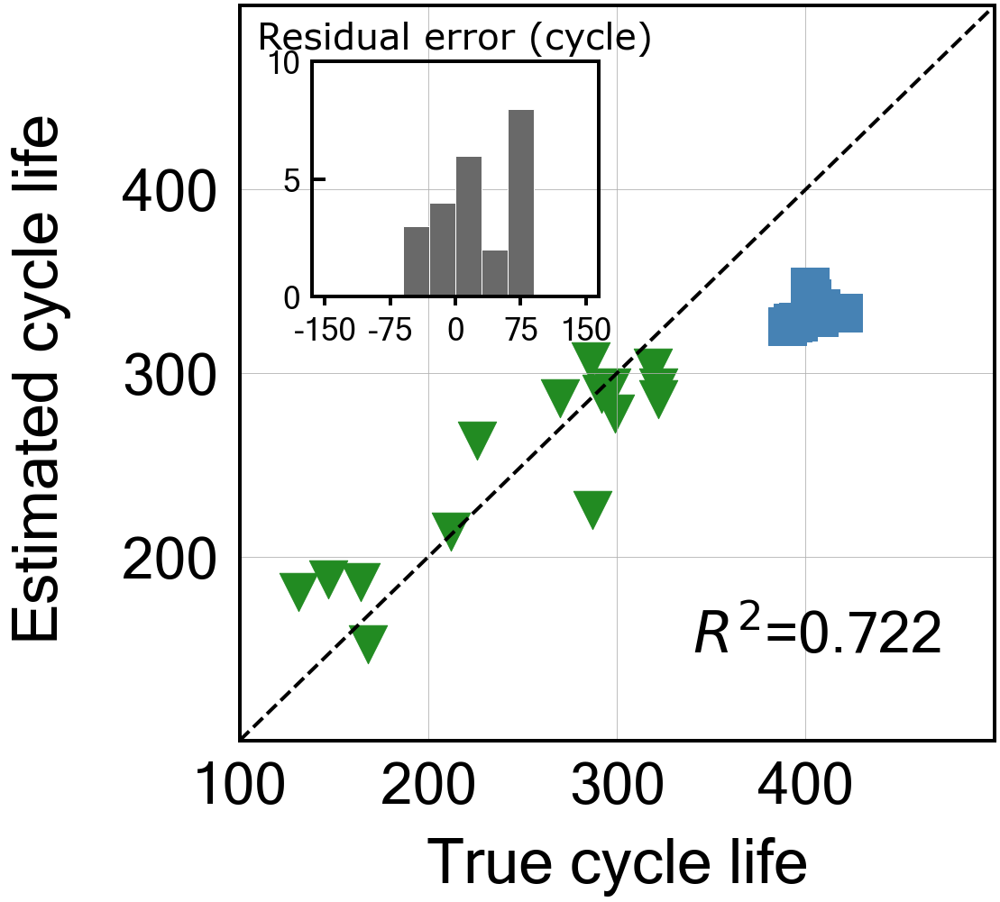


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -53.265013667589514
Cycle no: Average_2to4
Coefficient:
T_V('Charge', 'Variance', 'Average_2to4') : -0.0
T_V('Charge', 'Mean', 'Average_2to4') : 0.0
T_V('Charge', 'Skewness', 'Average_2to4') : 0.2649569200600525
dTdV('Charge', 'Maximum', 'Average_2to4') : -0.0
dTdV('Charge', 'Mean', 'Average_2to4') : 0.0
dTdV('Charge', 'Kurtosis', 'Average_2to4') : -0.0

Intercept: 0.6202443280977313
MAE_all: 39.0
MAPE_all: 13.2 %
RMSE_all: 46.4
RMSPE_all: 16.1 %
MAE_train: 24.9
MAPE_train: 11.6 %
RMSE_train: 31.0
RMSPE_train: 16.0 %
MAE_test: 65.4
MAPE_test: 16.2 %
RMSE_test: 66.2
RMSPE_test: 16.4 %
R2 normal-scale scores
All data r2-score: 0.737
Train data r2-score: 0.781
Test data r2-score: -53.265

Normal-scale scores
All data score: 0.737
Train data score: 0.781
Test data score: -53.265


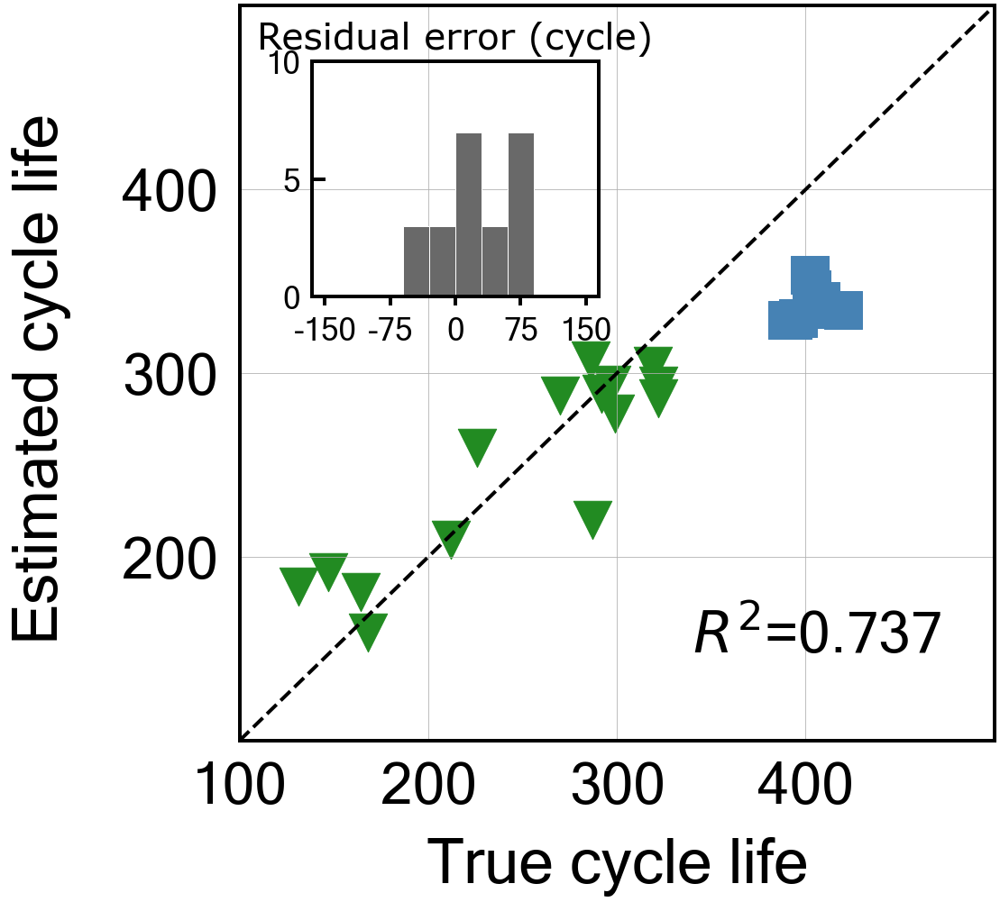


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -54.978722401432336
Cycle no: Average_2to5
Coefficient:
T_V('Charge', 'Variance', 'Average_2to5') : -0.0
T_V('Charge', 'Mean', 'Average_2to5') : 0.011650824842854254
T_V('Charge', 'Skewness', 'Average_2to5') : 0.25721033486095485
dTdV('Charge', 'Maximum', 'Average_2to5') : -0.0
dTdV('Charge', 'Mean', 'Average_2to5') : 0.0
dTdV('Charge', 'Kurtosis', 'Average_2to5') : -0.0

Intercept: 0.6202443280977314
MAE_all: 38.8
MAPE_all: 13.0 %
RMSE_all: 47.2
RMSPE_all: 16.4 %
MAE_train: 24.1
MAPE_train: 11.2 %
RMSE_train: 31.7
RMSPE_train: 16.3 %
MAE_test: 66.4
MAPE_test: 16.5 %
RMSE_test: 67.2
RMSPE_test: 16.6 %
R2 normal-scale scores
All data r2-score: 0.728
Train data r2-score: 0.770
Test data r2-score: -54.979

Normal-scale scores
All data score: 0.728
Train data score: 0.770
Test data score: -54.979


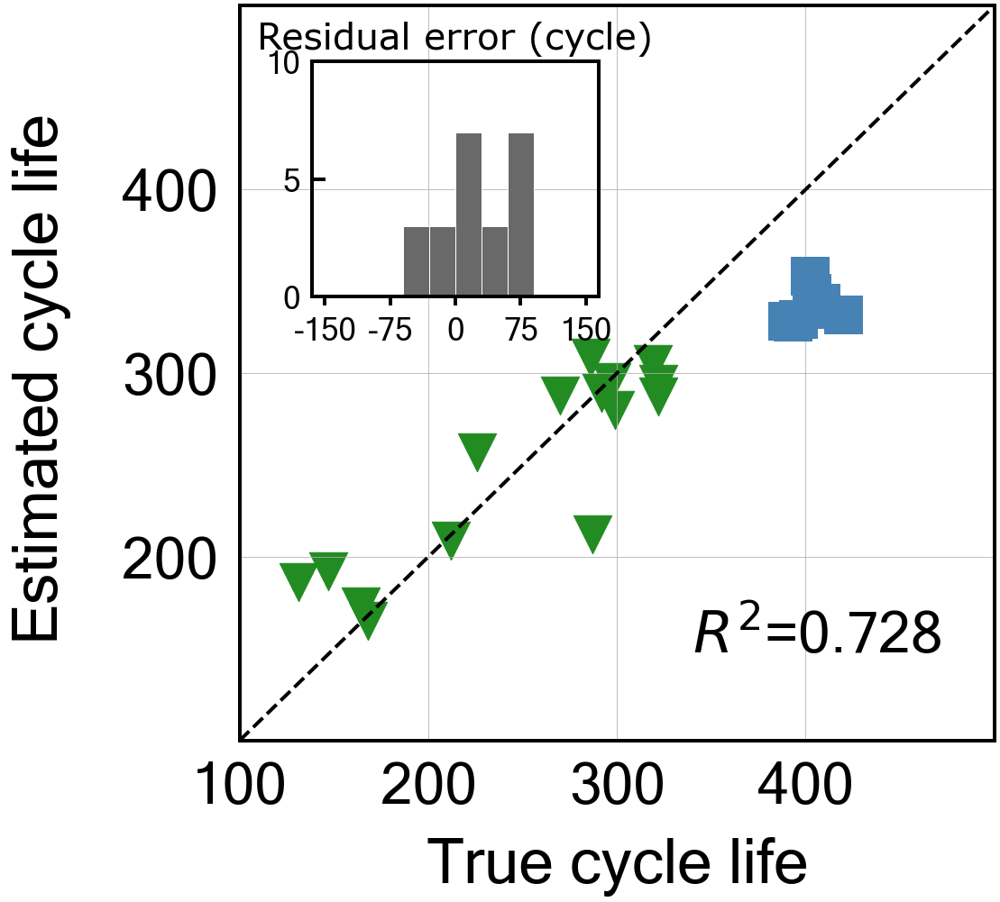


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -46.25550694726649
Cycle no: Average_2to6
Coefficient:
T_V('Charge', 'Variance', 'Average_2to6') : -0.0
T_V('Charge', 'Mean', 'Average_2to6') : 0.0
T_V('Charge', 'Skewness', 'Average_2to6') : 0.26809744625343224
dTdV('Charge', 'Maximum', 'Average_2to6') : -0.0
dTdV('Charge', 'Mean', 'Average_2to6') : 0.0
dTdV('Charge', 'Kurtosis', 'Average_2to6') : -0.0

Intercept: 0.6202443280977313
MAE_all: 36.4
MAPE_all: 12.3 %
RMSE_all: 44.3
RMSPE_all: 15.7 %
MAE_train: 23.3
MAPE_train: 10.8 %
RMSE_train: 31.2
RMSPE_train: 16.0 %
MAE_test: 60.9
MAPE_test: 15.1 %
RMSE_test: 61.8
RMSPE_test: 15.3 %
R2 normal-scale scores
All data r2-score: 0.760
Train data r2-score: 0.778
Test data r2-score: -46.256

Normal-scale scores
All data score: 0.760
Train data score: 0.778
Test data score: -46.256


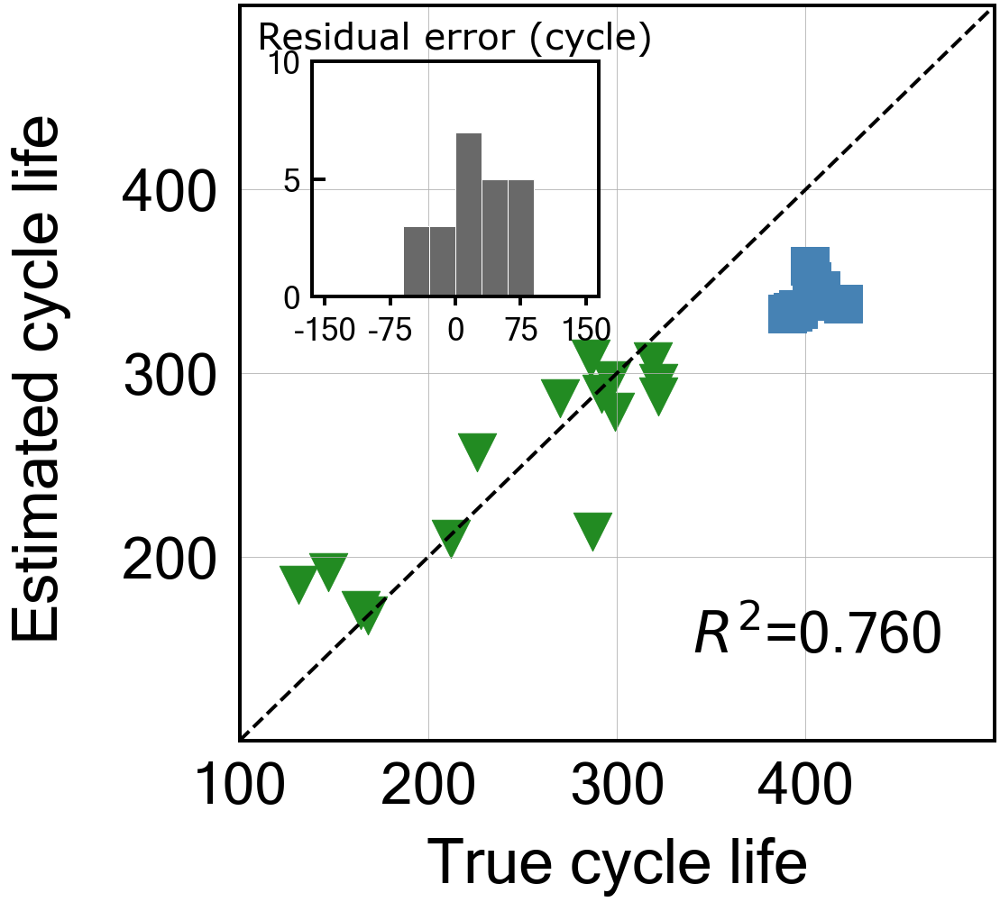


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -47.66170618864152
Cycle no: Average_2to7
Coefficient:
T_V('Charge', 'Variance', 'Average_2to7') : -0.0
T_V('Charge', 'Mean', 'Average_2to7') : 0.0
T_V('Charge', 'Skewness', 'Average_2to7') : 0.26194137706993836
dTdV('Charge', 'Maximum', 'Average_2to7') : -0.0
dTdV('Charge', 'Mean', 'Average_2to7') : 0.0
dTdV('Charge', 'Kurtosis', 'Average_2to7') : -0.0

Intercept: 0.6202443280977313
MAE_all: 37.2
MAPE_all: 12.6 %
RMSE_all: 45.2
RMSPE_all: 16.2 %
MAE_train: 24.1
MAPE_train: 11.2 %
RMSE_train: 32.2
RMSPE_train: 16.6 %
MAE_test: 61.8
MAPE_test: 15.3 %
RMSE_test: 62.7
RMSPE_test: 15.5 %
R2 normal-scale scores
All data r2-score: 0.750
Train data r2-score: 0.763
Test data r2-score: -47.662

Normal-scale scores
All data score: 0.750
Train data score: 0.763
Test data score: -47.662


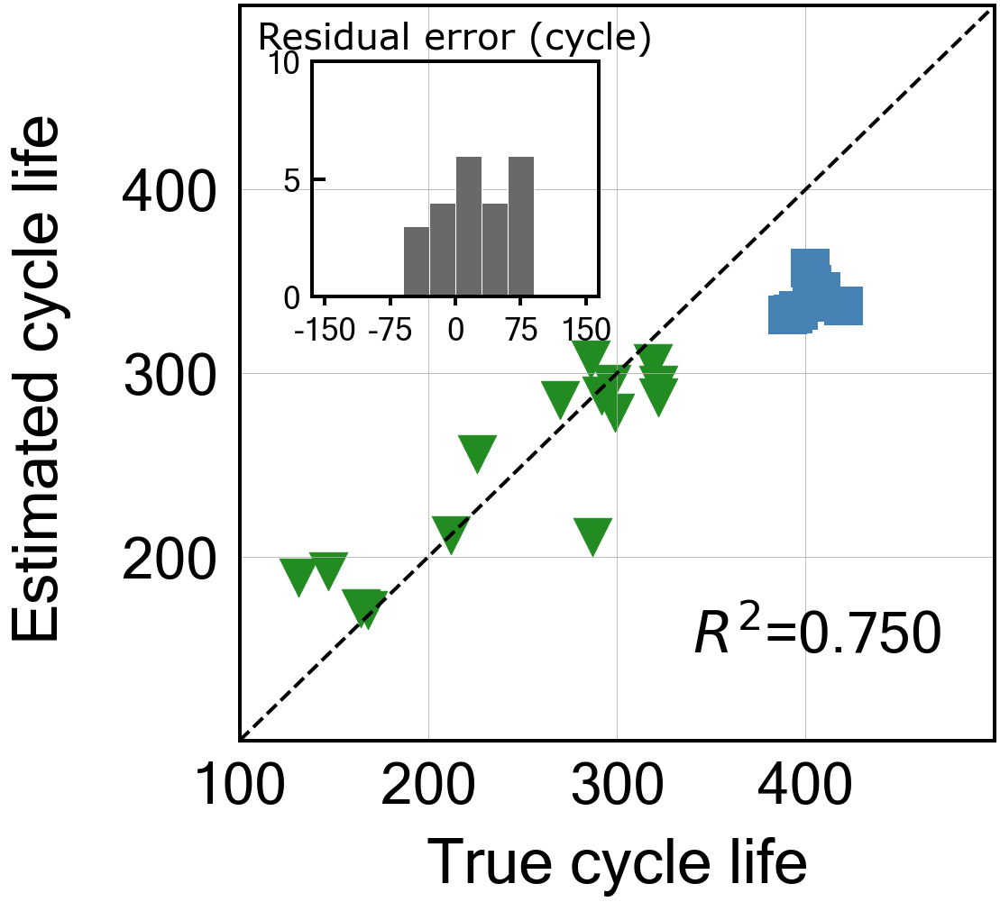


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.0
Best score obtained was: -44.84885825853923
Cycle no: Average_2to8
Coefficient:
T_V('Charge', 'Variance', 'Average_2to8') : -0.0
T_V('Charge', 'Mean', 'Average_2to8') : 0.0
T_V('Charge', 'Skewness', 'Average_2to8') : 0.26216251270573704
dTdV('Charge', 'Maximum', 'Average_2to8') : -0.0
dTdV('Charge', 'Mean', 'Average_2to8') : 0.0
dTdV('Charge', 'Kurtosis', 'Average_2to8') : 0.0

Intercept: 0.6202443280977314
MAE_all: 36.6
MAPE_all: 12.5 %
RMSE_all: 44.3
RMSPE_all: 16.0 %
MAE_train: 24.2
MAPE_train: 11.2 %
RMSE_train: 32.1
RMSPE_train: 16.5 %
MAE_test: 59.9
MAPE_test: 14.9 %
RMSE_test: 60.8
RMSPE_test: 15.1 %
R2 normal-scale scores
All data r2-score: 0.760
Train data r2-score: 0.764
Test data r2-score: -44.849

Normal-scale scores
All data score: 0.760
Train data score: 0.764
Test data score: -44.849


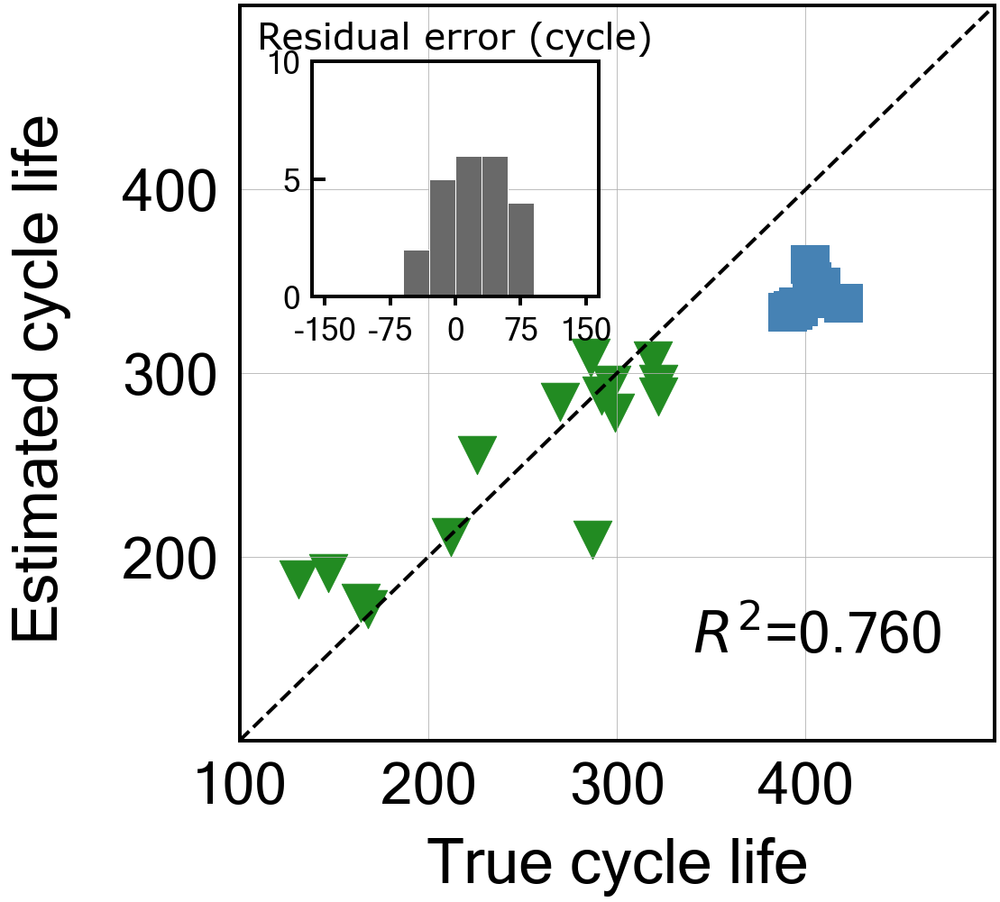


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -43.474111909059886
Cycle no: Average_2to9
Coefficient:
T_V('Charge', 'Variance', 'Average_2to9') : -0.0
T_V('Charge', 'Mean', 'Average_2to9') : 0.0
T_V('Charge', 'Skewness', 'Average_2to9') : 0.26099387679791947
dTdV('Charge', 'Maximum', 'Average_2to9') : -0.0
dTdV('Charge', 'Mean', 'Average_2to9') : 0.0
dTdV('Charge', 'Kurtosis', 'Average_2to9') : -0.0

Intercept: 0.6202443280977313
MAE_all: 36.5
MAPE_all: 12.5 %
RMSE_all: 44.0
RMSPE_all: 16.0 %
MAE_train: 24.6
MAPE_train: 11.4 %
RMSE_train: 32.5
RMSPE_train: 16.6 %
MAE_test: 58.9
MAPE_test: 14.6 %
RMSE_test: 59.9
RMSPE_test: 14.8 %
R2 normal-scale scores
All data r2-score: 0.763
Train data r2-score: 0.757
Test data r2-score: -43.474

Normal-scale scores
All data score: 0.763
Train data score: 0.757
Test data score: -43.474


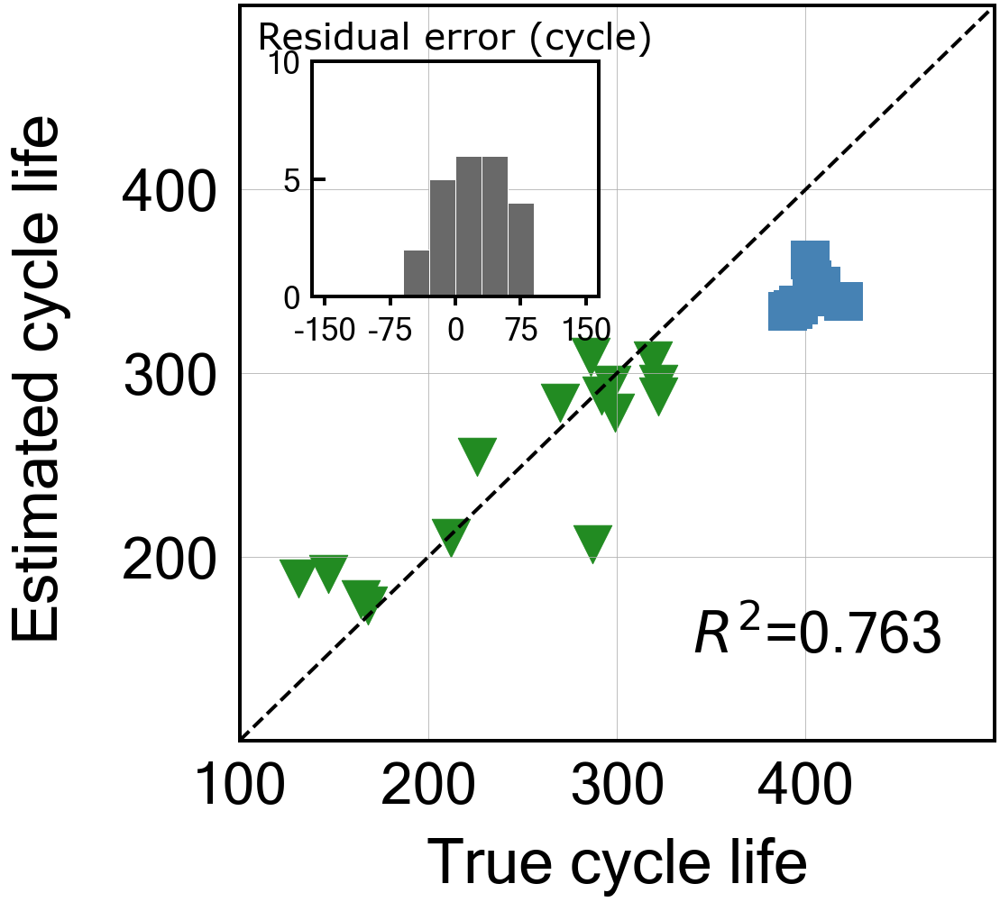


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -7.337872247981526
Cycle no: Average_2to10
Coefficient:
T_V('Charge', 'Variance', 'Average_2to10') : -0.07761263577281792
T_V('Charge', 'Mean', 'Average_2to10') : 0.16592929565162987
T_V('Charge', 'Skewness', 'Average_2to10') : 0.21932637150455297
dTdV('Charge', 'Maximum', 'Average_2to10') : 0.0343446667207337
dTdV('Charge', 'Mean', 'Average_2to10') : 0.008913976284033892
dTdV('Charge', 'Kurtosis', 'Average_2to10') : 0.10351890905187502

Intercept: 0.6202443280977306
MAE_all: 19.2
MAPE_all: 7.3 %
RMSE_all: 25.9
RMSPE_all: 10.8 %
MAE_train: 18.4
MAPE_train: 8.4 %
RMSE_train: 25.9
RMSPE_train: 12.6 %
MAE_test: 20.9
MAPE_test: 5.1 %
RMSE_test: 25.9
RMSPE_test: 6.4 %
R2 normal-scale scores
All data r2-score: 0.918
Train data r2-score: 0.846
Test data r2-score: -7.338

Normal-scale scores
All data score: 0.918
Train data score: 

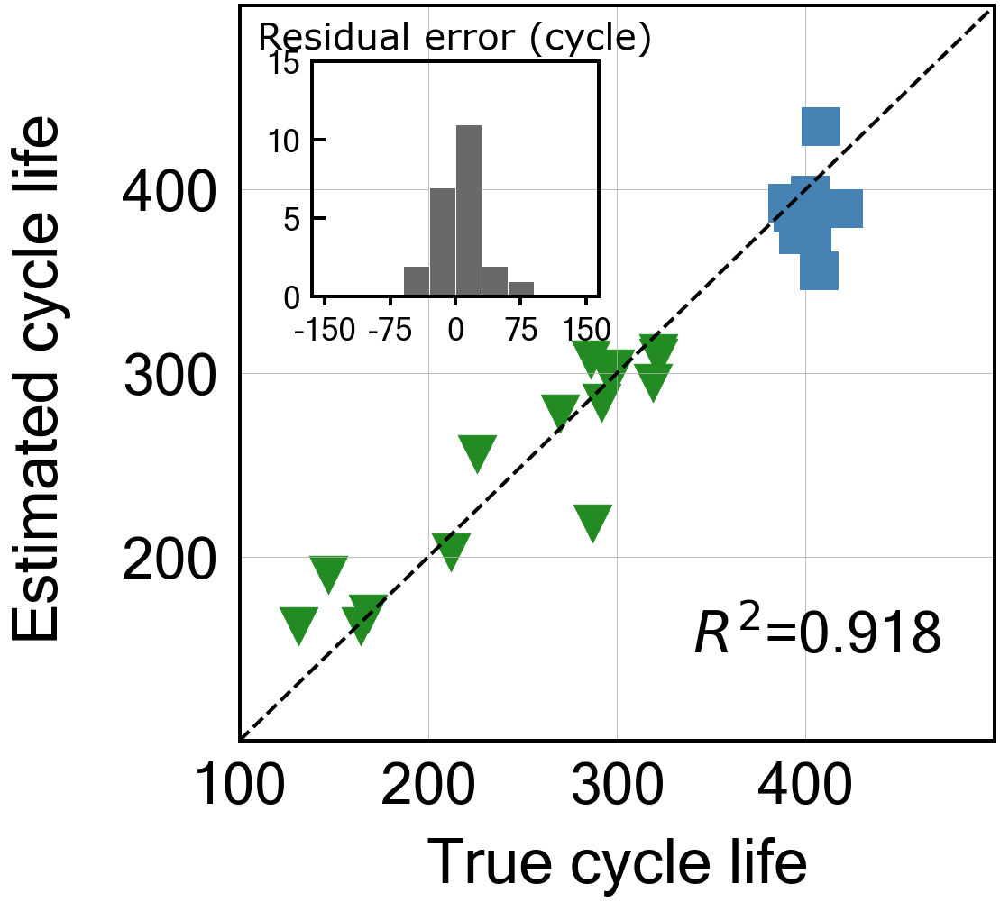


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -5.879715631418228
Cycle no: Average_2to11
Coefficient:
T_V('Charge', 'Variance', 'Average_2to11') : -0.06828259821979117
T_V('Charge', 'Mean', 'Average_2to11') : 0.17493243068846773
T_V('Charge', 'Skewness', 'Average_2to11') : 0.23479711445123436
dTdV('Charge', 'Maximum', 'Average_2to11') : 0.0008270011992240627
dTdV('Charge', 'Mean', 'Average_2to11') : 0.01295765688915821
dTdV('Charge', 'Kurtosis', 'Average_2to11') : 0.12929952928789068

Intercept: 0.6202443280977311
MAE_all: 17.6
MAPE_all: 6.8 %
RMSE_all: 24.3
RMSPE_all: 10.4 %
MAE_train: 16.8
MAPE_train: 7.8 %
RMSE_train: 24.7
RMSPE_train: 12.1 %
MAE_test: 19.1
MAPE_test: 4.8 %
RMSE_test: 23.6
RMSPE_test: 5.9 %
R2 normal-scale scores
All data r2-score: 0.928
Train data r2-score: 0.860
Test data r2-score: -5.880

Normal-scale scores
All data score: 0.928
Train data score

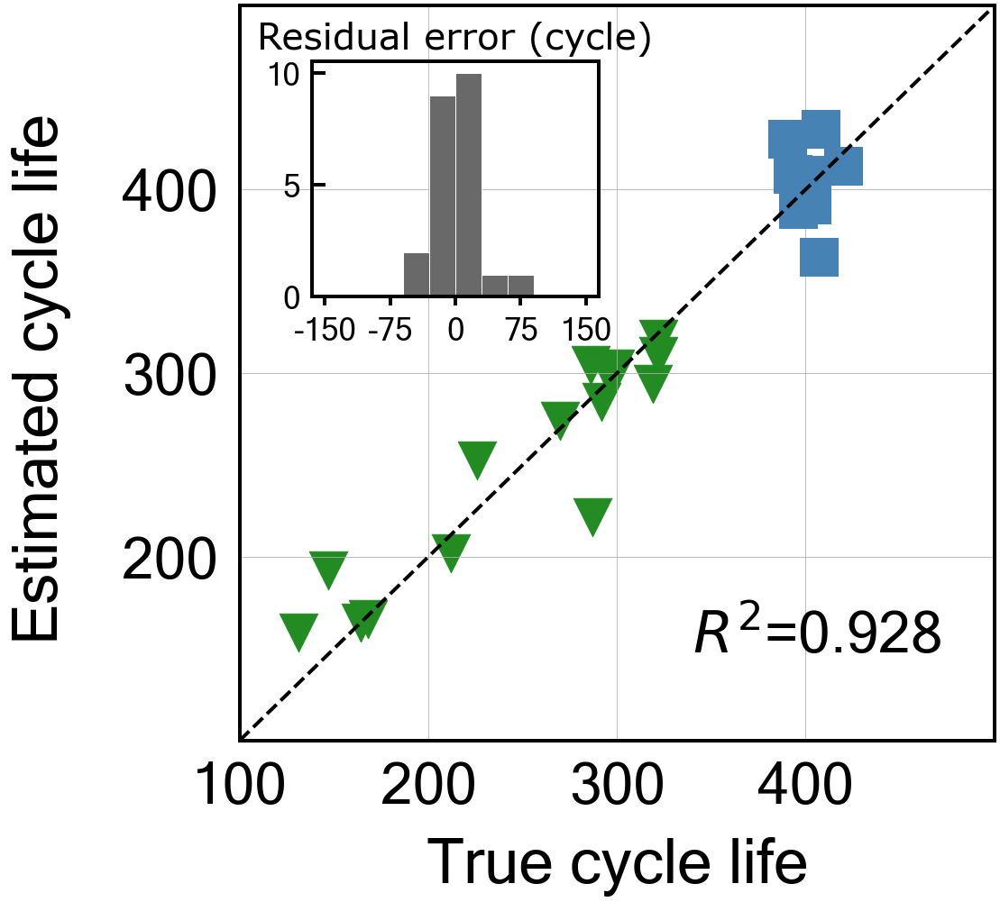


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -22.811478460332957
Cycle no: Average_2to12
Coefficient:
T_V('Charge', 'Variance', 'Average_2to12') : -0.06944689208891403
T_V('Charge', 'Mean', 'Average_2to12') : 0.17286800401129346
T_V('Charge', 'Skewness', 'Average_2to12') : 0.24992923759343638
dTdV('Charge', 'Maximum', 'Average_2to12') : -0.02336379953370596
dTdV('Charge', 'Mean', 'Average_2to12') : 0.016284242029632683
dTdV('Charge', 'Kurtosis', 'Average_2to12') : 0.1522569490873892

Intercept: 0.6202443280977313
MAE_all: 22.2
MAPE_all: 7.6 %
RMSE_all: 31.0
RMSPE_all: 10.4 %
MAE_train: 14.5
MAPE_train: 6.8 %
RMSE_train: 21.2
RMSPE_train: 10.0 %
MAE_test: 36.6
MAPE_test: 9.2 %
RMSE_test: 43.8
RMSPE_test: 11.0 %
R2 normal-scale scores
All data r2-score: 0.882
Train data r2-score: 0.897
Test data r2-score: -22.811

Normal-scale scores
All data score: 0.882
Train data sco

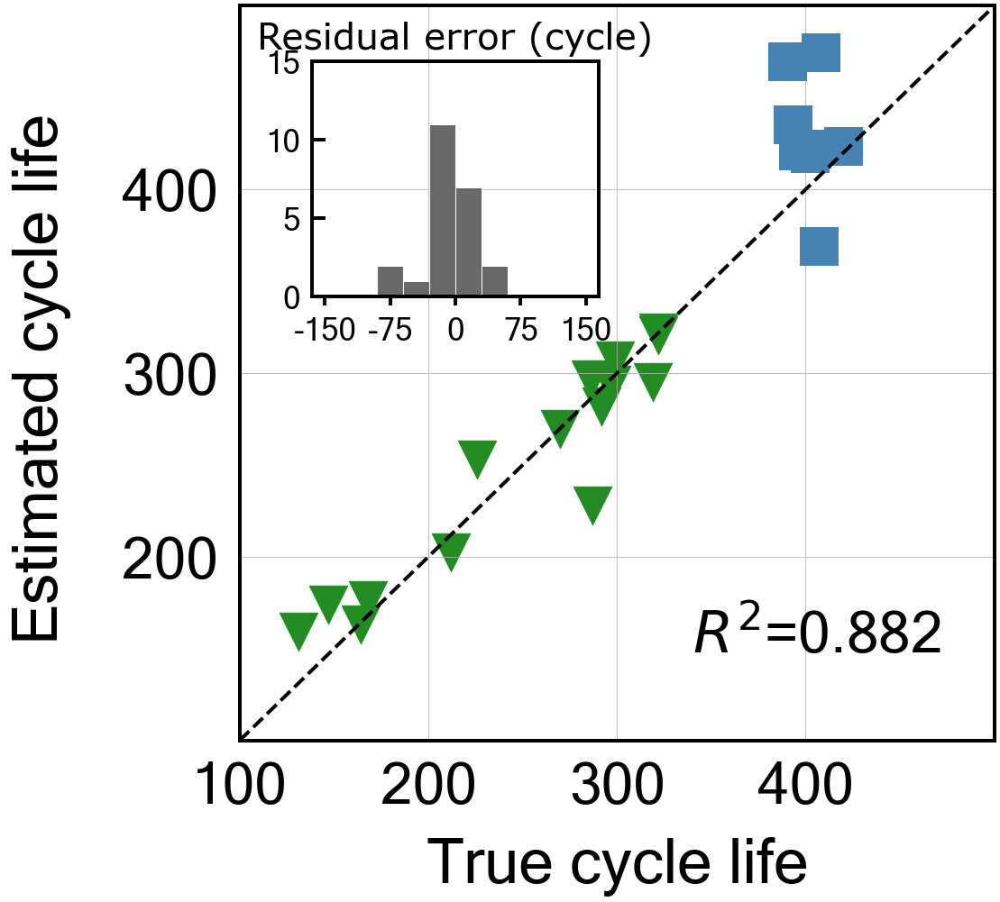


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -18.67894670016677
Cycle no: Average_2to13
Coefficient:
T_V('Charge', 'Variance', 'Average_2to13') : -0.05601576538752995
T_V('Charge', 'Mean', 'Average_2to13') : 0.14991869120230608
T_V('Charge', 'Skewness', 'Average_2to13') : 0.25246263879260056
dTdV('Charge', 'Maximum', 'Average_2to13') : -0.027060030237377526
dTdV('Charge', 'Mean', 'Average_2to13') : 0.011980436240359233
dTdV('Charge', 'Kurtosis', 'Average_2to13') : 0.13725563447027417

Intercept: 0.6202443280977322
MAE_all: 21.4
MAPE_all: 7.5 %
RMSE_all: 29.3
RMSPE_all: 10.4 %
MAE_train: 15.2
MAPE_train: 7.1 %
RMSE_train: 21.6
RMSPE_train: 10.5 %
MAE_test: 33.1
MAPE_test: 8.3 %
RMSE_test: 39.9
RMSPE_test: 10.0 %
R2 normal-scale scores
All data r2-score: 0.895
Train data r2-score: 0.893
Test data r2-score: -18.679

Normal-scale scores
All data score: 0.895
Train data sc

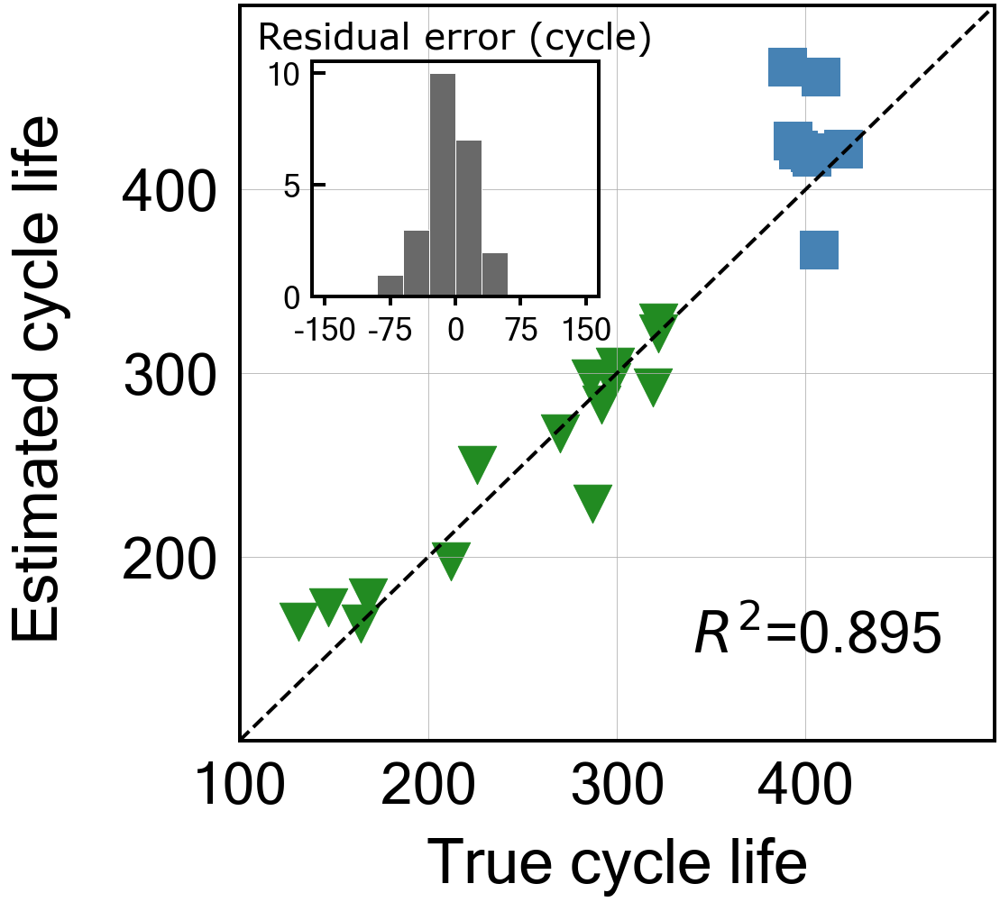


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.7
Best score obtained was: -41.2334776403095
Cycle no: Average_2to14
Coefficient:
T_V('Charge', 'Variance', 'Average_2to14') : -0.05966742863937934
T_V('Charge', 'Mean', 'Average_2to14') : 0.15161632521350227
T_V('Charge', 'Skewness', 'Average_2to14') : 0.2704167785387687
dTdV('Charge', 'Maximum', 'Average_2to14') : -0.029156607659529307
dTdV('Charge', 'Mean', 'Average_2to14') : 0.001357650619513803
dTdV('Charge', 'Kurtosis', 'Average_2to14') : 0.14697926087432678

Intercept: 0.6202443280977313
MAE_all: 28.2
MAPE_all: 9.2 %
RMSE_all: 38.5
RMSPE_all: 12.2 %
MAE_train: 15.2
MAPE_train: 7.2 %
RMSE_train: 21.4
RMSPE_train: 10.6 %
MAE_test: 52.5
MAPE_test: 13.1 %
RMSE_test: 58.4
RMSPE_test: 14.7 %
R2 normal-scale scores
All data r2-score: 0.818
Train data r2-score: 0.895
Test data r2-score: -41.233

Normal-scale scores
All data score: 0.818
Train data sco

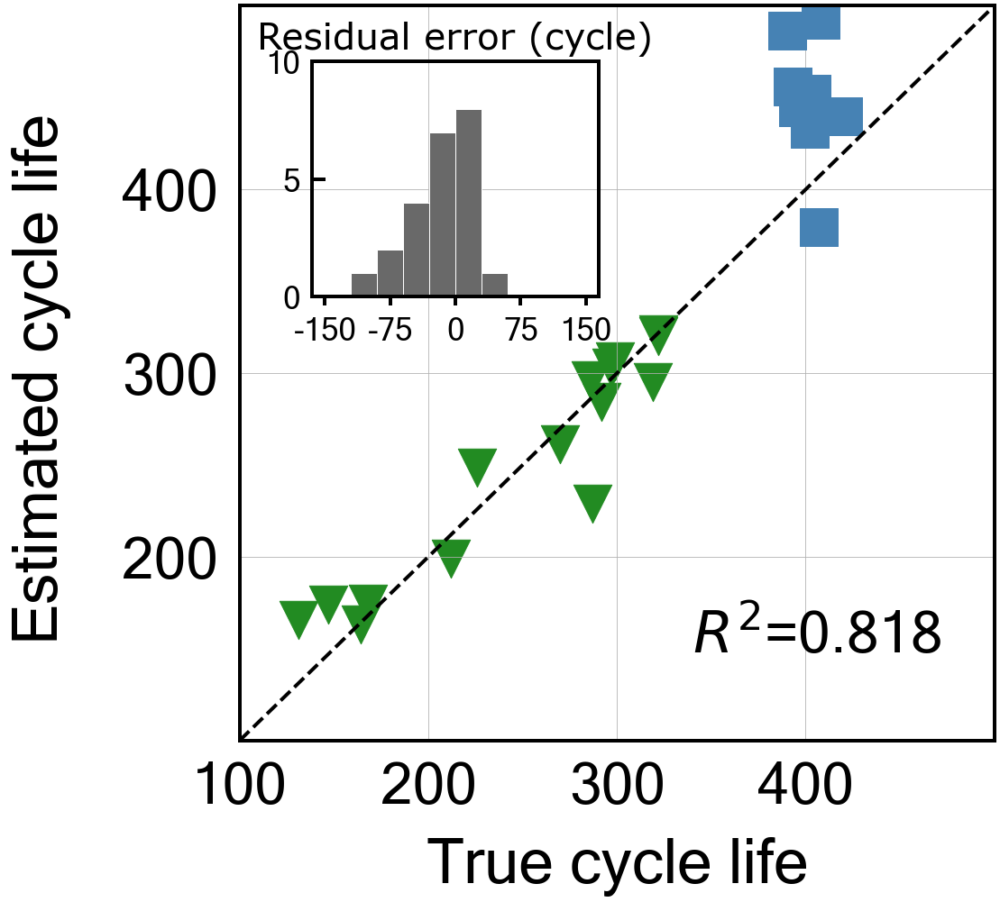


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.9
Best score obtained was: -74.04921772659952
Cycle no: Average_2to15
Coefficient:
T_V('Charge', 'Variance', 'Average_2to15') : -0.06520477473552413
T_V('Charge', 'Mean', 'Average_2to15') : 0.061058699118846115
T_V('Charge', 'Skewness', 'Average_2to15') : 0.3434157516274504
dTdV('Charge', 'Maximum', 'Average_2to15') : -0.009209925523311575
dTdV('Charge', 'Mean', 'Average_2to15') : 0.0
dTdV('Charge', 'Kurtosis', 'Average_2to15') : 0.12139610270356226

Intercept: 0.6202443280977313
MAE_all: 33.9
MAPE_all: 10.6 %
RMSE_all: 49.6
RMSPE_all: 14.4 %
MAE_train: 14.1
MAPE_train: 6.8 %
RMSE_train: 23.3
RMSPE_train: 10.9 %
MAE_test: 71.1
MAPE_test: 17.7 %
RMSE_test: 77.8
RMSPE_test: 19.4 %
R2 normal-scale scores
All data r2-score: 0.699
Train data r2-score: 0.876
Test data r2-score: -74.049

Normal-scale scores
All data score: 0.699
Train data score: 0.876
Test

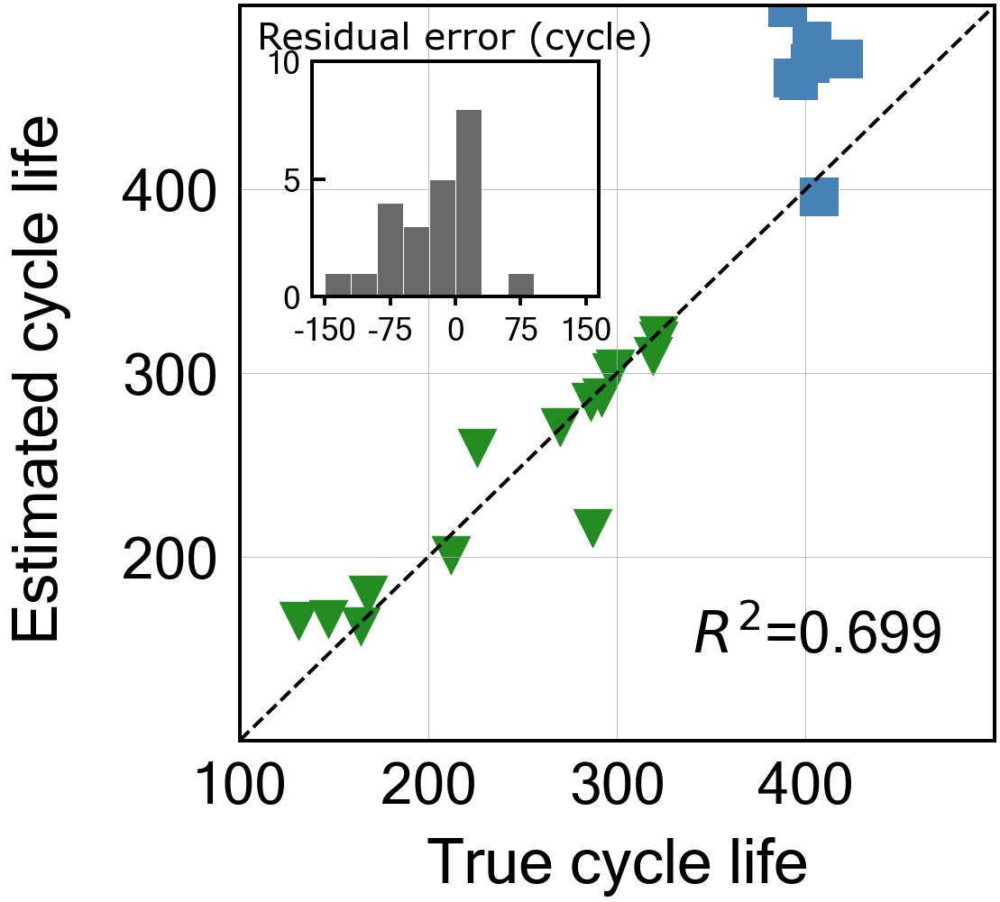


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -218.35152459709514
Cycle no: Average_2to16
Coefficient:
T_V('Charge', 'Variance', 'Average_2to16') : -0.0879688803500042
T_V('Charge', 'Mean', 'Average_2to16') : 0.08144979544160749
T_V('Charge', 'Skewness', 'Average_2to16') : 0.3939226013151843
dTdV('Charge', 'Maximum', 'Average_2to16') : -0.002166020724508161
dTdV('Charge', 'Mean', 'Average_2to16') : 0.0
dTdV('Charge', 'Kurtosis', 'Average_2to16') : 0.17230480809345866

Intercept: 0.6202443280977317
MAE_all: 53.0
MAPE_all: 15.4 %
RMSE_all: 80.6
RMSPE_all: 21.3 %
MAE_train: 15.0
MAPE_train: 7.1 %
RMSE_train: 22.7
RMSPE_train: 10.3 %
MAE_test: 124.2
MAPE_test: 31.0 %
RMSE_test: 133.1
RMSPE_test: 33.2 %
R2 normal-scale scores
All data r2-score: 0.206
Train data r2-score: 0.882
Test data r2-score: -218.352

Normal-scale scores
All data score: 0.206
Train data score: 0.882
Te

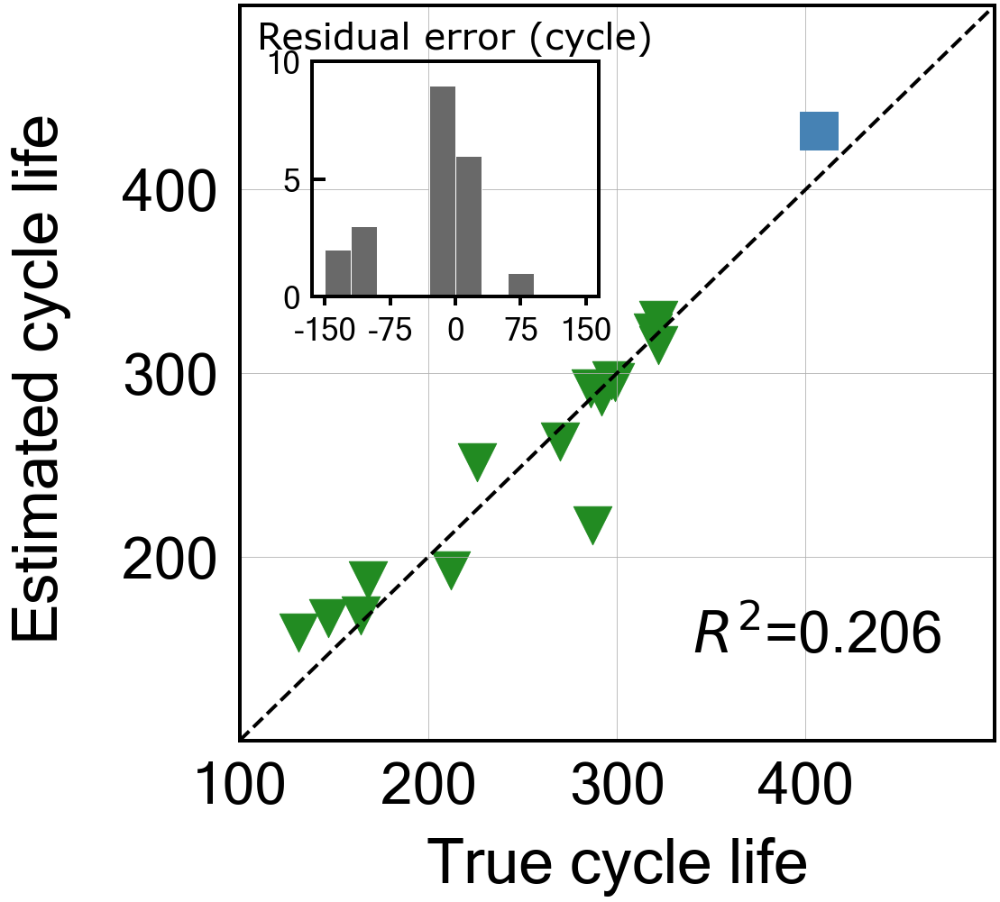


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.1
Best score obtained was: -96.35833929626635
Cycle no: Average_2to17
Coefficient:
T_V('Charge', 'Variance', 'Average_2to17') : -0.06999715915383267
T_V('Charge', 'Mean', 'Average_2to17') : 0.05365877407503538
T_V('Charge', 'Skewness', 'Average_2to17') : 0.36316835899087246
dTdV('Charge', 'Maximum', 'Average_2to17') : -0.011672624001386092
dTdV('Charge', 'Mean', 'Average_2to17') : 0.009576538635162753
dTdV('Charge', 'Kurtosis', 'Average_2to17') : 0.11325269917139093

Intercept: 0.6202443280977313
MAE_all: 40.3
MAPE_all: 12.7 %
RMSE_all: 56.5
RMSPE_all: 16.6 %
MAE_train: 17.6
MAPE_train: 8.4 %
RMSE_train: 26.5
RMSPE_train: 12.8 %
MAE_test: 83.0
MAPE_test: 20.7 %
RMSE_test: 88.7
RMSPE_test: 22.1 %
R2 normal-scale scores
All data r2-score: 0.610
Train data r2-score: 0.839
Test data r2-score: -96.358

Normal-scale scores
All data score: 0.610
Train data 

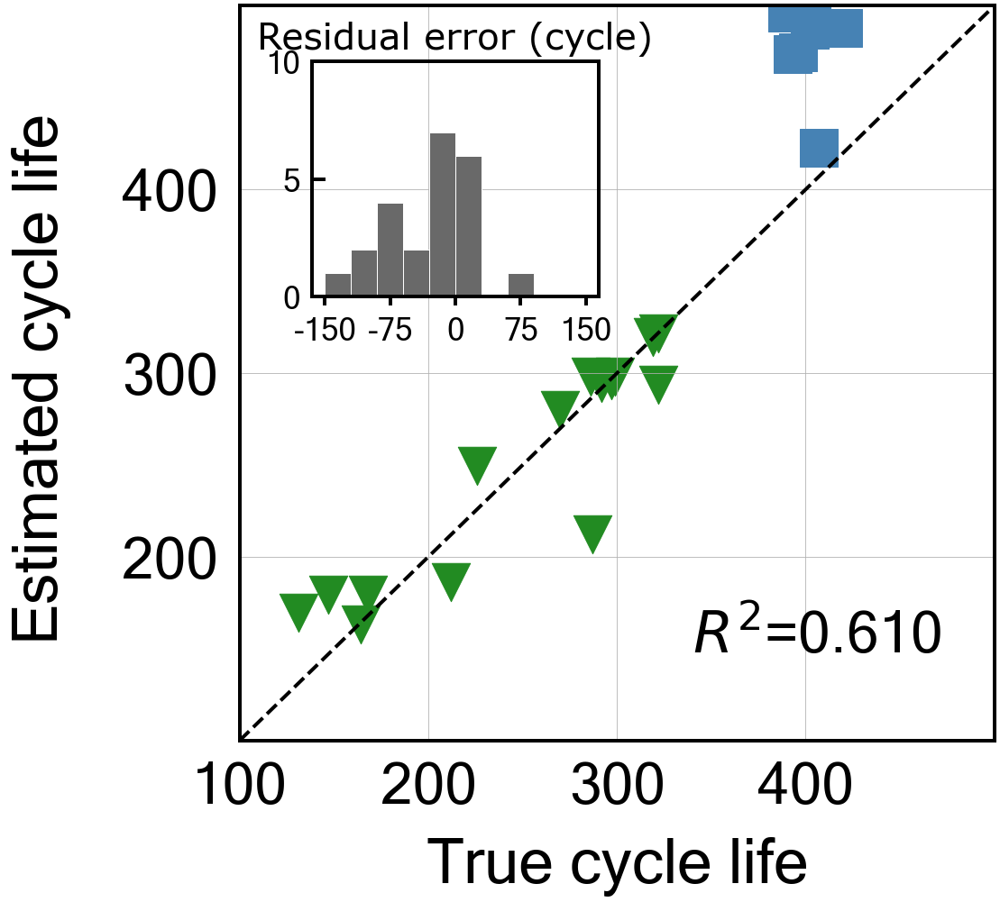


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.2
Best score obtained was: -13.683181736992257
Cycle no: Average_2to18
Coefficient:
T_V('Charge', 'Variance', 'Average_2to18') : -0.004596024916565441
T_V('Charge', 'Mean', 'Average_2to18') : 0.0
T_V('Charge', 'Skewness', 'Average_2to18') : 0.28850949751705307
dTdV('Charge', 'Maximum', 'Average_2to18') : -0.004073774581143078
dTdV('Charge', 'Mean', 'Average_2to18') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to18') : -0.0

Intercept: 0.6202443280977314
MAE_all: 25.8
MAPE_all: 9.5 %
RMSE_all: 32.1
RMSPE_all: 13.1 %
MAE_train: 22.3
MAPE_train: 10.2 %
RMSE_train: 30.8
RMSPE_train: 15.1 %
MAE_test: 32.5
MAPE_test: 8.1 %
RMSE_test: 34.4
RMSPE_test: 8.5 %
R2 normal-scale scores
All data r2-score: 0.874
Train data r2-score: 0.782
Test data r2-score: -13.683

Normal-scale scores
All data score: 0.874
Train data score: 0.782
Test data score: -13.683


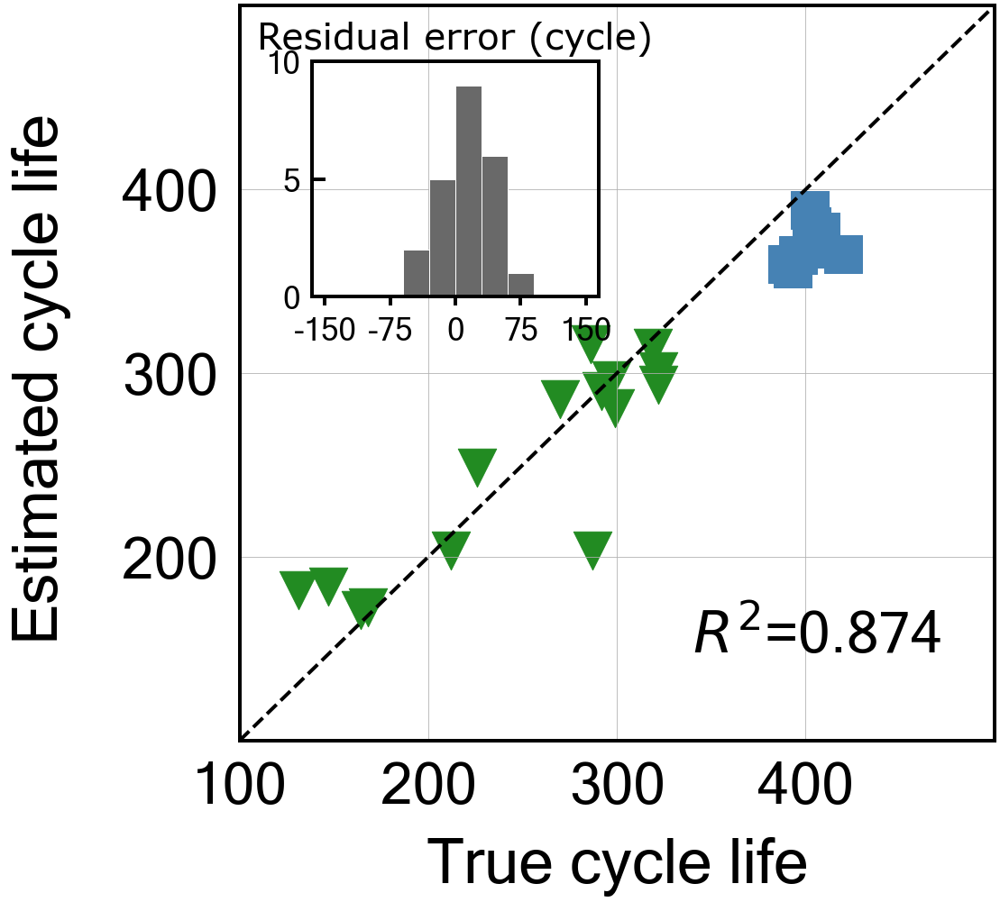


Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 7.9
Best score obtained was: -15.289134000437073
Cycle no: Average_2to19
Coefficient:
T_V('Charge', 'Variance', 'Average_2to19') : -0.0036291184553325162
T_V('Charge', 'Mean', 'Average_2to19') : 0.0
T_V('Charge', 'Skewness', 'Average_2to19') : 0.2860370226257472
dTdV('Charge', 'Maximum', 'Average_2to19') : -0.0034875639469028196
dTdV('Charge', 'Mean', 'Average_2to19') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to19') : 0.0

Intercept: 0.6202443280977311
MAE_all: 26.6
MAPE_all: 9.7 %
RMSE_all: 32.9
RMSPE_all: 13.3 %
MAE_train: 22.5
MAPE_train: 10.3 %
RMSE_train: 30.9
RMSPE_train: 15.1 %
MAE_test: 34.5
MAPE_test: 8.5 %
RMSE_test: 36.3
RMSPE_test: 8.9 %
R2 normal-scale scores
All data r2-score: 0.868
Train data r2-score: 0.781
Test data r2-score: -15.289

Normal-scale scores
All data score: 0.868
Train data score: 0.781
Test data score: -15.289


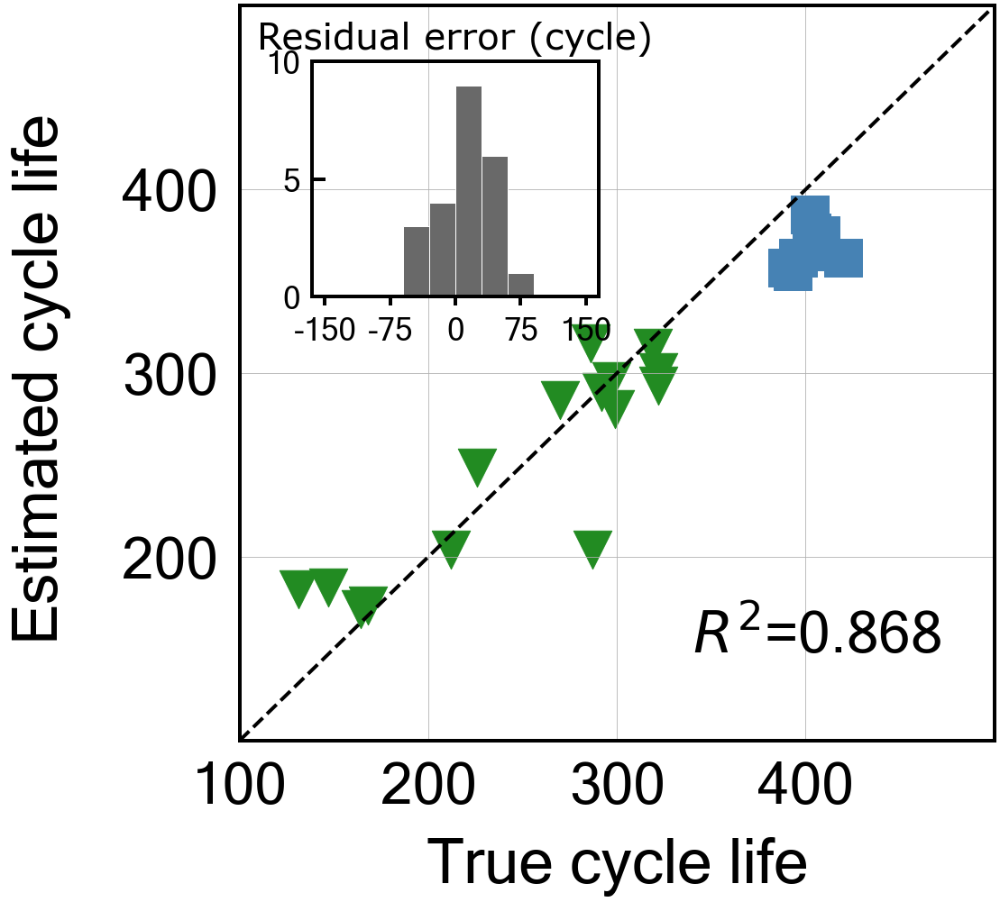

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to20')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.9
Best score obtained was: -13.164250189254425
Cycle no: Average_2to20
Coefficient:
T_V('Charge', 'Variance', 'Average_2to20') : -0.053137098065117794
T_V('Charge', 'Mean', 'Average_2to20') : 0.10774948183715587
T_V('Charge', 'Skewness', 'Average_2to20') : 0.2613490465233305
dTdV('Charge', 'Maximum', 'Average_2to20') : -0.012103980485251386
dTdV('Charge', 'Mean', 'Average_2to20') : 0.010693981846973313
dTdV('Charge', 'Kurtosis', 'Average_2to20') : 0.07445042437798297

Intercept: 0.6202443280977317
MAE_all: 23.5
MAPE_all: 8.8 %
RMSE_all: 30.5
RMSPE_all: 12.6 %
MAE_train: 19.4
MAPE_train: 9.3 %
RMSE_train: 28.5
RMSPE_train: 14.3 %
MAE_test: 31.3
MAPE_test: 7.8 %
RMSE_test: 33.8
RMSPE_test: 8.4 %
R2 normal-scale scores
All data r2-score: 0.887
Train data r2-score: 0.814
Test data r2-score: -1

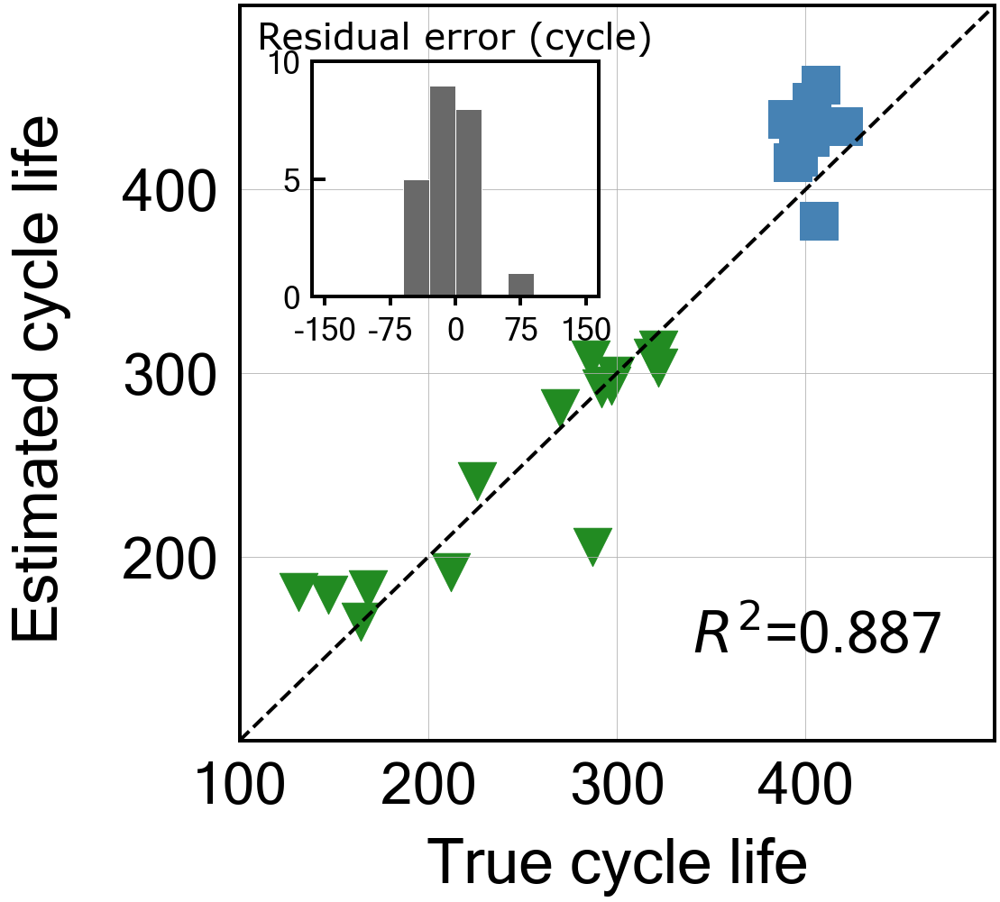

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to21')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 6.3
Best score obtained was: -26.778745611353308
Cycle no: Average_2to21
Coefficient:
T_V('Charge', 'Variance', 'Average_2to21') : -0.0
T_V('Charge', 'Mean', 'Average_2to21') : 0.0
T_V('Charge', 'Skewness', 'Average_2to21') : 0.2724307105722081
dTdV('Charge', 'Maximum', 'Average_2to21') : -0.0
dTdV('Charge', 'Mean', 'Average_2to21') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to21') : 0.0

Intercept: 0.6202443280977312
MAE_all: 31.6
MAPE_all: 11.2 %
RMSE_all: 37.9
RMSPE_all: 14.5 %
MAE_train: 23.9
MAPE_train: 11.1 %
RMSE_train: 31.7
RMSPE_train: 15.8 %
MAE_test: 46.0
MAPE_test: 11.4 %
RMSE_test: 47.4
RMSPE_test: 11.7 %
R2 normal-scale scores
All data r2-score: 0.824
Train data r2-score: 0.769
Test data r2-score: -26.779

Normal-scale scores
All data score: 0.824
Train data score: 0.769
Test 

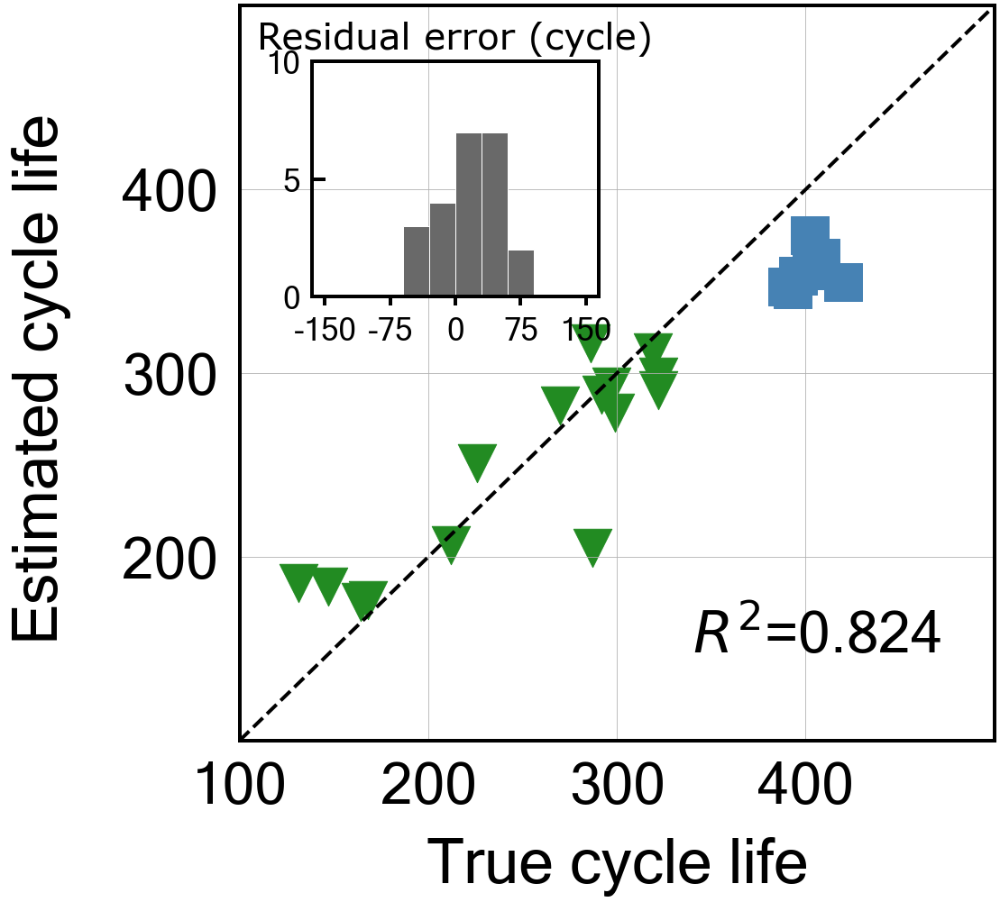

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to22')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.0
Best score obtained was: -28.490915634703327
Cycle no: Average_2to22
Coefficient:
T_V('Charge', 'Variance', 'Average_2to22') : -0.0
T_V('Charge', 'Mean', 'Average_2to22') : 0.0
T_V('Charge', 'Skewness', 'Average_2to22') : 0.2668922090666763
dTdV('Charge', 'Maximum', 'Average_2to22') : -0.0
dTdV('Charge', 'Mean', 'Average_2to22') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to22') : 0.0

Intercept: 0.6202443280977314
MAE_all: 32.5
MAPE_all: 11.5 %
RMSE_all: 38.7
RMSPE_all: 14.8 %
MAE_train: 24.5
MAPE_train: 11.3 %
RMSE_train: 32.0
RMSPE_train: 16.1 %
MAE_test: 47.5
MAPE_test: 11.8 %
RMSE_test: 48.8
RMSPE_test: 12.0 %
R2 normal-scale scores
All data r2-score: 0.817
Train data r2-score: 0.765
Test data r2-score: -28.491

Normal-scale scores
All data score: 0.817
Train data score: 0.765
Test 

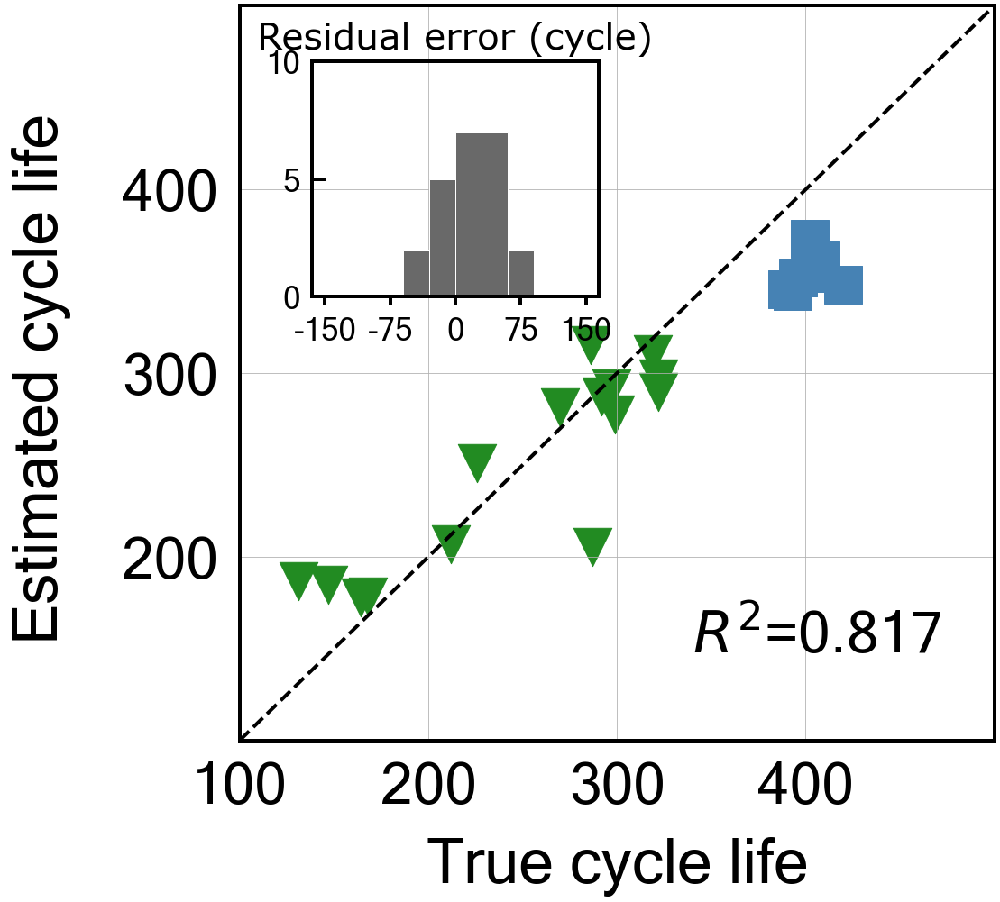

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to23')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.4
Best score obtained was: -25.915691478837953
Cycle no: Average_2to23
Coefficient:
T_V('Charge', 'Variance', 'Average_2to23') : -0.0
T_V('Charge', 'Mean', 'Average_2to23') : 0.0
T_V('Charge', 'Skewness', 'Average_2to23') : 0.27107710349358016
dTdV('Charge', 'Maximum', 'Average_2to23') : -0.0
dTdV('Charge', 'Mean', 'Average_2to23') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to23') : -0.0

Intercept: 0.6202443280977312
MAE_all: 31.5
MAPE_all: 11.2 %
RMSE_all: 37.7
RMSPE_all: 14.5 %
MAE_train: 24.2
MAPE_train: 11.2 %
RMSE_train: 32.0
RMSPE_train: 15.9 %
MAE_test: 45.2
MAPE_test: 11.2 %
RMSE_test: 46.6
RMSPE_test: 11.5 %
R2 normal-scale scores
All data r2-score: 0.826
Train data r2-score: 0.766
Test data r2-score: -25.916

Normal-scale scores
All data score: 0.826
Train data score: 0.766
Tes

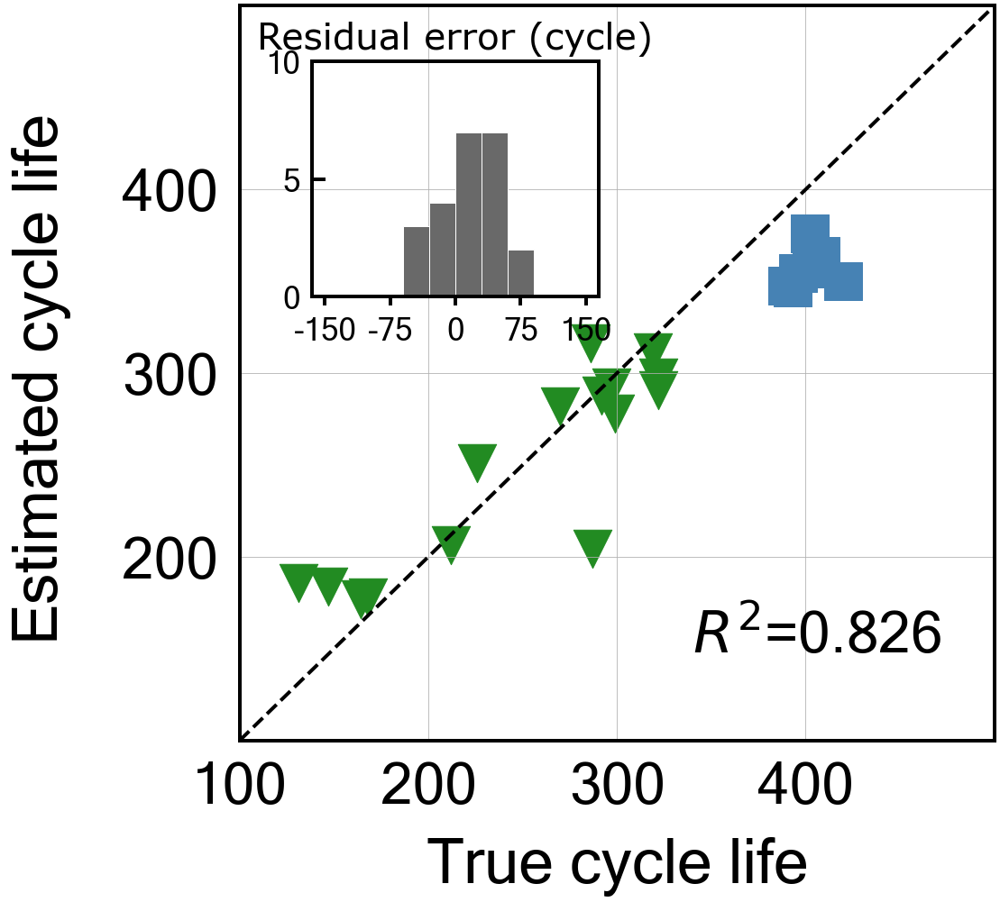

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to24')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.0
Best score obtained was: -27.815549615300476
Cycle no: Average_2to24
Coefficient:
T_V('Charge', 'Variance', 'Average_2to24') : -0.0
T_V('Charge', 'Mean', 'Average_2to24') : 0.0
T_V('Charge', 'Skewness', 'Average_2to24') : 0.26574289761585723
dTdV('Charge', 'Maximum', 'Average_2to24') : -0.0
dTdV('Charge', 'Mean', 'Average_2to24') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to24') : 0.0

Intercept: 0.6202443280977314
MAE_all: 32.4
MAPE_all: 11.5 %
RMSE_all: 38.5
RMSPE_all: 14.8 %
MAE_train: 24.7
MAPE_train: 11.5 %
RMSE_train: 32.2
RMSPE_train: 16.1 %
MAE_test: 46.9
MAPE_test: 11.6 %
RMSE_test: 48.2
RMSPE_test: 11.9 %
R2 normal-scale scores
All data r2-score: 0.819
Train data r2-score: 0.763
Test data r2-score: -27.816

Normal-scale scores
All data score: 0.819
Train data score: 0.763
Test

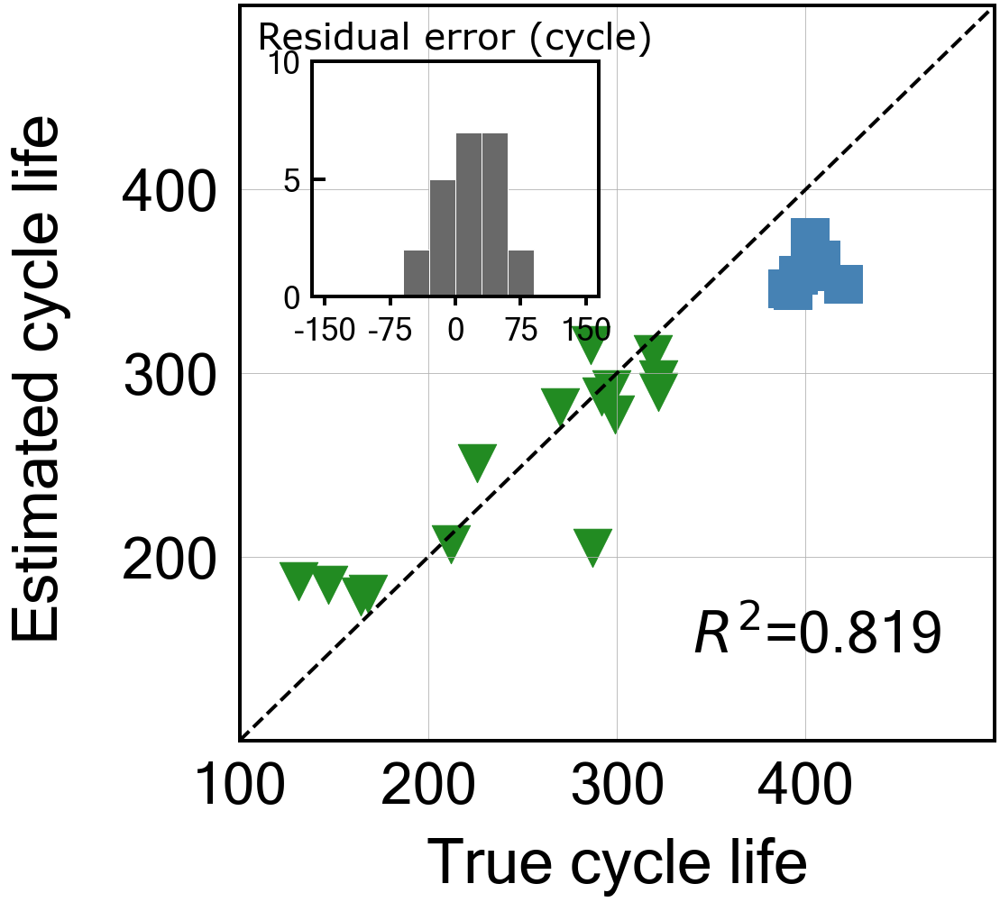

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to25')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.7
Best score obtained was: -2.879698518544839
Cycle no: Average_2to25
Coefficient:
T_V('Charge', 'Variance', 'Average_2to25') : -0.04360318665213229
T_V('Charge', 'Mean', 'Average_2to25') : 0.10453504996553656
T_V('Charge', 'Skewness', 'Average_2to25') : 0.22306541529676752
dTdV('Charge', 'Maximum', 'Average_2to25') : -0.026153010467842925
dTdV('Charge', 'Mean', 'Average_2to25') : 0.021193626132731846
dTdV('Charge', 'Kurtosis', 'Average_2to25') : 0.04909437599010477

Intercept: 0.620244328097731
MAE_all: 17.2
MAPE_all: 7.4 %
RMSE_all: 26.1
RMSPE_all: 12.5 %
MAE_train: 19.7
MAPE_train: 9.6 %
RMSE_train: 29.6
RMSPE_train: 15.2 %
MAE_test: 12.7
MAPE_test: 3.1 %
RMSE_test: 17.7
RMSPE_test: 4.4 %
R2 normal-scale scores
All data r2-score: 0.917
Train data r2-score: 0.799
Test data r2-score: -2.8

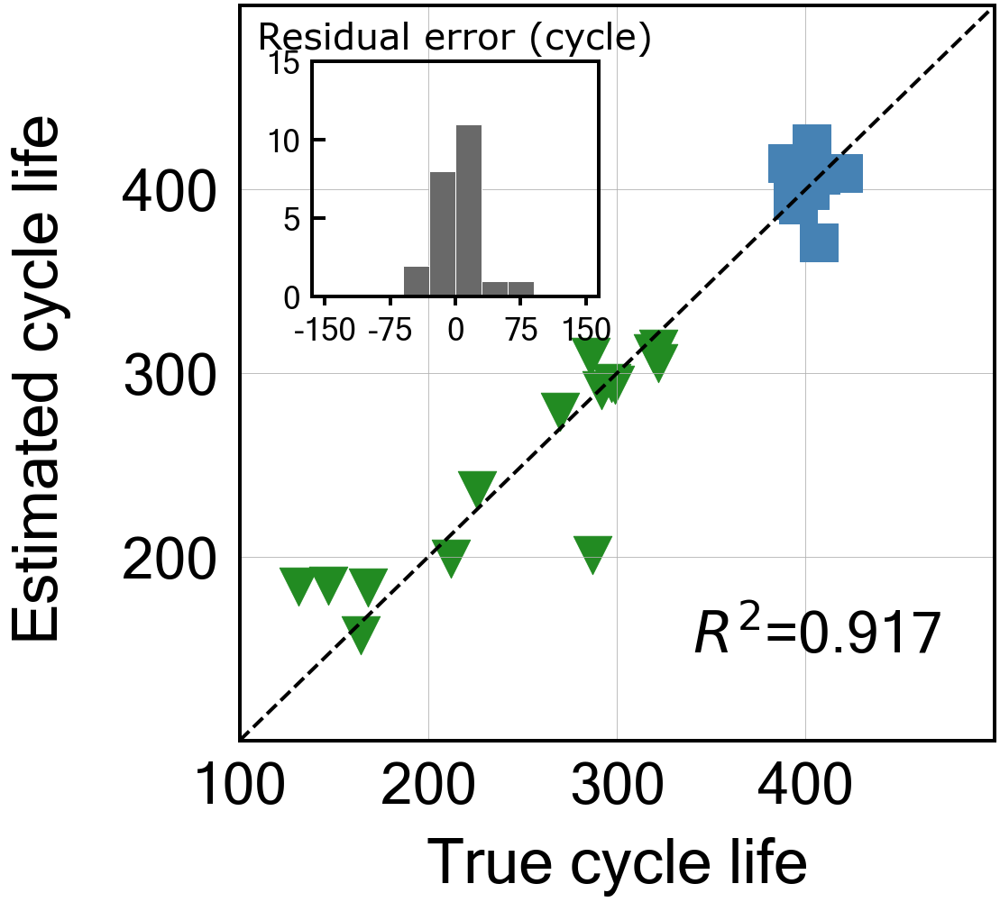

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to26')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.0
Best score obtained was: -18.15661642669215
Cycle no: Average_2to26
Coefficient:
T_V('Charge', 'Variance', 'Average_2to26') : -0.03154230938524611
T_V('Charge', 'Mean', 'Average_2to26') : 0.0038897391754371662
T_V('Charge', 'Skewness', 'Average_2to26') : 0.3228580077479858
dTdV('Charge', 'Maximum', 'Average_2to26') : -0.016405753466855518
dTdV('Charge', 'Mean', 'Average_2to26') : 0.0
dTdV('Charge', 'Kurtosis', 'Average_2to26') : 0.03310242151725531

Intercept: 0.6202443280977316
MAE_all: 26.0
MAPE_all: 9.5 %
RMSE_all: 33.2
RMSPE_all: 13.0 %
MAE_train: 20.5
MAPE_train: 9.7 %
RMSE_train: 29.4
RMSPE_train: 14.4 %
MAE_test: 36.5
MAPE_test: 9.1 %
RMSE_test: 39.3
RMSPE_test: 9.8 %
R2 normal-scale scores
All data r2-score: 0.865
Train data r2-score: 0.802
Test data r2-score: -18.157

Normal-sca

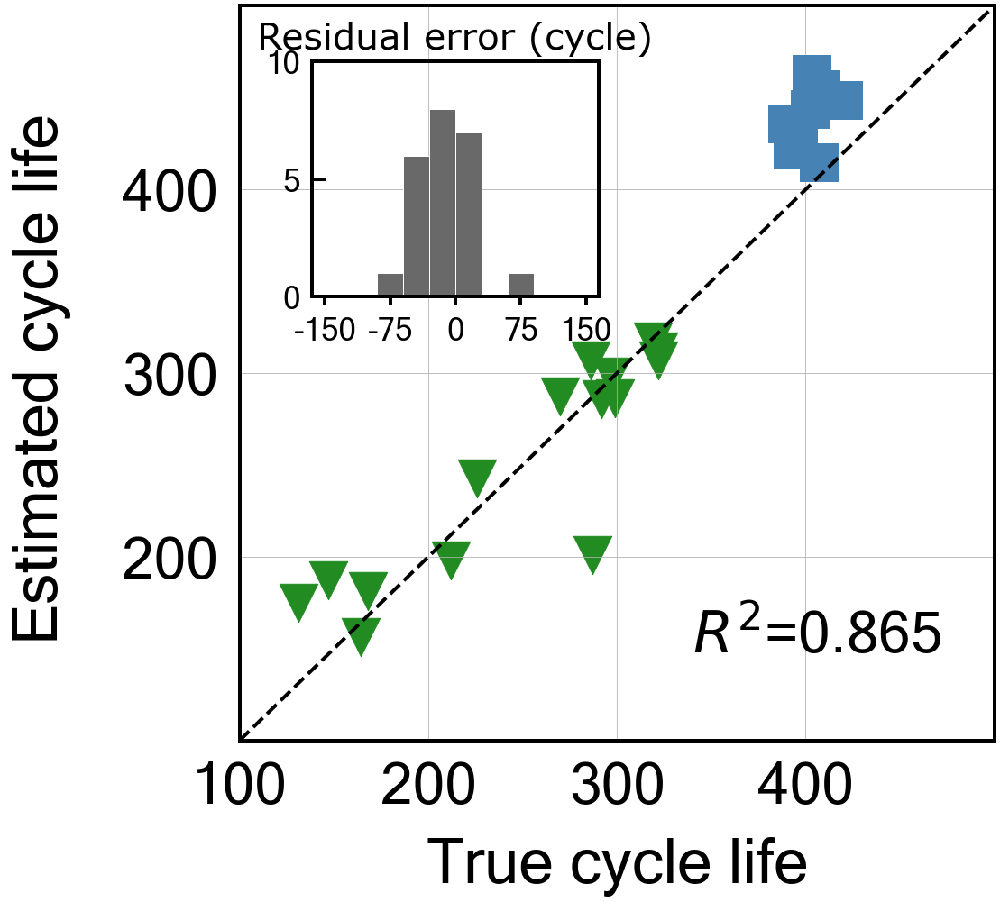

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to27')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.0
Best score obtained was: -29.226060235806322
Cycle no: Average_2to27
Coefficient:
T_V('Charge', 'Variance', 'Average_2to27') : -0.0
T_V('Charge', 'Mean', 'Average_2to27') : 0.0
T_V('Charge', 'Skewness', 'Average_2to27') : 0.2594166919835154
dTdV('Charge', 'Maximum', 'Average_2to27') : -0.0
dTdV('Charge', 'Mean', 'Average_2to27') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to27') : 0.0

Intercept: 0.6202443280977313
MAE_all: 33.2
MAPE_all: 11.8 %
RMSE_all: 39.2
RMSPE_all: 15.0 %
MAE_train: 25.2
MAPE_train: 11.7 %
RMSE_train: 32.4
RMSPE_train: 16.4 %
MAE_test: 48.0
MAPE_test: 11.9 %
RMSE_test: 49.4
RMSPE_test: 12.2 %
R2 normal-scale scores
All data r2-score: 0.812
Train data r2-score: 0.759
Test data r2-score: -29.226

Normal-scale scores
All data score: 0.812
Train data score: 0.759
Test 

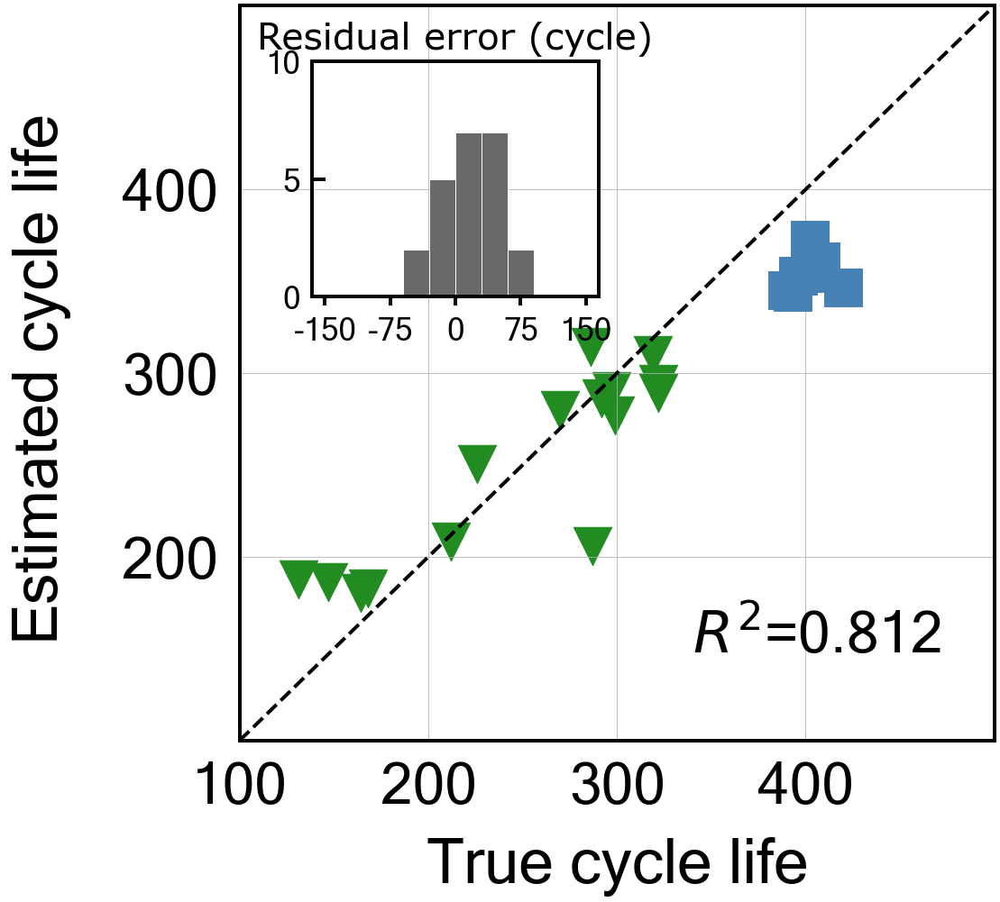

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to28')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.2
Best score obtained was: -28.49264926701596
Cycle no: Average_2to28
Coefficient:
T_V('Charge', 'Variance', 'Average_2to28') : -0.0
T_V('Charge', 'Mean', 'Average_2to28') : 0.0
T_V('Charge', 'Skewness', 'Average_2to28') : 0.2598085840521281
dTdV('Charge', 'Maximum', 'Average_2to28') : -0.0
dTdV('Charge', 'Mean', 'Average_2to28') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to28') : 0.0

Intercept: 0.6202443280977312
MAE_all: 32.9
MAPE_all: 11.7 %
RMSE_all: 38.9
RMSPE_all: 15.0 %
MAE_train: 25.2
MAPE_train: 11.7 %
RMSE_train: 32.3
RMSPE_train: 16.3 %
MAE_test: 47.4
MAPE_test: 11.7 %
RMSE_test: 48.8
RMSPE_test: 12.0 %
R2 normal-scale scores
All data r2-score: 0.815
Train data r2-score: 0.761
Test data r2-score: -28.493

Normal-scale scores
All data score: 0.815
Train data score: 0.761
Test d

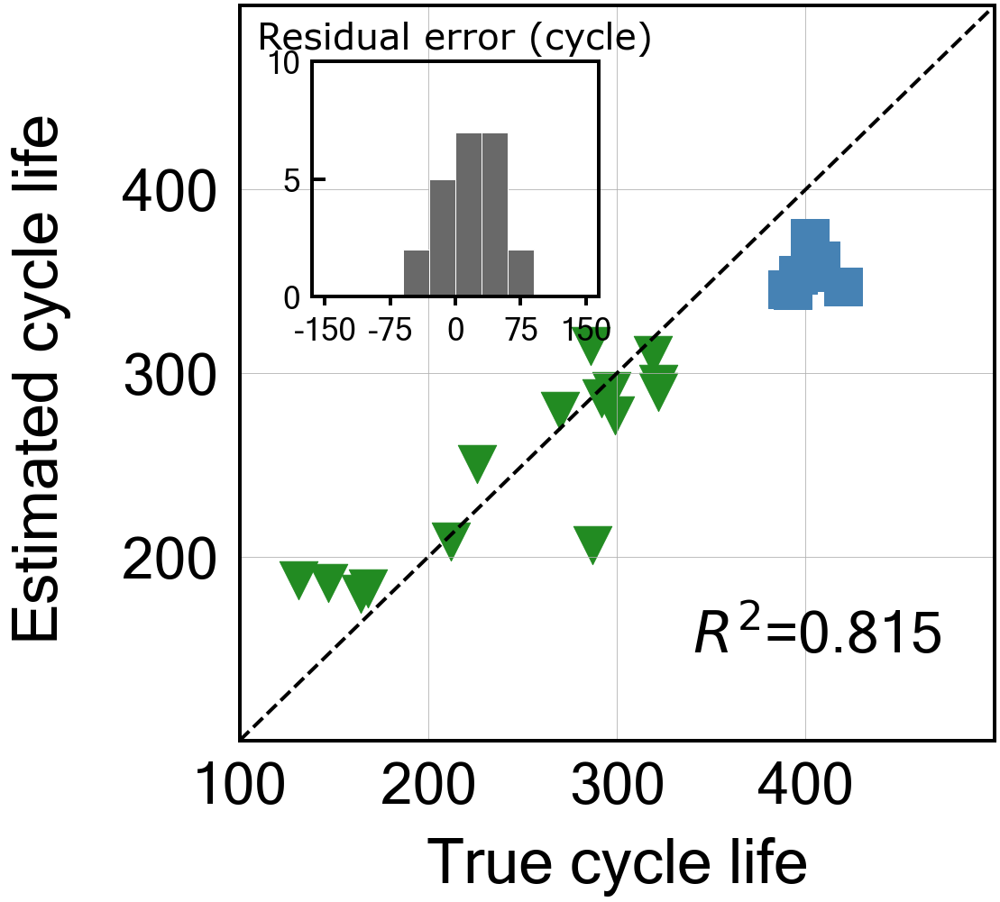

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to29')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.4
Best score obtained was: -28.184975237431278
Cycle no: Average_2to29
Coefficient:
T_V('Charge', 'Variance', 'Average_2to29') : -0.0
T_V('Charge', 'Mean', 'Average_2to29') : 0.0
T_V('Charge', 'Skewness', 'Average_2to29') : 0.2593132788200677
dTdV('Charge', 'Maximum', 'Average_2to29') : -0.0
dTdV('Charge', 'Mean', 'Average_2to29') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to29') : 0.0

Intercept: 0.6202443280977313
MAE_all: 32.8
MAPE_all: 11.7 %
RMSE_all: 38.8
RMSPE_all: 15.0 %
MAE_train: 25.2
MAPE_train: 11.7 %
RMSE_train: 32.4
RMSPE_train: 16.3 %
MAE_test: 47.2
MAPE_test: 11.7 %
RMSE_test: 48.5
RMSPE_test: 12.0 %
R2 normal-scale scores
All data r2-score: 0.816
Train data r2-score: 0.760
Test data r2-score: -28.185

Normal-scale scores
All data score: 0.816
Train data score: 0.760
Test 

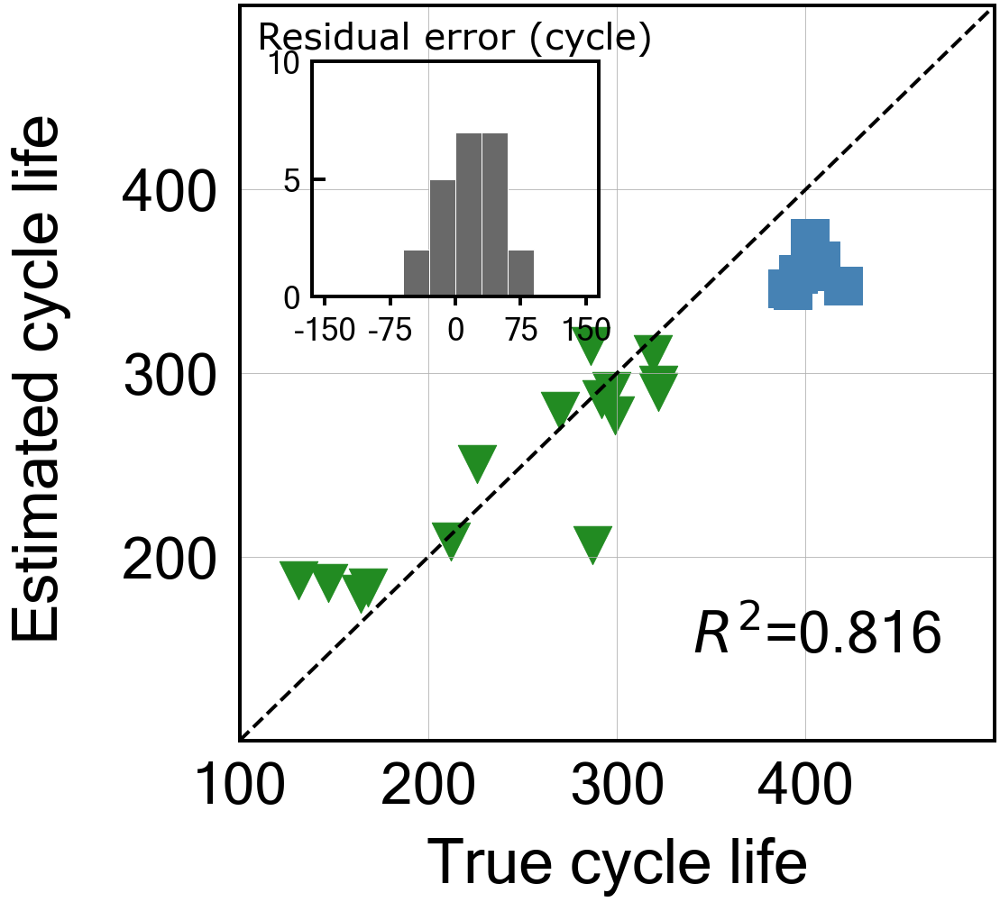

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to30')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -22.908394213373988
Cycle no: Average_2to30
Coefficient:
T_V('Charge', 'Variance', 'Average_2to30') : -0.0
T_V('Charge', 'Mean', 'Average_2to30') : 0.0
T_V('Charge', 'Skewness', 'Average_2to30') : 0.26993765792826996
dTdV('Charge', 'Maximum', 'Average_2to30') : -0.0
dTdV('Charge', 'Mean', 'Average_2to30') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to30') : -0.0

Intercept: 0.6202443280977314
MAE_all: 30.6
MAPE_all: 11.0 %
RMSE_all: 36.6
RMSPE_all: 14.2 %
MAE_train: 24.4
MAPE_train: 11.3 %
RMSE_train: 32.0
RMSPE_train: 15.8 %
MAE_test: 42.3
MAPE_test: 10.5 %
RMSE_test: 43.9
RMSPE_test: 10.8 %
R2 normal-scale scores
All data r2-score: 0.836
Train data r2-score: 0.766
Test data r2-score: -22.908

Normal-scale scores
All data score: 0.836
Train data score: 0.766
Tes

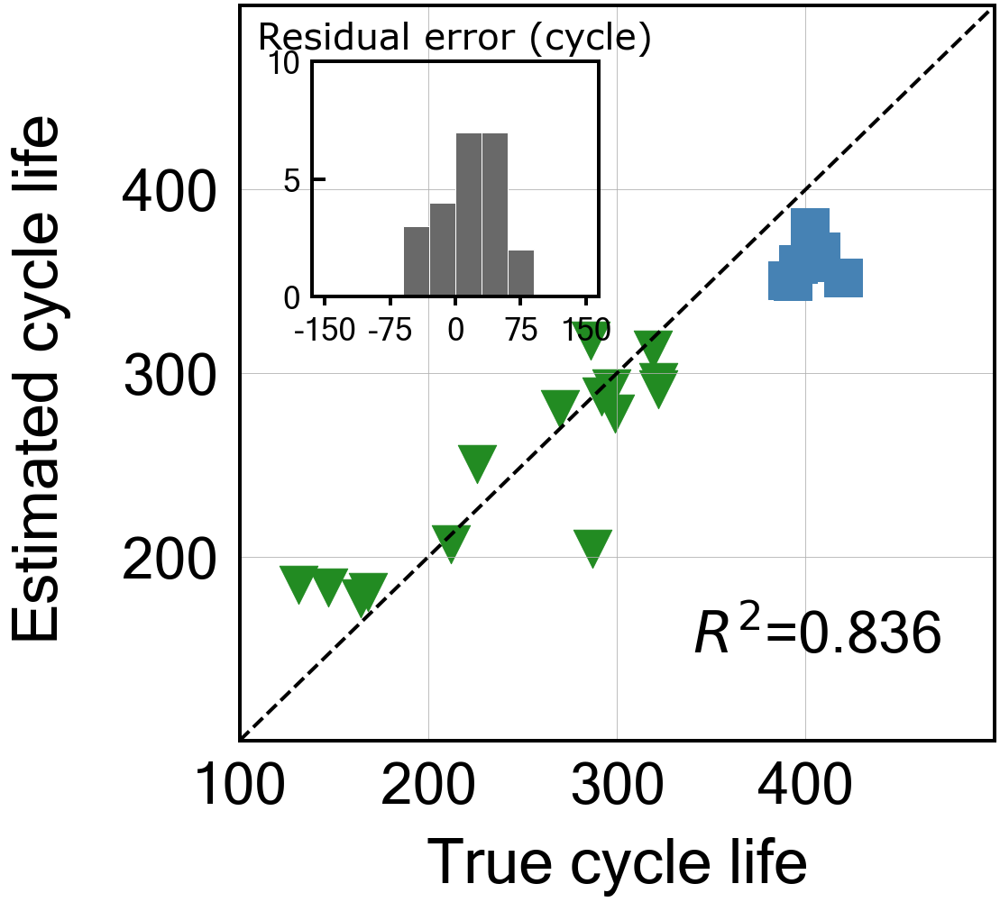

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to31')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.9
Best score obtained was: -14.234495290985619
Cycle no: Average_2to31
Coefficient:
T_V('Charge', 'Variance', 'Average_2to31') : -0.00488115061831641
T_V('Charge', 'Mean', 'Average_2to31') : 0.0
T_V('Charge', 'Skewness', 'Average_2to31') : 0.2759745144843331
dTdV('Charge', 'Maximum', 'Average_2to31') : -0.0
dTdV('Charge', 'Mean', 'Average_2to31') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to31') : -0.0

Intercept: 0.6202443280977313
MAE_all: 27.1
MAPE_all: 10.0 %
RMSE_all: 32.9
RMSPE_all: 13.5 %
MAE_train: 23.9
MAPE_train: 11.0 %
RMSE_train: 31.7
RMSPE_train: 15.5 %
MAE_test: 33.1
MAPE_test: 8.2 %
RMSE_test: 35.1
RMSPE_test: 8.6 %
R2 normal-scale scores
All data r2-score: 0.868
Train data r2-score: 0.770
Test data r2-score: -14.234

Normal-scale scores
All data score: 0.868
Train data sco

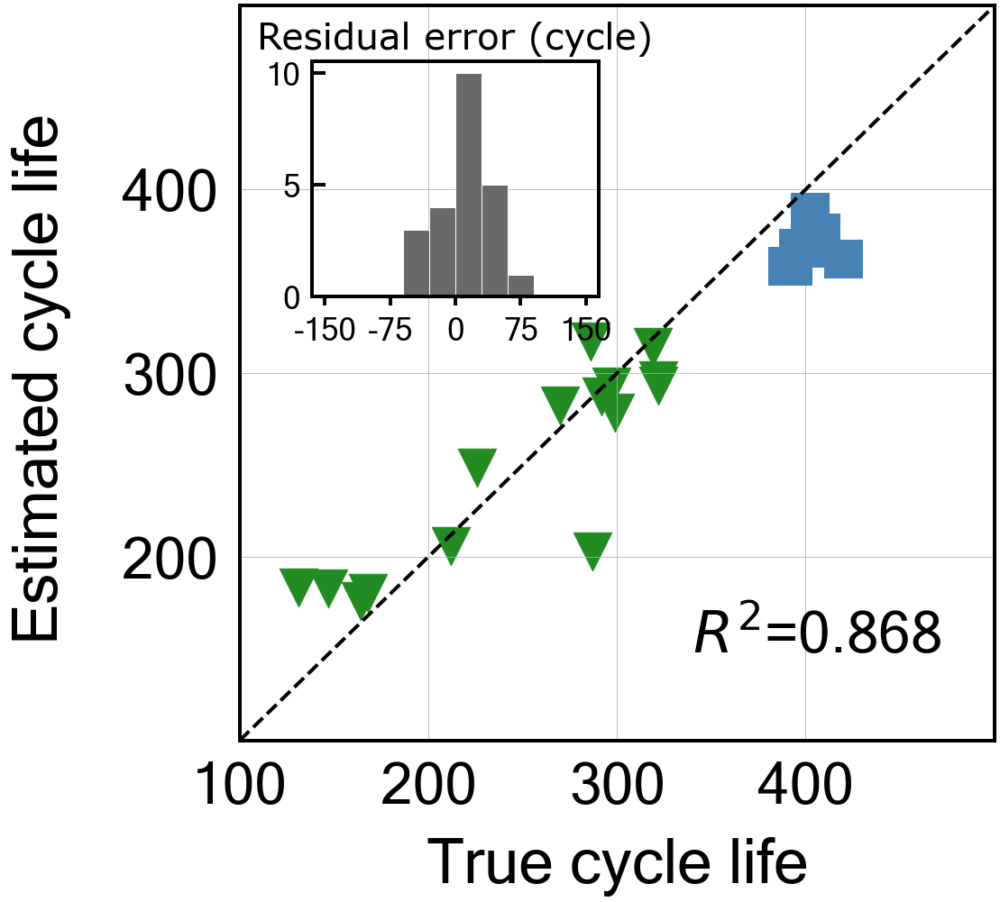

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to32')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -7.276725180402222
Cycle no: Average_2to32
Coefficient:
T_V('Charge', 'Variance', 'Average_2to32') : -0.01228331842559266
T_V('Charge', 'Mean', 'Average_2to32') : 0.004783862675231472
T_V('Charge', 'Skewness', 'Average_2to32') : 0.2751748743555881
dTdV('Charge', 'Maximum', 'Average_2to32') : -0.0
dTdV('Charge', 'Mean', 'Average_2to32') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to32') : -0.0

Intercept: 0.6202443280977313
MAE_all: 23.4
MAPE_all: 9.1 %
RMSE_all: 29.6
RMSPE_all: 13.0 %
MAE_train: 23.5
MAPE_train: 10.9 %
RMSE_train: 31.4
RMSPE_train: 15.4 %
MAE_test: 23.4
MAPE_test: 5.8 %
RMSE_test: 25.8
RMSPE_test: 6.3 %
R2 normal-scale scores
All data r2-score: 0.893
Train data r2-score: 0.774
Test data r2-score: -7.277

Normal-scale scores
All data score: 0.893


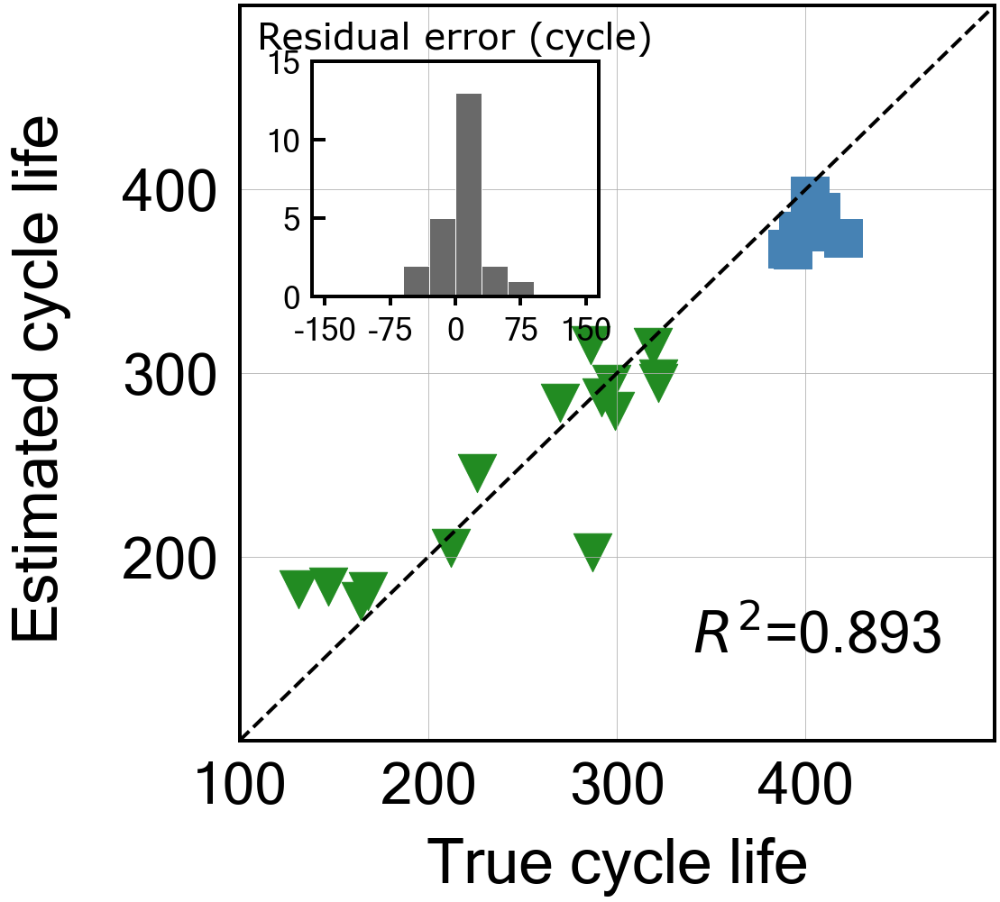

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to33')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -6.6097394925274
Cycle no: Average_2to33
Coefficient:
T_V('Charge', 'Variance', 'Average_2to33') : -0.012666400983962177
T_V('Charge', 'Mean', 'Average_2to33') : 0.004323860255382511
T_V('Charge', 'Skewness', 'Average_2to33') : 0.27571512833581446
dTdV('Charge', 'Maximum', 'Average_2to33') : -0.0
dTdV('Charge', 'Mean', 'Average_2to33') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to33') : -0.0

Intercept: 0.6202443280977311
MAE_all: 23.1
MAPE_all: 9.0 %
RMSE_all: 29.3
RMSPE_all: 13.0 %
MAE_train: 23.5
MAPE_train: 10.9 %
RMSE_train: 31.5
RMSPE_train: 15.4 %
MAE_test: 22.2
MAPE_test: 5.5 %
RMSE_test: 24.8
RMSPE_test: 6.1 %
R2 normal-scale scores
All data r2-score: 0.895
Train data r2-score: 0.773
Test data r2-score: -6.610

Normal-scale scores
All data score: 0.895


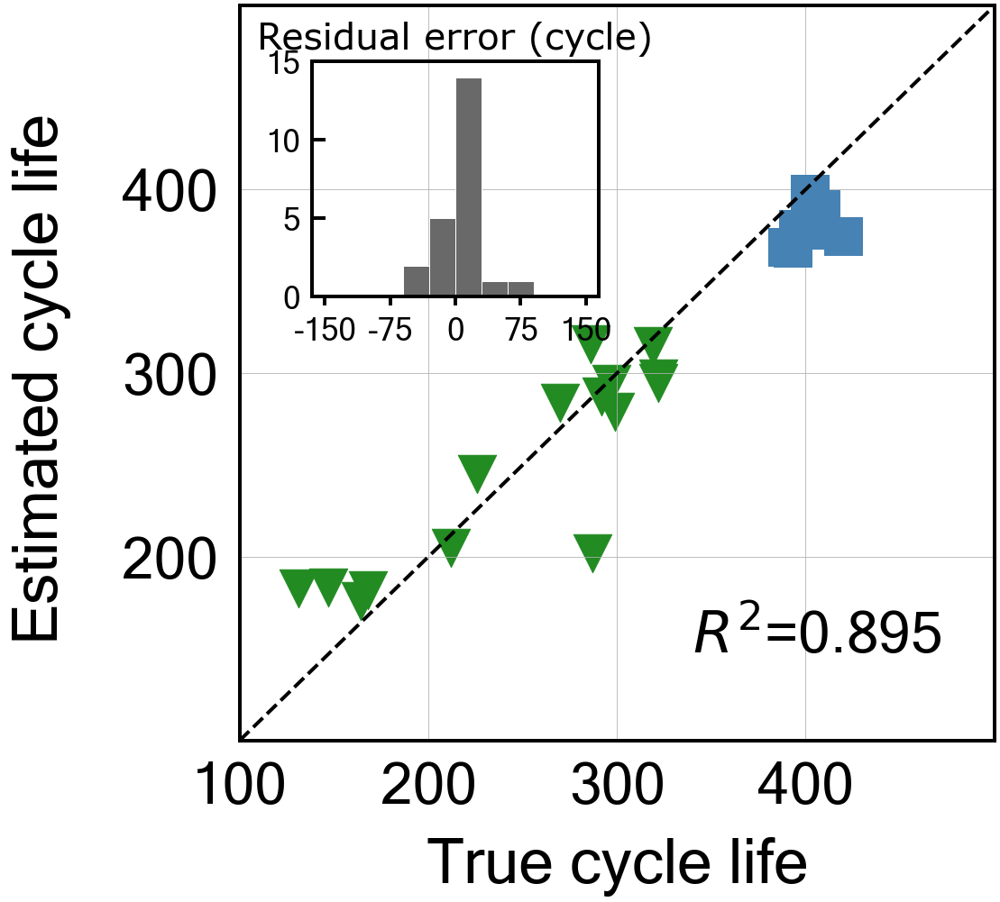

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to34')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.0
Best score obtained was: -4.918141107491698
Cycle no: Average_2to34
Coefficient:
T_V('Charge', 'Variance', 'Average_2to34') : -0.011623312965469933
T_V('Charge', 'Mean', 'Average_2to34') : 0.0
T_V('Charge', 'Skewness', 'Average_2to34') : 0.2860099872614165
dTdV('Charge', 'Maximum', 'Average_2to34') : -0.0
dTdV('Charge', 'Mean', 'Average_2to34') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to34') : -0.0

Intercept: 0.6202443280977314
MAE_all: 21.5
MAPE_all: 8.5 %
RMSE_all: 28.4
RMSPE_all: 12.6 %
MAE_train: 23.1
MAPE_train: 10.6 %
RMSE_train: 31.4
RMSPE_train: 15.1 %
MAE_test: 18.7
MAPE_test: 4.6 %
RMSE_test: 21.9
RMSPE_test: 5.3 %
R2 normal-scale scores
All data r2-score: 0.901
Train data r2-score: 0.774
Test data r2-score: -4.918

Normal-scale scores
All data score: 0.901
Train data score

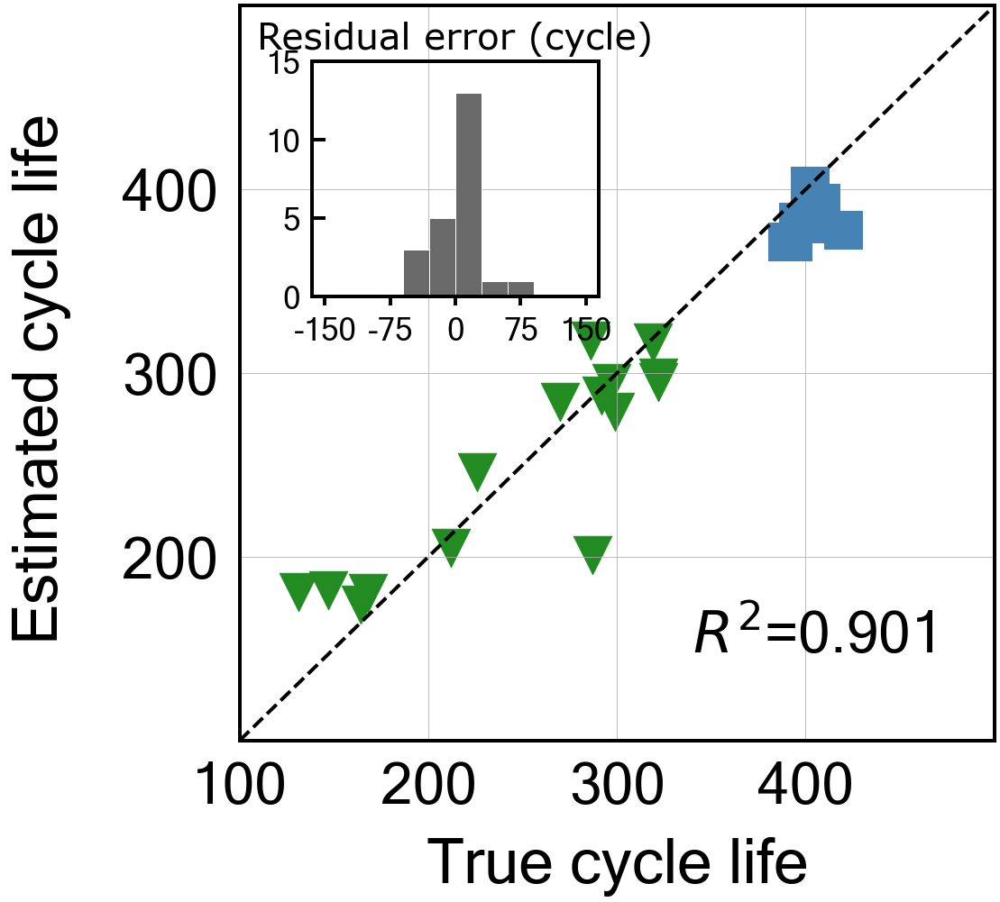

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to35')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -4.3104247693497575
Cycle no: Average_2to35
Coefficient:
T_V('Charge', 'Variance', 'Average_2to35') : -0.012245536012035946
T_V('Charge', 'Mean', 'Average_2to35') : 0.0
T_V('Charge', 'Skewness', 'Average_2to35') : 0.2862392088140514
dTdV('Charge', 'Maximum', 'Average_2to35') : -0.0
dTdV('Charge', 'Mean', 'Average_2to35') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to35') : -0.0

Intercept: 0.6202443280977314
MAE_all: 21.2
MAPE_all: 8.4 %
RMSE_all: 28.1
RMSPE_all: 12.5 %
MAE_train: 23.0
MAPE_train: 10.6 %
RMSE_train: 31.4
RMSPE_train: 15.1 %
MAE_test: 17.7
MAPE_test: 4.4 %
RMSE_test: 20.7
RMSPE_test: 5.1 %
R2 normal-scale scores
All data r2-score: 0.903
Train data r2-score: 0.775
Test data r2-score: -4.310

Normal-scale scores
All data score: 0.903
Train data scor

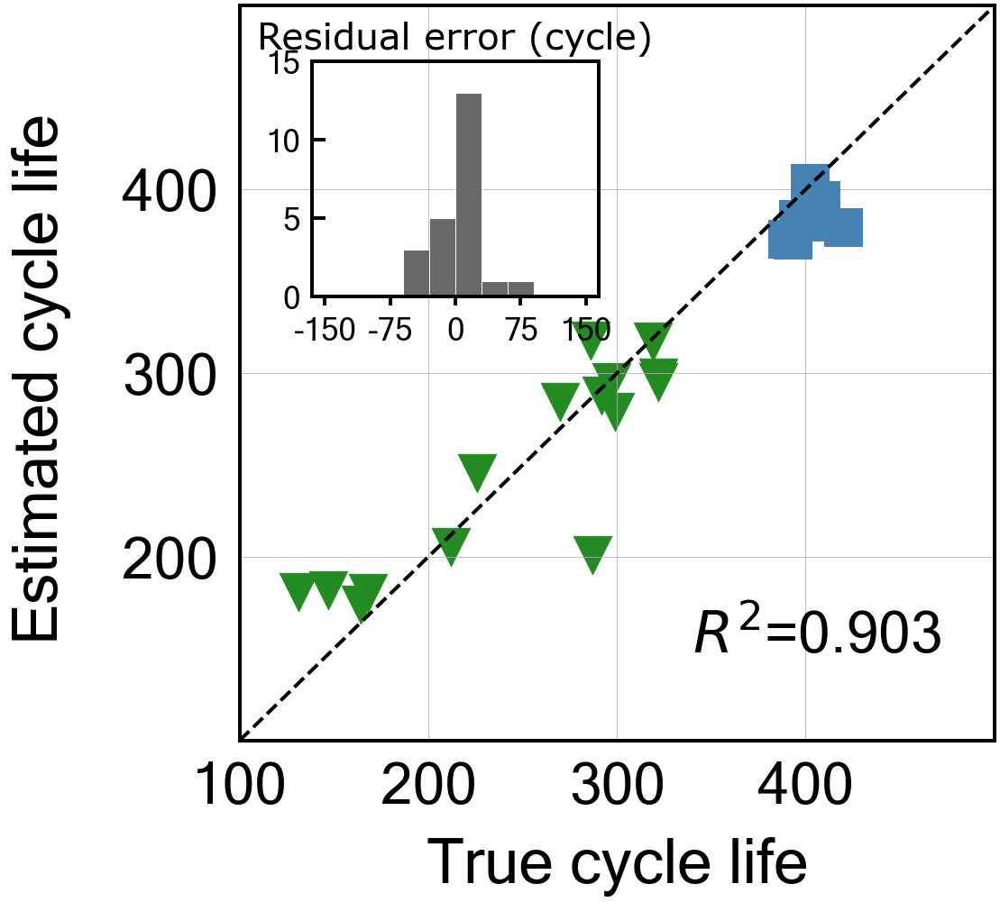

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to36')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.5
Best score obtained was: -9.04819352941617
Cycle no: Average_2to36
Coefficient:
T_V('Charge', 'Variance', 'Average_2to36') : -0.010841936609312538
T_V('Charge', 'Mean', 'Average_2to36') : 0.01311897512580789
T_V('Charge', 'Skewness', 'Average_2to36') : 0.2686753560601102
dTdV('Charge', 'Maximum', 'Average_2to36') : -0.0
dTdV('Charge', 'Mean', 'Average_2to36') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to36') : -0.0

Intercept: 0.6202443280977312
MAE_all: 24.3
MAPE_all: 9.3 %
RMSE_all: 30.6
RMSPE_all: 13.1 %
MAE_train: 23.4
MAPE_train: 10.8 %
RMSE_train: 31.6
RMSPE_train: 15.4 %
MAE_test: 26.2
MAPE_test: 6.5 %
RMSE_test: 28.5
RMSPE_test: 7.0 %
R2 normal-scale scores
All data r2-score: 0.886
Train data r2-score: 0.771
Test data r2-score: -9.048

Normal-scale scores
All data score: 0.886
T

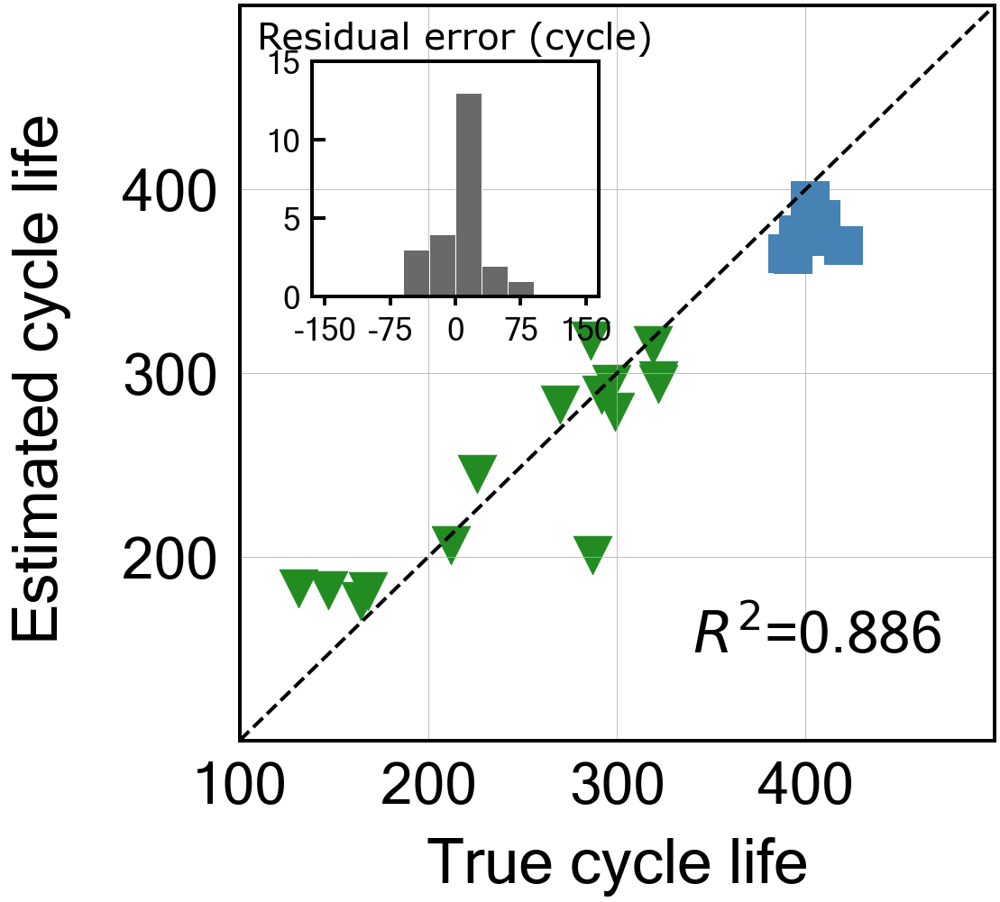

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to37')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.0
Best score obtained was: -4.35129798885672
Cycle no: Average_2to37
Coefficient:
T_V('Charge', 'Variance', 'Average_2to37') : -0.011961274817908266
T_V('Charge', 'Mean', 'Average_2to37') : 0.001023910626868915
T_V('Charge', 'Skewness', 'Average_2to37') : 0.28486735221629317
dTdV('Charge', 'Maximum', 'Average_2to37') : -0.0
dTdV('Charge', 'Mean', 'Average_2to37') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to37') : -0.0

Intercept: 0.6202443280977313
MAE_all: 21.1
MAPE_all: 8.4 %
RMSE_all: 28.1
RMSPE_all: 12.5 %
MAE_train: 22.9
MAPE_train: 10.6 %
RMSE_train: 31.4
RMSPE_train: 15.0 %
MAE_test: 17.7
MAPE_test: 4.4 %
RMSE_test: 20.8
RMSPE_test: 5.1 %
R2 normal-scale scores
All data r2-score: 0.903
Train data r2-score: 0.775
Test data r2-score: -4.351

Normal-scale scores
All data score: 0.903

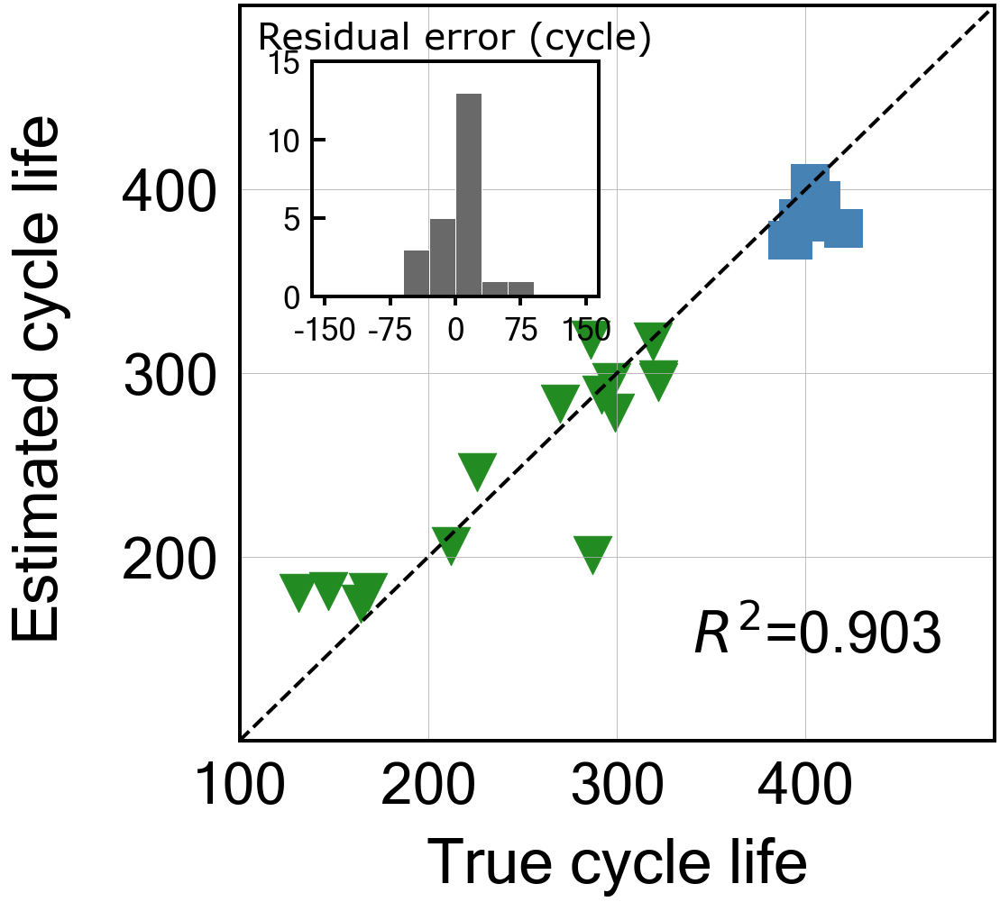

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to38')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -4.254188654224942
Cycle no: Average_2to38
Coefficient:
T_V('Charge', 'Variance', 'Average_2to38') : -0.012045204178591803
T_V('Charge', 'Mean', 'Average_2to38') : 0.001368640052094564
T_V('Charge', 'Skewness', 'Average_2to38') : 0.28451726298170016
dTdV('Charge', 'Maximum', 'Average_2to38') : -0.0
dTdV('Charge', 'Mean', 'Average_2to38') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to38') : -0.0

Intercept: 0.6202443280977312
MAE_all: 21.0
MAPE_all: 8.4 %
RMSE_all: 28.1
RMSPE_all: 12.4 %
MAE_train: 22.9
MAPE_train: 10.5 %
RMSE_train: 31.3
RMSPE_train: 15.0 %
MAE_test: 17.5
MAPE_test: 4.3 %
RMSE_test: 20.6
RMSPE_test: 5.0 %
R2 normal-scale scores
All data r2-score: 0.904
Train data r2-score: 0.775
Test data r2-score: -4.254

Normal-scale scores
All data score: 0.90

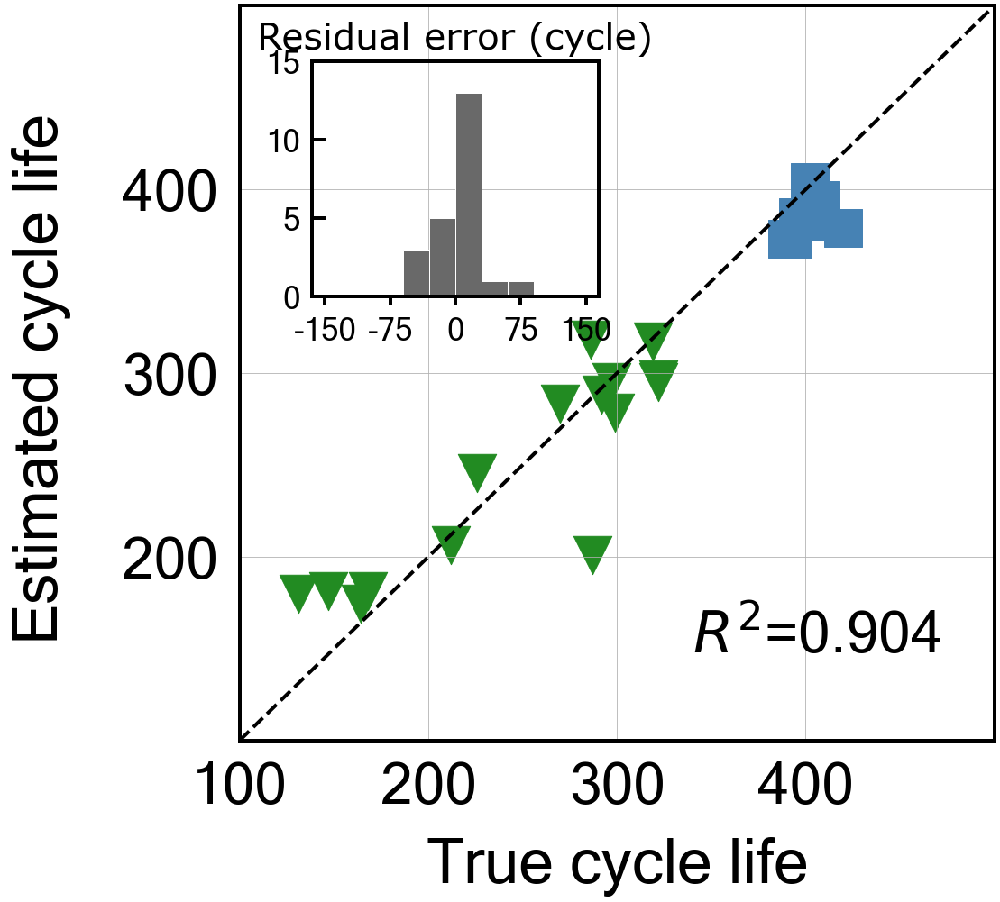

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to39')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -2.6907175003767834
Cycle no: Average_2to39
Coefficient:
T_V('Charge', 'Variance', 'Average_2to39') : -0.020495132618205455
T_V('Charge', 'Mean', 'Average_2to39') : 0.0199615944049666
T_V('Charge', 'Skewness', 'Average_2to39') : 0.2661904797496711
dTdV('Charge', 'Maximum', 'Average_2to39') : -0.0
dTdV('Charge', 'Mean', 'Average_2to39') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to39') : -0.0

Intercept: 0.6202443280977312
MAE_all: 19.9
MAPE_all: 8.1 %
RMSE_all: 27.3
RMSPE_all: 12.5 %
MAE_train: 22.9
MAPE_train: 10.6 %
RMSE_train: 31.3
RMSPE_train: 15.2 %
MAE_test: 14.1
MAPE_test: 3.5 %
RMSE_test: 17.3
RMSPE_test: 4.2 %
R2 normal-scale scores
All data r2-score: 0.909
Train data r2-score: 0.775
Test data r2-score: -2.691

Normal-scale scores
All data score: 0.909


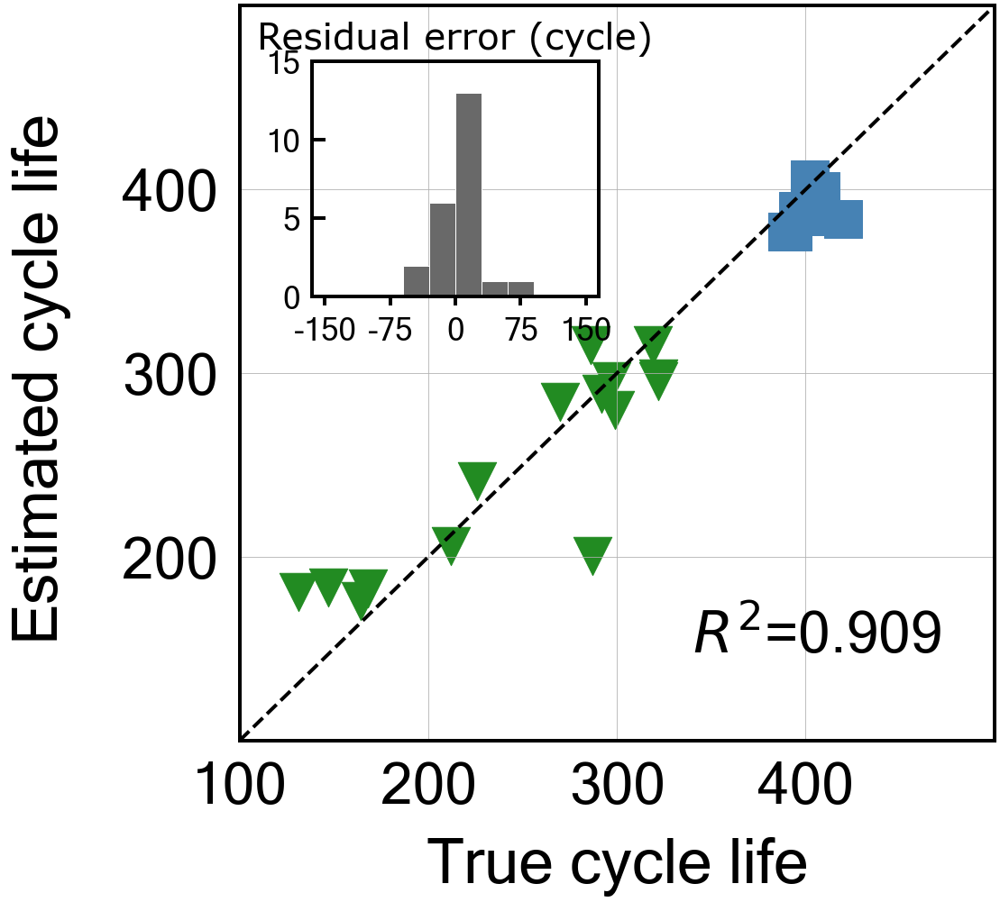

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to40')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.9
Best score obtained was: -6.617140257942261
Cycle no: Average_2to40
Coefficient:
T_V('Charge', 'Variance', 'Average_2to40') : -0.012766309667026746
T_V('Charge', 'Mean', 'Average_2to40') : 0.013984664464664731
T_V('Charge', 'Skewness', 'Average_2to40') : 0.269339805112723
dTdV('Charge', 'Maximum', 'Average_2to40') : -0.0
dTdV('Charge', 'Mean', 'Average_2to40') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to40') : -0.0

Intercept: 0.6202443280977313
MAE_all: 22.8
MAPE_all: 8.9 %
RMSE_all: 29.4
RMSPE_all: 12.8 %
MAE_train: 23.2
MAPE_train: 10.7 %
RMSE_train: 31.6
RMSPE_train: 15.2 %
MAE_test: 21.9
MAPE_test: 5.4 %
RMSE_test: 24.8
RMSPE_test: 6.1 %
R2 normal-scale scores
All data r2-score: 0.894
Train data r2-score: 0.772
Test data r2-score: -6.617

Normal-scale scores
All data score: 0.894


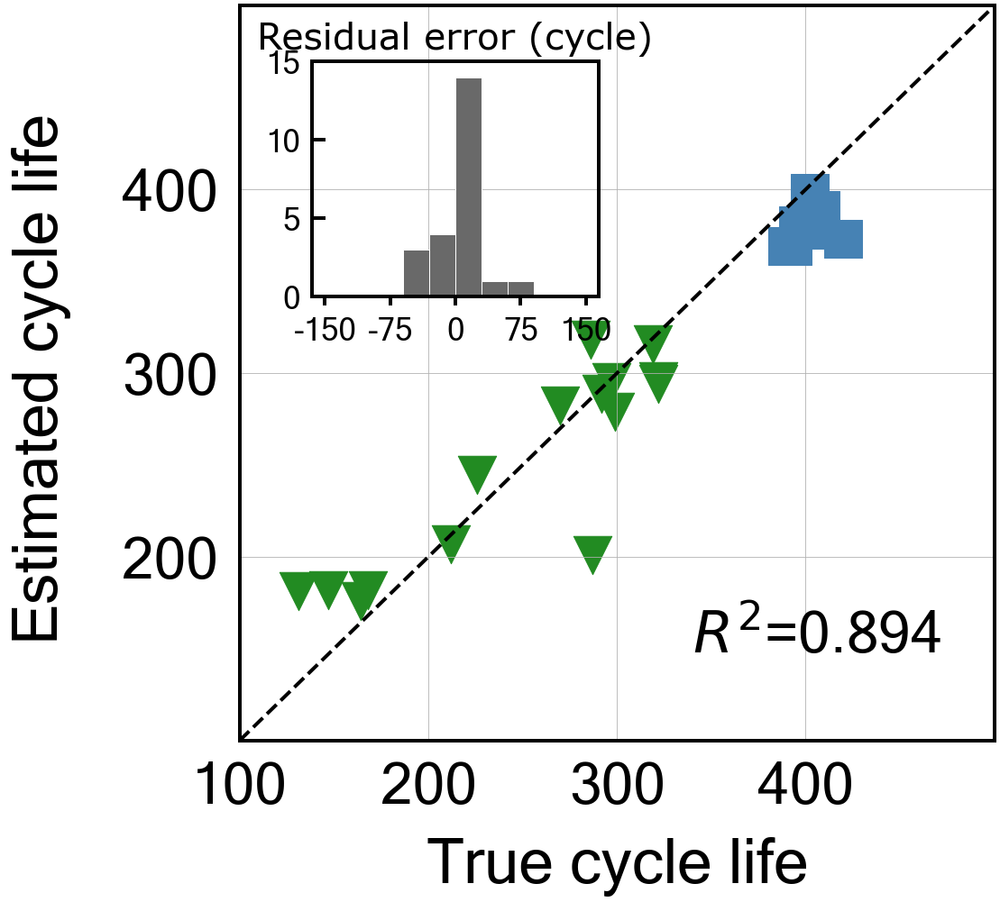

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to41')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.0
Best score obtained was: -20.361999776939836
Cycle no: Average_2to41
Coefficient:
T_V('Charge', 'Variance', 'Average_2to41') : -0.009978888002585931
T_V('Charge', 'Mean', 'Average_2to41') : 0.04137287653257456
T_V('Charge', 'Skewness', 'Average_2to41') : 0.2357765617405249
dTdV('Charge', 'Maximum', 'Average_2to41') : -0.0
dTdV('Charge', 'Mean', 'Average_2to41') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to41') : -0.0

Intercept: 0.6202443280977311
MAE_all: 29.4
MAPE_all: 10.6 %
RMSE_all: 35.7
RMSPE_all: 14.1 %
MAE_train: 23.8
MAPE_train: 11.0 %
RMSE_train: 32.1
RMSPE_train: 15.7 %
MAE_test: 39.9
MAPE_test: 9.9 %
RMSE_test: 41.5
RMSPE_test: 10.2 %
R2 normal-scale scores
All data r2-score: 0.845
Train data r2-score: 0.764
Test data r2-score: -20.362

Normal-scale scores
All data score: 0.

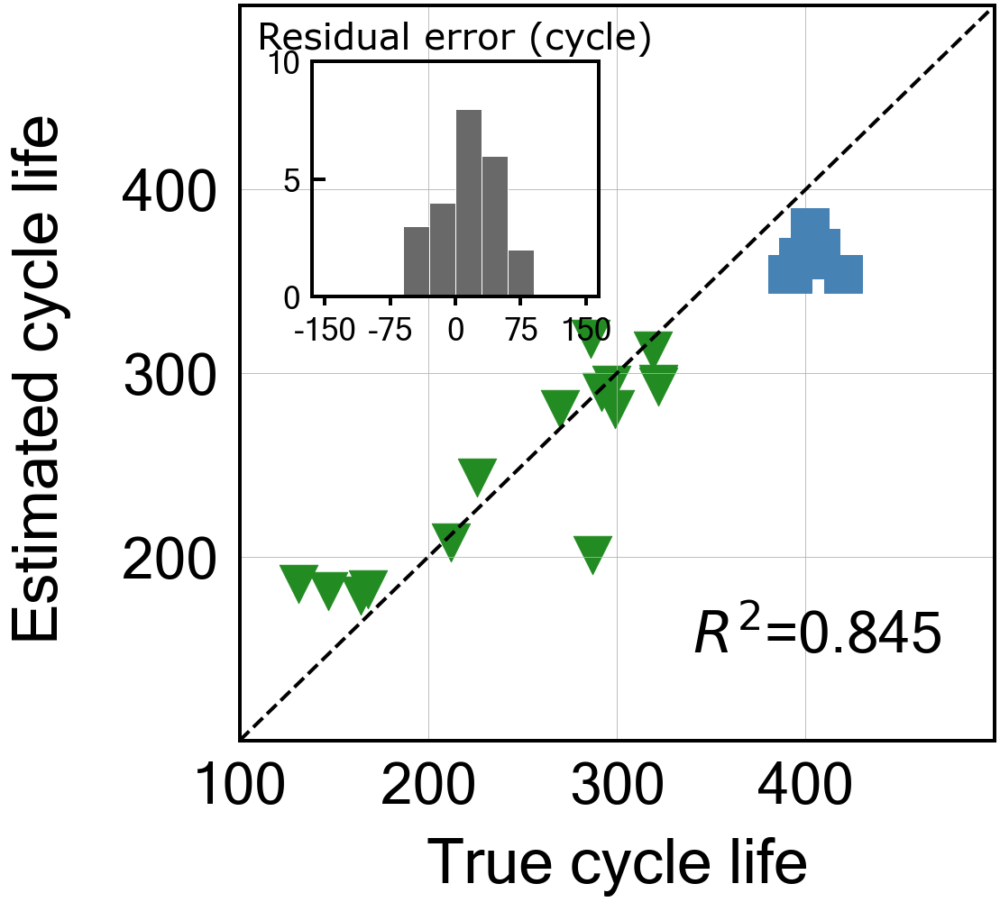

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to42')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.2
Best score obtained was: -4.8709141761211425
Cycle no: Average_2to42
Coefficient:
T_V('Charge', 'Variance', 'Average_2to42') : -0.01323758188860556
T_V('Charge', 'Mean', 'Average_2to42') : 0.01013910649629392
T_V('Charge', 'Skewness', 'Average_2to42') : 0.27452511139684693
dTdV('Charge', 'Maximum', 'Average_2to42') : -0.0
dTdV('Charge', 'Mean', 'Average_2to42') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to42') : -0.0

Intercept: 0.6202443280977313
MAE_all: 21.5
MAPE_all: 8.5 %
RMSE_all: 28.6
RMSPE_all: 12.6 %
MAE_train: 23.2
MAPE_train: 10.7 %
RMSE_train: 31.6
RMSPE_train: 15.1 %
MAE_test: 18.4
MAPE_test: 4.5 %
RMSE_test: 21.8
RMSPE_test: 5.3 %
R2 normal-scale scores
All data r2-score: 0.900
Train data r2-score: 0.771
Test data r2-score: -4.871

Normal-scale scores
All data score: 0.900

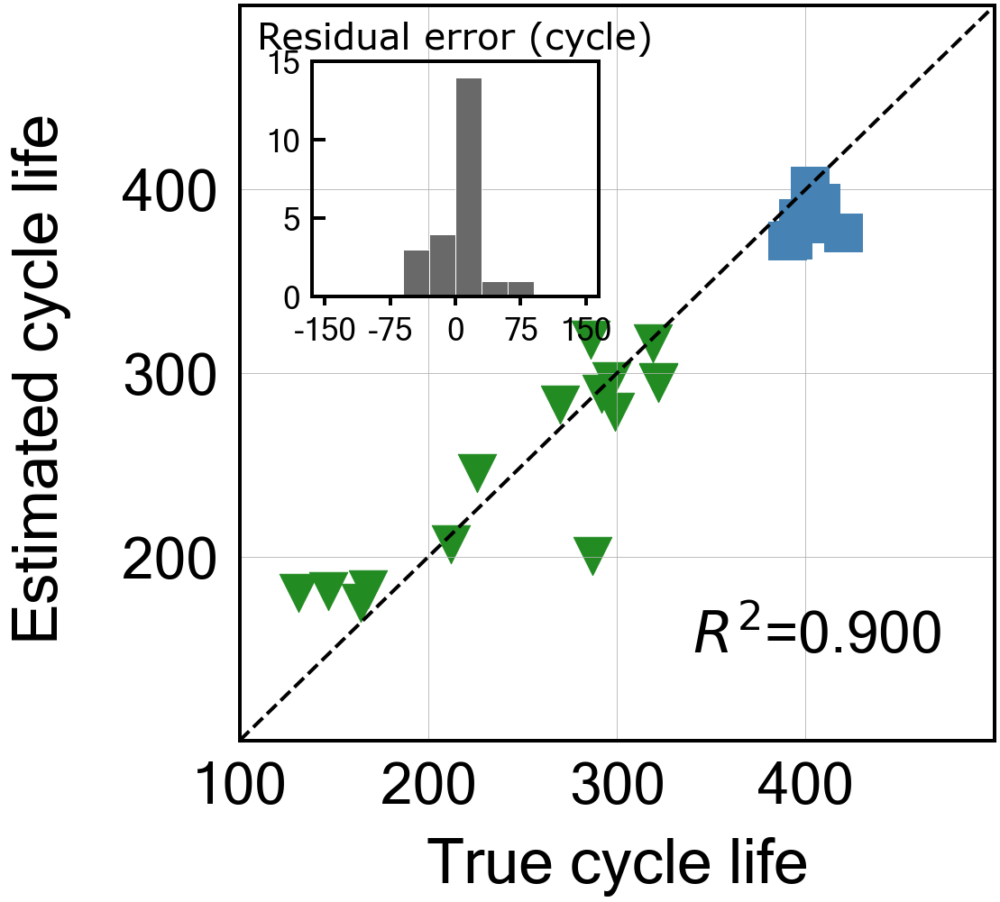

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to43')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -6.898018769291752
Cycle no: Average_2to43
Coefficient:
T_V('Charge', 'Variance', 'Average_2to43') : -0.012923967182785495
T_V('Charge', 'Mean', 'Average_2to43') : 0.017214904285122908
T_V('Charge', 'Skewness', 'Average_2to43') : 0.2658178395788634
dTdV('Charge', 'Maximum', 'Average_2to43') : -0.0
dTdV('Charge', 'Mean', 'Average_2to43') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to43') : -0.0

Intercept: 0.6202443280977314
MAE_all: 23.1
MAPE_all: 9.0 %
RMSE_all: 29.6
RMSPE_all: 12.8 %
MAE_train: 23.4
MAPE_train: 10.8 %
RMSE_train: 31.7
RMSPE_train: 15.3 %
MAE_test: 22.4
MAPE_test: 5.5 %
RMSE_test: 25.3
RMSPE_test: 6.2 %
R2 normal-scale scores
All data r2-score: 0.893
Train data r2-score: 0.770
Test data r2-score: -6.898

Normal-scale scores
All data score: 0.893

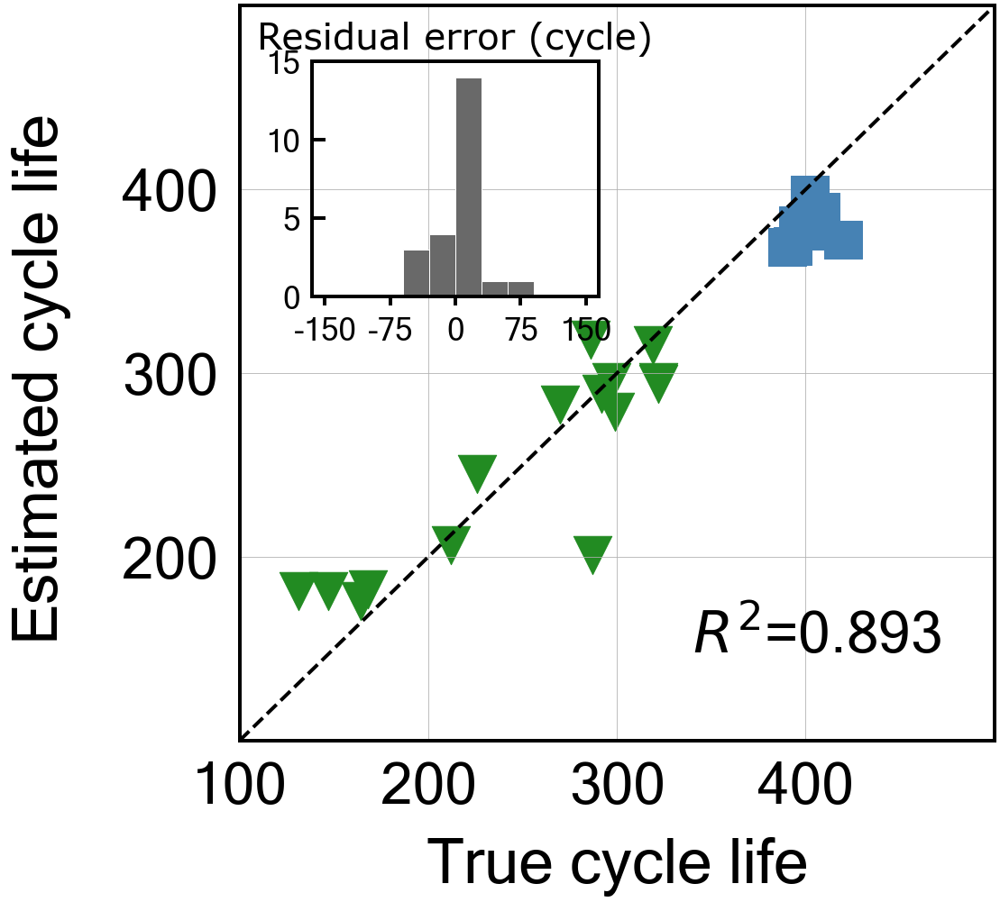

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to44')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -7.731440580597788
Cycle no: Average_2to44
Coefficient:
T_V('Charge', 'Variance', 'Average_2to44') : -0.012995303801410793
T_V('Charge', 'Mean', 'Average_2to44') : 0.020422121199690047
T_V('Charge', 'Skewness', 'Average_2to44') : 0.261996666341742
dTdV('Charge', 'Maximum', 'Average_2to44') : -0.0
dTdV('Charge', 'Mean', 'Average_2to44') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to44') : -0.0

Intercept: 0.6202443280977317
MAE_all: 23.7
MAPE_all: 9.1 %
RMSE_all: 30.1
RMSPE_all: 13.0 %
MAE_train: 23.5
MAPE_train: 10.8 %
RMSE_train: 31.8
RMSPE_train: 15.3 %
MAE_test: 23.9
MAPE_test: 5.9 %
RMSE_test: 26.6
RMSPE_test: 6.5 %
R2 normal-scale scores
All data r2-score: 0.889
Train data r2-score: 0.768
Test data r2-score: -7.731

Normal-scale scores
All data score: 0.889


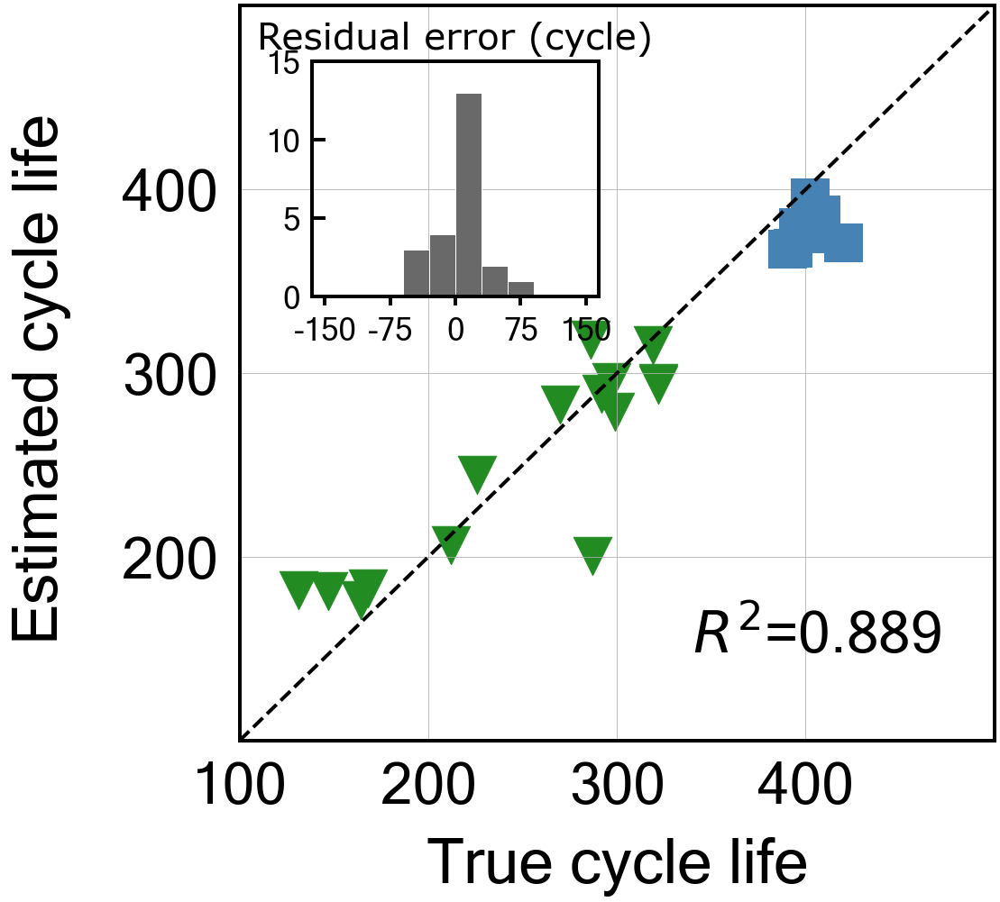

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to45')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -0.8437814216949526
Cycle no: Average_2to45
Coefficient:
T_V('Charge', 'Variance', 'Average_2to45') : -0.028941710048143783
T_V('Charge', 'Mean', 'Average_2to45') : 0.024780471995262215
T_V('Charge', 'Skewness', 'Average_2to45') : 0.2664399829591138
dTdV('Charge', 'Maximum', 'Average_2to45') : 0.0
dTdV('Charge', 'Mean', 'Average_2to45') : 0.0
dTdV('Charge', 'Kurtosis', 'Average_2to45') : -0.015643425199320566

Intercept: 0.6202443280977314
MAE_all: 17.8
MAPE_all: 7.5 %
RMSE_all: 26.0
RMSPE_all: 11.8 %
MAE_train: 22.4
MAPE_train: 10.3 %
RMSE_train: 31.0
RMSPE_train: 14.4 %
MAE_test: 9.1
MAPE_test: 2.2 %
RMSE_test: 12.2
RMSPE_test: 3.0 %
R2 normal-scale scores
All data r2-score: 0.917
Train data r2-score: 0.780
Test data r2-score: -0.844

Normal-scale scores
All da

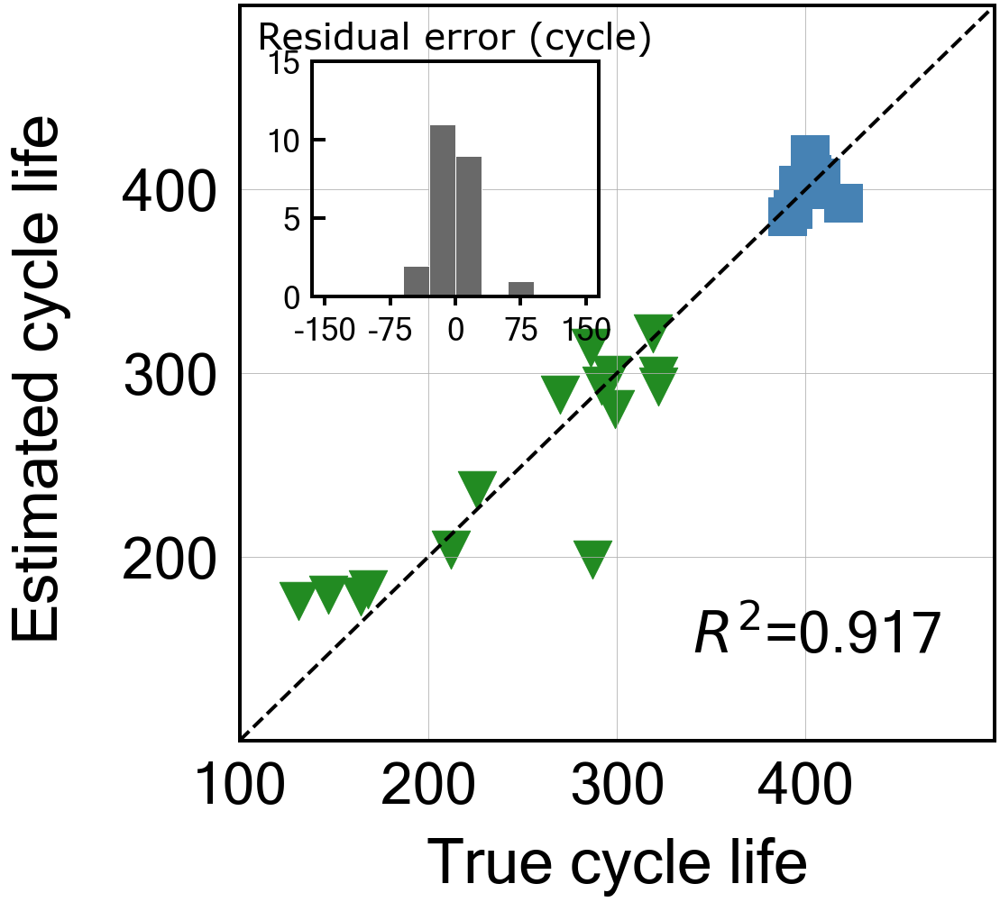

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to46')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.0
Best score obtained was: -11.712643420395159
Cycle no: Average_2to46
Coefficient:
T_V('Charge', 'Variance', 'Average_2to46') : -0.01277659431326218
T_V('Charge', 'Mean', 'Average_2to46') : 0.023412252743556013
T_V('Charge', 'Skewness', 'Average_2to46') : 0.2518832857160479
dTdV('Charge', 'Maximum', 'Average_2to46') : -0.0
dTdV('Charge', 'Mean', 'Average_2to46') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to46') : -0.011844330523449843

Intercept: 0.6202443280977313
MAE_all: 25.5
MAPE_all: 9.6 %
RMSE_all: 31.9
RMSPE_all: 13.1 %
MAE_train: 23.4
MAPE_train: 10.8 %
RMSE_train: 31.8
RMSPE_train: 15.2 %
MAE_test: 29.4
MAPE_test: 7.3 %
RMSE_test: 32.0
RMSPE_test: 7.9 %
R2 normal-scale scores
All data r2-score: 0.876
Train data r2-score: 0.768
Test data r2-score: -11.713

Normal-scale scores
All

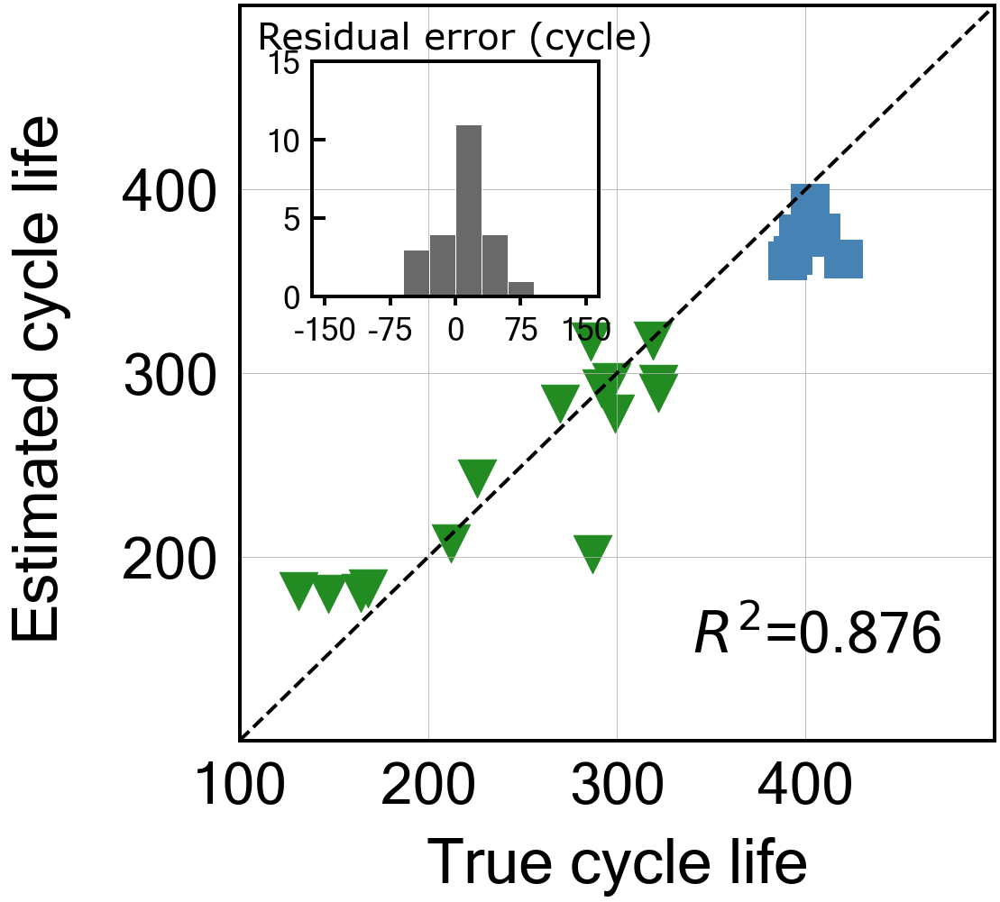

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to47')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -1.097011816113854
Cycle no: Average_2to47
Coefficient:
T_V('Charge', 'Variance', 'Average_2to47') : -0.02785995748313529
T_V('Charge', 'Mean', 'Average_2to47') : 0.02162713780510833
T_V('Charge', 'Skewness', 'Average_2to47') : 0.267909801934016
dTdV('Charge', 'Maximum', 'Average_2to47') : 0.0
dTdV('Charge', 'Mean', 'Average_2to47') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to47') : -0.019137533898195468

Intercept: 0.6202443280977312
MAE_all: 18.2
MAPE_all: 7.6 %
RMSE_all: 26.1
RMSPE_all: 11.7 %
MAE_train: 22.7
MAPE_train: 10.3 %
RMSE_train: 30.9
RMSPE_train: 14.3 %
MAE_test: 9.9
MAPE_test: 2.4 %
RMSE_test: 13.0
RMSPE_test: 3.2 %
R2 normal-scale scores
All data r2-score: 0.916
Train data r2-score: 0.781
Test data r2-score: -1.097

Normal-scale scores
All data 

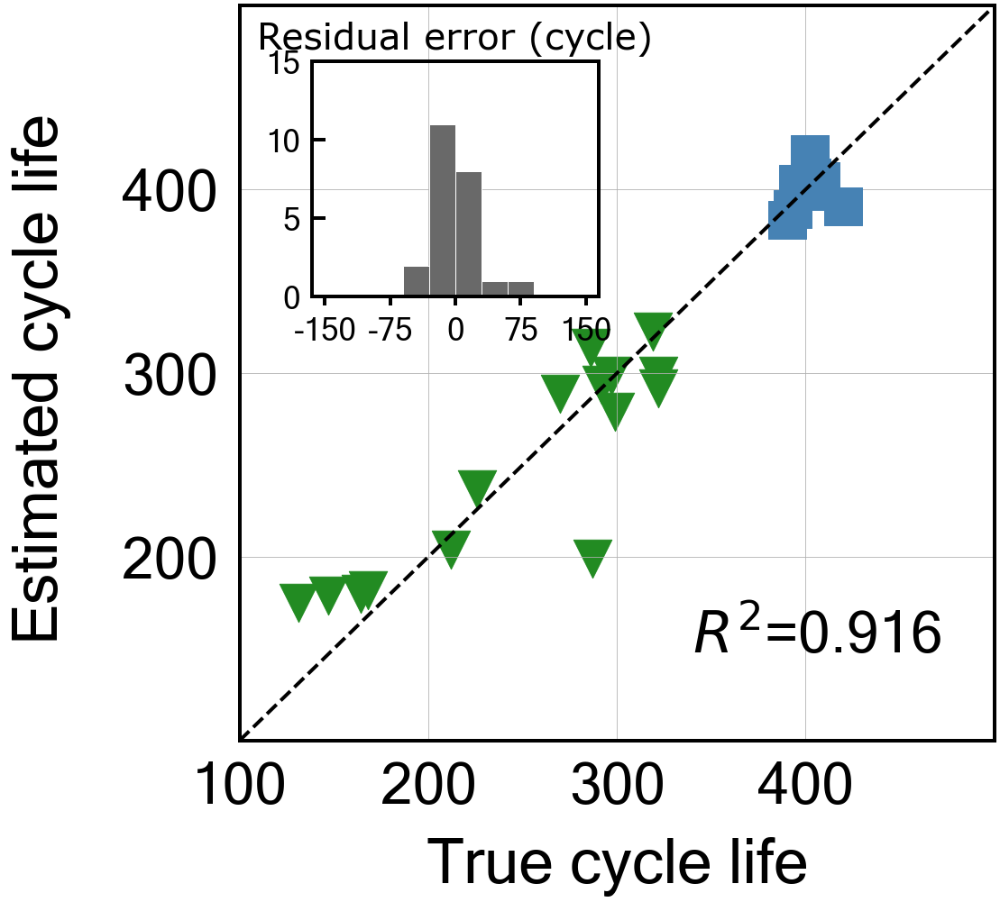

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to48')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -11.029903470931542
Cycle no: Average_2to48
Coefficient:
T_V('Charge', 'Variance', 'Average_2to48') : -0.012734952197210334
T_V('Charge', 'Mean', 'Average_2to48') : 0.029858958057098716
T_V('Charge', 'Skewness', 'Average_2to48') : 0.2502488361566842
dTdV('Charge', 'Maximum', 'Average_2to48') : -0.0
dTdV('Charge', 'Mean', 'Average_2to48') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to48') : -0.0010746616041105643

Intercept: 0.6202443280977314
MAE_all: 25.6
MAPE_all: 9.6 %
RMSE_all: 31.7
RMSPE_all: 13.3 %
MAE_train: 23.8
MAPE_train: 11.0 %
RMSE_train: 32.0
RMSPE_train: 15.5 %
MAE_test: 28.9
MAPE_test: 7.1 %
RMSE_test: 31.2
RMSPE_test: 7.6 %
R2 normal-scale scores
All data r2-score: 0.877
Train data r2-score: 0.765
Test data r2-score: -11.030

Normal-scale scores
A

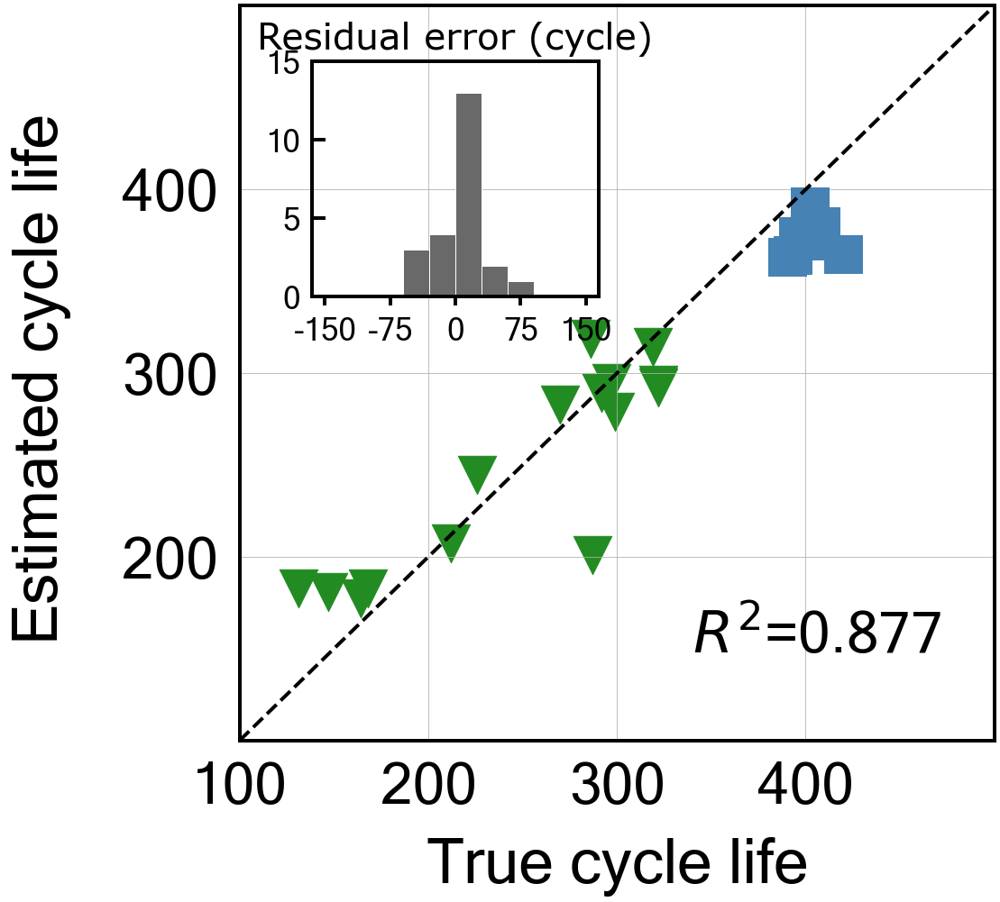

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to49')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.1
Best score obtained was: -11.27859575413435
Cycle no: Average_2to49
Coefficient:
T_V('Charge', 'Variance', 'Average_2to49') : -0.013189829932941788
T_V('Charge', 'Mean', 'Average_2to49') : 0.03375181403043669
T_V('Charge', 'Skewness', 'Average_2to49') : 0.2470748711339151
dTdV('Charge', 'Maximum', 'Average_2to49') : -0.0
dTdV('Charge', 'Mean', 'Average_2to49') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to49') : -0.00011712290125228643

Intercept: 0.6202443280977312
MAE_all: 25.7
MAPE_all: 9.7 %
RMSE_all: 31.9
RMSPE_all: 13.3 %
MAE_train: 23.8
MAPE_train: 11.0 %
RMSE_train: 32.1
RMSPE_train: 15.5 %
MAE_test: 29.3
MAPE_test: 7.2 %
RMSE_test: 31.5
RMSPE_test: 7.7 %
R2 normal-scale scores
All data r2-score: 0.876
Train data r2-score: 0.764
Test data r2-score: -11.279

Normal-scale scores
Al

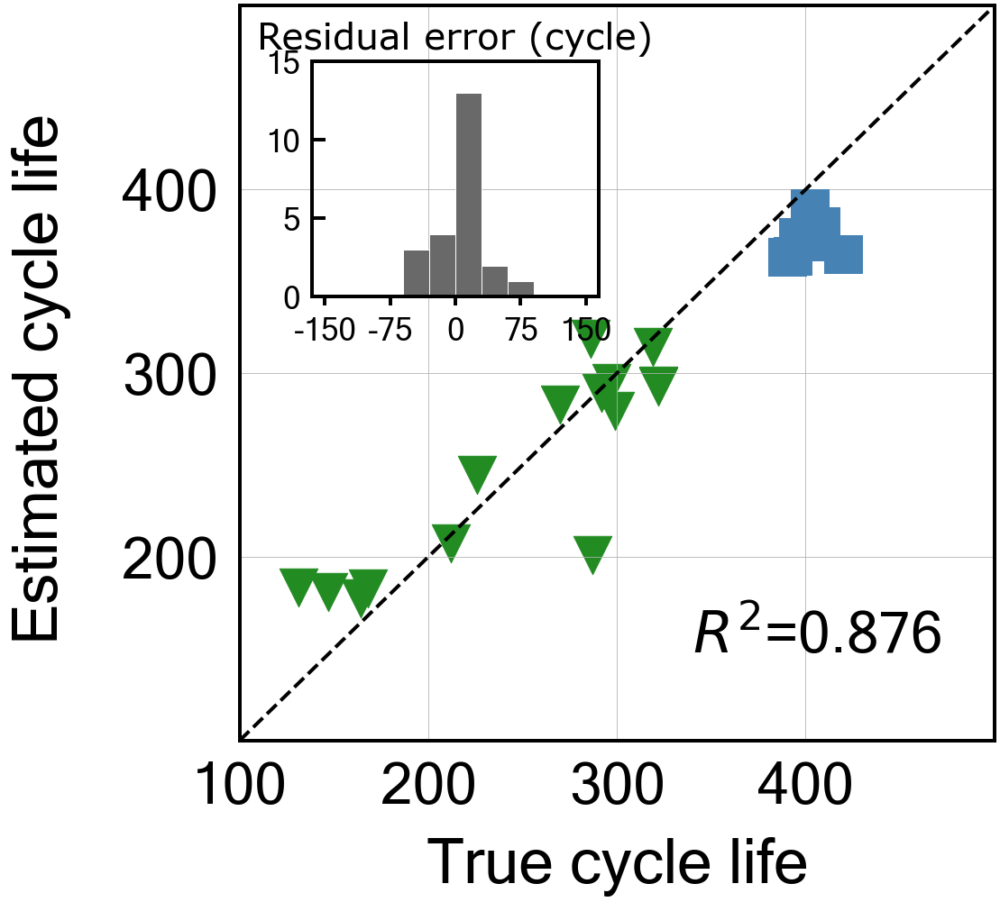

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to50')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.3
Best score obtained was: -10.084013288402852
Cycle no: Average_2to50
Coefficient:
T_V('Charge', 'Variance', 'Average_2to50') : -0.013696663579279685
T_V('Charge', 'Mean', 'Average_2to50') : 0.032268765847759805
T_V('Charge', 'Skewness', 'Average_2to50') : 0.24860333082134026
dTdV('Charge', 'Maximum', 'Average_2to50') : -0.0
dTdV('Charge', 'Mean', 'Average_2to50') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to50') : -0.0

Intercept: 0.6202443280977312
MAE_all: 25.1
MAPE_all: 9.5 %
RMSE_all: 31.3
RMSPE_all: 13.3 %
MAE_train: 23.8
MAPE_train: 11.0 %
RMSE_train: 32.1
RMSPE_train: 15.5 %
MAE_test: 27.6
MAPE_test: 6.8 %
RMSE_test: 29.9
RMSPE_test: 7.3 %
R2 normal-scale scores
All data r2-score: 0.880
Train data r2-score: 0.764
Test data r2-score: -10.084

Normal-scale scores
All data score: 0.

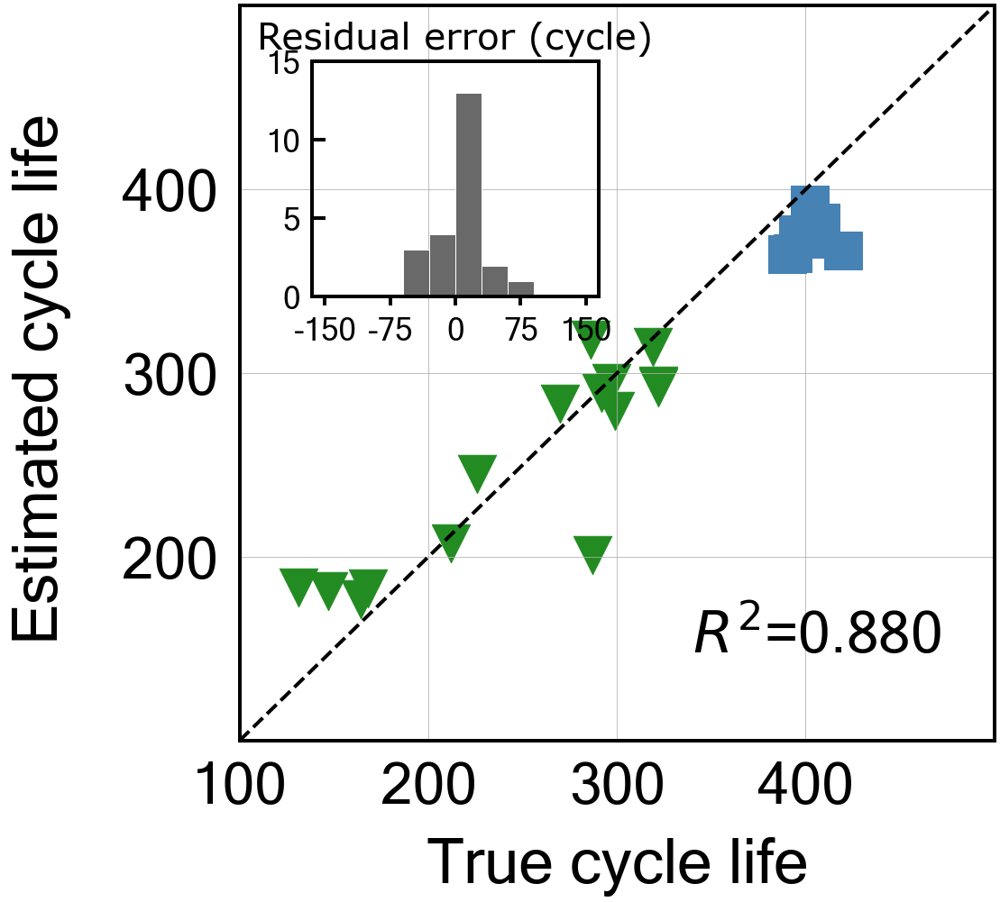

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to51')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -11.902433863540434
Cycle no: Average_2to51
Coefficient:
T_V('Charge', 'Variance', 'Average_2to51') : -0.013580652985885932
T_V('Charge', 'Mean', 'Average_2to51') : 0.03805889031818091
T_V('Charge', 'Skewness', 'Average_2to51') : 0.2427537351754521
dTdV('Charge', 'Maximum', 'Average_2to51') : -0.0
dTdV('Charge', 'Mean', 'Average_2to51') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to51') : -0.0

Intercept: 0.6202443280977314
MAE_all: 26.0
MAPE_all: 9.8 %
RMSE_all: 32.2
RMSPE_all: 13.4 %
MAE_train: 23.8
MAPE_train: 11.0 %
RMSE_train: 32.1
RMSPE_train: 15.6 %
MAE_test: 30.1
MAPE_test: 7.4 %
RMSE_test: 32.3
RMSPE_test: 7.9 %
R2 normal-scale scores
All data r2-score: 0.873
Train data r2-score: 0.763
Test data r2-score: -11.902

Normal-scale scores
All data score: 0.87

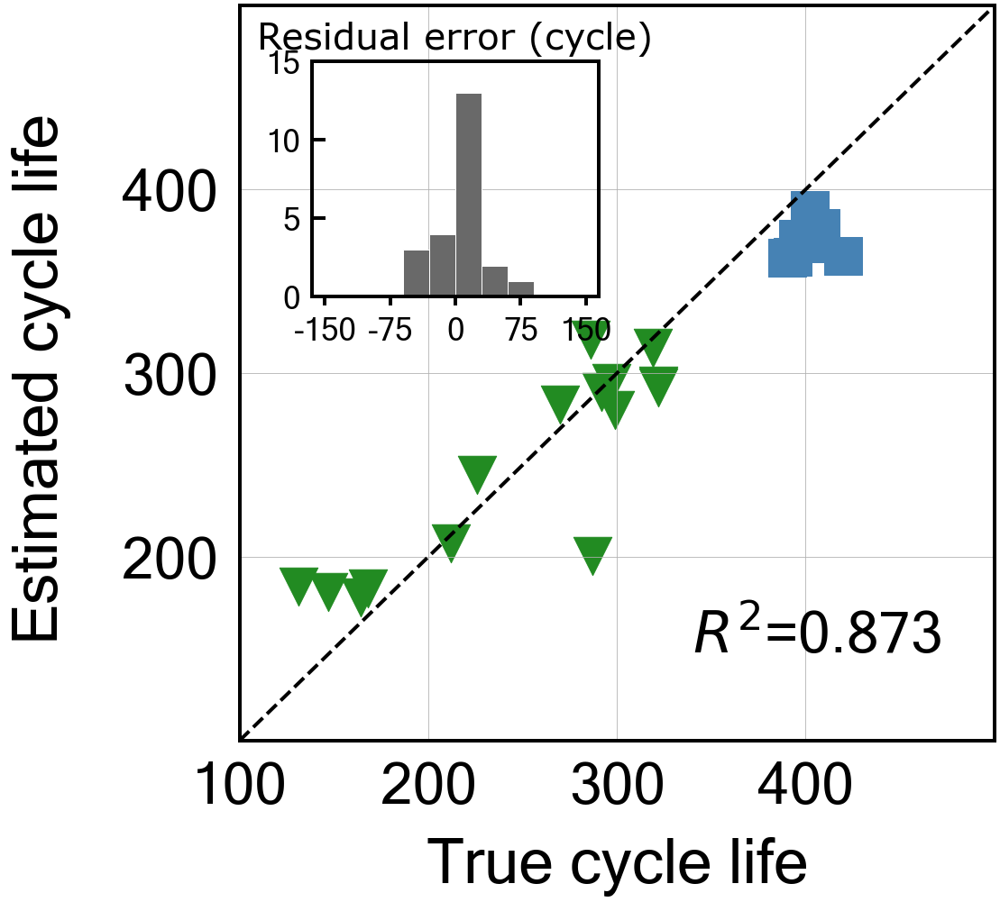

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to52')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -46.730349120058996
Cycle no: Average_2to52
Coefficient:
T_V('Charge', 'Variance', 'Average_2to52') : -0.010363535452594943
T_V('Charge', 'Mean', 'Average_2to52') : 0.07969780087223666
T_V('Charge', 'Skewness', 'Average_2to52') : 0.1862394657692529
dTdV('Charge', 'Maximum', 'Average_2to52') : -0.0
dTdV('Charge', 'Mean', 'Average_2to52') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to52') : -0.007122772791978536

Intercept: 0.6202443280977316
MAE_all: 37.2
MAPE_all: 12.7 %
RMSE_all: 45.2
RMSPE_all: 16.0 %
MAE_train: 24.6
MAPE_train: 11.4 %
RMSE_train: 32.9
RMSPE_train: 16.3 %
MAE_test: 60.8
MAPE_test: 15.1 %
RMSE_test: 62.1
RMSPE_test: 15.3 %
R2 normal-scale scores
All data r2-score: 0.750
Train data r2-score: 0.753
Test data r2-score: -46.730

Normal-scale scores


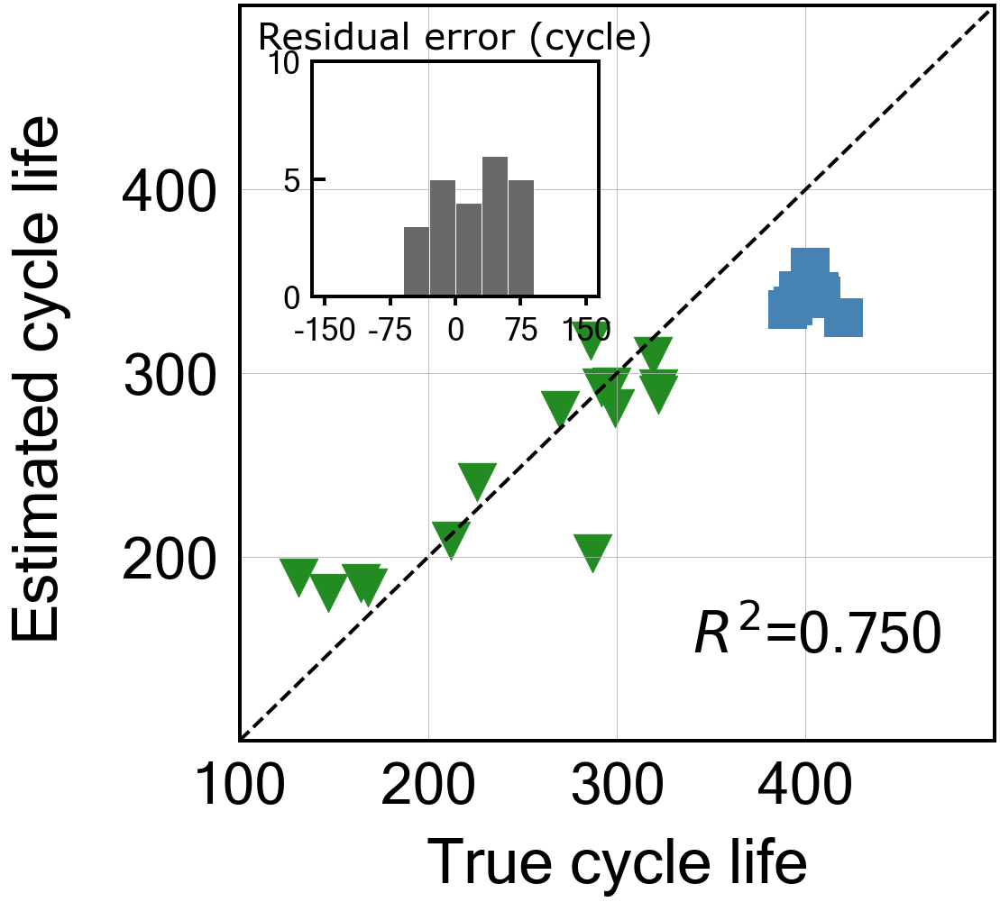

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to53')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 3.8
Best score obtained was: -54.64081224601082
Cycle no: Average_2to53
Coefficient:
T_V('Charge', 'Variance', 'Average_2to53') : -0.009634073848359662
T_V('Charge', 'Mean', 'Average_2to53') : 0.08179629071778949
T_V('Charge', 'Skewness', 'Average_2to53') : 0.1792730057872803
dTdV('Charge', 'Maximum', 'Average_2to53') : -0.0
dTdV('Charge', 'Mean', 'Average_2to53') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to53') : -0.013619626328597803

Intercept: 0.6202443280977312
MAE_all: 39.0
MAPE_all: 13.2 %
RMSE_all: 47.6
RMSPE_all: 16.4 %
MAE_train: 24.7
MAPE_train: 11.5 %
RMSE_train: 32.9
RMSPE_train: 16.3 %
MAE_test: 65.7
MAPE_test: 16.3 %
RMSE_test: 67.0
RMSPE_test: 16.5 %
R2 normal-scale scores
All data r2-score: 0.722
Train data r2-score: 0.751
Test data r2-score: -54.641

Normal-scale scores
A

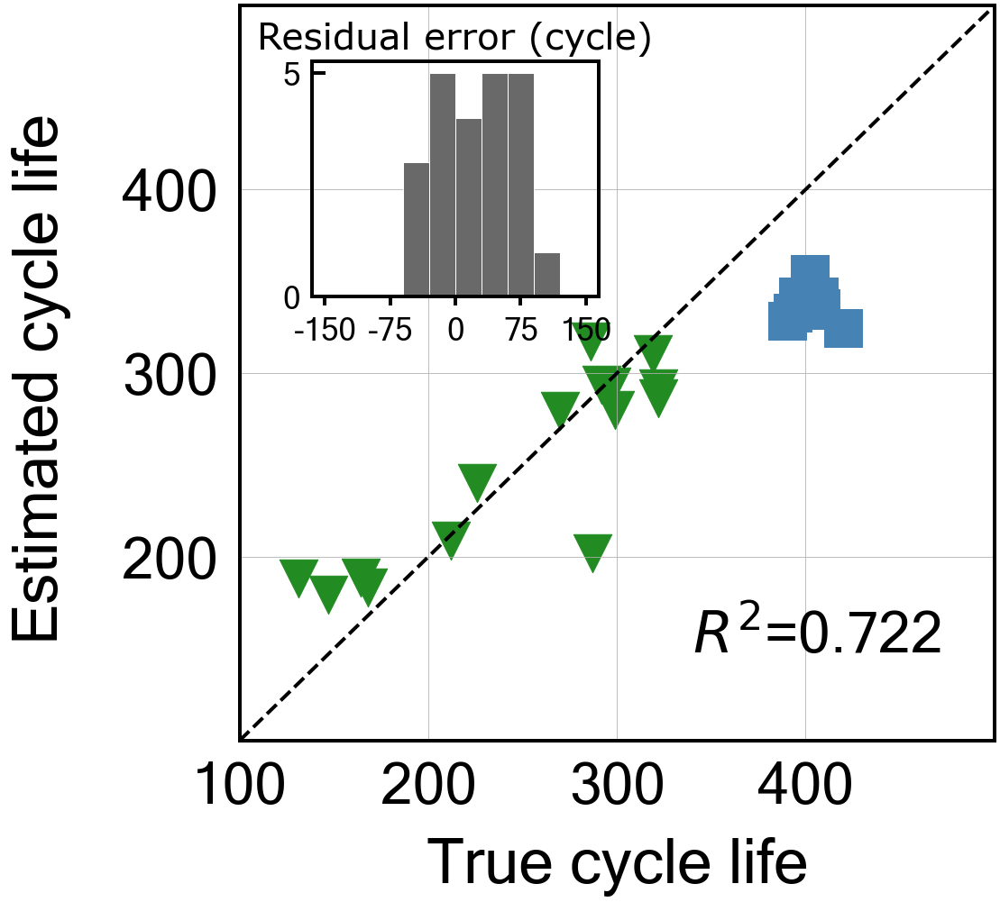

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to54')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.0
Best score obtained was: -46.64056961731918
Cycle no: Average_2to54
Coefficient:
T_V('Charge', 'Variance', 'Average_2to54') : -0.010384267378267965
T_V('Charge', 'Mean', 'Average_2to54') : 0.08220642952581429
T_V('Charge', 'Skewness', 'Average_2to54') : 0.18530577546594693
dTdV('Charge', 'Maximum', 'Average_2to54') : -0.0
dTdV('Charge', 'Mean', 'Average_2to54') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to54') : -0.004444711060644348

Intercept: 0.6202443280977311
MAE_all: 37.2
MAPE_all: 12.7 %
RMSE_all: 45.2
RMSPE_all: 16.0 %
MAE_train: 24.6
MAPE_train: 11.5 %
RMSE_train: 32.9
RMSPE_train: 16.4 %
MAE_test: 60.8
MAPE_test: 15.1 %
RMSE_test: 62.0
RMSPE_test: 15.3 %
R2 normal-scale scores
All data r2-score: 0.750
Train data r2-score: 0.752
Test data r2-score: -46.641

Normal-scale scores


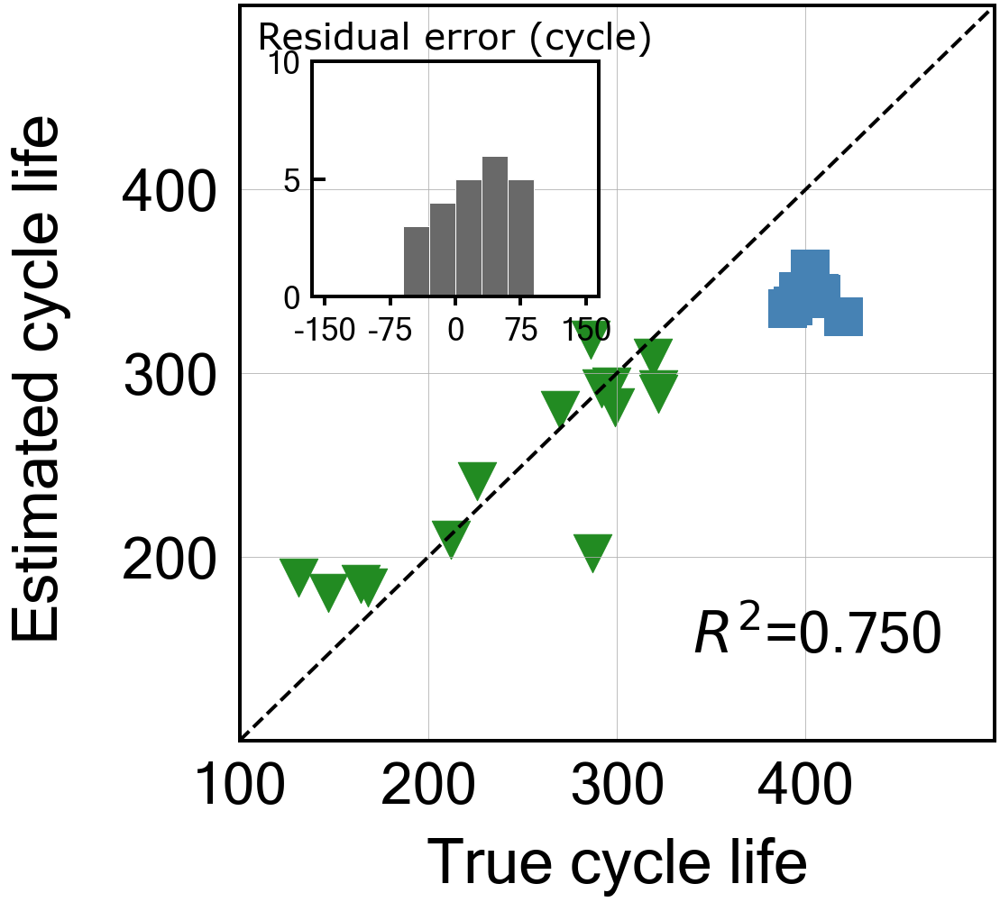

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to55')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.9
Best score obtained was: -43.64973792133543
Cycle no: Average_2to55
Coefficient:
T_V('Charge', 'Variance', 'Average_2to55') : -0.012597834111160241
T_V('Charge', 'Mean', 'Average_2to55') : 0.08215442949683889
T_V('Charge', 'Skewness', 'Average_2to55') : 0.18461069264975694
dTdV('Charge', 'Maximum', 'Average_2to55') : -0.0
dTdV('Charge', 'Mean', 'Average_2to55') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to55') : -0.009411441316498324

Intercept: 0.6202443280977317
MAE_all: 36.4
MAPE_all: 12.5 %
RMSE_all: 44.2
RMSPE_all: 15.7 %
MAE_train: 24.4
MAPE_train: 11.4 %
RMSE_train: 32.7
RMSPE_train: 16.2 %
MAE_test: 58.7
MAPE_test: 14.5 %
RMSE_test: 60.0
RMSPE_test: 14.8 %
R2 normal-scale scores
All data r2-score: 0.761
Train data r2-score: 0.755
Test data r2-score: -43.650

Normal-scale scores


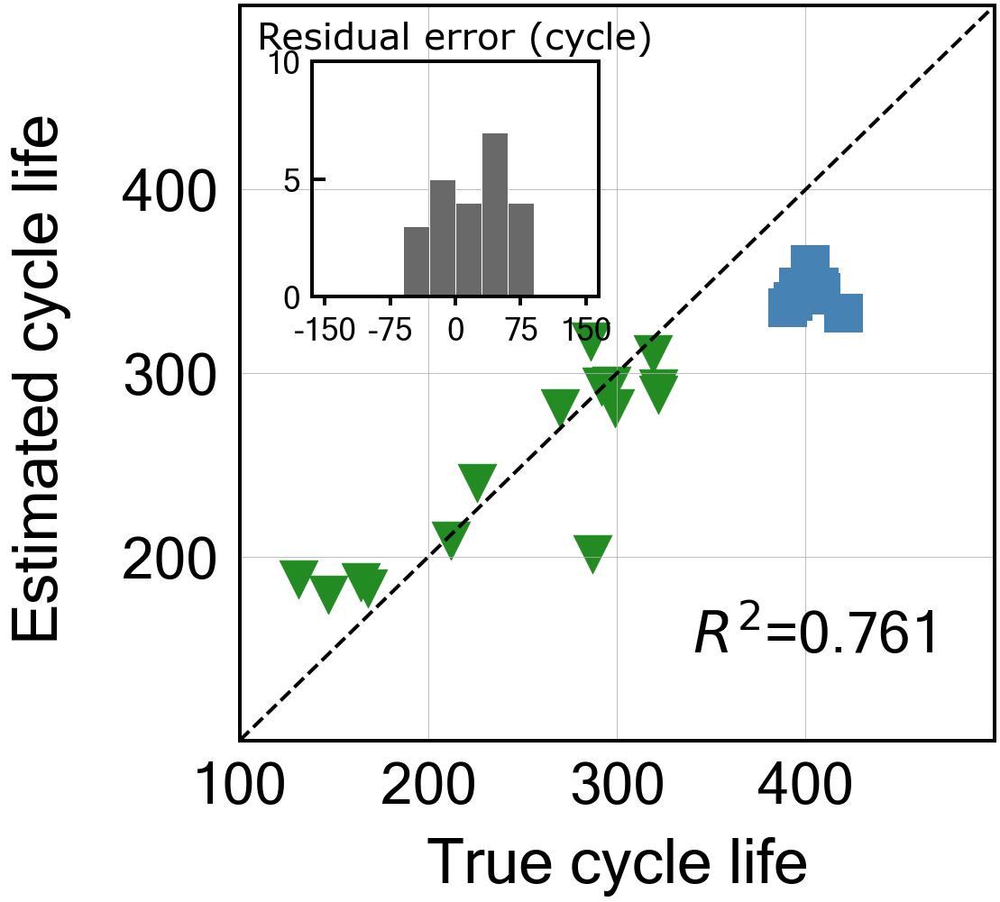

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to56')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.1
Best score obtained was: -52.971327298587845
Cycle no: Average_2to56
Coefficient:
T_V('Charge', 'Variance', 'Average_2to56') : -0.011838566353323378
T_V('Charge', 'Mean', 'Average_2to56') : 0.08673576478460708
T_V('Charge', 'Skewness', 'Average_2to56') : 0.17488976105375553
dTdV('Charge', 'Maximum', 'Average_2to56') : -0.0
dTdV('Charge', 'Mean', 'Average_2to56') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to56') : -0.01343923452935918

Intercept: 0.6202443280977313
MAE_all: 38.6
MAPE_all: 13.1 %
RMSE_all: 47.1
RMSPE_all: 16.3 %
MAE_train: 24.7
MAPE_train: 11.5 %
RMSE_train: 32.9
RMSPE_train: 16.4 %
MAE_test: 64.7
MAPE_test: 16.0 %
RMSE_test: 66.0
RMSPE_test: 16.3 %
R2 normal-scale scores
All data r2-score: 0.728
Train data r2-score: 0.752
Test data r2-score: -52.971

Normal-scale scores


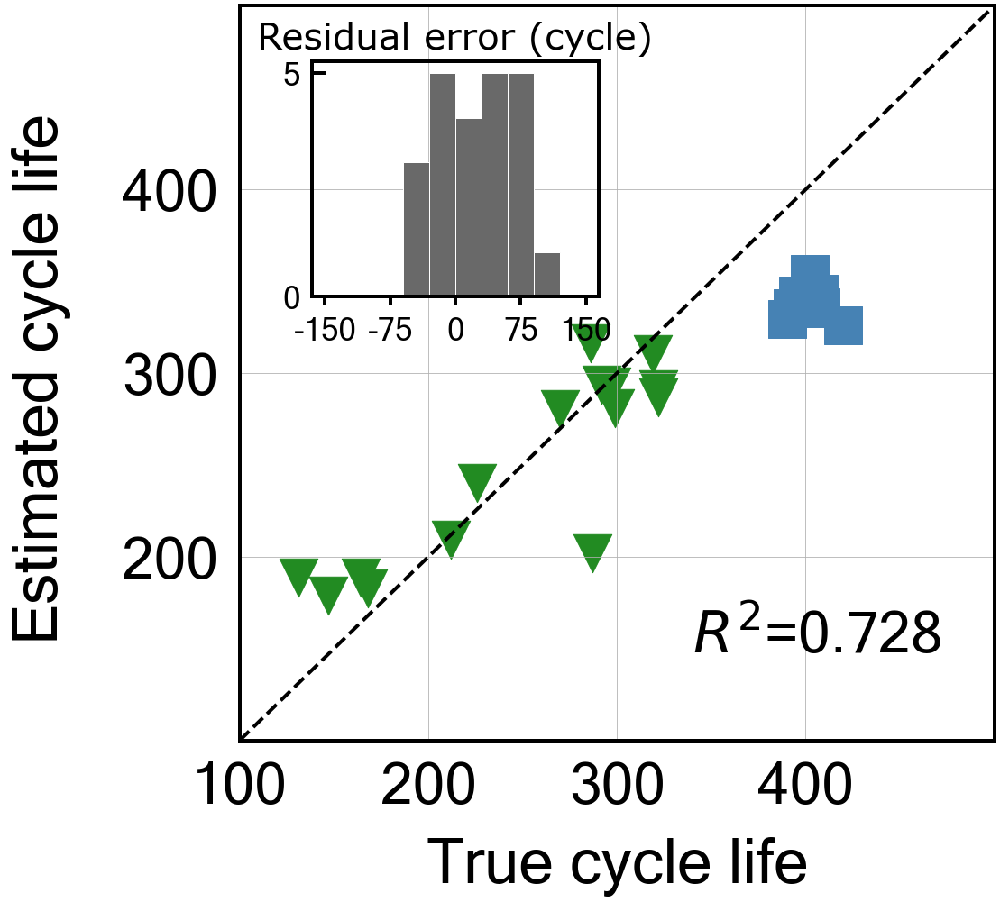

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to57')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -41.091463770779214
Cycle no: Average_2to57
Coefficient:
T_V('Charge', 'Variance', 'Average_2to57') : -0.014789525479779455
T_V('Charge', 'Mean', 'Average_2to57') : 0.0836175573274087
T_V('Charge', 'Skewness', 'Average_2to57') : 0.18324859251991604
dTdV('Charge', 'Maximum', 'Average_2to57') : -0.0
dTdV('Charge', 'Mean', 'Average_2to57') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to57') : -0.012748506167111652

Intercept: 0.6202443280977309
MAE_all: 35.6
MAPE_all: 12.3 %
RMSE_all: 43.3
RMSPE_all: 15.5 %
MAE_train: 24.3
MAPE_train: 11.3 %
RMSE_train: 32.6
RMSPE_train: 16.1 %
MAE_test: 56.9
MAPE_test: 14.1 %
RMSE_test: 58.3
RMSPE_test: 14.4 %
R2 normal-scale scores
All data r2-score: 0.771
Train data r2-score: 0.756
Test data r2-score: -41.091

Normal-scale scores


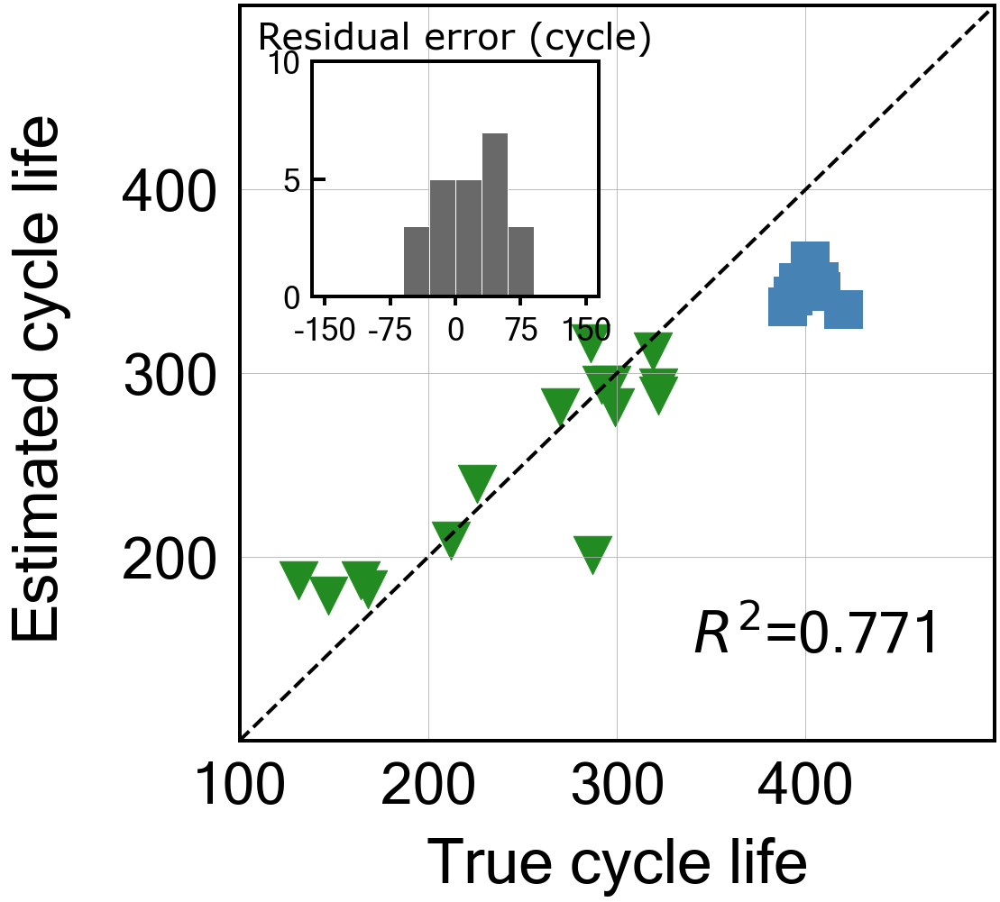

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to58')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.1
Best score obtained was: -39.48676442928877
Cycle no: Average_2to58
Coefficient:
T_V('Charge', 'Variance', 'Average_2to58') : -0.01339448641999533
T_V('Charge', 'Mean', 'Average_2to58') : 0.08474118427874883
T_V('Charge', 'Skewness', 'Average_2to58') : 0.18597107350439498
dTdV('Charge', 'Maximum', 'Average_2to58') : -0.0
dTdV('Charge', 'Mean', 'Average_2to58') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to58') : -0.0030177937241701903

Intercept: 0.6202443280977312
MAE_all: 35.4
MAPE_all: 12.2 %
RMSE_all: 42.9
RMSPE_all: 15.6 %
MAE_train: 24.4
MAPE_train: 11.4 %
RMSE_train: 32.8
RMSPE_train: 16.3 %
MAE_test: 55.9
MAPE_test: 13.8 %
RMSE_test: 57.2
RMSPE_test: 14.1 %
R2 normal-scale scores
All data r2-score: 0.775
Train data r2-score: 0.754
Test data r2-score: -39.487

Normal-scale scores


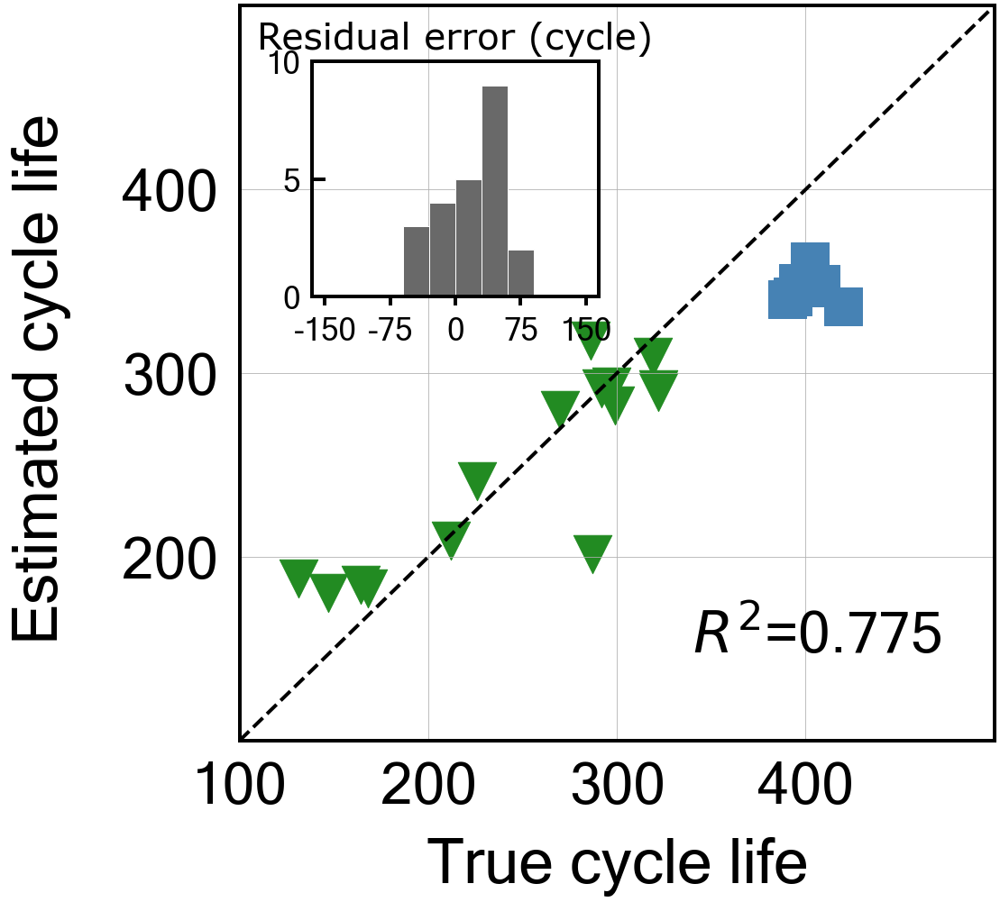

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to59')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -33.972881019154634
Cycle no: Average_2to59
Coefficient:
T_V('Charge', 'Variance', 'Average_2to59') : -0.016169789685980682
T_V('Charge', 'Mean', 'Average_2to59') : 0.09057677840627837
T_V('Charge', 'Skewness', 'Average_2to59') : 0.18548588712905384
dTdV('Charge', 'Maximum', 'Average_2to59') : -0.0
dTdV('Charge', 'Mean', 'Average_2to59') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to59') : -0.0008786377753307483

Intercept: 0.6202443280977314
MAE_all: 33.8
MAPE_all: 11.8 %
RMSE_all: 40.9
RMSPE_all: 15.1 %
MAE_train: 24.1
MAPE_train: 11.2 %
RMSE_train: 32.6
RMSPE_train: 16.1 %
MAE_test: 51.8
MAPE_test: 12.8 %
RMSE_test: 53.1
RMSPE_test: 13.1 %
R2 normal-scale scores
All data r2-score: 0.795
Train data r2-score: 0.757
Test data r2-score: -33.973

Normal-scale score

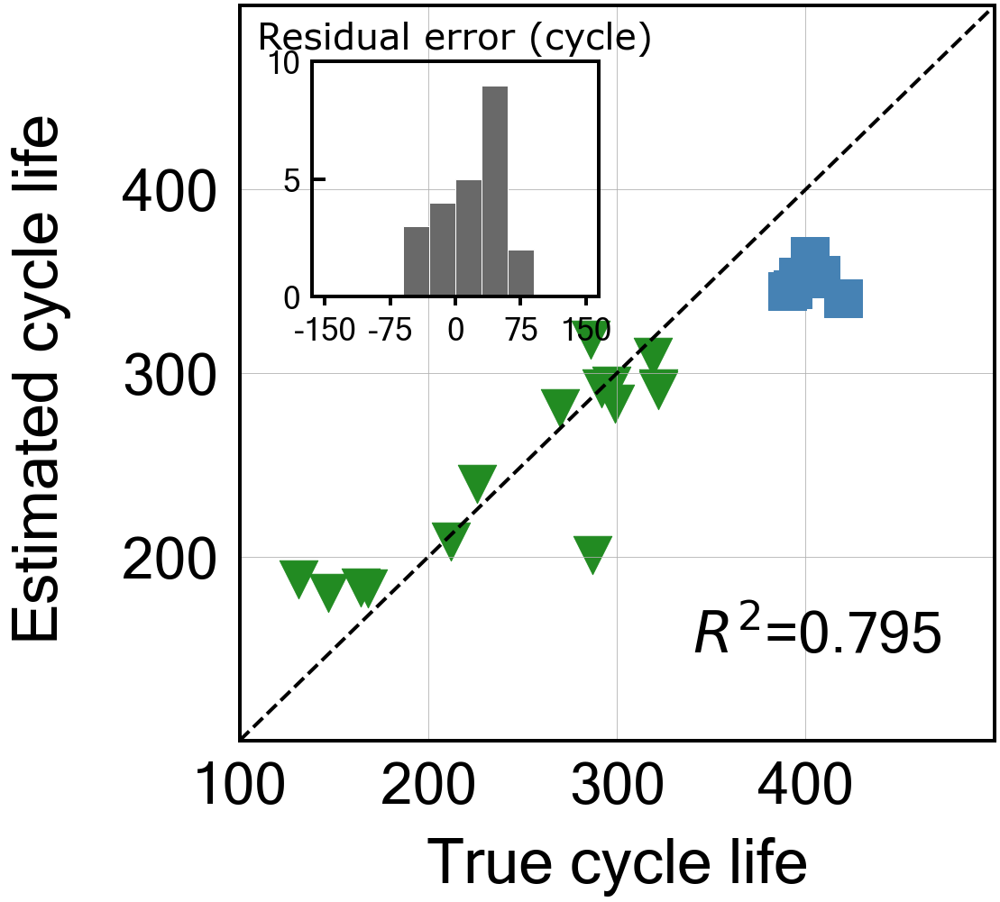

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to60')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -21.52784057116128
Cycle no: Average_2to60
Coefficient:
T_V('Charge', 'Variance', 'Average_2to60') : -0.0231795813341464
T_V('Charge', 'Mean', 'Average_2to60') : 0.09239788387790346
T_V('Charge', 'Skewness', 'Average_2to60') : 0.18884670773007
dTdV('Charge', 'Maximum', 'Average_2to60') : -0.0
dTdV('Charge', 'Mean', 'Average_2to60') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to60') : -0.004298348103246738

Intercept: 0.6202443280977317
MAE_all: 29.7
MAPE_all: 10.7 %
RMSE_all: 36.2
RMSPE_all: 14.1 %
MAE_train: 23.6
MAPE_train: 11.0 %
RMSE_train: 32.2
RMSPE_train: 15.7 %
MAE_test: 41.1
MAPE_test: 10.2 %
RMSE_test: 42.6
RMSPE_test: 10.5 %
R2 normal-scale scores
All data r2-score: 0.840
Train data r2-score: 0.763
Test data r2-score: -21.528

Normal-scale scores
All d

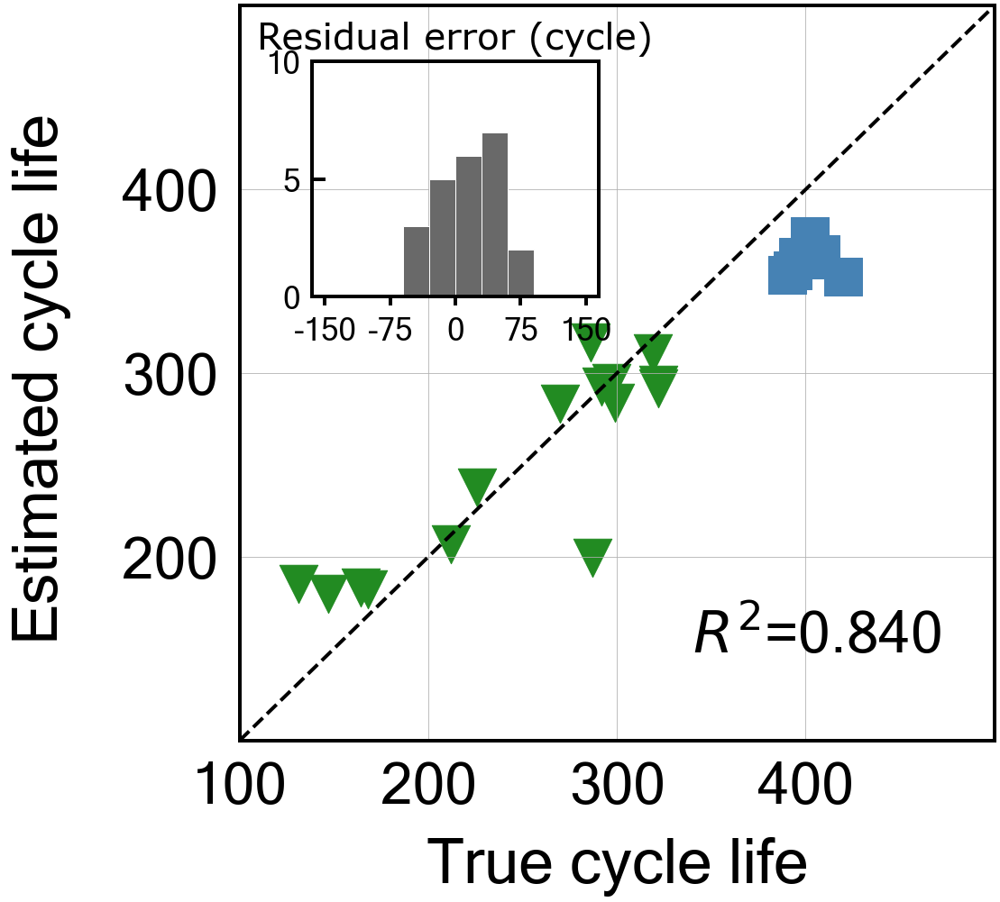

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to61')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.7
Best score obtained was: -18.834596852730705
Cycle no: Average_2to61
Coefficient:
T_V('Charge', 'Variance', 'Average_2to61') : -0.025454922064701176
T_V('Charge', 'Mean', 'Average_2to61') : 0.09515079198751514
T_V('Charge', 'Skewness', 'Average_2to61') : 0.18759922677448798
dTdV('Charge', 'Maximum', 'Average_2to61') : -0.0
dTdV('Charge', 'Mean', 'Average_2to61') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to61') : -0.004858876079525132

Intercept: 0.6202443280977312
MAE_all: 28.6
MAPE_all: 10.4 %
RMSE_all: 35.0
RMSPE_all: 13.9 %
MAE_train: 23.4
MAPE_train: 10.9 %
RMSE_train: 32.1
RMSPE_train: 15.6 %
MAE_test: 38.5
MAPE_test: 9.5 %
RMSE_test: 40.0
RMSPE_test: 9.8 %
R2 normal-scale scores
All data r2-score: 0.850
Train data r2-score: 0.764
Test data r2-score: -18.835

Normal-scale scores
A

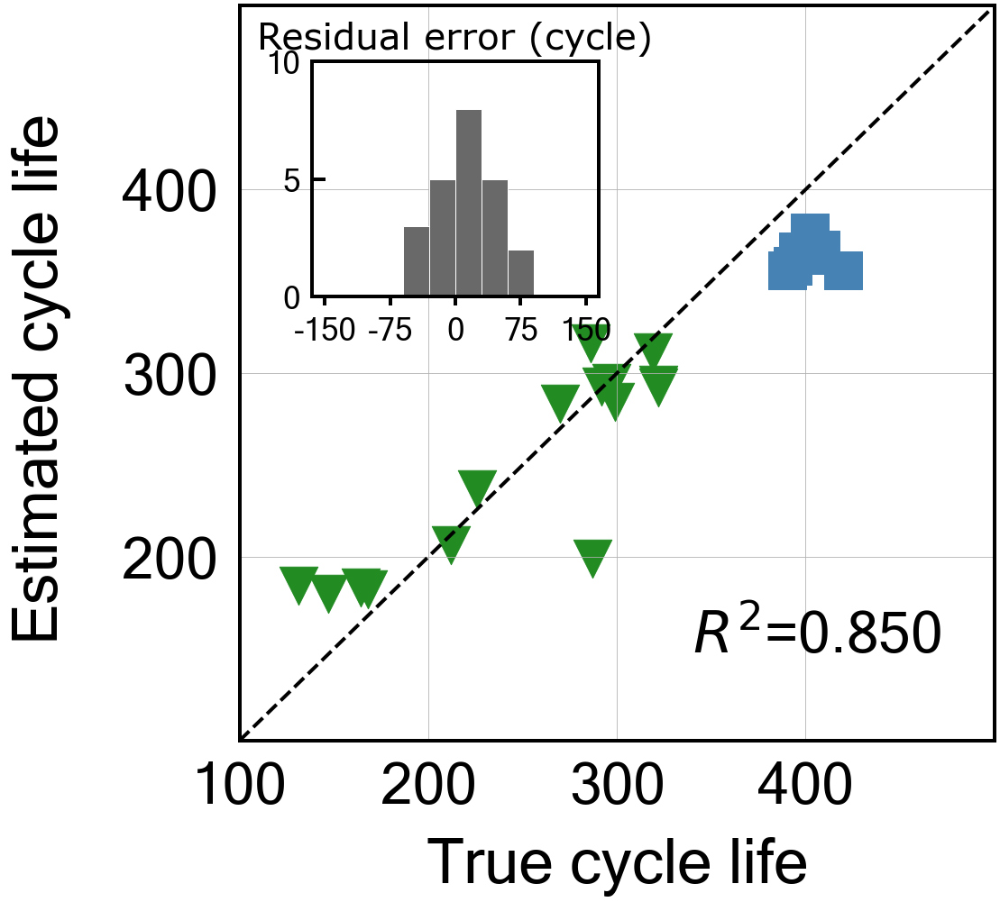

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to62')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.3
Best score obtained was: -19.69576091966953
Cycle no: Average_2to62
Coefficient:
T_V('Charge', 'Variance', 'Average_2to62') : -0.025857772713551393
T_V('Charge', 'Mean', 'Average_2to62') : 0.09368515405868764
T_V('Charge', 'Skewness', 'Average_2to62') : 0.1864650123728988
dTdV('Charge', 'Maximum', 'Average_2to62') : -0.0
dTdV('Charge', 'Mean', 'Average_2to62') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to62') : -0.009391696832126052

Intercept: 0.6202443280977316
MAE_all: 28.9
MAPE_all: 10.5 %
RMSE_all: 35.4
RMSPE_all: 13.9 %
MAE_train: 23.4
MAPE_train: 10.9 %
RMSE_train: 32.0
RMSPE_train: 15.6 %
MAE_test: 39.3
MAPE_test: 9.7 %
RMSE_test: 40.9
RMSPE_test: 10.1 %
R2 normal-scale scores
All data r2-score: 0.847
Train data r2-score: 0.765
Test data r2-score: -19.696

Normal-scale scores
Al

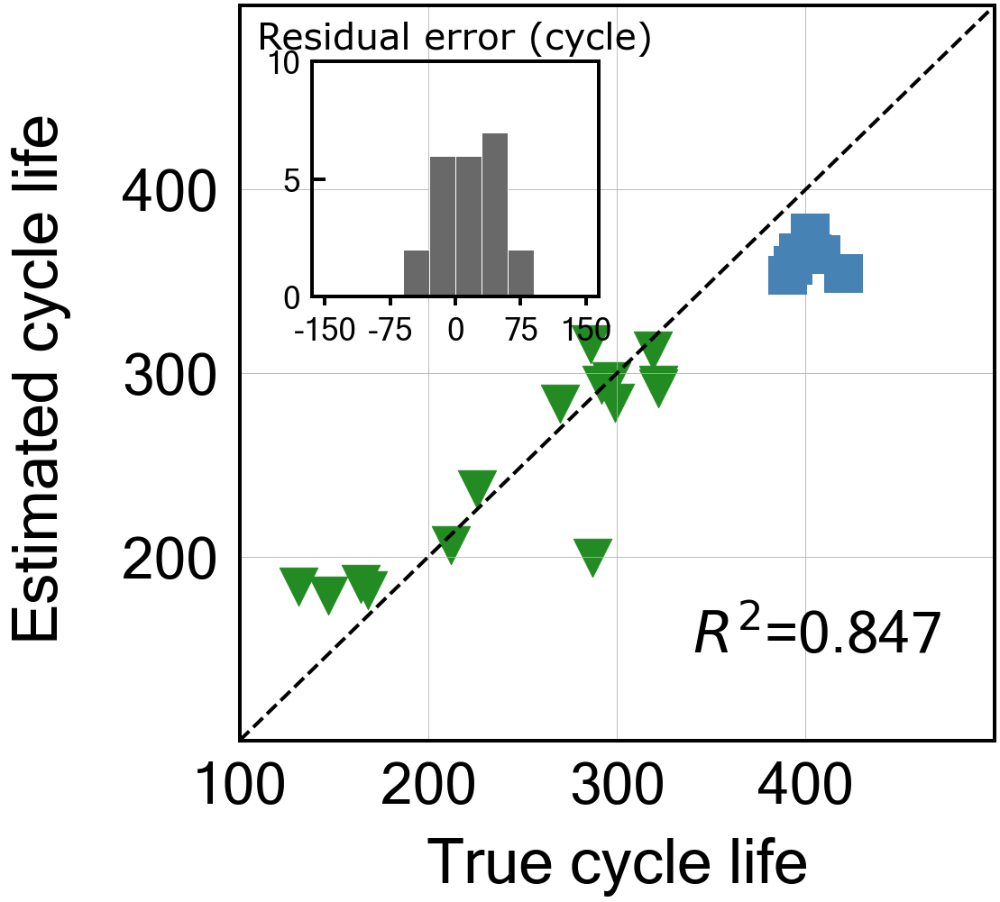

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to63')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.5
Best score obtained was: -23.592934139604353
Cycle no: Average_2to63
Coefficient:
T_V('Charge', 'Variance', 'Average_2to63') : -0.023246674432726464
T_V('Charge', 'Mean', 'Average_2to63') : 0.09548024785682745
T_V('Charge', 'Skewness', 'Average_2to63') : 0.18424852307997852
dTdV('Charge', 'Maximum', 'Average_2to63') : -0.0
dTdV('Charge', 'Mean', 'Average_2to63') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to63') : -0.0052599016957481605

Intercept: 0.6202443280977307
MAE_all: 30.4
MAPE_all: 10.9 %
RMSE_all: 36.9
RMSPE_all: 14.3 %
MAE_train: 23.6
MAPE_train: 11.0 %
RMSE_train: 32.2
RMSPE_train: 15.7 %
MAE_test: 43.1
MAPE_test: 10.7 %
RMSE_test: 44.6
RMSPE_test: 11.0 %
R2 normal-scale scores
All data r2-score: 0.833
Train data r2-score: 0.763
Test data r2-score: -23.593

Normal-scale score

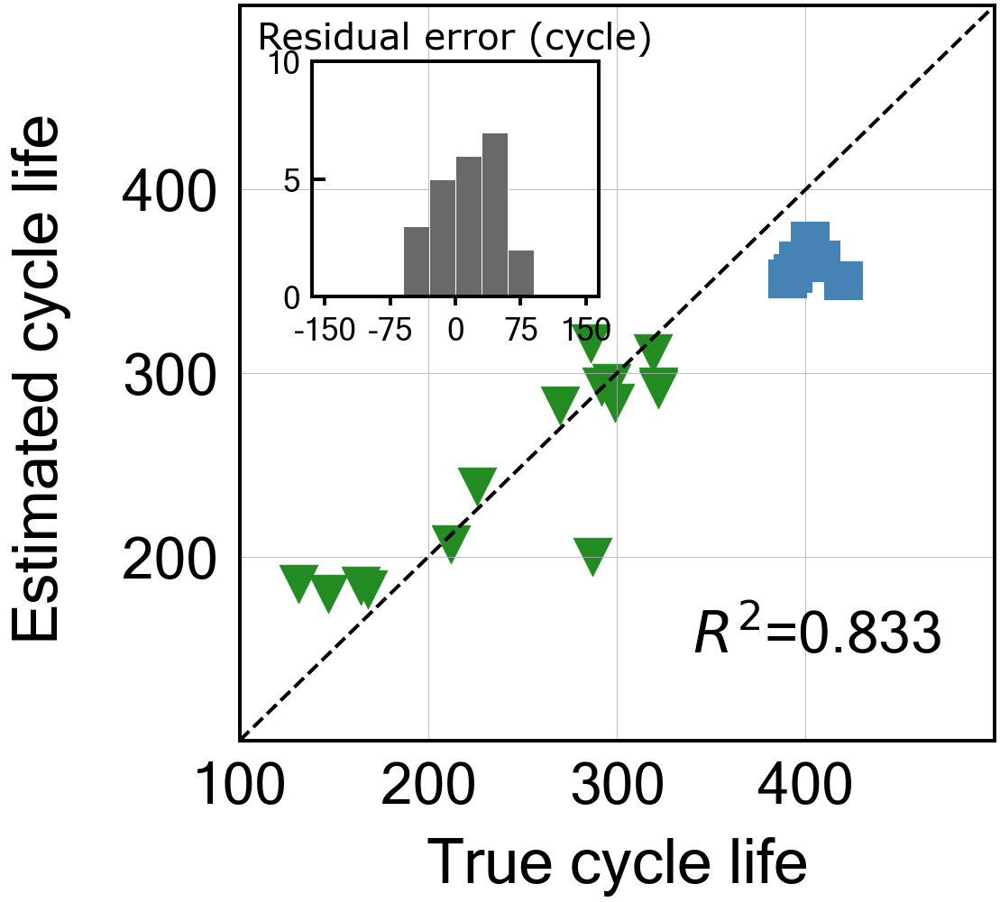

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to64')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.4
Best score obtained was: -24.272564323675983
Cycle no: Average_2to64
Coefficient:
T_V('Charge', 'Variance', 'Average_2to64') : -0.027117283334762658
T_V('Charge', 'Mean', 'Average_2to64') : 0.09782263879099534
T_V('Charge', 'Skewness', 'Average_2to64') : 0.17629282287757034
dTdV('Charge', 'Maximum', 'Average_2to64') : -0.0
dTdV('Charge', 'Mean', 'Average_2to64') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to64') : -0.016431798317116553

Intercept: 0.620244328097732
MAE_all: 30.5
MAPE_all: 10.9 %
RMSE_all: 37.2
RMSPE_all: 14.2 %
MAE_train: 23.5
MAPE_train: 10.9 %
RMSE_train: 32.1
RMSPE_train: 15.6 %
MAE_test: 43.6
MAPE_test: 10.8 %
RMSE_test: 45.2
RMSPE_test: 11.1 %
R2 normal-scale scores
All data r2-score: 0.831
Train data r2-score: 0.764
Test data r2-score: -24.273

Normal-scale scores


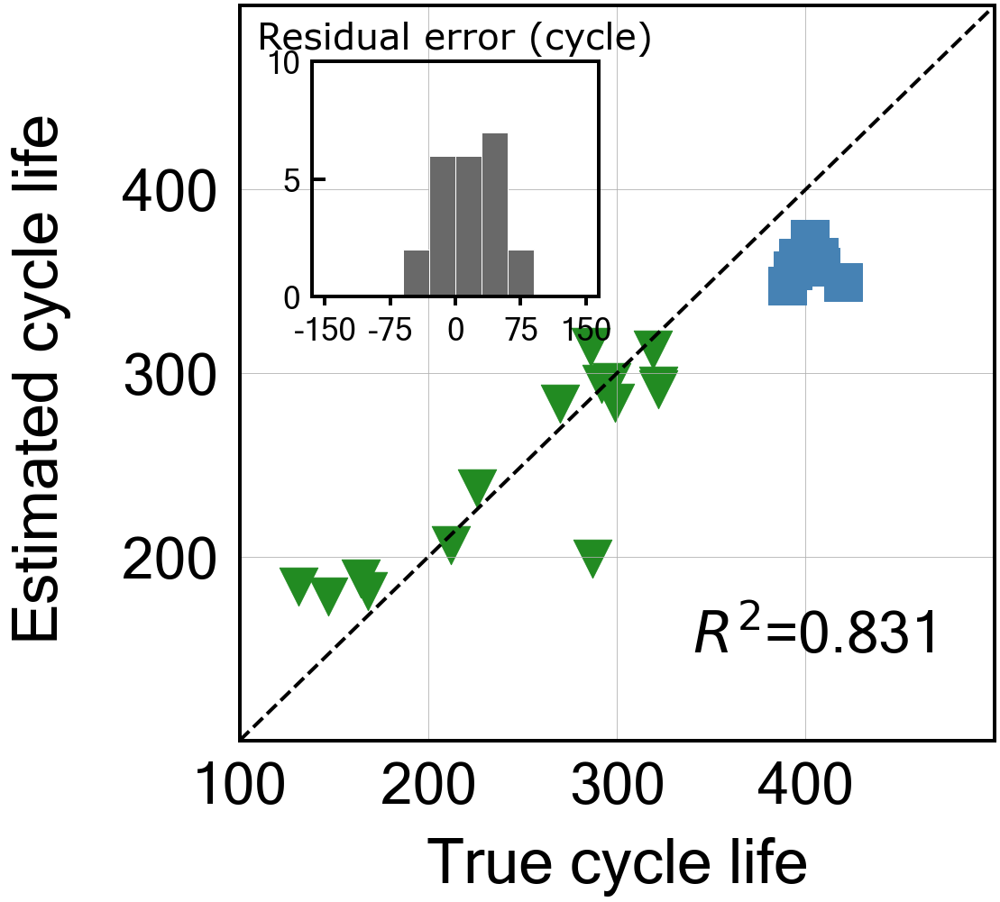

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to65')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -29.024733446366017
Cycle no: Average_2to65
Coefficient:
T_V('Charge', 'Variance', 'Average_2to65') : -0.02567410678210195
T_V('Charge', 'Mean', 'Average_2to65') : 0.09922250626949111
T_V('Charge', 'Skewness', 'Average_2to65') : 0.17193332835866793
dTdV('Charge', 'Maximum', 'Average_2to65') : -0.0
dTdV('Charge', 'Mean', 'Average_2to65') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to65') : -0.017443989303421135

Intercept: 0.620244328097731
MAE_all: 32.1
MAPE_all: 11.3 %
RMSE_all: 39.0
RMSPE_all: 14.6 %
MAE_train: 23.7
MAPE_train: 11.0 %
RMSE_train: 32.2
RMSPE_train: 15.7 %
MAE_test: 47.8
MAPE_test: 11.8 %
RMSE_test: 49.2
RMSPE_test: 12.1 %
R2 normal-scale scores
All data r2-score: 0.814
Train data r2-score: 0.763
Test data r2-score: -29.025

Normal-scale scores
A

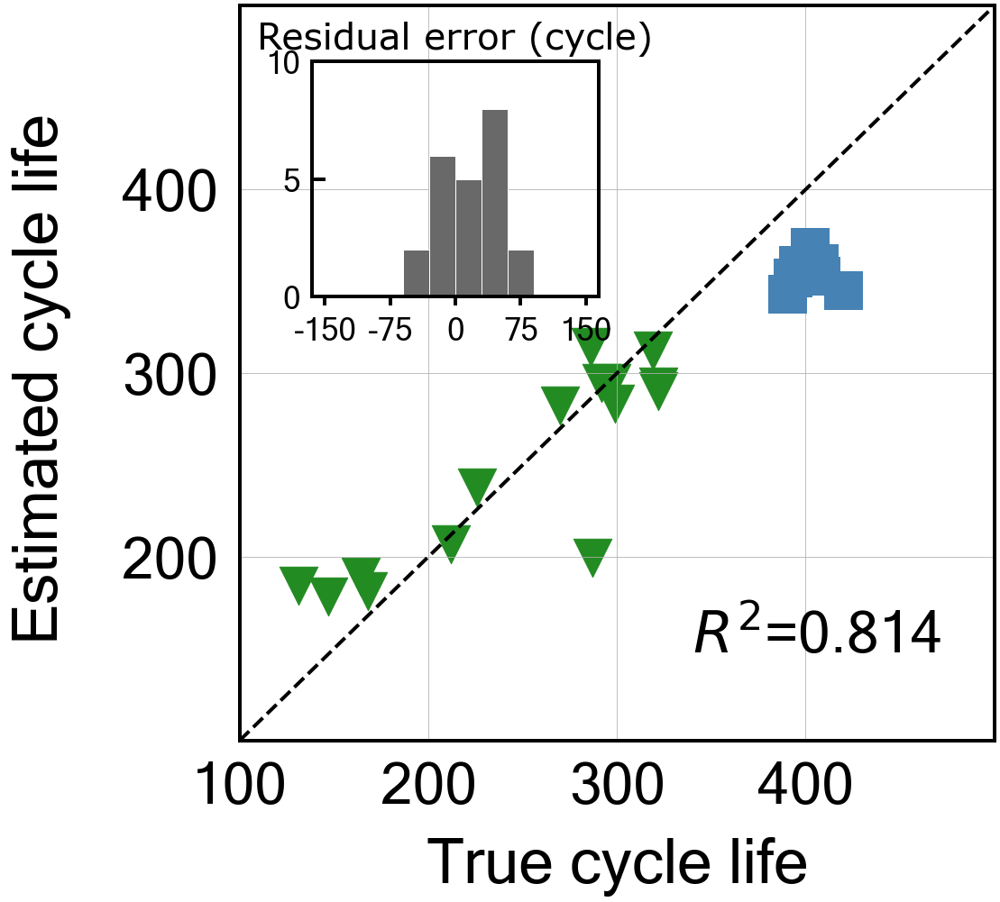

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to66')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -50.63739342067214
Cycle no: Average_2to66
Coefficient:
T_V('Charge', 'Variance', 'Average_2to66') : -0.015739269919439667
T_V('Charge', 'Mean', 'Average_2to66') : 0.09225320087128872
T_V('Charge', 'Skewness', 'Average_2to66') : 0.16802239587137144
dTdV('Charge', 'Maximum', 'Average_2to66') : -0.0
dTdV('Charge', 'Mean', 'Average_2to66') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to66') : -0.01647688656053713

Intercept: 0.6202443280977317
MAE_all: 38.0
MAPE_all: 12.9 %
RMSE_all: 46.4
RMSPE_all: 16.1 %
MAE_train: 24.5
MAPE_train: 11.4 %
RMSE_train: 32.8
RMSPE_train: 16.2 %
MAE_test: 63.2
MAPE_test: 15.7 %
RMSE_test: 64.6
RMSPE_test: 15.9 %
R2 normal-scale scores
All data r2-score: 0.737
Train data r2-score: 0.754
Test data r2-score: -50.637

Normal-scale scores
A

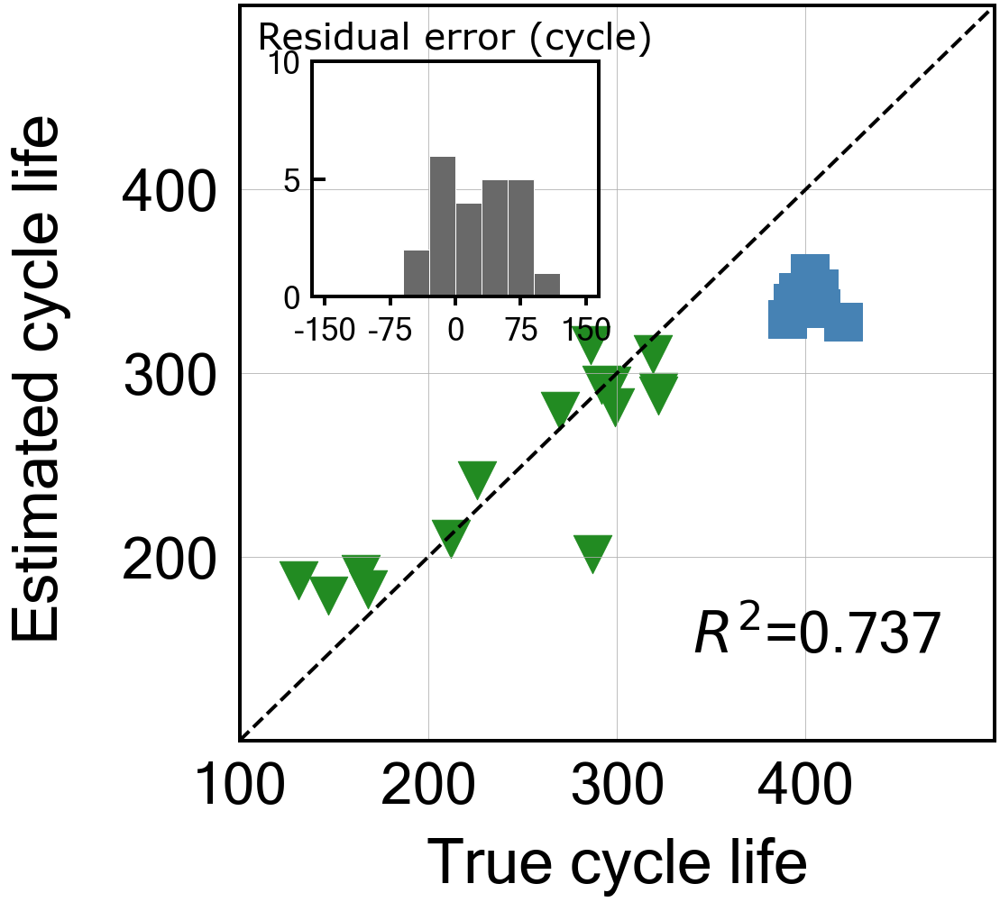

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to67')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.4
Best score obtained was: -18.761309244523577
Cycle no: Average_2to67
Coefficient:
T_V('Charge', 'Variance', 'Average_2to67') : -0.027465771429789648
T_V('Charge', 'Mean', 'Average_2to67') : 0.09701934391768961
T_V('Charge', 'Skewness', 'Average_2to67') : 0.1833852078446676
dTdV('Charge', 'Maximum', 'Average_2to67') : -0.0
dTdV('Charge', 'Mean', 'Average_2to67') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to67') : -0.010219696622676189

Intercept: 0.6202443280977322
MAE_all: 28.5
MAPE_all: 10.4 %
RMSE_all: 34.9
RMSPE_all: 13.8 %
MAE_train: 23.3
MAPE_train: 10.8 %
RMSE_train: 32.0
RMSPE_train: 15.5 %
MAE_test: 38.4
MAPE_test: 9.5 %
RMSE_test: 39.9
RMSPE_test: 9.8 %
R2 normal-scale scores
All data r2-score: 0.851
Train data r2-score: 0.766
Test data r2-score: -18.761

Normal-scale scores
Al

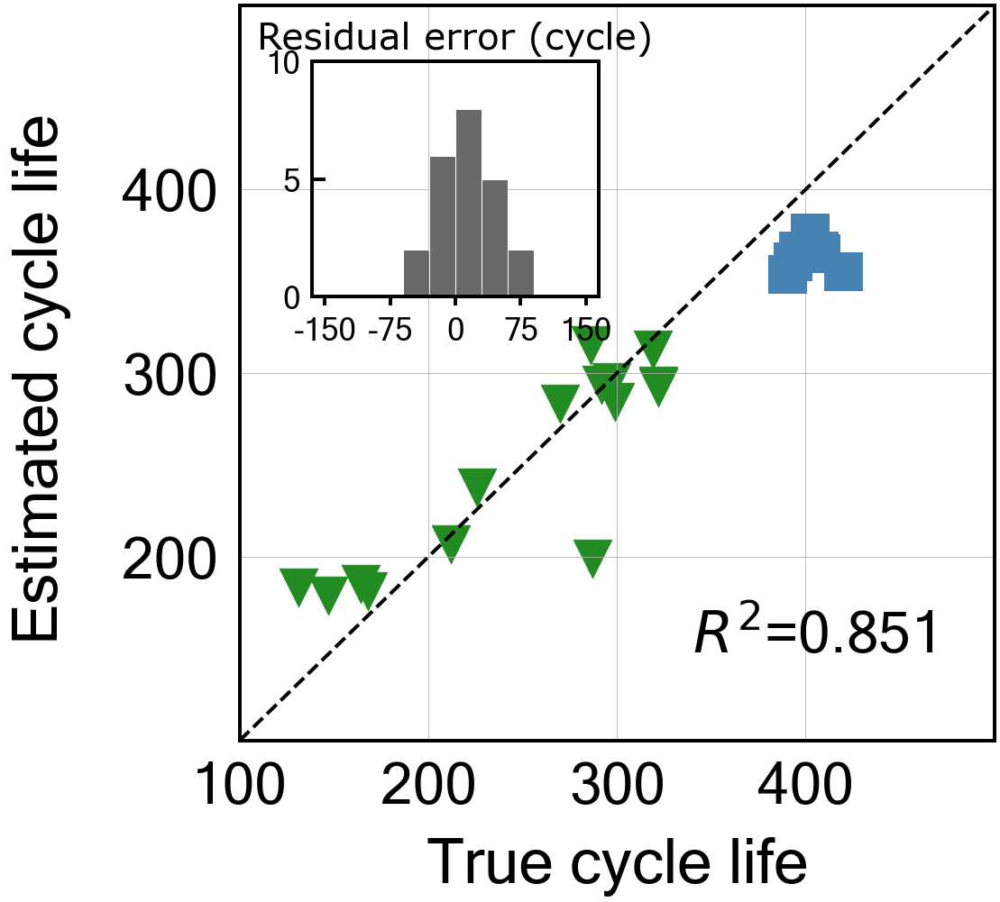

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to68')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.9
Best score obtained was: -34.18927537789379
Cycle no: Average_2to68
Coefficient:
T_V('Charge', 'Variance', 'Average_2to68') : -0.02349260533027495
T_V('Charge', 'Mean', 'Average_2to68') : 0.09966804888772367
T_V('Charge', 'Skewness', 'Average_2to68') : 0.16888259749810197
dTdV('Charge', 'Maximum', 'Average_2to68') : -0.0
dTdV('Charge', 'Mean', 'Average_2to68') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to68') : -0.017847851283152923

Intercept: 0.6202443280977312
MAE_all: 33.6
MAPE_all: 11.7 %
RMSE_all: 40.8
RMSPE_all: 14.9 %
MAE_train: 23.8
MAPE_train: 11.1 %
RMSE_train: 32.3
RMSPE_train: 15.8 %
MAE_test: 51.8
MAPE_test: 12.8 %
RMSE_test: 53.3
RMSPE_test: 13.1 %
R2 normal-scale scores
All data r2-score: 0.796
Train data r2-score: 0.761
Test data r2-score: -34.189

Normal-scale scores
A

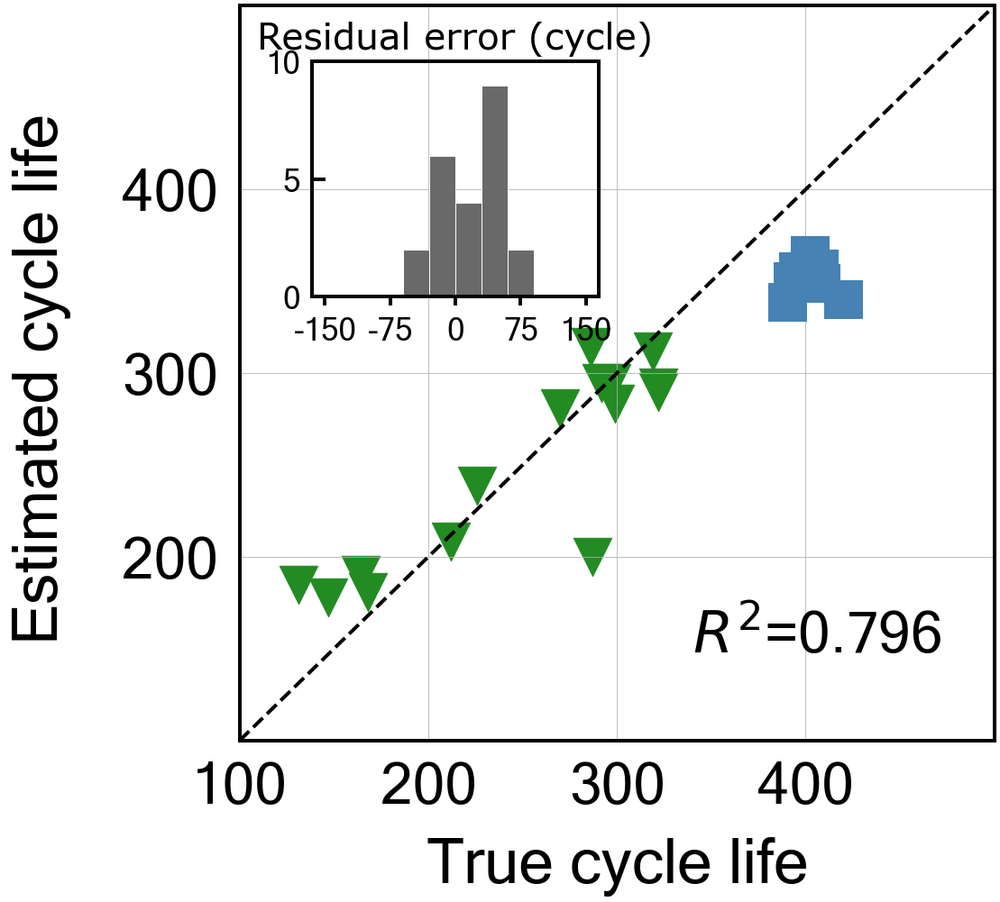

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to69')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.8
Best score obtained was: -58.59287504322188
Cycle no: Average_2to69
Coefficient:
T_V('Charge', 'Variance', 'Average_2to69') : -0.015066253905806177
T_V('Charge', 'Mean', 'Average_2to69') : 0.09409701929336708
T_V('Charge', 'Skewness', 'Average_2to69') : 0.16071175048166444
dTdV('Charge', 'Maximum', 'Average_2to69') : -0.0
dTdV('Charge', 'Mean', 'Average_2to69') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to69') : -0.02193334197349646

Intercept: 0.6202443280977307
MAE_all: 39.7
MAPE_all: 13.3 %
RMSE_all: 48.8
RMSPE_all: 16.5 %
MAE_train: 24.6
MAPE_train: 11.5 %
RMSE_train: 32.9
RMSPE_train: 16.2 %
MAE_test: 68.0
MAPE_test: 16.8 %
RMSE_test: 69.4
RMSPE_test: 17.1 %
R2 normal-scale scores
All data r2-score: 0.709
Train data r2-score: 0.753
Test data r2-score: -58.593

Normal-scale scores
A

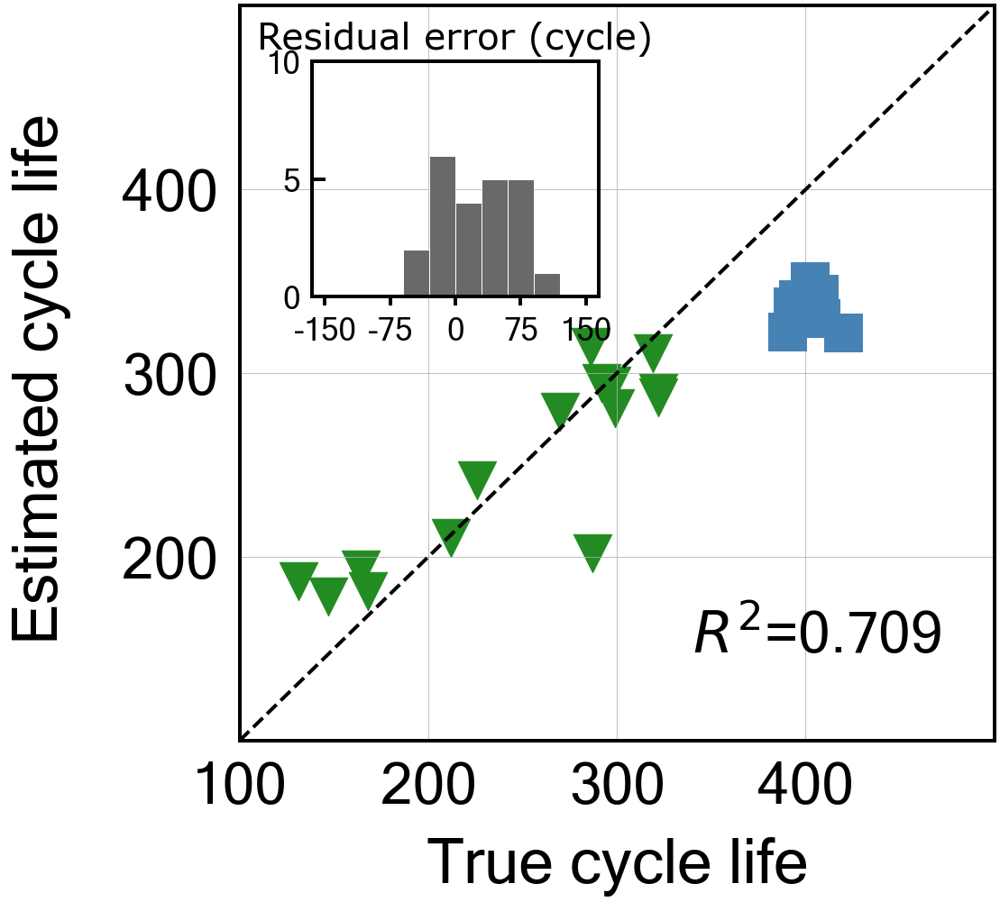

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to70')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.1
Best score obtained was: -65.57534142305826
Cycle no: Average_2to70
Coefficient:
T_V('Charge', 'Variance', 'Average_2to70') : -0.014293300557771647
T_V('Charge', 'Mean', 'Average_2to70') : 0.09609726693292525
T_V('Charge', 'Skewness', 'Average_2to70') : 0.15518821213701126
dTdV('Charge', 'Maximum', 'Average_2to70') : -0.0
dTdV('Charge', 'Mean', 'Average_2to70') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to70') : -0.02347680234285062

Intercept: 0.6202443280977316
MAE_all: 41.2
MAPE_all: 13.7 %
RMSE_all: 50.8
RMSPE_all: 17.0 %
MAE_train: 24.8
MAPE_train: 11.6 %
RMSE_train: 33.0
RMSPE_train: 16.3 %
MAE_test: 71.9
MAPE_test: 17.8 %
RMSE_test: 73.3
RMSPE_test: 18.1 %
R2 normal-scale scores
All data r2-score: 0.684
Train data r2-score: 0.750
Test data r2-score: -65.575

Normal-scale scores
A

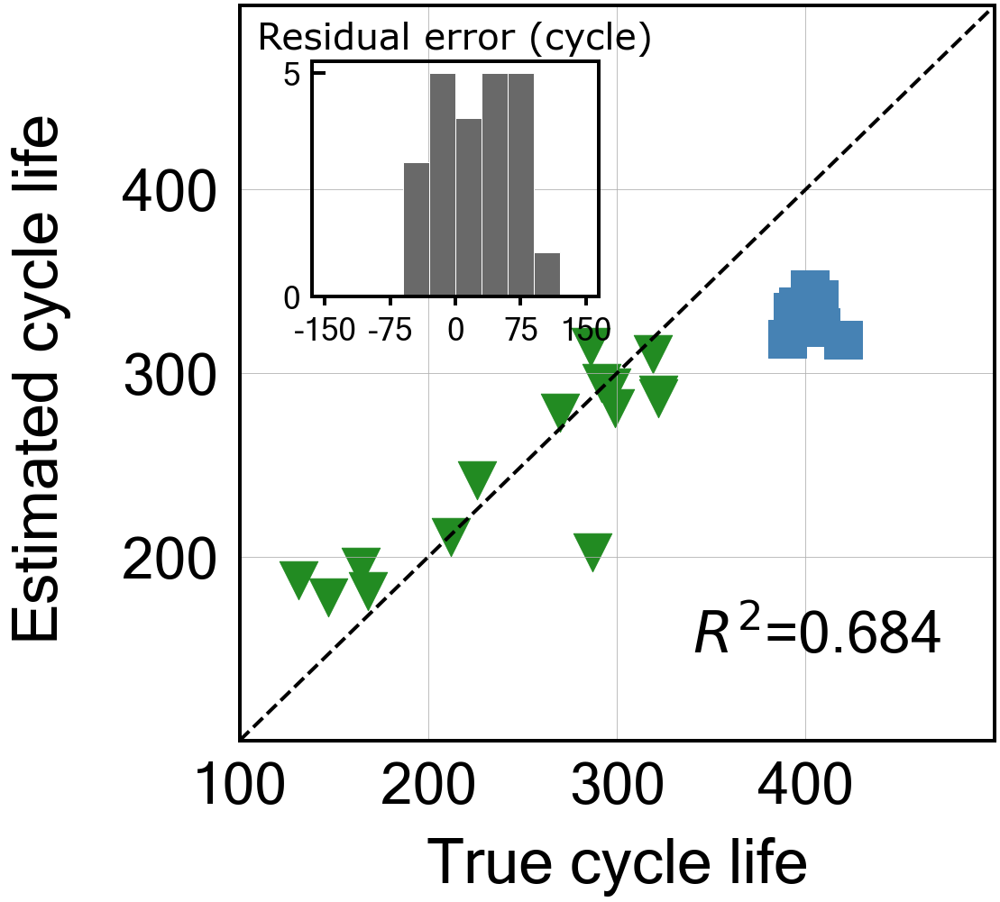

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to71')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.6
Best score obtained was: -52.42476497206006
Cycle no: Average_2to71
Coefficient:
T_V('Charge', 'Variance', 'Average_2to71') : -0.021866134273700842
T_V('Charge', 'Mean', 'Average_2to71') : 0.09769076977003287
T_V('Charge', 'Skewness', 'Average_2to71') : 0.1529946400308244
dTdV('Charge', 'Maximum', 'Average_2to71') : -0.0
dTdV('Charge', 'Mean', 'Average_2to71') : -0.0
dTdV('Charge', 'Kurtosis', 'Average_2to71') : -0.033929661052615696

Intercept: 0.6202443280977312
MAE_all: 38.1
MAPE_all: 12.9 %
RMSE_all: 46.8
RMSPE_all: 16.0 %
MAE_train: 24.3
MAPE_train: 11.3 %
RMSE_train: 32.5
RMSPE_train: 15.9 %
MAE_test: 64.1
MAPE_test: 15.9 %
RMSE_test: 65.7
RMSPE_test: 16.2 %
R2 normal-scale scores
All data r2-score: 0.732
Train data r2-score: 0.758
Test data r2-score: -52.425

Normal-scale scores
A

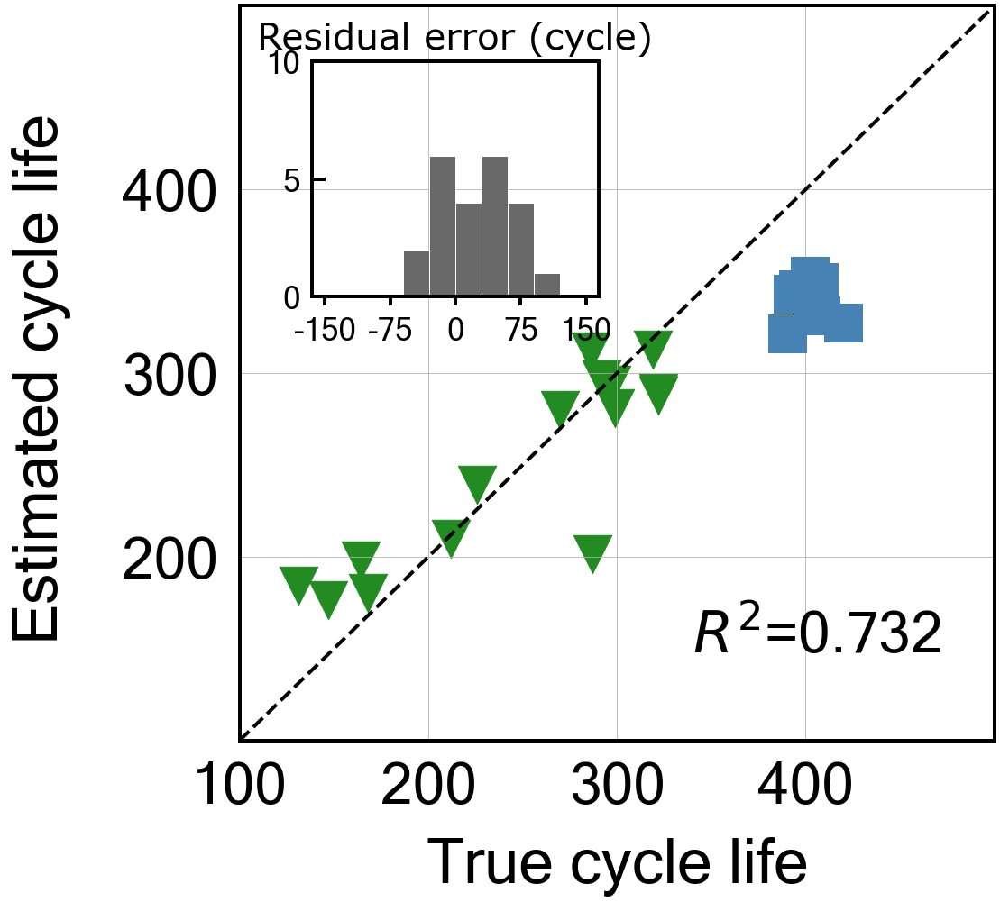

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to72')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -62.11324837595537
Cycle no: Average_2to72
Coefficient:
T_V('Charge', 'Variance', 'Average_2to72') : -0.02212319681419187
T_V('Charge', 'Mean', 'Average_2to72') : 0.09786289185551295
T_V('Charge', 'Skewness', 'Average_2to72') : 0.14036829051702515
dTdV('Charge', 'Maximum', 'Average_2to72') : 0.0
dTdV('Charge', 'Mean', 'Average_2to72') : -0.001808208761415583
dTdV('Charge', 'Kurtosis', 'Average_2to72') : -0.04750159473885037

Intercept: 0.6202443280977319
MAE_all: 39.8
MAPE_all: 13.3 %
RMSE_all: 49.6
RMSPE_all: 16.6 %
MAE_train: 24.1
MAPE_train: 11.3 %
RMSE_train: 32.5
RMSPE_train: 16.0 %
MAE_test: 69.4
MAPE_test: 17.2 %
RMSE_test: 71.4
RMSPE_test: 17.6 %
R2 normal-scale scores
All data r2-score: 0.699
Train data r2-score: 0.758
Test data r2-score: -62.113

Normal

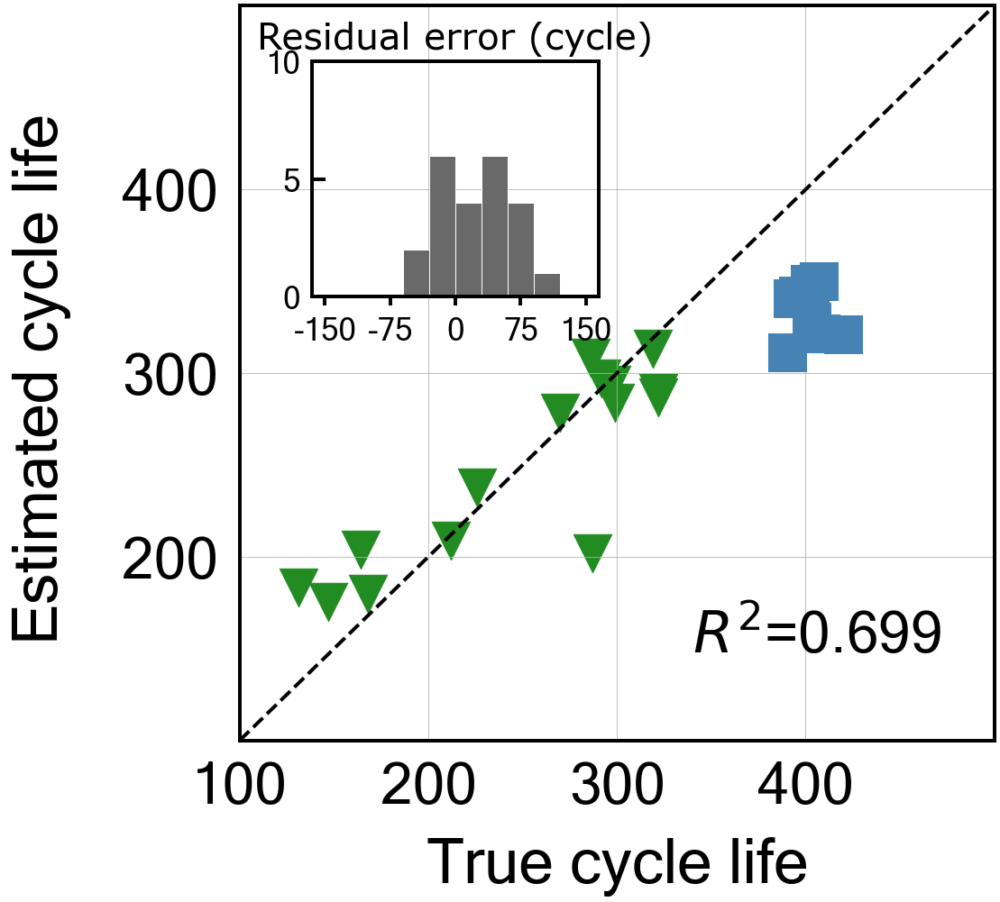

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to73')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -60.333440635229834
Cycle no: Average_2to73
Coefficient:
T_V('Charge', 'Variance', 'Average_2to73') : -0.02261581258935569
T_V('Charge', 'Mean', 'Average_2to73') : 0.09481960106011199
T_V('Charge', 'Skewness', 'Average_2to73') : 0.13922016277033636
dTdV('Charge', 'Maximum', 'Average_2to73') : 0.0
dTdV('Charge', 'Mean', 'Average_2to73') : -0.002993225839122295
dTdV('Charge', 'Kurtosis', 'Average_2to73') : -0.05325975693730153

Intercept: 0.6202443280977311
MAE_all: 39.2
MAPE_all: 13.1 %
RMSE_all: 49.0
RMSPE_all: 16.4 %
MAE_train: 23.7
MAPE_train: 11.1 %
RMSE_train: 32.3
RMSPE_train: 15.8 %
MAE_test: 68.2
MAPE_test: 16.9 %
RMSE_test: 70.4
RMSPE_test: 17.4 %
R2 normal-scale scores
All data r2-score: 0.706
Train data r2-score: 0.760
Test data r2-score: -60.333

Norma

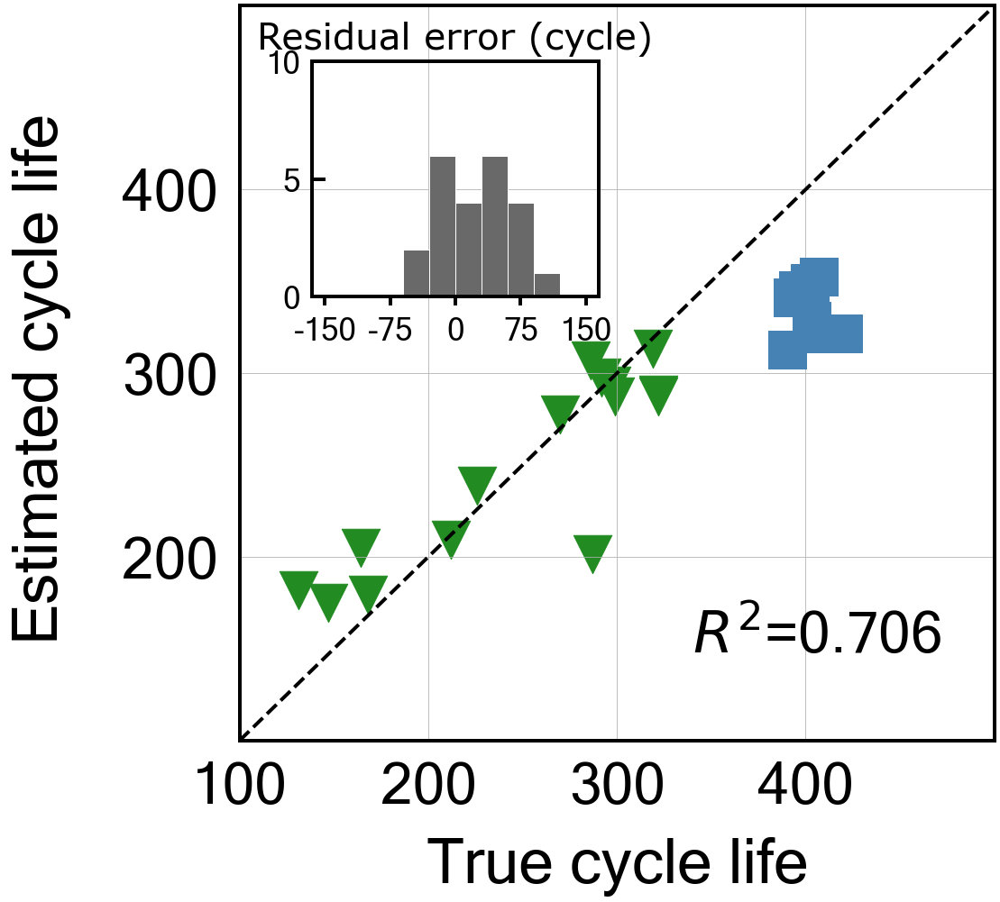

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to74')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -56.85341779601828
Cycle no: Average_2to74
Coefficient:
T_V('Charge', 'Variance', 'Average_2to74') : -0.02290728599905525
T_V('Charge', 'Mean', 'Average_2to74') : 0.09555799064024197
T_V('Charge', 'Skewness', 'Average_2to74') : 0.14311309922003485
dTdV('Charge', 'Maximum', 'Average_2to74') : -0.0
dTdV('Charge', 'Mean', 'Average_2to74') : -0.0013953421755933794
dTdV('Charge', 'Kurtosis', 'Average_2to74') : -0.04646026616435456

Intercept: 0.6202443280977309
MAE_all: 38.6
MAPE_all: 13.0 %
RMSE_all: 48.1
RMSPE_all: 16.3 %
MAE_train: 23.9
MAPE_train: 11.2 %
RMSE_train: 32.5
RMSPE_train: 15.9 %
MAE_test: 66.4
MAPE_test: 16.4 %
RMSE_test: 68.3
RMSPE_test: 16.9 %
R2 normal-scale scores
All data r2-score: 0.717
Train data r2-score: 0.758
Test data r2-score: -56.853

Norm

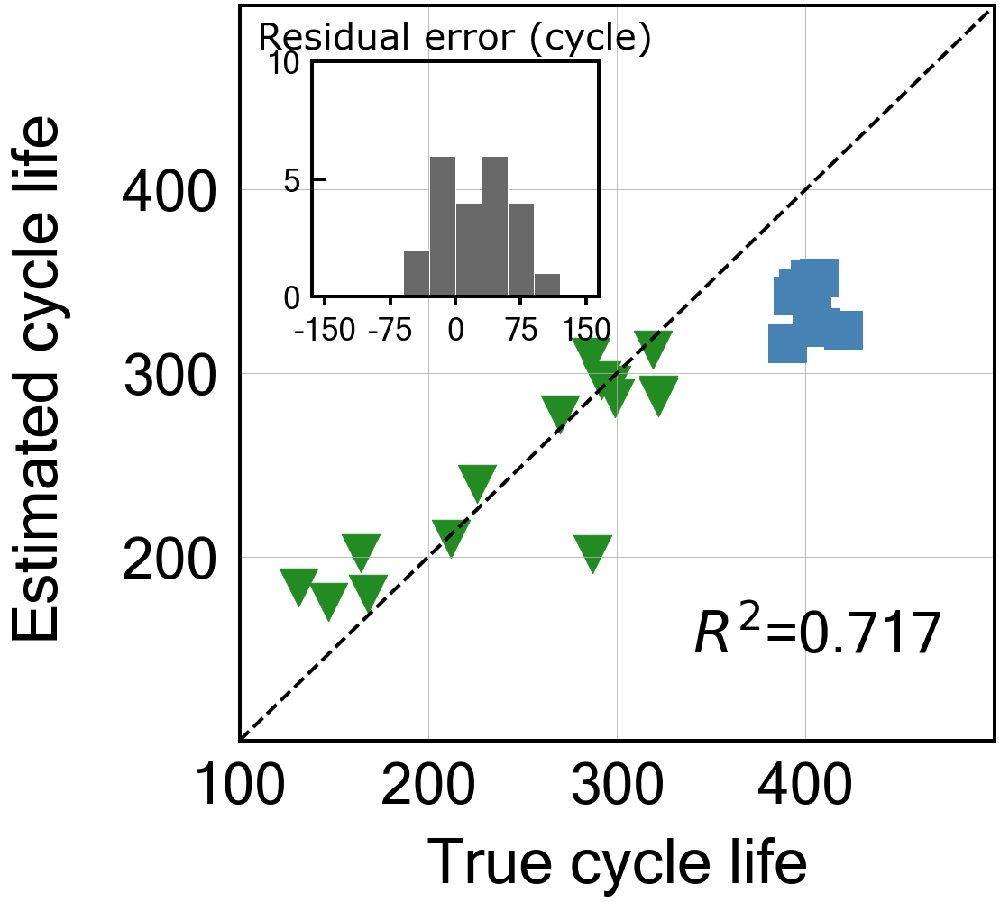

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to75')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.9
Best score obtained was: -54.989958613700644
Cycle no: Average_2to75
Coefficient:
T_V('Charge', 'Variance', 'Average_2to75') : -0.02359108256627565
T_V('Charge', 'Mean', 'Average_2to75') : 0.09474554403301765
T_V('Charge', 'Skewness', 'Average_2to75') : 0.14213575265754955
dTdV('Charge', 'Maximum', 'Average_2to75') : -0.0
dTdV('Charge', 'Mean', 'Average_2to75') : -0.0020809439132419756
dTdV('Charge', 'Kurtosis', 'Average_2to75') : -0.048956637672414365

Intercept: 0.6202443280977316
MAE_all: 38.3
MAPE_all: 12.9 %
RMSE_all: 47.5
RMSPE_all: 16.1 %
MAE_train: 23.9
MAPE_train: 11.2 %
RMSE_train: 32.4
RMSPE_train: 15.8 %
MAE_test: 65.3
MAPE_test: 16.2 %
RMSE_test: 67.2
RMSPE_test: 16.6 %
R2 normal-scale scores
All data r2-score: 0.724
Train data r2-score: 0.759
Test data r2-score: -54.990

No

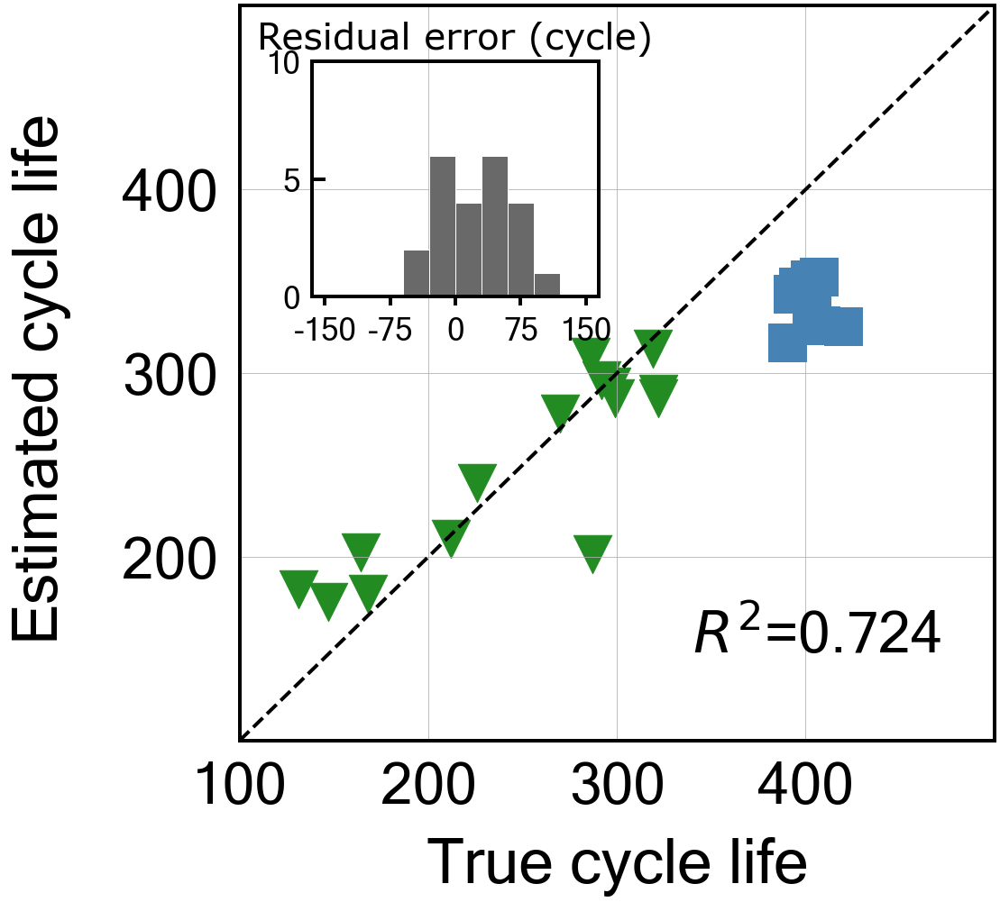

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to76')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.2
Best score obtained was: -60.10798922621884
Cycle no: Average_2to76
Coefficient:
T_V('Charge', 'Variance', 'Average_2to76') : -0.023181596287784028
T_V('Charge', 'Mean', 'Average_2to76') : 0.0922247998866337
T_V('Charge', 'Skewness', 'Average_2to76') : 0.13664615026225396
dTdV('Charge', 'Maximum', 'Average_2to76') : -0.0
dTdV('Charge', 'Mean', 'Average_2to76') : -0.0038714814968282074
dTdV('Charge', 'Kurtosis', 'Average_2to76') : -0.059962098544377285

Intercept: 0.6202443280977324
MAE_all: 38.9
MAPE_all: 13.0 %
RMSE_all: 48.9
RMSPE_all: 16.2 %
MAE_train: 23.4
MAPE_train: 11.0 %
RMSE_train: 32.1
RMSPE_train: 15.6 %
MAE_test: 67.9
MAPE_test: 16.8 %
RMSE_test: 70.2
RMSPE_test: 17.3 %
R2 normal-scale scores
All data r2-score: 0.708
Train data r2-score: 0.764
Test data r2-score: -60.108

Nor

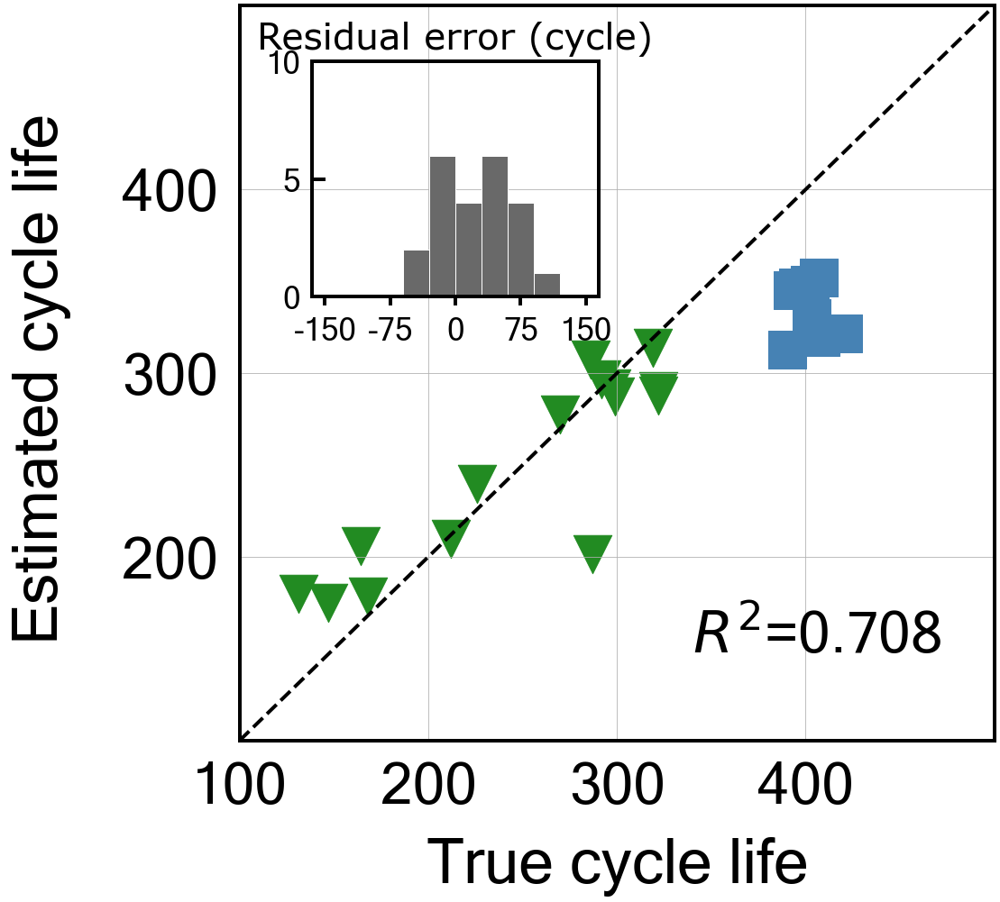

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to77')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -65.5392628726404
Cycle no: Average_2to77
Coefficient:
T_V('Charge', 'Variance', 'Average_2to77') : -0.02263682816436851
T_V('Charge', 'Mean', 'Average_2to77') : 0.08961452734740068
T_V('Charge', 'Skewness', 'Average_2to77') : 0.13401886941639868
dTdV('Charge', 'Maximum', 'Average_2to77') : -0.0
dTdV('Charge', 'Mean', 'Average_2to77') : -0.003612003902870118
dTdV('Charge', 'Kurtosis', 'Average_2to77') : -0.06585275109862494

Intercept: 0.6202443280977318
MAE_all: 39.7
MAPE_all: 13.2 %
RMSE_all: 50.3
RMSPE_all: 16.5 %
MAE_train: 23.1
MAPE_train: 10.8 %
RMSE_train: 31.8
RMSPE_train: 15.5 %
MAE_test: 70.9
MAPE_test: 17.6 %
RMSE_test: 73.3
RMSPE_test: 18.1 %
R2 normal-scale scores
All data r2-score: 0.691
Train data r2-score: 0.768
Test data r2-score: -65.539

Normal

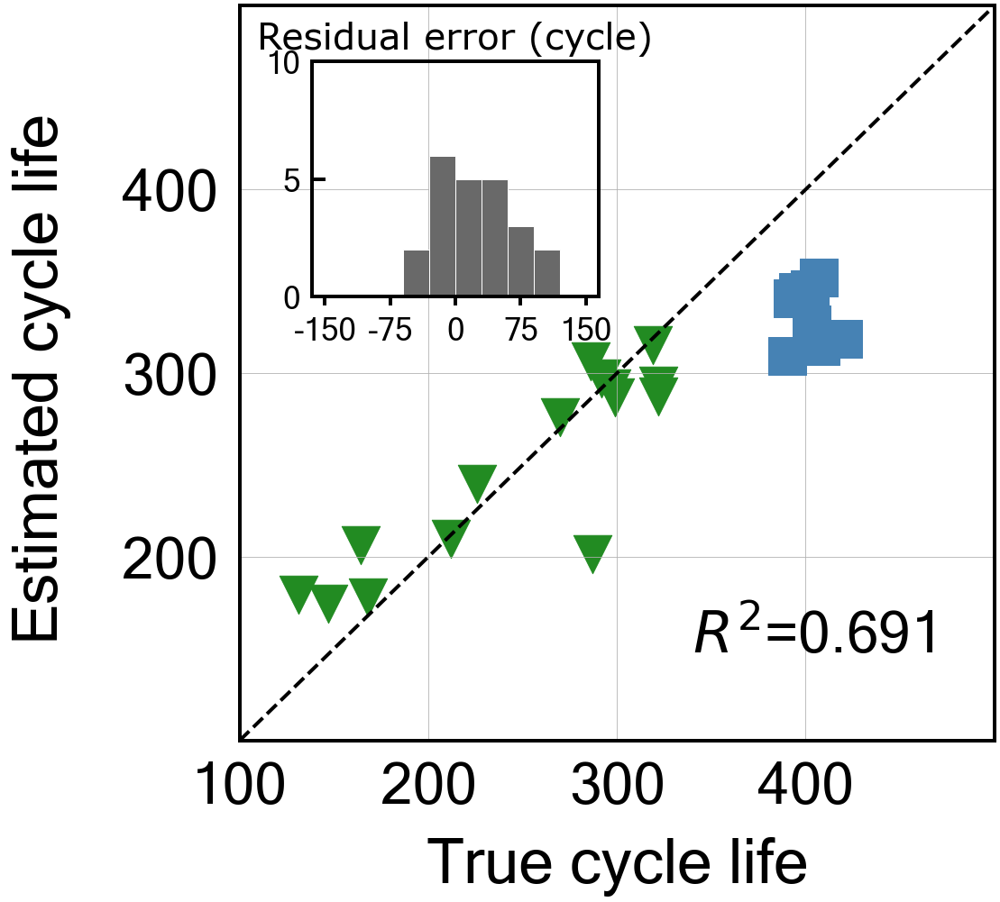

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to78')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -69.73114829784352
Cycle no: Average_2to78
Coefficient:
T_V('Charge', 'Variance', 'Average_2to78') : -0.02233409678135198
T_V('Charge', 'Mean', 'Average_2to78') : 0.09071077730855286
T_V('Charge', 'Skewness', 'Average_2to78') : 0.12788709514422797
dTdV('Charge', 'Maximum', 'Average_2to78') : 0.0
dTdV('Charge', 'Mean', 'Average_2to78') : -0.005809327470337633
dTdV('Charge', 'Kurtosis', 'Average_2to78') : -0.07248621502707897

Intercept: 0.6202443280977316
MAE_all: 40.3
MAPE_all: 13.3 %
RMSE_all: 51.3
RMSPE_all: 16.6 %
MAE_train: 22.8
MAPE_train: 10.7 %
RMSE_train: 31.5
RMSPE_train: 15.4 %
MAE_test: 72.9
MAPE_test: 18.1 %
RMSE_test: 75.6
RMSPE_test: 18.7 %
R2 normal-scale scores
All data r2-score: 0.678
Train data r2-score: 0.773
Test data r2-score: -69.731

Normal

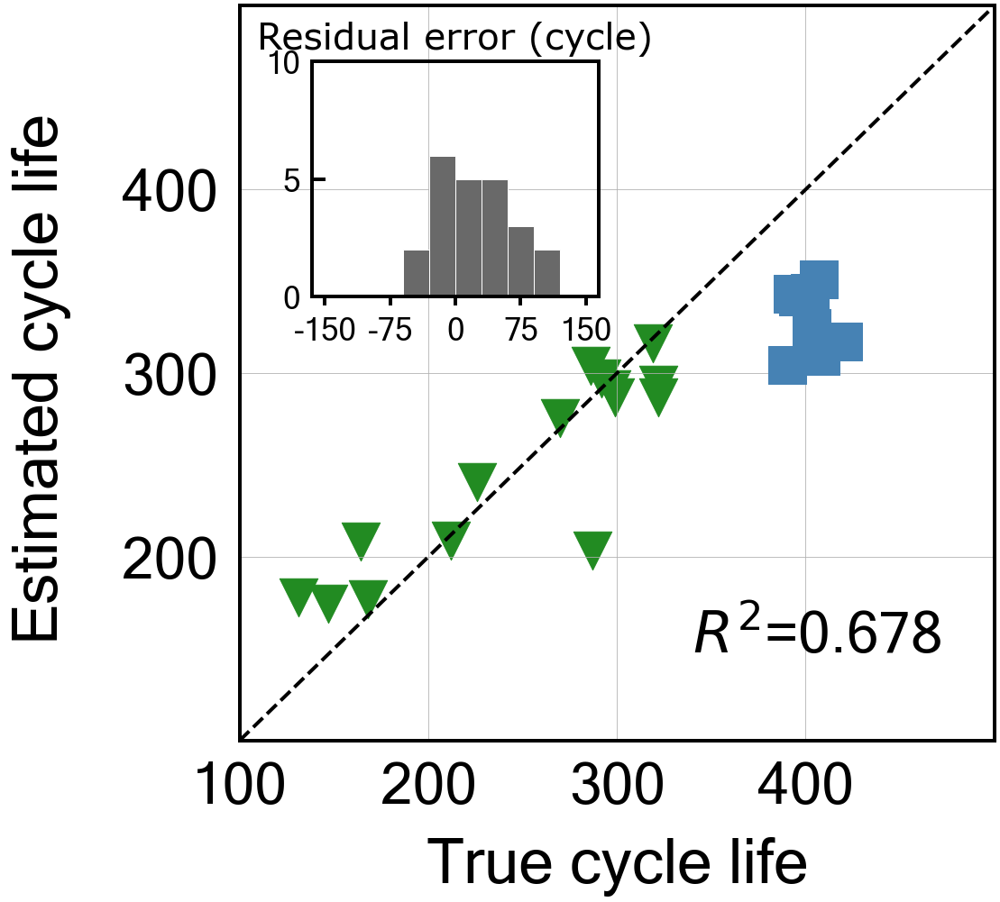

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to79')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -64.77950798803796
Cycle no: Average_2to79
Coefficient:
T_V('Charge', 'Variance', 'Average_2to79') : -0.02198757548308393
T_V('Charge', 'Mean', 'Average_2to79') : 0.09075886869652305
T_V('Charge', 'Skewness', 'Average_2to79') : 0.13926144730332857
dTdV('Charge', 'Maximum', 'Average_2to79') : -0.0
dTdV('Charge', 'Mean', 'Average_2to79') : -0.001577704907969737
dTdV('Charge', 'Kurtosis', 'Average_2to79') : -0.058551058236327426

Intercept: 0.6202443280977309
MAE_all: 39.8
MAPE_all: 13.2 %
RMSE_all: 50.1
RMSPE_all: 16.4 %
MAE_train: 23.4
MAPE_train: 10.9 %
RMSE_train: 31.9
RMSPE_train: 15.5 %
MAE_test: 70.7
MAPE_test: 17.5 %
RMSE_test: 72.9
RMSPE_test: 18.0 %
R2 normal-scale scores
All data r2-score: 0.693
Train data r2-score: 0.767
Test data r2-score: -64.780

Norm

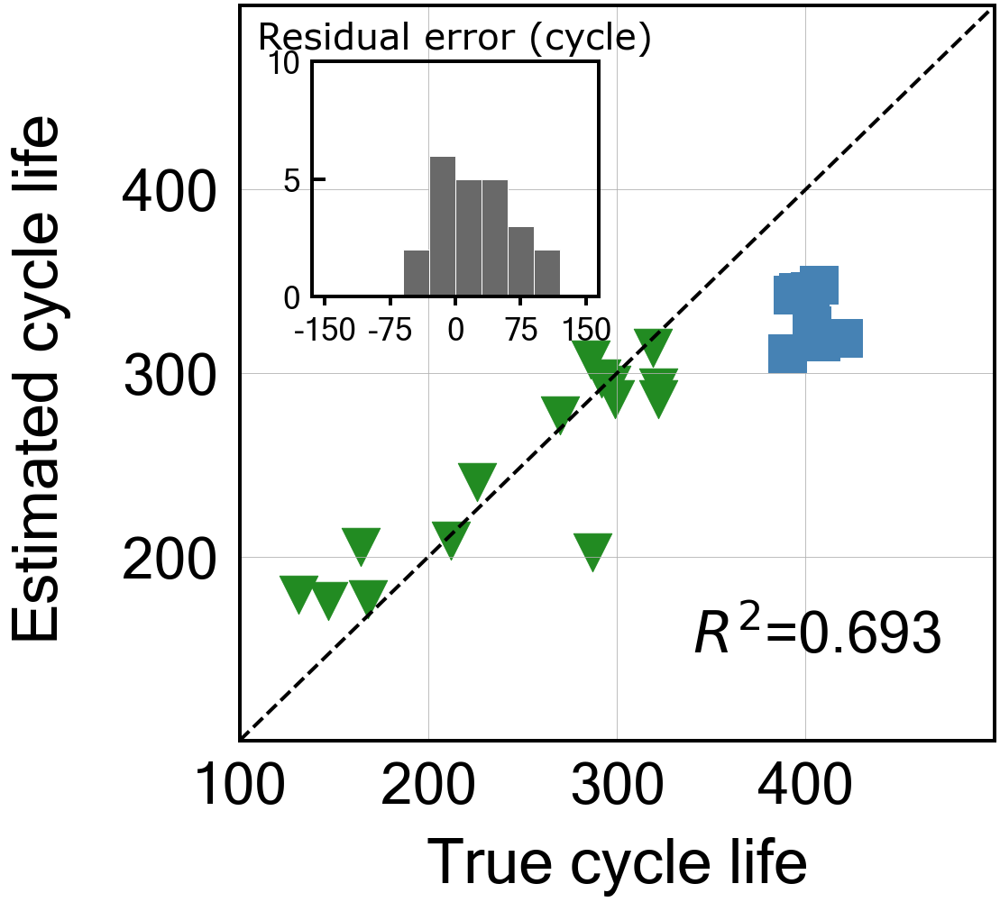

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to80')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 6.1
Best score obtained was: -60.85792022804795
Cycle no: Average_2to80
Coefficient:
T_V('Charge', 'Variance', 'Average_2to80') : -0.022237554573273477
T_V('Charge', 'Mean', 'Average_2to80') : 0.09322351295762805
T_V('Charge', 'Skewness', 'Average_2to80') : 0.13717914483571295
dTdV('Charge', 'Maximum', 'Average_2to80') : 0.0
dTdV('Charge', 'Mean', 'Average_2to80') : -0.00312833042405114
dTdV('Charge', 'Kurtosis', 'Average_2to80') : -0.058468231790546936

Intercept: 0.6202443280977316
MAE_all: 39.0
MAPE_all: 13.0 %
RMSE_all: 49.0
RMSPE_all: 16.2 %
MAE_train: 23.3
MAPE_train: 10.9 %
RMSE_train: 31.9
RMSPE_train: 15.6 %
MAE_test: 68.5
MAPE_test: 17.0 %
RMSE_test: 70.7
RMSPE_test: 17.5 %
R2 normal-scale scores
All data r2-score: 0.706
Train data r2-score: 0.767
Test data r2-score: -60.858

Norma

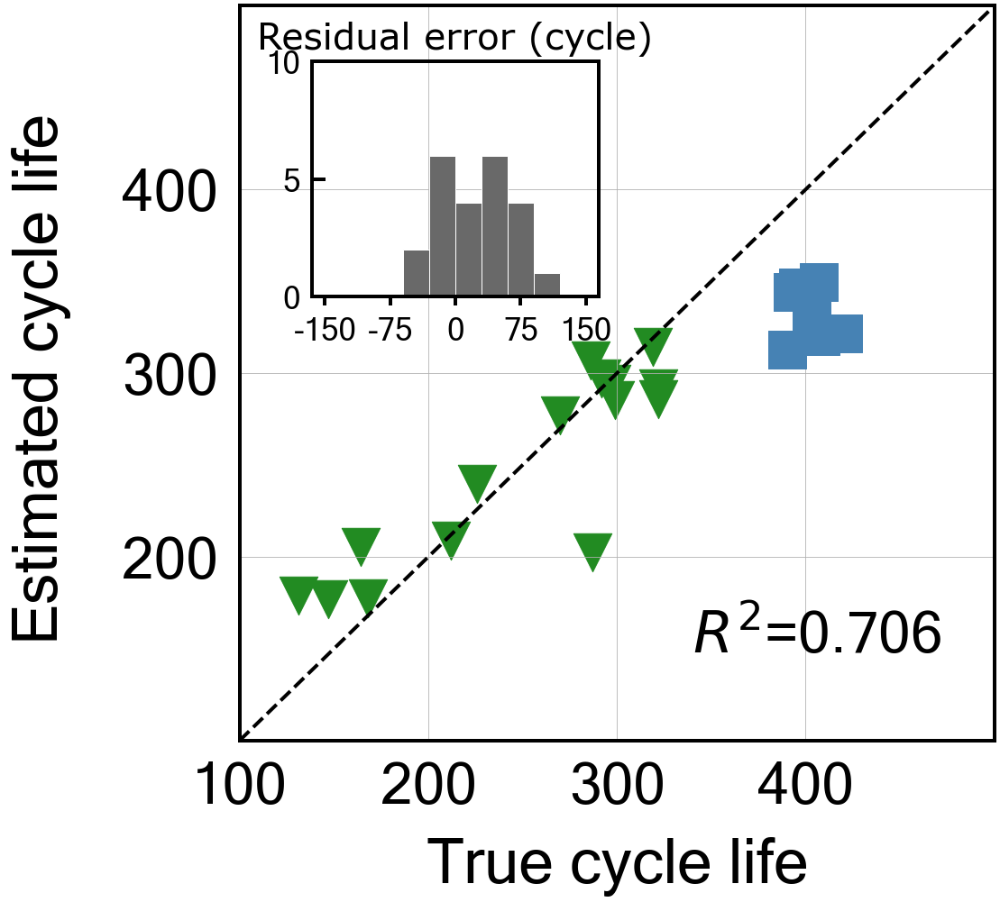

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to81')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -76.5064823878186
Cycle no: Average_2to81
Coefficient:
T_V('Charge', 'Variance', 'Average_2to81') : -0.0201065230963422
T_V('Charge', 'Mean', 'Average_2to81') : 0.09405918310828768
T_V('Charge', 'Skewness', 'Average_2to81') : 0.12474420963218588
dTdV('Charge', 'Maximum', 'Average_2to81') : 0.0015583080419858302
dTdV('Charge', 'Mean', 'Average_2to81') : -0.005736642131512684
dTdV('Charge', 'Kurtosis', 'Average_2to81') : -0.06555792202022308

Intercept: 0.620244328097732
MAE_all: 41.8
MAPE_all: 13.8 %
RMSE_all: 53.3
RMSPE_all: 17.3 %
MAE_train: 23.1
MAPE_train: 10.9 %
RMSE_train: 32.0
RMSPE_train: 15.9 %
MAE_test: 76.9
MAPE_test: 19.1 %
RMSE_test: 79.1
RMSPE_test: 19.5 %
R2 normal-scale scores
All data r2-score: 0.652
Train data r2-score: 0.765
Test data r2-score: 

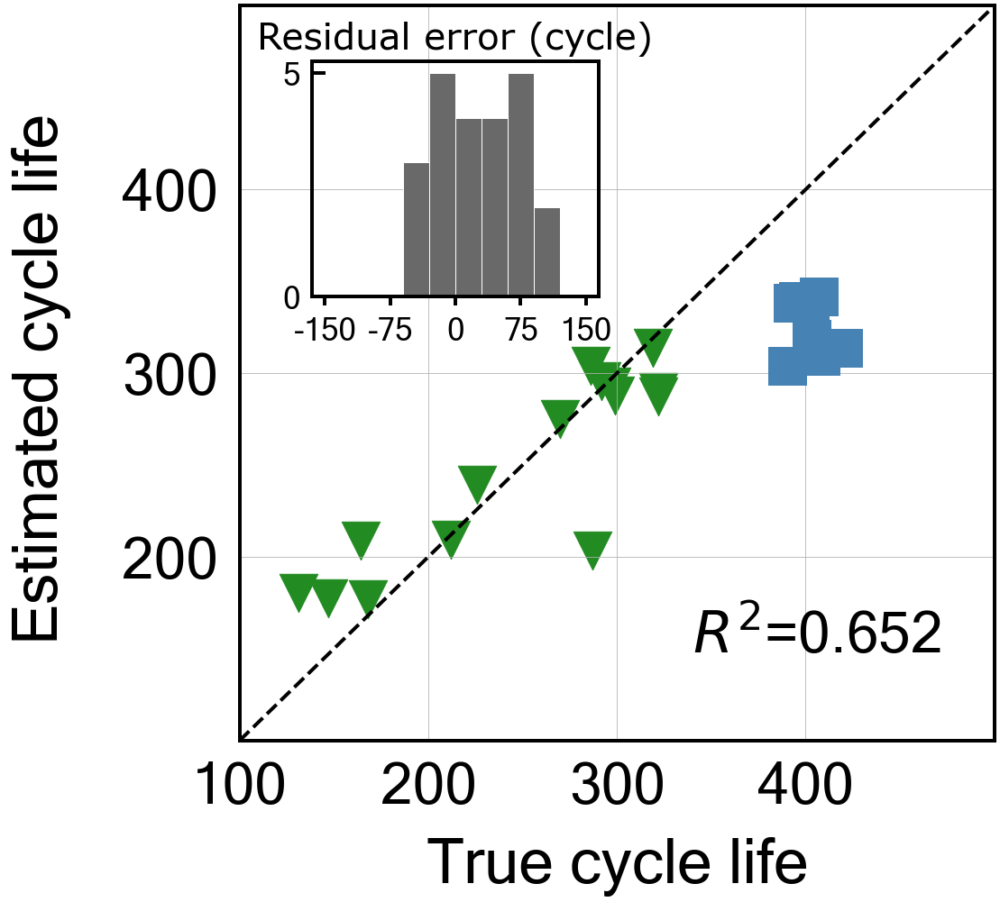

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to82')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -71.4978612808294
Cycle no: Average_2to82
Coefficient:
T_V('Charge', 'Variance', 'Average_2to82') : -0.021462939904354515
T_V('Charge', 'Mean', 'Average_2to82') : 0.09181068579726677
T_V('Charge', 'Skewness', 'Average_2to82') : 0.12970190538237292
dTdV('Charge', 'Maximum', 'Average_2to82') : 0.0
dTdV('Charge', 'Mean', 'Average_2to82') : -0.004561719943323162
dTdV('Charge', 'Kurtosis', 'Average_2to82') : -0.06879958404130918

Intercept: 0.6202443280977319
MAE_all: 40.1
MAPE_all: 13.2 %
RMSE_all: 51.8
RMSPE_all: 16.6 %
MAE_train: 22.2
MAPE_train: 10.4 %
RMSE_train: 31.4
RMSPE_train: 15.3 %
MAE_test: 73.7
MAPE_test: 18.3 %
RMSE_test: 76.5
RMSPE_test: 18.9 %
R2 normal-scale scores
All data r2-score: 0.672
Train data r2-score: 0.774
Test data r2-score: -71.498

Normal

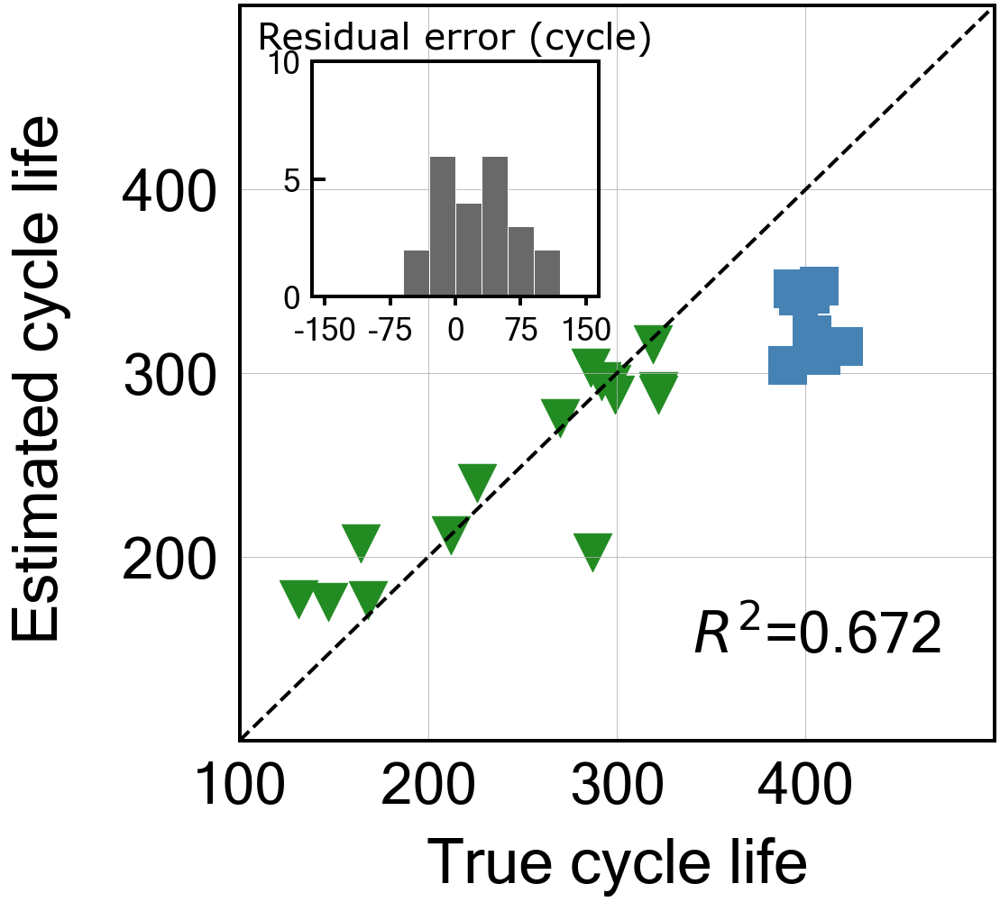

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to83')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -73.11497598468787
Cycle no: Average_2to83
Coefficient:
T_V('Charge', 'Variance', 'Average_2to83') : -0.02071285089889869
T_V('Charge', 'Mean', 'Average_2to83') : 0.09269376256935073
T_V('Charge', 'Skewness', 'Average_2to83') : 0.12983596279103612
dTdV('Charge', 'Maximum', 'Average_2to83') : 0.0
dTdV('Charge', 'Mean', 'Average_2to83') : -0.004042451874907165
dTdV('Charge', 'Kurtosis', 'Average_2to83') : -0.06622304506211964

Intercept: 0.6202443280977318
MAE_all: 40.7
MAPE_all: 13.3 %
RMSE_all: 52.3
RMSPE_all: 16.8 %
MAE_train: 22.5
MAPE_train: 10.6 %
RMSE_train: 31.6
RMSPE_train: 15.4 %
MAE_test: 74.9
MAPE_test: 18.6 %
RMSE_test: 77.4
RMSPE_test: 19.1 %
R2 normal-scale scores
All data r2-score: 0.666
Train data r2-score: 0.771
Test data r2-score: -73.115

Normal

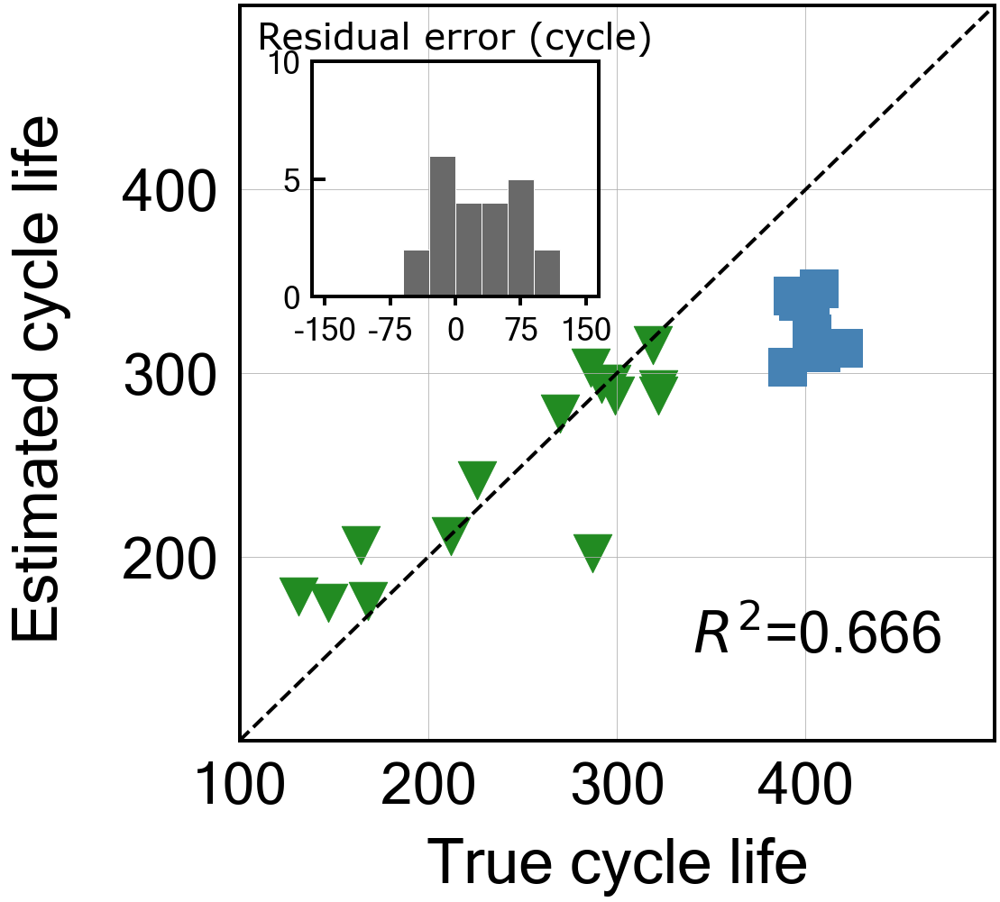

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to84')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.6
Best score obtained was: -81.5899560933417
Cycle no: Average_2to84
Coefficient:
T_V('Charge', 'Variance', 'Average_2to84') : -0.01961729292995388
T_V('Charge', 'Mean', 'Average_2to84') : 0.09498358434758876
T_V('Charge', 'Skewness', 'Average_2to84') : 0.12254944181672714
dTdV('Charge', 'Maximum', 'Average_2to84') : 0.0012062523446759459
dTdV('Charge', 'Mean', 'Average_2to84') : -0.005210111164489625
dTdV('Charge', 'Kurtosis', 'Average_2to84') : -0.06791417967609578

Intercept: 0.6202443280977311
MAE_all: 42.2
MAPE_all: 13.8 %
RMSE_all: 54.5
RMSPE_all: 17.4 %
MAE_train: 22.4
MAPE_train: 10.6 %
RMSE_train: 31.7
RMSPE_train: 15.6 %
MAE_test: 79.4
MAPE_test: 19.7 %
RMSE_test: 81.7
RMSPE_test: 20.2 %
R2 normal-scale scores
All data r2-score: 0.636
Train data r2-score: 0.770
Test data r2-score

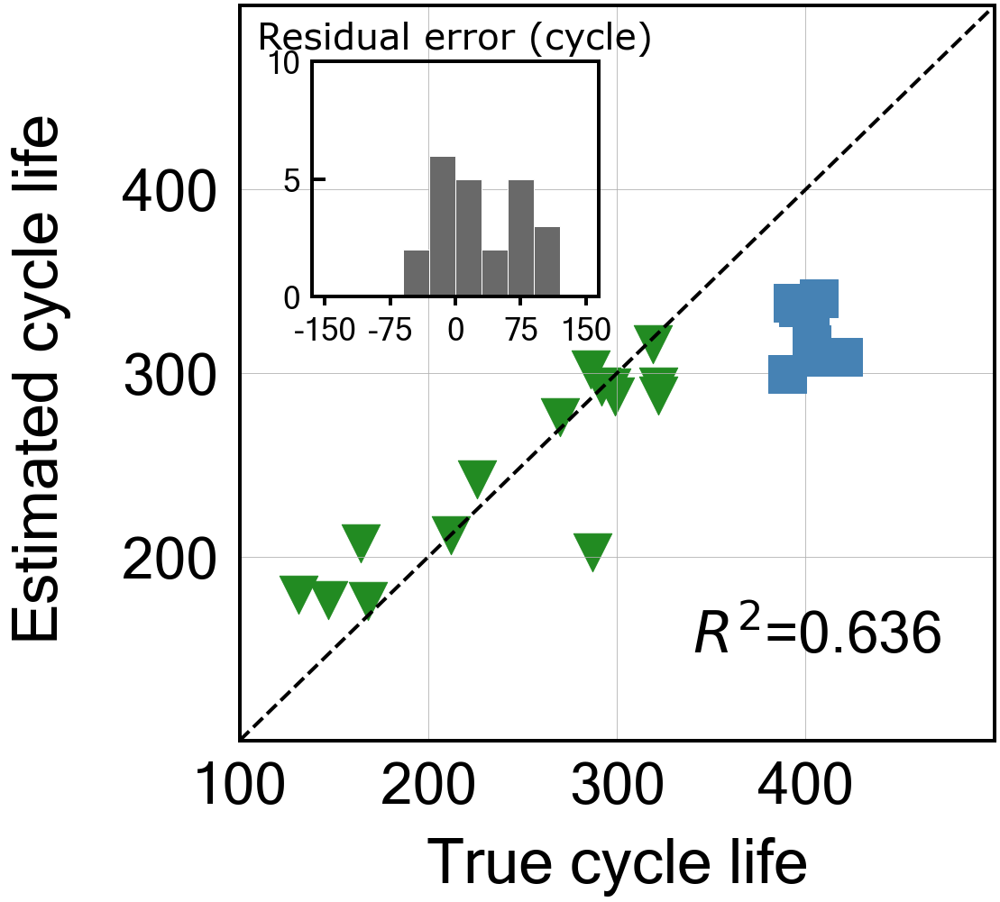

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to85')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -70.43837435681594
Cycle no: Average_2to85
Coefficient:
T_V('Charge', 'Variance', 'Average_2to85') : -0.020945194176996227
T_V('Charge', 'Mean', 'Average_2to85') : 0.09362631199869358
T_V('Charge', 'Skewness', 'Average_2to85') : 0.13009728874102397
dTdV('Charge', 'Maximum', 'Average_2to85') : 0.0
dTdV('Charge', 'Mean', 'Average_2to85') : -0.004399412443807187
dTdV('Charge', 'Kurtosis', 'Average_2to85') : -0.0649858337144845

Intercept: 0.620244328097732
MAE_all: 40.2
MAPE_all: 13.2 %
RMSE_all: 51.5
RMSPE_all: 16.6 %
MAE_train: 22.3
MAPE_train: 10.5 %
RMSE_train: 31.6
RMSPE_train: 15.4 %
MAE_test: 73.7
MAPE_test: 18.3 %
RMSE_test: 75.9
RMSPE_test: 18.8 %
R2 normal-scale scores
All data r2-score: 0.675
Train data r2-score: 0.772
Test data r2-score: -70.438

Normal-

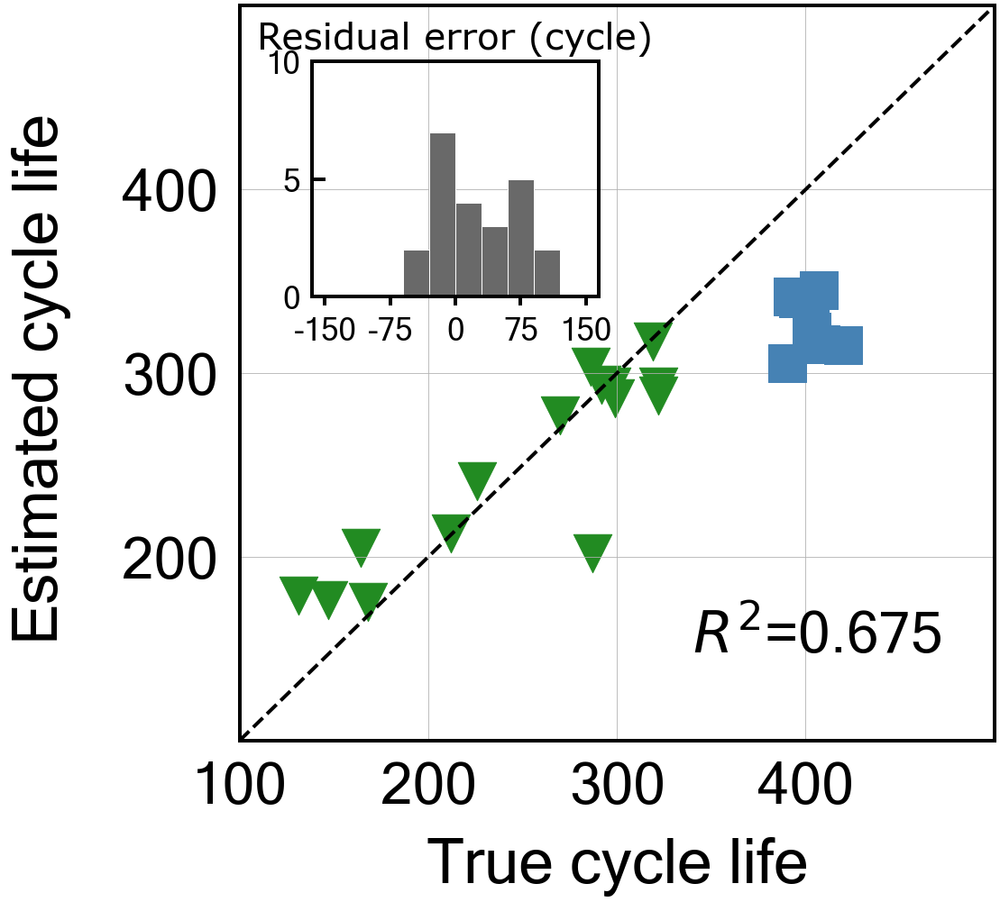

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to86')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -65.74585276917932
Cycle no: Average_2to86
Coefficient:
T_V('Charge', 'Variance', 'Average_2to86') : -0.021295679248953887
T_V('Charge', 'Mean', 'Average_2to86') : 0.09352730639428979
T_V('Charge', 'Skewness', 'Average_2to86') : 0.13084258408943802
dTdV('Charge', 'Maximum', 'Average_2to86') : 0.0
dTdV('Charge', 'Mean', 'Average_2to86') : -0.004969474233307078
dTdV('Charge', 'Kurtosis', 'Average_2to86') : -0.06402865699824206

Intercept: 0.6202443280977304
MAE_all: 39.4
MAPE_all: 13.0 %
RMSE_all: 50.3
RMSPE_all: 16.4 %
MAE_train: 22.4
MAPE_train: 10.5 %
RMSE_train: 31.6
RMSPE_train: 15.4 %
MAE_test: 71.4
MAPE_test: 17.7 %
RMSE_test: 73.4
RMSPE_test: 18.1 %
R2 normal-scale scores
All data r2-score: 0.691
Train data r2-score: 0.771
Test data r2-score: -65.746

Norma

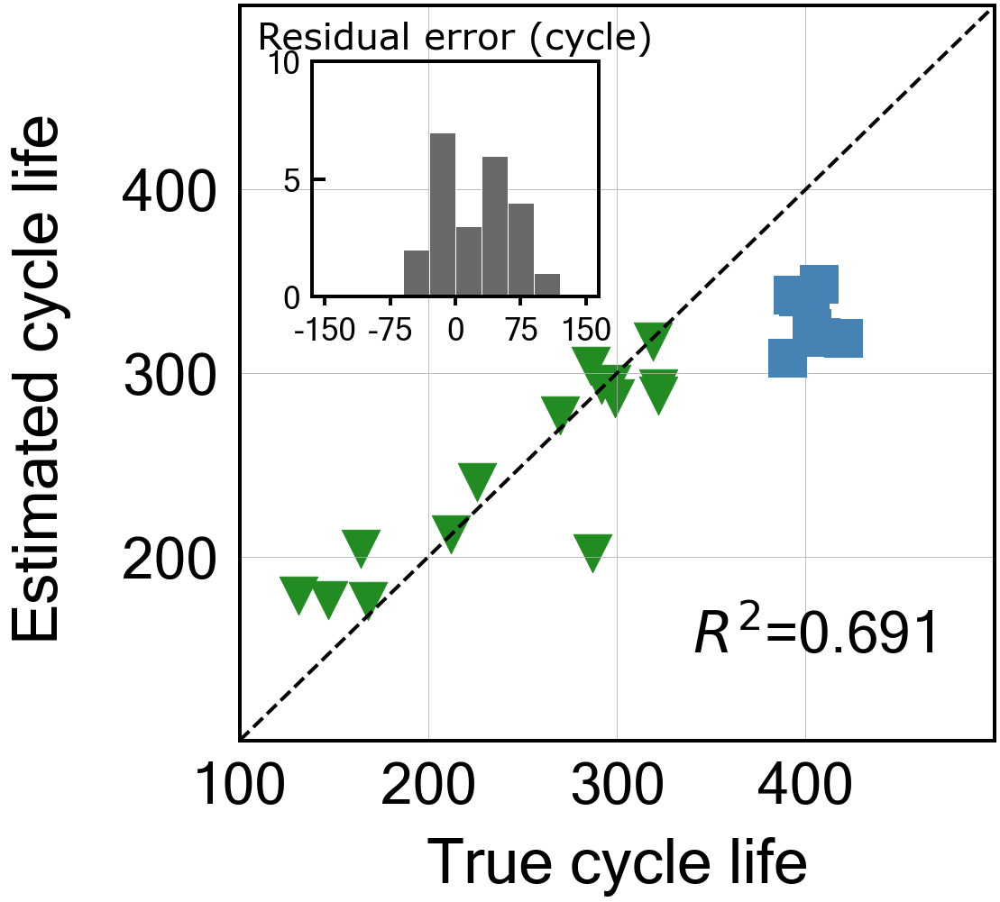

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to87')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -62.07117223608013
Cycle no: Average_2to87
Coefficient:
T_V('Charge', 'Variance', 'Average_2to87') : -0.02212354223036099
T_V('Charge', 'Mean', 'Average_2to87') : 0.09215145260945083
T_V('Charge', 'Skewness', 'Average_2to87') : 0.1346086417431018
dTdV('Charge', 'Maximum', 'Average_2to87') : 0.0
dTdV('Charge', 'Mean', 'Average_2to87') : -0.003839666962287393
dTdV('Charge', 'Kurtosis', 'Average_2to87') : -0.062431773232451

Intercept: 0.6202443280977307
MAE_all: 38.7
MAPE_all: 12.8 %
RMSE_all: 49.2
RMSPE_all: 16.1 %
MAE_train: 22.2
MAPE_train: 10.4 %
RMSE_train: 31.5
RMSPE_train: 15.2 %
MAE_test: 69.5
MAPE_test: 17.2 %
RMSE_test: 71.4
RMSPE_test: 17.6 %
R2 normal-scale scores
All data r2-score: 0.704
Train data r2-score: 0.773
Test data r2-score: -62.071

Normal-sc

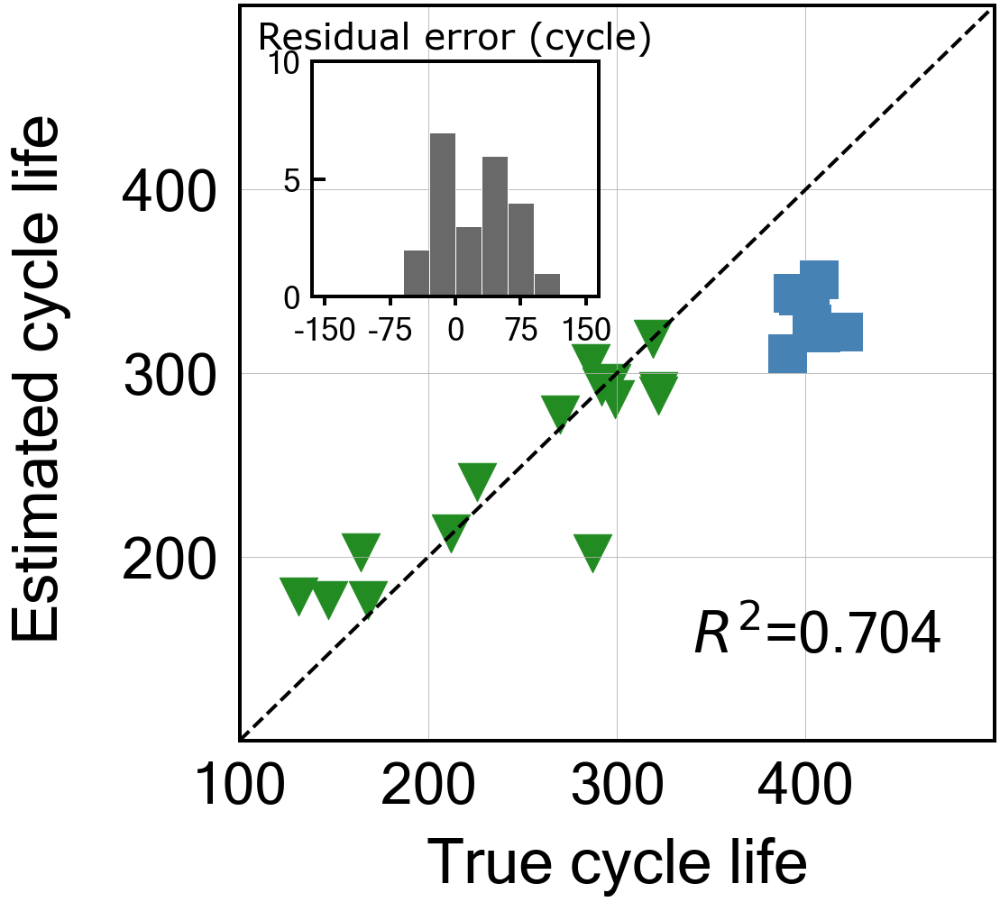

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to88')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.2
Best score obtained was: -59.656211664550575
Cycle no: Average_2to88
Coefficient:
T_V('Charge', 'Variance', 'Average_2to88') : -0.021321050889485327
T_V('Charge', 'Mean', 'Average_2to88') : 0.09673794496817388
T_V('Charge', 'Skewness', 'Average_2to88') : 0.13118742704554875
dTdV('Charge', 'Maximum', 'Average_2to88') : 0.0
dTdV('Charge', 'Mean', 'Average_2to88') : -0.006451780127461711
dTdV('Charge', 'Kurtosis', 'Average_2to88') : -0.05999553157138829

Intercept: 0.6202443280977309
MAE_all: 38.5
MAPE_all: 12.8 %
RMSE_all: 48.6
RMSPE_all: 16.1 %
MAE_train: 22.7
MAPE_train: 10.6 %
RMSE_train: 31.7
RMSPE_train: 15.4 %
MAE_test: 68.3
MAPE_test: 16.9 %
RMSE_test: 70.0
RMSPE_test: 17.3 %
R2 normal-scale scores
All data r2-score: 0.712
Train data r2-score: 0.770
Test data r2-score: -59.656

Norm

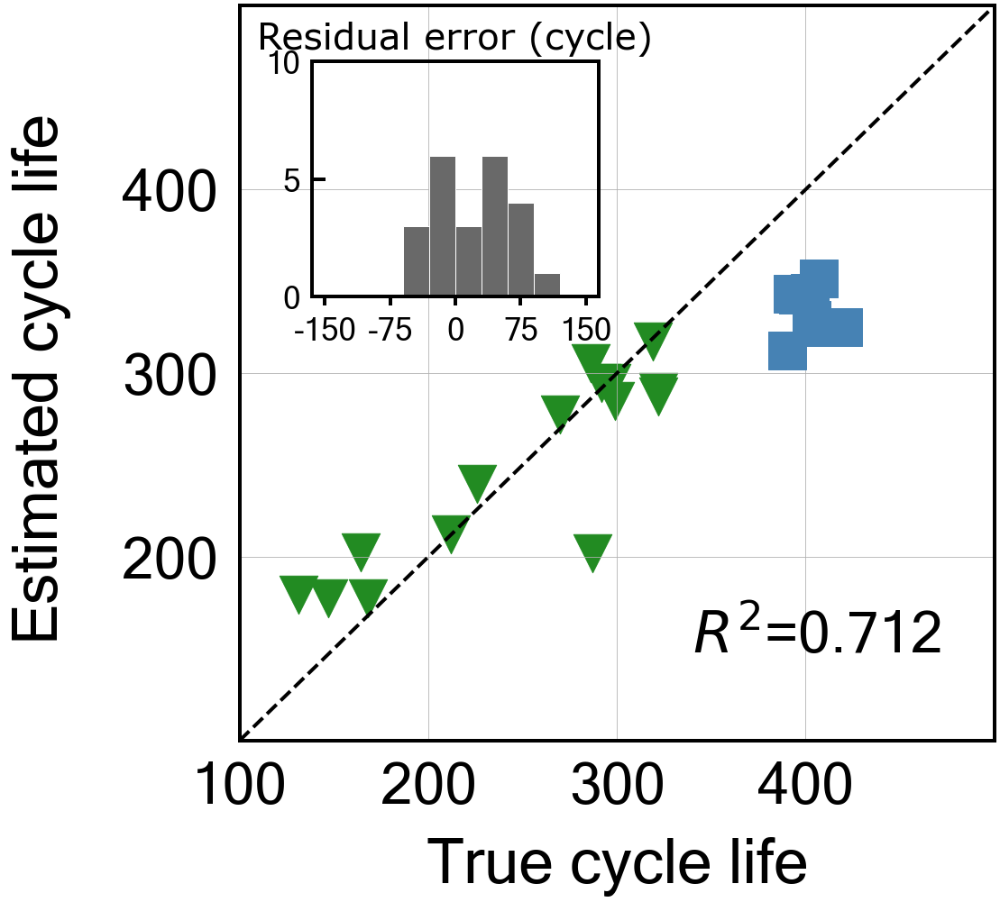

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to89')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -55.543818288481994
Cycle no: Average_2to89
Coefficient:
T_V('Charge', 'Variance', 'Average_2to89') : -0.022995909068621964
T_V('Charge', 'Mean', 'Average_2to89') : 0.09083711754189978
T_V('Charge', 'Skewness', 'Average_2to89') : 0.13497531353290204
dTdV('Charge', 'Maximum', 'Average_2to89') : 0.0
dTdV('Charge', 'Mean', 'Average_2to89') : -0.005427789645170687
dTdV('Charge', 'Kurtosis', 'Average_2to89') : -0.06360970166935884

Intercept: 0.6202443280977312
MAE_all: 37.5
MAPE_all: 12.5 %
RMSE_all: 47.2
RMSPE_all: 15.7 %
MAE_train: 22.4
MAPE_train: 10.5 %
RMSE_train: 31.4
RMSPE_train: 15.2 %
MAE_test: 65.7
MAPE_test: 16.3 %
RMSE_test: 67.6
RMSPE_test: 16.7 %
R2 normal-scale scores
All data r2-score: 0.727
Train data r2-score: 0.774
Test data r2-score: -55.544

Norm

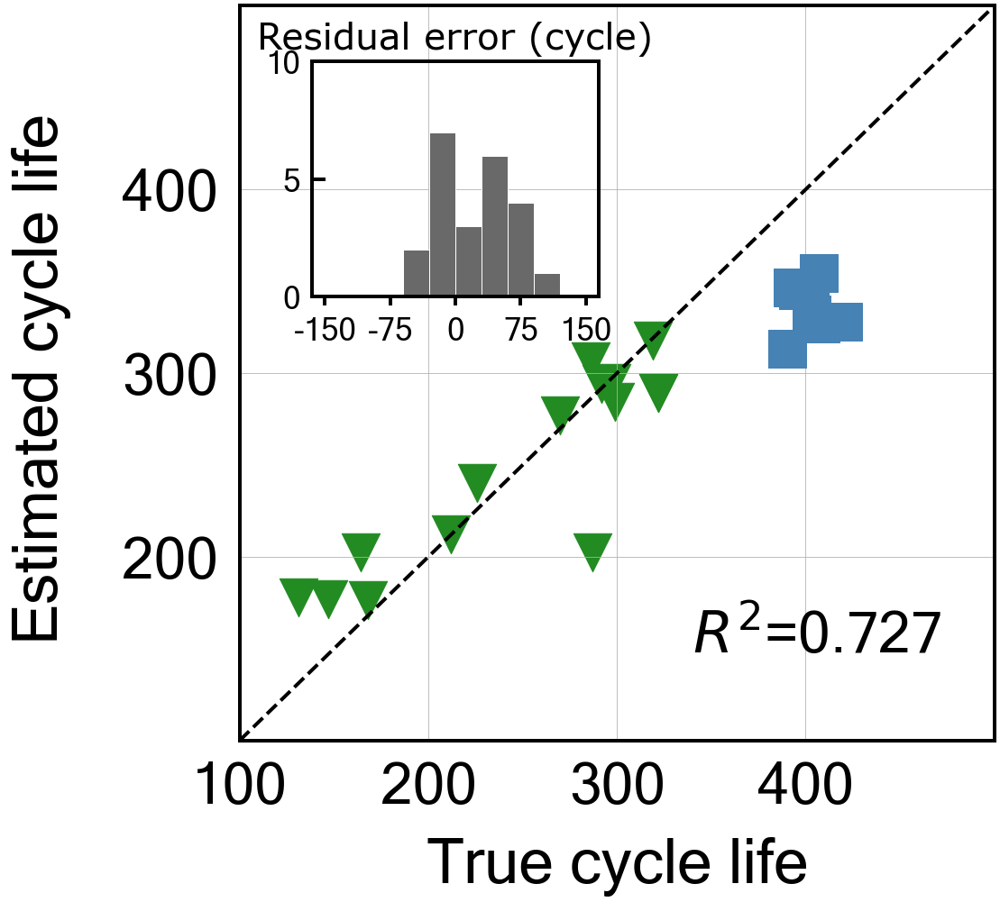

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to90')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.0
Best score obtained was: -54.594238034594696
Cycle no: Average_2to90
Coefficient:
T_V('Charge', 'Variance', 'Average_2to90') : -0.022073162996593076
T_V('Charge', 'Mean', 'Average_2to90') : 0.0971983656856667
T_V('Charge', 'Skewness', 'Average_2to90') : 0.1322424468460802
dTdV('Charge', 'Maximum', 'Average_2to90') : 0.0
dTdV('Charge', 'Mean', 'Average_2to90') : -0.0074246744762703635
dTdV('Charge', 'Kurtosis', 'Average_2to90') : -0.05881294870413868

Intercept: 0.620244328097732
MAE_all: 37.5
MAPE_all: 12.6 %
RMSE_all: 47.1
RMSPE_all: 15.8 %
MAE_train: 22.6
MAPE_train: 10.6 %
RMSE_train: 31.6
RMSPE_train: 15.4 %
MAE_test: 65.4
MAPE_test: 16.2 %
RMSE_test: 67.0
RMSPE_test: 16.6 %
R2 normal-scale scores
All data r2-score: 0.729
Train data r2-score: 0.771
Test data r2-score: -54.594

Normal

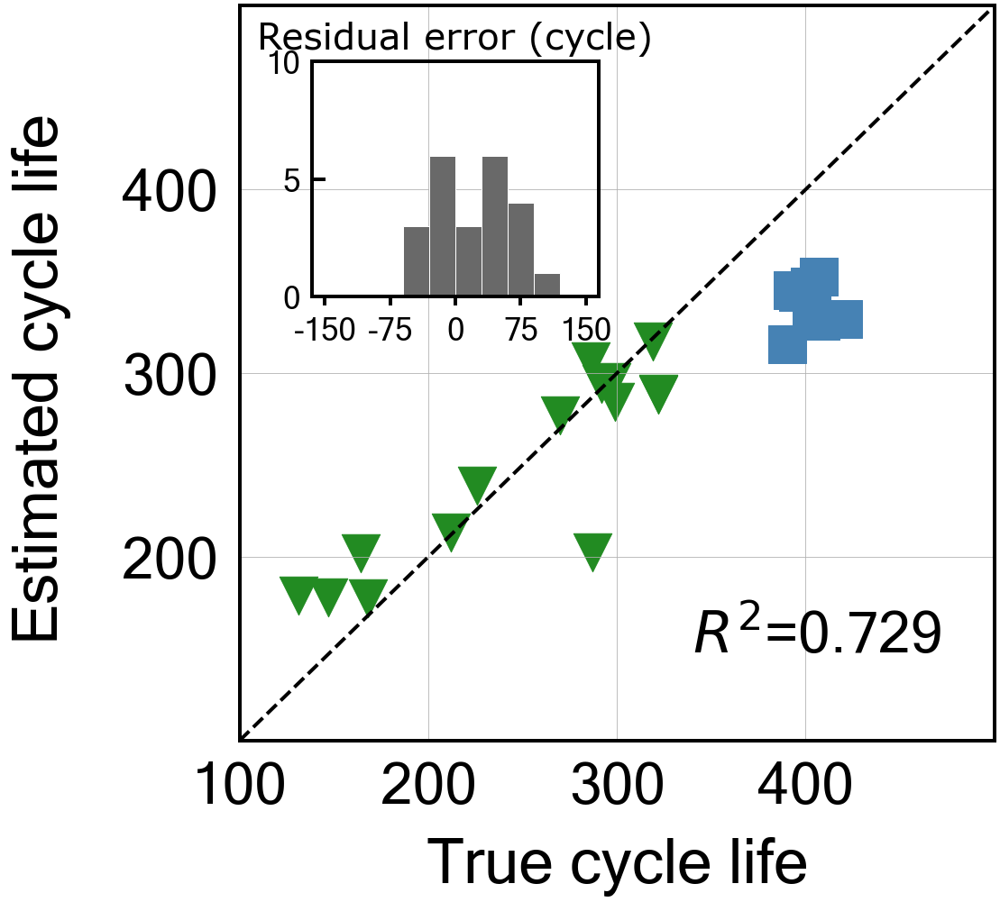

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to91')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 6.1
Best score obtained was: -51.82862136235524
Cycle no: Average_2to91
Coefficient:
T_V('Charge', 'Variance', 'Average_2to91') : -0.02327681495437398
T_V('Charge', 'Mean', 'Average_2to91') : 0.09174170832367168
T_V('Charge', 'Skewness', 'Average_2to91') : 0.13764071565653171
dTdV('Charge', 'Maximum', 'Average_2to91') : 0.0
dTdV('Charge', 'Mean', 'Average_2to91') : -0.005667981783316651
dTdV('Charge', 'Kurtosis', 'Average_2to91') : -0.05997012625026057

Intercept: 0.6202443280977317
MAE_all: 36.7
MAPE_all: 12.3 %
RMSE_all: 46.1
RMSPE_all: 15.5 %
MAE_train: 22.2
MAPE_train: 10.4 %
RMSE_train: 31.4
RMSPE_train: 15.2 %
MAE_test: 63.8
MAPE_test: 15.8 %
RMSE_test: 65.3
RMSPE_test: 16.2 %
R2 normal-scale scores
All data r2-score: 0.740
Train data r2-score: 0.774
Test data r2-score: -51.829

Normal

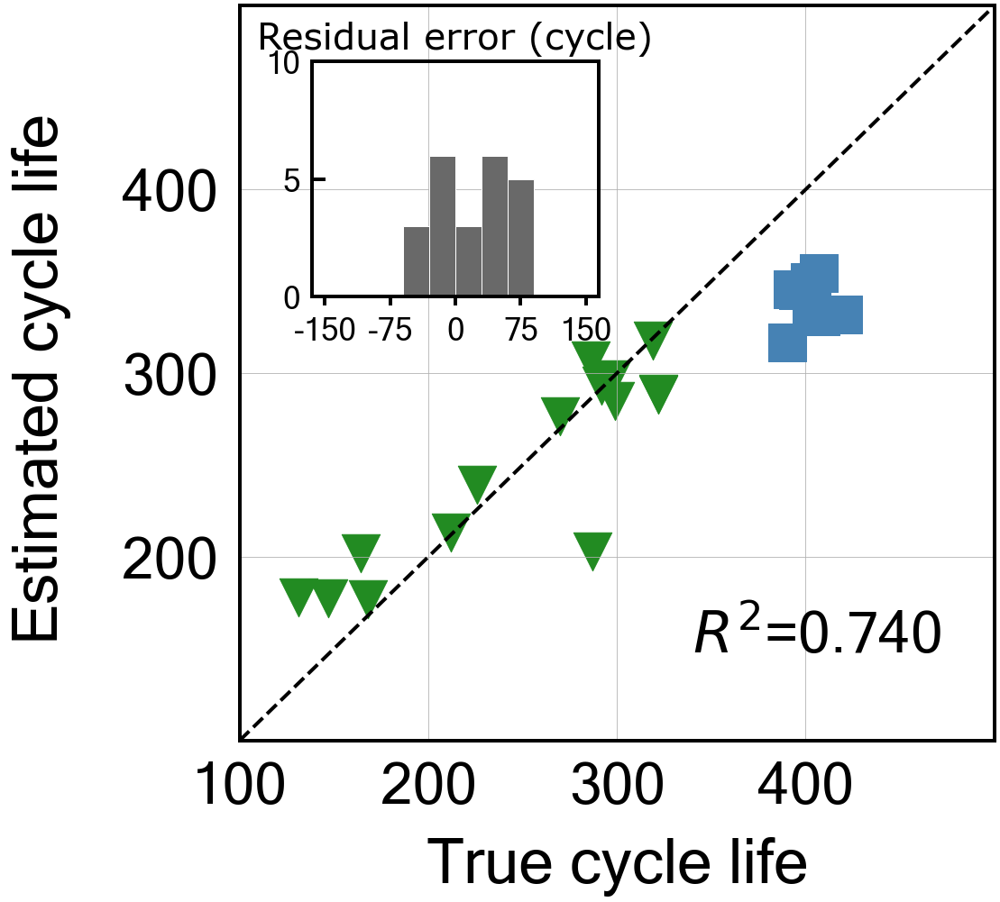

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to92')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -67.54716430220353
Cycle no: Average_2to92
Coefficient:
T_V('Charge', 'Variance', 'Average_2to92') : -0.021246858789168772
T_V('Charge', 'Mean', 'Average_2to92') : 0.09209205227621914
T_V('Charge', 'Skewness', 'Average_2to92') : 0.1281990937213476
dTdV('Charge', 'Maximum', 'Average_2to92') : 0.0
dTdV('Charge', 'Mean', 'Average_2to92') : -0.005047148136905009
dTdV('Charge', 'Kurtosis', 'Average_2to92') : -0.06426690581395825

Intercept: 0.620244328097731
MAE_all: 40.1
MAPE_all: 13.2 %
RMSE_all: 50.8
RMSPE_all: 16.5 %
MAE_train: 22.6
MAPE_train: 10.6 %
RMSE_train: 31.6
RMSPE_train: 15.4 %
MAE_test: 72.9
MAPE_test: 18.1 %
RMSE_test: 74.4
RMSPE_test: 18.4 %
R2 normal-scale scores
All data r2-score: 0.685
Train data r2-score: 0.771
Test data r2-score: -67.547

Normal-

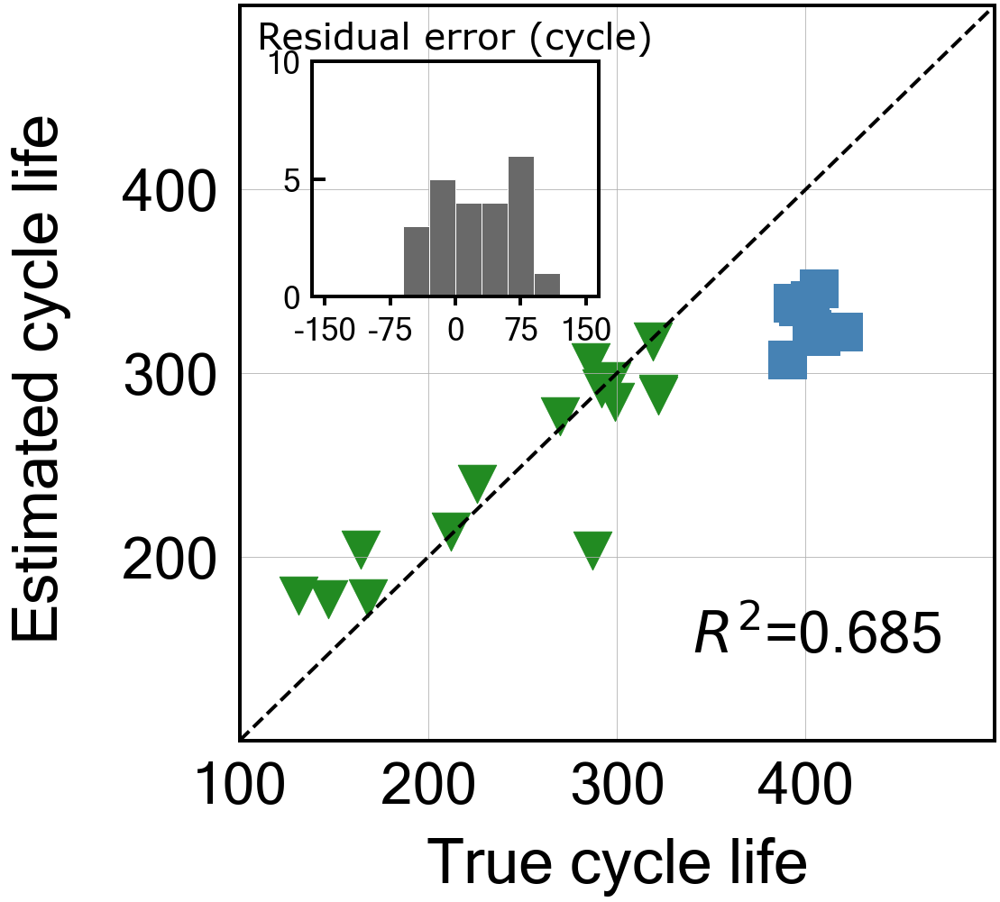

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to93')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -64.35727636993386
Cycle no: Average_2to93
Coefficient:
T_V('Charge', 'Variance', 'Average_2to93') : -0.021367254044217826
T_V('Charge', 'Mean', 'Average_2to93') : 0.09351443380971074
T_V('Charge', 'Skewness', 'Average_2to93') : 0.13056629075056597
dTdV('Charge', 'Maximum', 'Average_2to93') : 0.0
dTdV('Charge', 'Mean', 'Average_2to93') : -0.005045450920758463
dTdV('Charge', 'Kurtosis', 'Average_2to93') : -0.06021261882607399

Intercept: 0.6202443280977314
MAE_all: 39.6
MAPE_all: 13.1 %
RMSE_all: 49.9
RMSPE_all: 16.3 %
MAE_train: 22.8
MAPE_train: 10.7 %
RMSE_train: 31.7
RMSPE_train: 15.4 %
MAE_test: 71.2
MAPE_test: 17.7 %
RMSE_test: 72.6
RMSPE_test: 18.0 %
R2 normal-scale scores
All data r2-score: 0.696
Train data r2-score: 0.770
Test data r2-score: -64.357

Norma

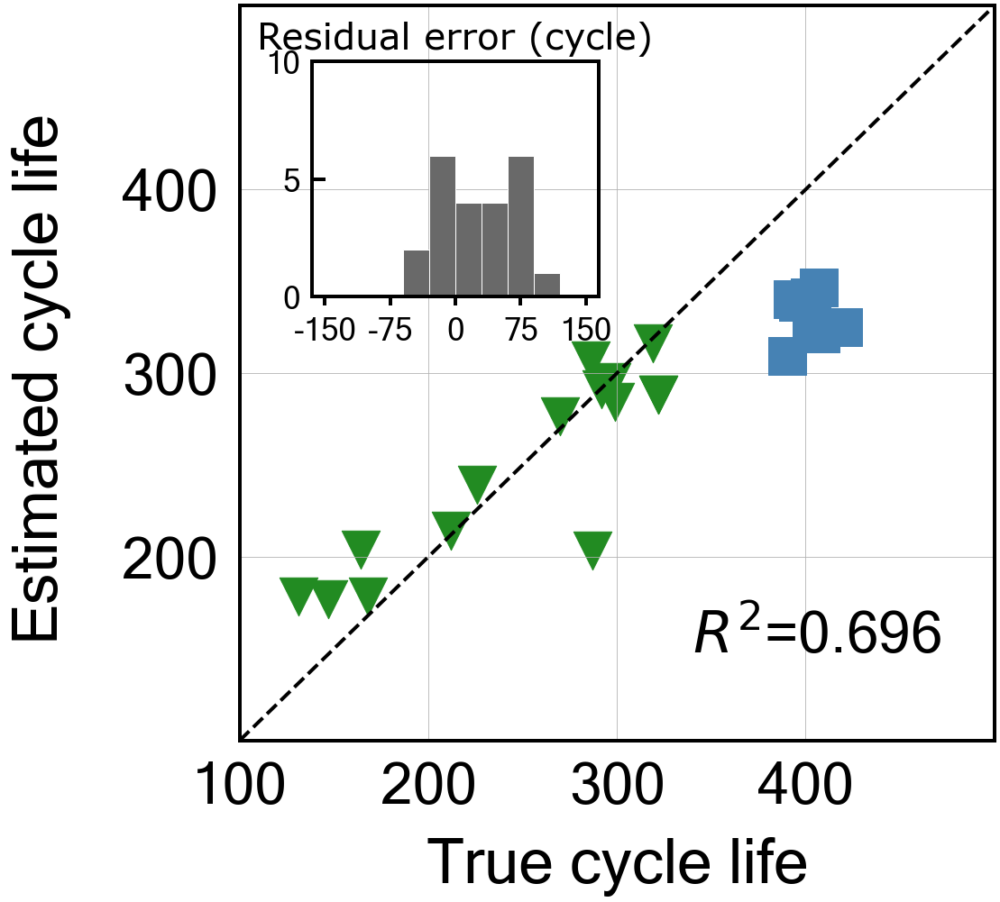

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to94')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -62.71186416767862
Cycle no: Average_2to94
Coefficient:
T_V('Charge', 'Variance', 'Average_2to94') : -0.021824747204387894
T_V('Charge', 'Mean', 'Average_2to94') : 0.09473684002082552
T_V('Charge', 'Skewness', 'Average_2to94') : 0.13210319925059996
dTdV('Charge', 'Maximum', 'Average_2to94') : 0.0006332822673226316
dTdV('Charge', 'Mean', 'Average_2to94') : -0.004622146320425693
dTdV('Charge', 'Kurtosis', 'Average_2to94') : -0.05761914903000649

Intercept: 0.620244328097731
MAE_all: 39.4
MAPE_all: 13.1 %
RMSE_all: 49.4
RMSPE_all: 16.2 %
MAE_train: 22.8
MAPE_train: 10.7 %
RMSE_train: 31.6
RMSPE_train: 15.3 %
MAE_test: 70.4
MAPE_test: 17.5 %
RMSE_test: 71.7
RMSPE_test: 17.7 %
R2 normal-scale scores
All data r2-score: 0.702
Train data r2-score: 0.771
Test data r2-scor

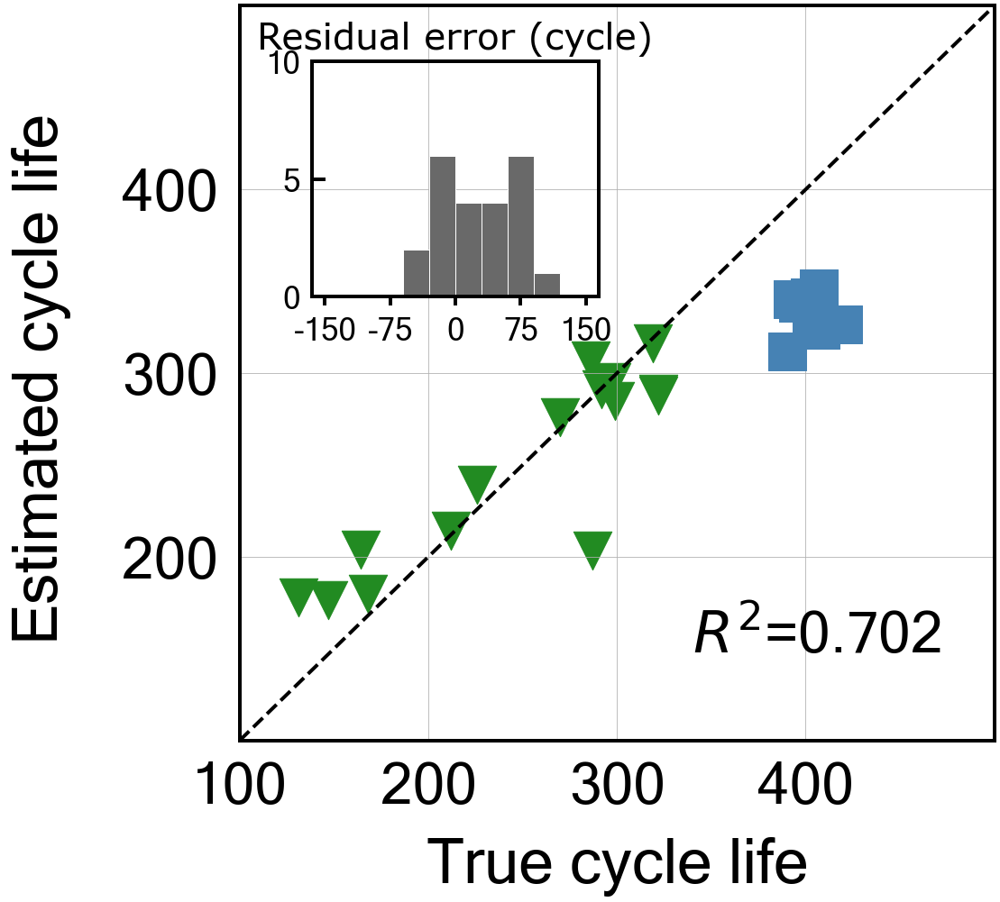

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to95')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.6
Best score obtained was: -63.96299446576137
Cycle no: Average_2to95
Coefficient:
T_V('Charge', 'Variance', 'Average_2to95') : -0.022897160830401584
T_V('Charge', 'Mean', 'Average_2to95') : 0.09642886710118724
T_V('Charge', 'Skewness', 'Average_2to95') : 0.12601773486721443
dTdV('Charge', 'Maximum', 'Average_2to95') : 0.006947596989901063
dTdV('Charge', 'Mean', 'Average_2to95') : -0.009214466280591114
dTdV('Charge', 'Kurtosis', 'Average_2to95') : -0.061268045842671245

Intercept: 0.6202443280977316
MAE_all: 39.7
MAPE_all: 13.1 %
RMSE_all: 49.7
RMSPE_all: 16.2 %
MAE_train: 22.9
MAPE_train: 10.7 %
RMSE_train: 31.5
RMSPE_train: 15.3 %
MAE_test: 71.2
MAPE_test: 17.7 %
RMSE_test: 72.4
RMSPE_test: 17.9 %
R2 normal-scale scores
All data r2-score: 0.698
Train data r2-score: 0.773
Test data r2-sco

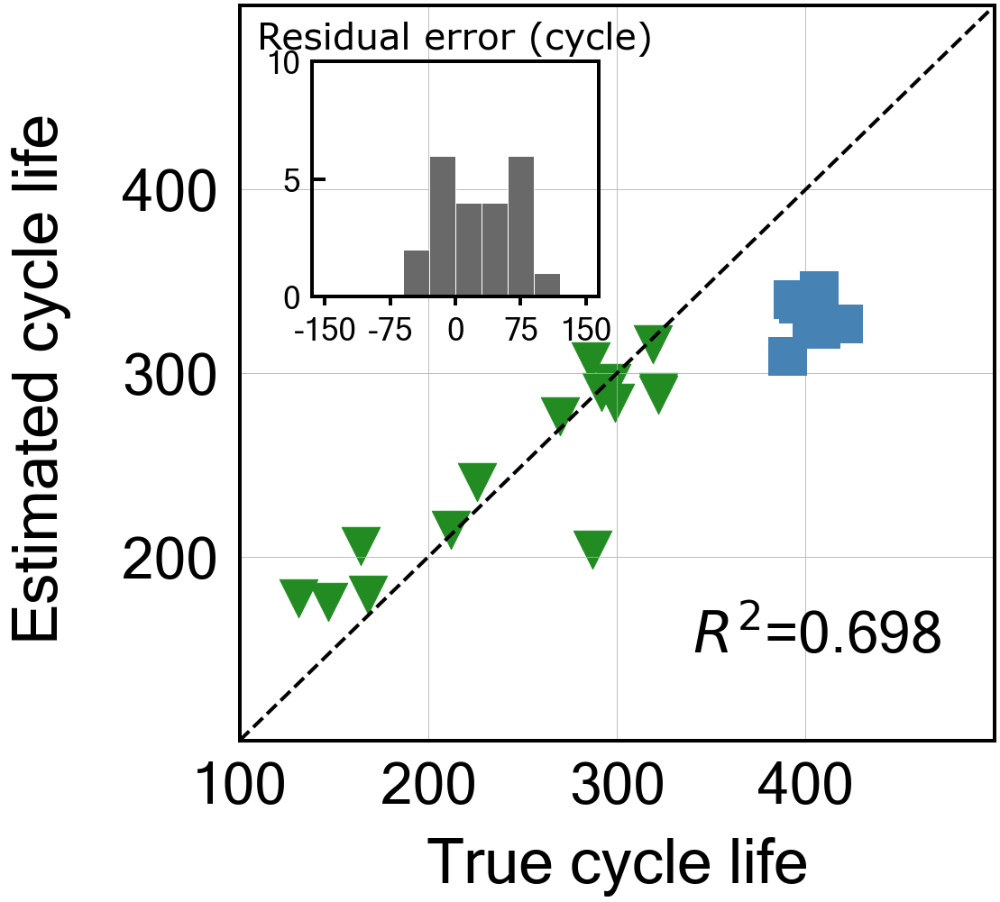

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to96')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -63.80679902006064
Cycle no: Average_2to96
Coefficient:
T_V('Charge', 'Variance', 'Average_2to96') : -0.022753974097298464
T_V('Charge', 'Mean', 'Average_2to96') : 0.09508659644515866
T_V('Charge', 'Skewness', 'Average_2to96') : 0.12590147294984846
dTdV('Charge', 'Maximum', 'Average_2to96') : 0.006351554491531778
dTdV('Charge', 'Mean', 'Average_2to96') : -0.00930300603690887
dTdV('Charge', 'Kurtosis', 'Average_2to96') : -0.06390973363624831

Intercept: 0.620244328097731
MAE_all: 39.5
MAPE_all: 13.1 %
RMSE_all: 49.5
RMSPE_all: 16.2 %
MAE_train: 22.6
MAPE_train: 10.6 %
RMSE_train: 31.2
RMSPE_train: 15.1 %
MAE_test: 71.0
MAPE_test: 17.6 %
RMSE_test: 72.3
RMSPE_test: 17.9 %
R2 normal-scale scores
All data r2-score: 0.700
Train data r2-score: 0.777
Test data r2-score:

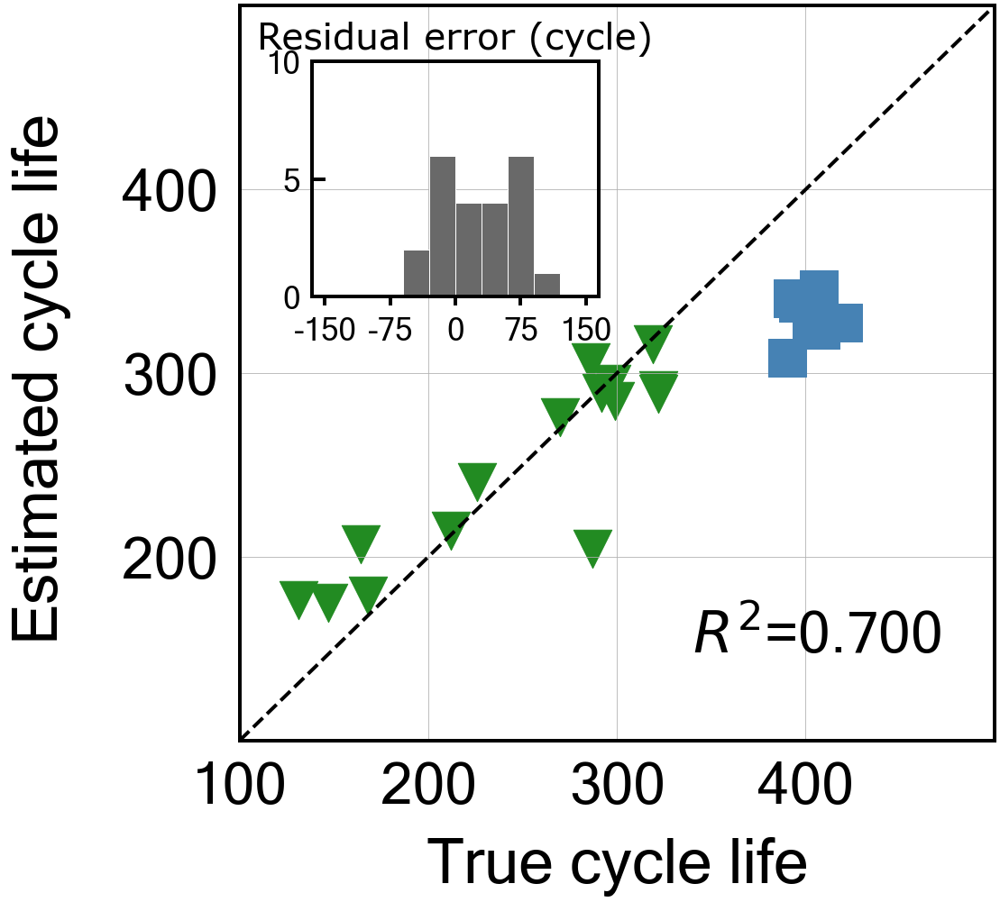

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to97')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -66.51883211892277
Cycle no: Average_2to97
Coefficient:
T_V('Charge', 'Variance', 'Average_2to97') : -0.022591748081133074
T_V('Charge', 'Mean', 'Average_2to97') : 0.09375937238531874
T_V('Charge', 'Skewness', 'Average_2to97') : 0.1250834881300165
dTdV('Charge', 'Maximum', 'Average_2to97') : 0.006645349948926659
dTdV('Charge', 'Mean', 'Average_2to97') : -0.009163404318121415
dTdV('Charge', 'Kurtosis', 'Average_2to97') : -0.06640139131078004

Intercept: 0.6202443280977313
MAE_all: 39.8
MAPE_all: 13.1 %
RMSE_all: 50.2
RMSPE_all: 16.2 %
MAE_train: 22.4
MAPE_train: 10.5 %
RMSE_train: 31.0
RMSPE_train: 15.0 %
MAE_test: 72.6
MAPE_test: 18.0 %
RMSE_test: 73.8
RMSPE_test: 18.3 %
R2 normal-scale scores
All data r2-score: 0.691
Train data r2-score: 0.779
Test data r2-score

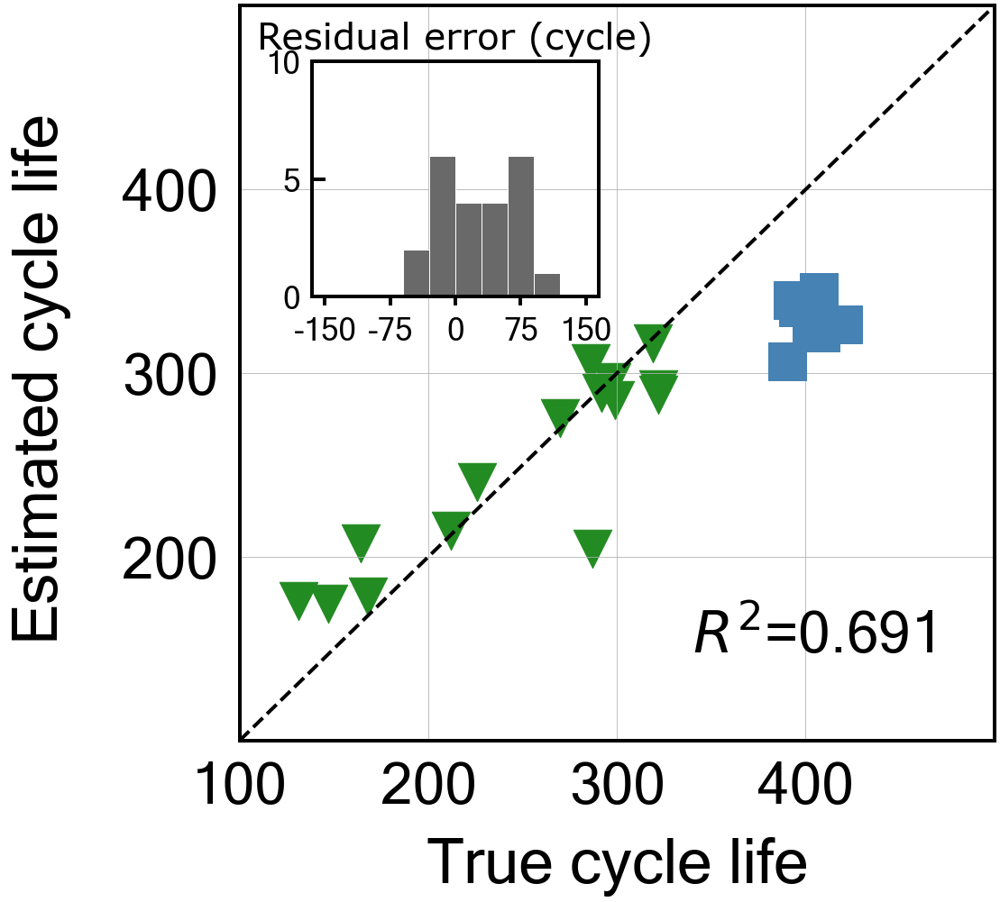

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to98')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.4
Best score obtained was: -66.90505626961478
Cycle no: Average_2to98
Coefficient:
T_V('Charge', 'Variance', 'Average_2to98') : -0.022587335793612624
T_V('Charge', 'Mean', 'Average_2to98') : 0.0940140673532493
T_V('Charge', 'Skewness', 'Average_2to98') : 0.12512030149903938
dTdV('Charge', 'Maximum', 'Average_2to98') : 0.006927803056165887
dTdV('Charge', 'Mean', 'Average_2to98') : -0.009271595079750061
dTdV('Charge', 'Kurtosis', 'Average_2to98') : -0.06580854451806703

Intercept: 0.6202443280977313
MAE_all: 40.0
MAPE_all: 13.2 %
RMSE_all: 50.3
RMSPE_all: 16.2 %
MAE_train: 22.5
MAPE_train: 10.5 %
RMSE_train: 31.0
RMSPE_train: 15.0 %
MAE_test: 72.9
MAPE_test: 18.1 %
RMSE_test: 74.0
RMSPE_test: 18.3 %
R2 normal-scale scores
All data r2-score: 0.690
Train data r2-score: 0.779
Test data r2-score

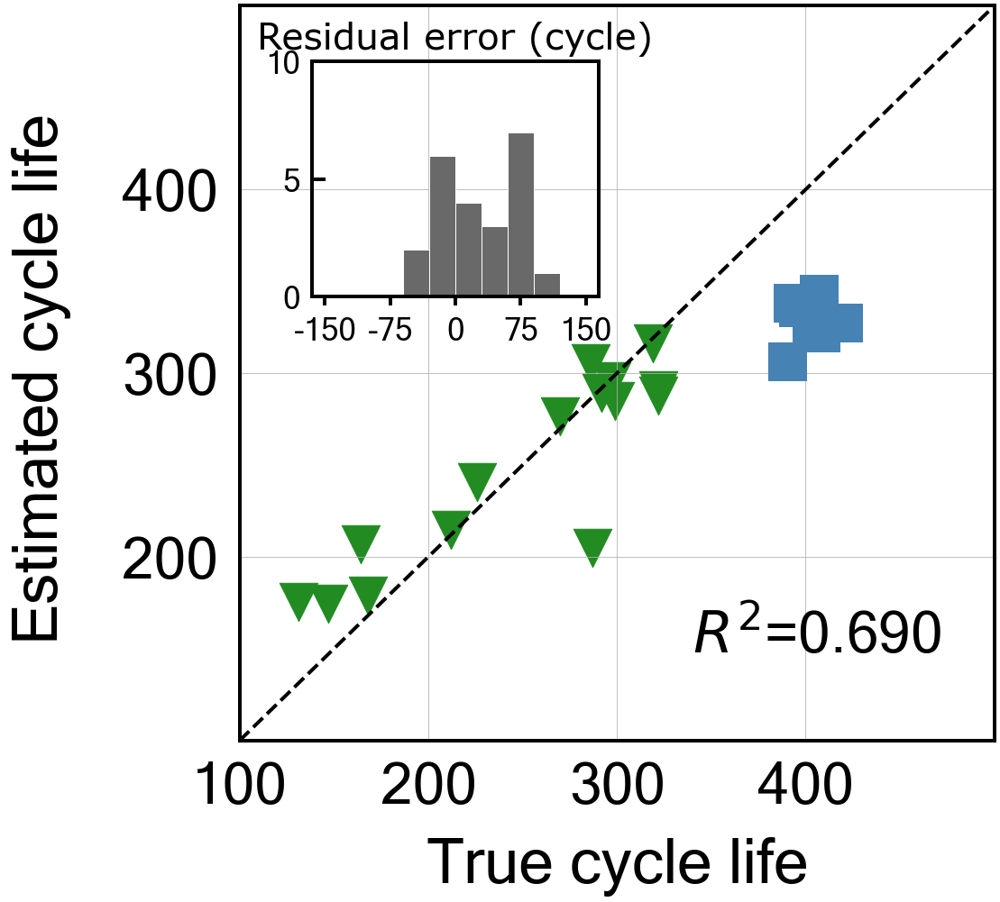

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to99')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -63.93169672815503
Cycle no: Average_2to99
Coefficient:
T_V('Charge', 'Variance', 'Average_2to99') : -0.023165512555884817
T_V('Charge', 'Mean', 'Average_2to99') : 0.09372794829338113
T_V('Charge', 'Skewness', 'Average_2to99') : 0.1275291115695847
dTdV('Charge', 'Maximum', 'Average_2to99') : 0.0076055359466294225
dTdV('Charge', 'Mean', 'Average_2to99') : -0.008829132314628785
dTdV('Charge', 'Kurtosis', 'Average_2to99') : -0.06136106632174432

Intercept: 0.6202443280977317
MAE_all: 39.7
MAPE_all: 13.1 %
RMSE_all: 49.6
RMSPE_all: 16.2 %
MAE_train: 22.8
MAPE_train: 10.7 %
RMSE_train: 31.3
RMSPE_train: 15.2 %
MAE_test: 71.2
MAPE_test: 17.7 %
RMSE_test: 72.4
RMSPE_test: 17.9 %
R2 normal-scale scores
All data r2-score: 0.699
Train data r2-score: 0.775
Test data r2-scor

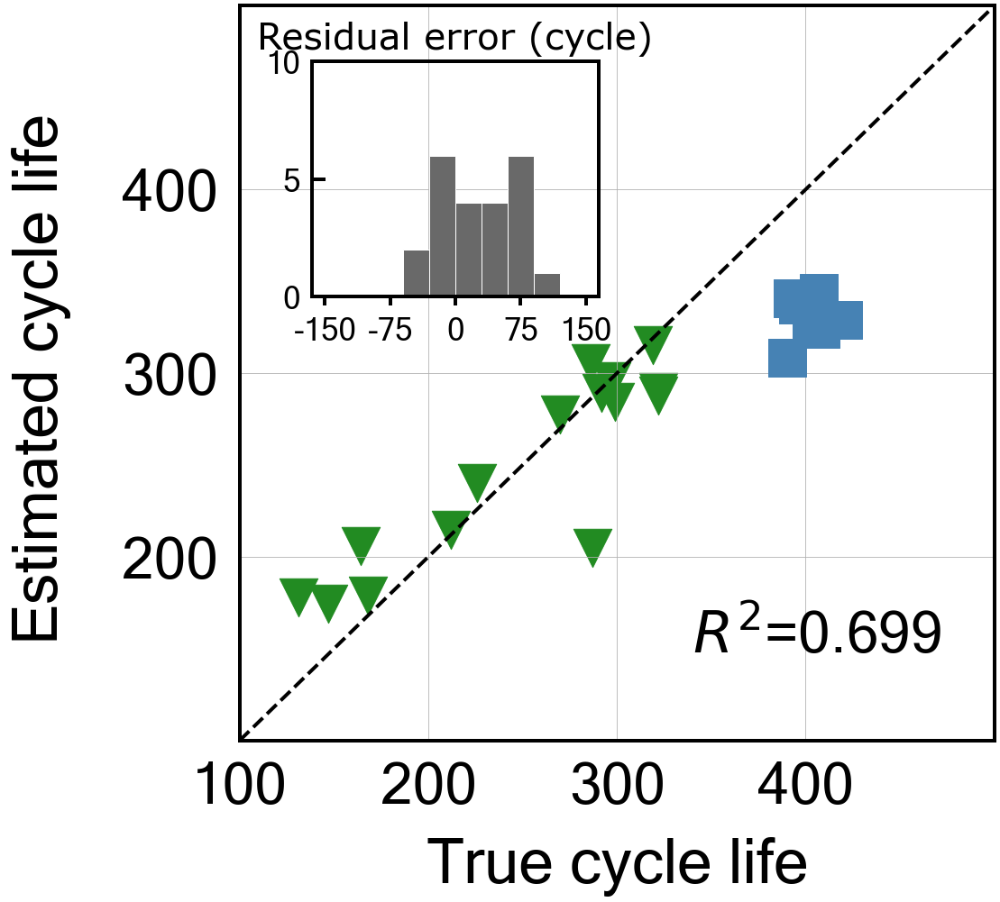

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to100')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -63.00887756595401
Cycle no: Average_2to100
Coefficient:
T_V('Charge', 'Variance', 'Average_2to100') : -0.021465184393839383
T_V('Charge', 'Mean', 'Average_2to100') : 0.09367567620508292
T_V('Charge', 'Skewness', 'Average_2to100') : 0.13297137324736644
dTdV('Charge', 'Maximum', 'Average_2to100') : 0.0012317987756632278
dTdV('Charge', 'Mean', 'Average_2to100') : -0.004902598264187055
dTdV('Charge', 'Kurtosis', 'Average_2to100') : -0.058004369087892006

Intercept: 0.6202443280977313
MAE_all: 39.5
MAPE_all: 13.0 %
RMSE_all: 49.3
RMSPE_all: 16.1 %
MAE_train: 22.7
MAPE_train: 10.6 %
RMSE_train: 31.3
RMSPE_train: 15.1 %
MAE_test: 70.8
MAPE_test: 17.6 %
RMSE_test: 71.9
RMSPE_test: 17.8 %
R2 normal-scale scores
All data r2-score: 0.702
Train data r2-score: 0.776
Test da

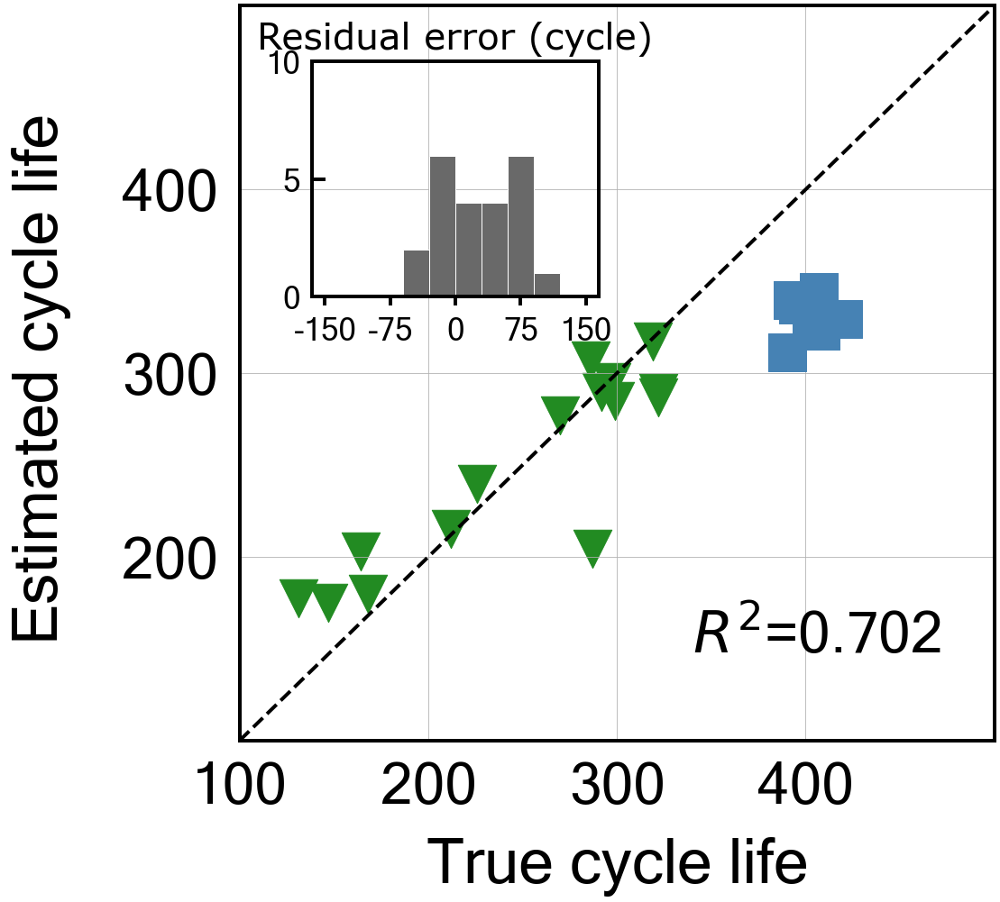

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to101')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.5
Best score obtained was: -63.600960221383204
Cycle no: Average_2to101
Coefficient:
T_V('Charge', 'Variance', 'Average_2to101') : -0.021131653930791555
T_V('Charge', 'Mean', 'Average_2to101') : 0.09372127612402391
T_V('Charge', 'Skewness', 'Average_2to101') : 0.13302541061120843
dTdV('Charge', 'Maximum', 'Average_2to101') : 0.0008037914078673636
dTdV('Charge', 'Mean', 'Average_2to101') : -0.004614466923471802
dTdV('Charge', 'Kurtosis', 'Average_2to101') : -0.05835516071352638

Intercept: 0.6202443280977318
MAE_all: 39.6
MAPE_all: 13.1 %
RMSE_all: 49.5
RMSPE_all: 16.1 %
MAE_train: 22.7
MAPE_train: 10.6 %
RMSE_train: 31.2
RMSPE_train: 15.0 %
MAE_test: 71.1
MAPE_test: 17.6 %
RMSE_test: 72.2
RMSPE_test: 17.9 %
R2 normal-scale scores
All data r2-score: 0.701
Train data r2-score: 0.777
Test da

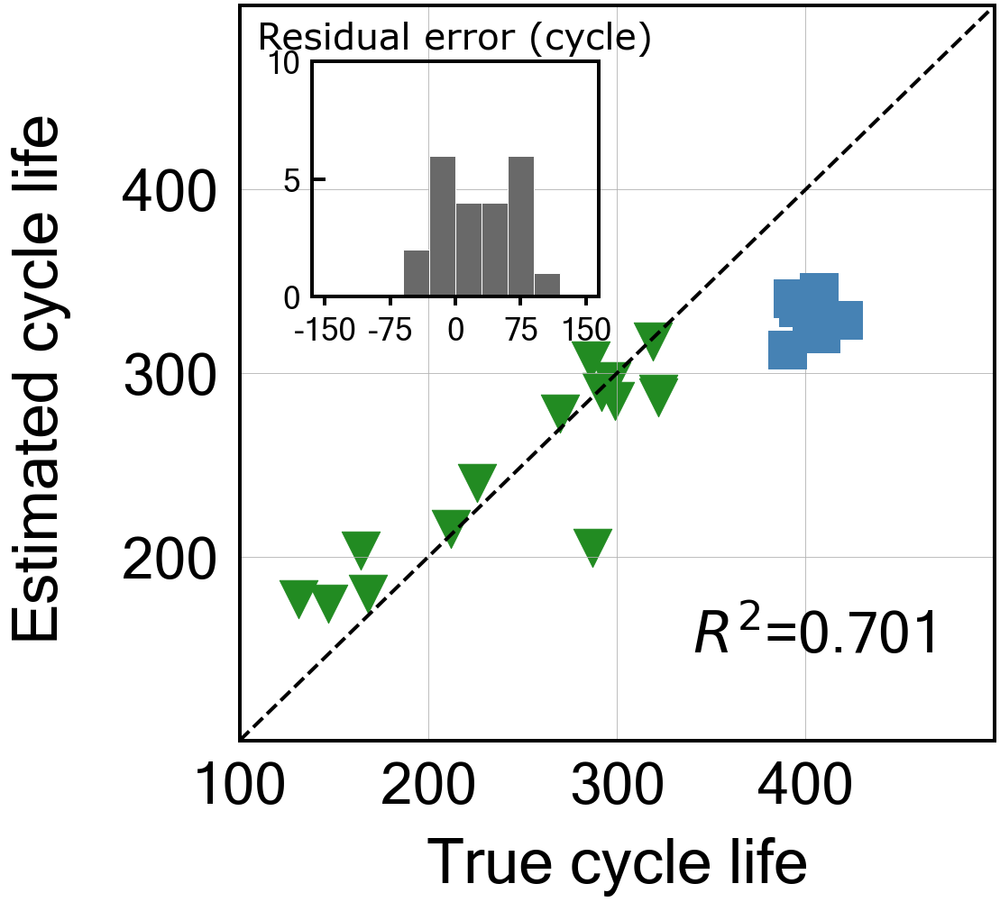

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to102')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.3
Best score obtained was: -62.99210956302899
Cycle no: Average_2to102
Coefficient:
T_V('Charge', 'Variance', 'Average_2to102') : -0.023270431352203608
T_V('Charge', 'Mean', 'Average_2to102') : 0.09480876304689938
T_V('Charge', 'Skewness', 'Average_2to102') : 0.12886088488490183
dTdV('Charge', 'Maximum', 'Average_2to102') : 0.008583764404410638
dTdV('Charge', 'Mean', 'Average_2to102') : -0.0088947154109194
dTdV('Charge', 'Kurtosis', 'Average_2to102') : -0.05876191616265375

Intercept: 0.6202443280977318
MAE_all: 39.6
MAPE_all: 13.1 %
RMSE_all: 49.3
RMSPE_all: 16.1 %
MAE_train: 22.9
MAPE_train: 10.7 %
RMSE_train: 31.2
RMSPE_train: 15.1 %
MAE_test: 70.8
MAPE_test: 17.6 %
RMSE_test: 71.9
RMSPE_test: 17.8 %
R2 normal-scale scores
All data r2-score: 0.703
Train data r2-score: 0.777
Test data r

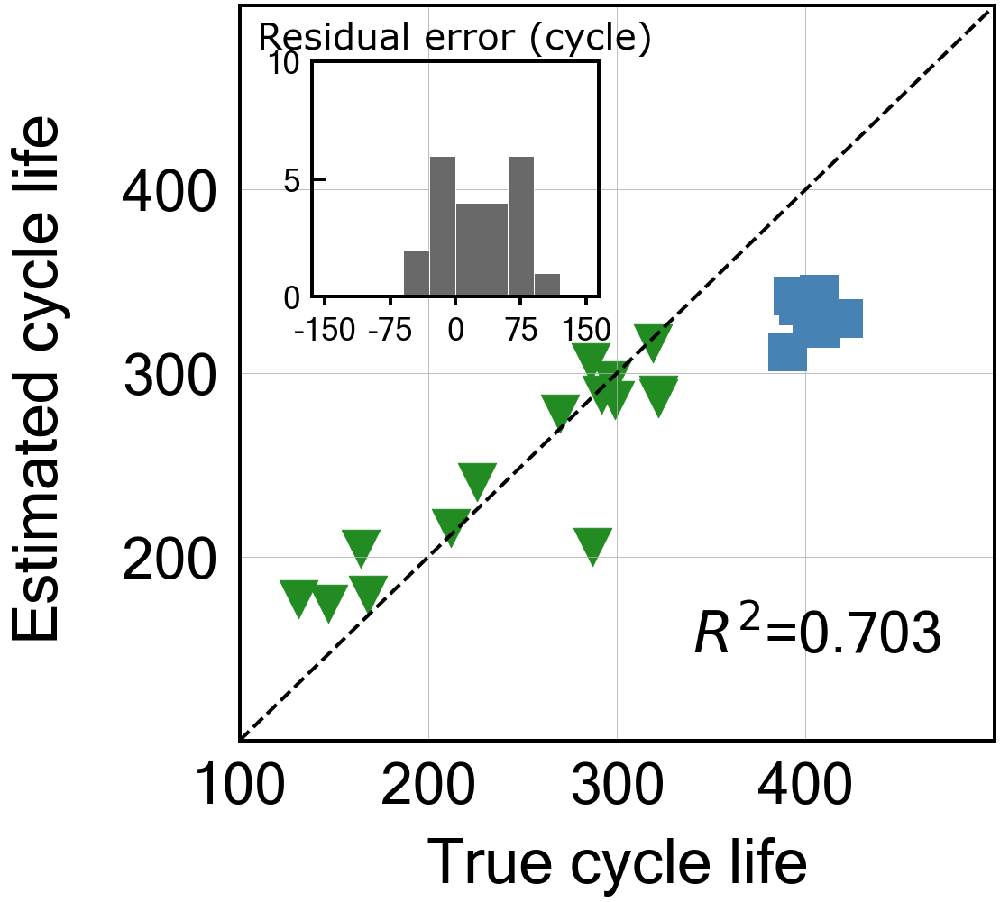

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to103')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.1
Best score obtained was: -62.42008354972256
Cycle no: Average_2to103
Coefficient:
T_V('Charge', 'Variance', 'Average_2to103') : -0.02336593992820086
T_V('Charge', 'Mean', 'Average_2to103') : 0.09379147962123967
T_V('Charge', 'Skewness', 'Average_2to103') : 0.12857730146912782
dTdV('Charge', 'Maximum', 'Average_2to103') : 0.00790932422108271
dTdV('Charge', 'Mean', 'Average_2to103') : -0.009049610041156337
dTdV('Charge', 'Kurtosis', 'Average_2to103') : -0.06098697246555673

Intercept: 0.6202443280977316
MAE_all: 39.5
MAPE_all: 13.0 %
RMSE_all: 49.1
RMSPE_all: 16.0 %
MAE_train: 22.9
MAPE_train: 10.7 %
RMSE_train: 31.0
RMSPE_train: 15.0 %
MAE_test: 70.5
MAPE_test: 17.5 %
RMSE_test: 71.6
RMSPE_test: 17.7 %
R2 normal-scale scores
All data r2-score: 0.705
Train data r2-score: 0.779
Test data r

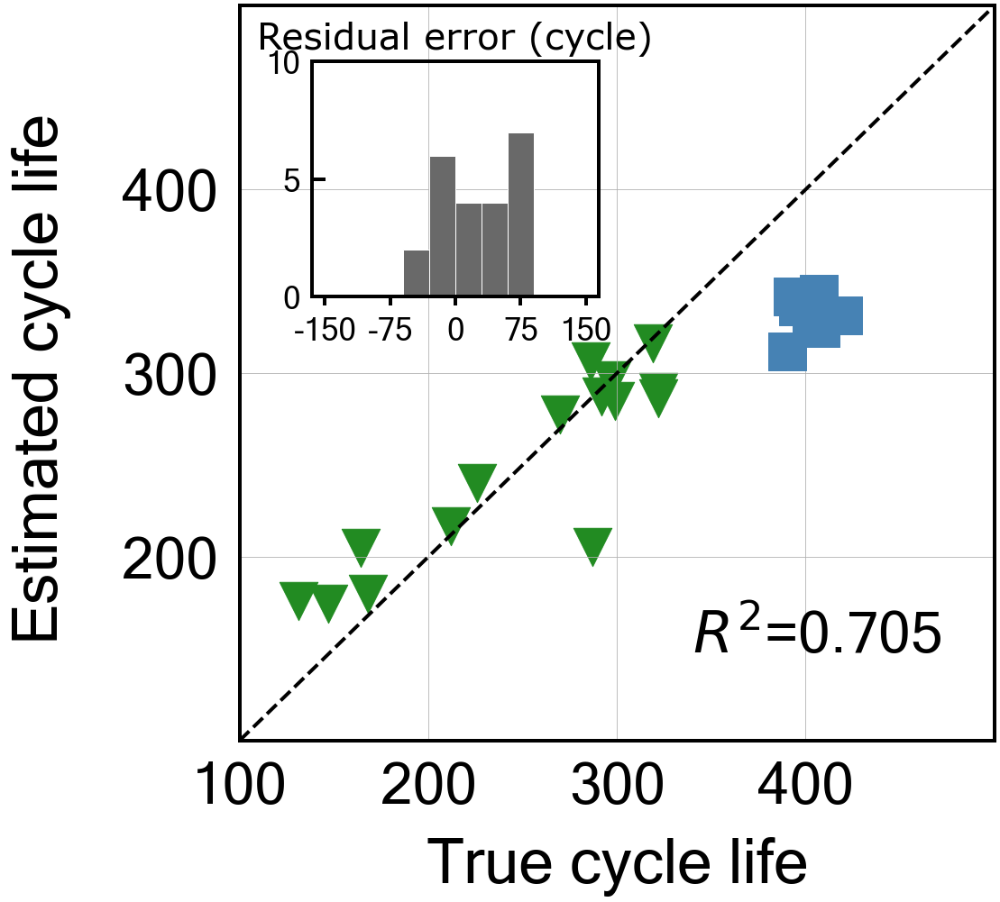

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to104')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.7
Best score obtained was: -64.0187707893846
Cycle no: Average_2to104
Coefficient:
T_V('Charge', 'Variance', 'Average_2to104') : -0.023582329673327625
T_V('Charge', 'Mean', 'Average_2to104') : 0.09279286340562072
T_V('Charge', 'Skewness', 'Average_2to104') : 0.12784762949519432
dTdV('Charge', 'Maximum', 'Average_2to104') : 0.008803245850875295
dTdV('Charge', 'Mean', 'Average_2to104') : -0.009370783664560128
dTdV('Charge', 'Kurtosis', 'Average_2to104') : -0.06268856458007868

Intercept: 0.6202443280977307
MAE_all: 39.7
MAPE_all: 13.1 %
RMSE_all: 49.5
RMSPE_all: 16.0 %
MAE_train: 22.8
MAPE_train: 10.6 %
RMSE_train: 30.9
RMSPE_train: 14.9 %
MAE_test: 71.5
MAPE_test: 17.7 %
RMSE_test: 72.5
RMSPE_test: 17.9 %
R2 normal-scale scores
All data r2-score: 0.701
Train data r2-score: 0.781
Test data 

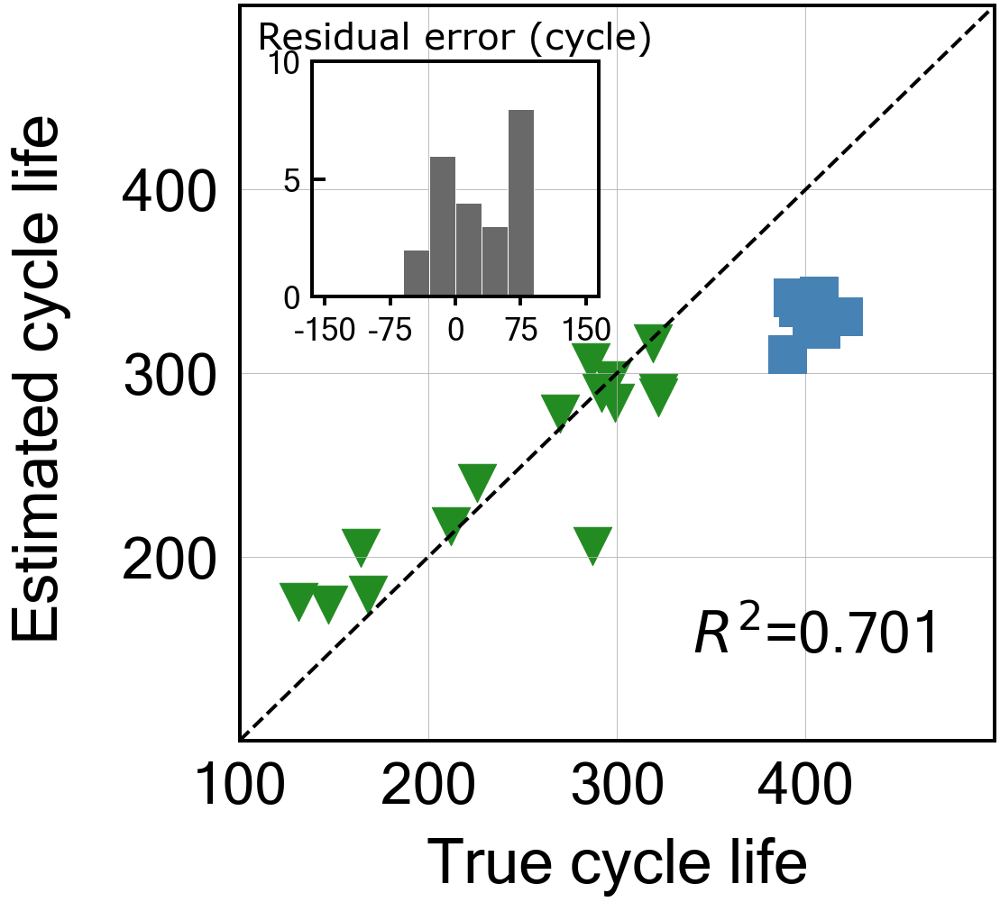

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to105')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -65.13981404709307
Cycle no: Average_2to105
Coefficient:
T_V('Charge', 'Variance', 'Average_2to105') : -0.02365122483437448
T_V('Charge', 'Mean', 'Average_2to105') : 0.09297313907690365
T_V('Charge', 'Skewness', 'Average_2to105') : 0.12810572784620525
dTdV('Charge', 'Maximum', 'Average_2to105') : 0.010043487653691119
dTdV('Charge', 'Mean', 'Average_2to105') : -0.00957976314440855
dTdV('Charge', 'Kurtosis', 'Average_2to105') : -0.06178367808268814

Intercept: 0.6202443280977302
MAE_all: 39.9
MAPE_all: 13.1 %
RMSE_all: 49.8
RMSPE_all: 16.0 %
MAE_train: 22.8
MAPE_train: 10.6 %
RMSE_train: 30.9
RMSPE_train: 14.8 %
MAE_test: 72.1
MAPE_test: 17.9 %
RMSE_test: 73.1
RMSPE_test: 18.1 %
R2 normal-scale scores
All data r2-score: 0.697
Train data r2-score: 0.782
Test data r

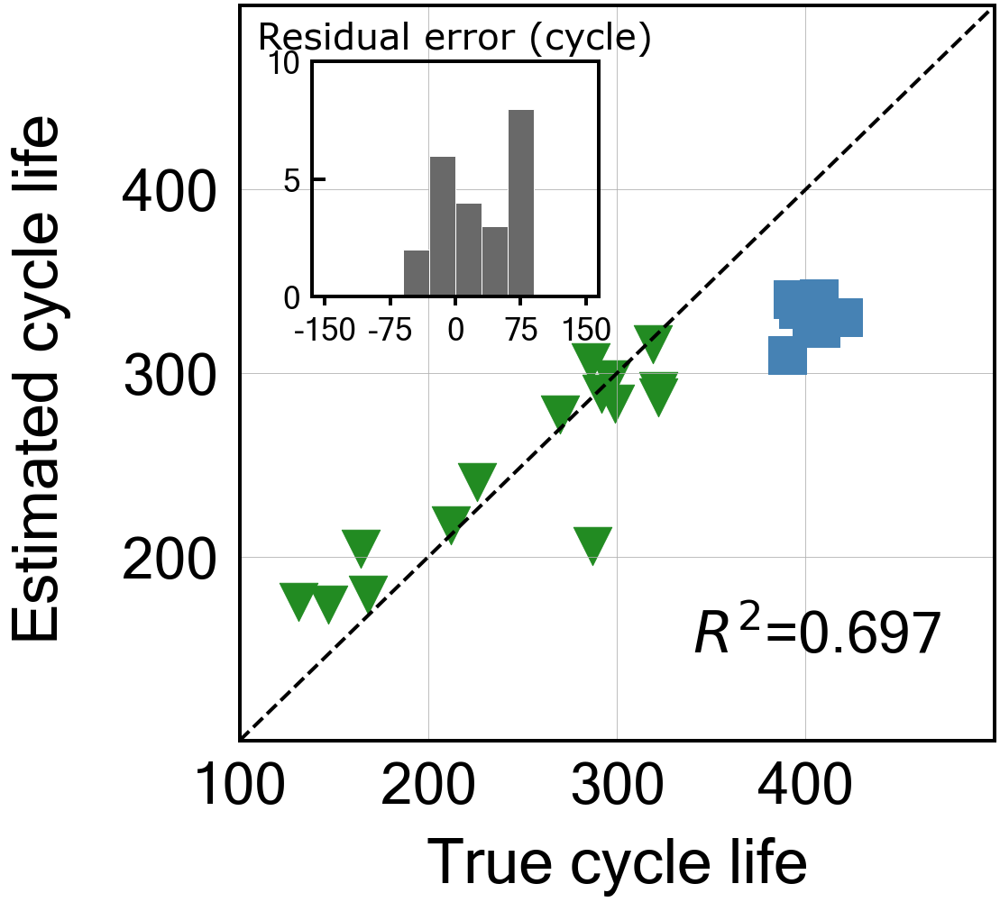

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to106')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -65.75963525468369
Cycle no: Average_2to106
Coefficient:
T_V('Charge', 'Variance', 'Average_2to106') : -0.02342756583222479
T_V('Charge', 'Mean', 'Average_2to106') : 0.09219022201228257
T_V('Charge', 'Skewness', 'Average_2to106') : 0.12812667116908652
dTdV('Charge', 'Maximum', 'Average_2to106') : 0.009710837127849885
dTdV('Charge', 'Mean', 'Average_2to106') : -0.009602360071246138
dTdV('Charge', 'Kurtosis', 'Average_2to106') : -0.06299237864674737

Intercept: 0.6202443280977312
MAE_all: 40.0
MAPE_all: 13.1 %
RMSE_all: 49.9
RMSPE_all: 16.0 %
MAE_train: 22.7
MAPE_train: 10.6 %
RMSE_train: 30.7
RMSPE_train: 14.8 %
MAE_test: 72.5
MAPE_test: 18.0 %
RMSE_test: 73.4
RMSPE_test: 18.2 %
R2 normal-scale scores
All data r2-score: 0.695
Train data r2-score: 0.784
Test data 

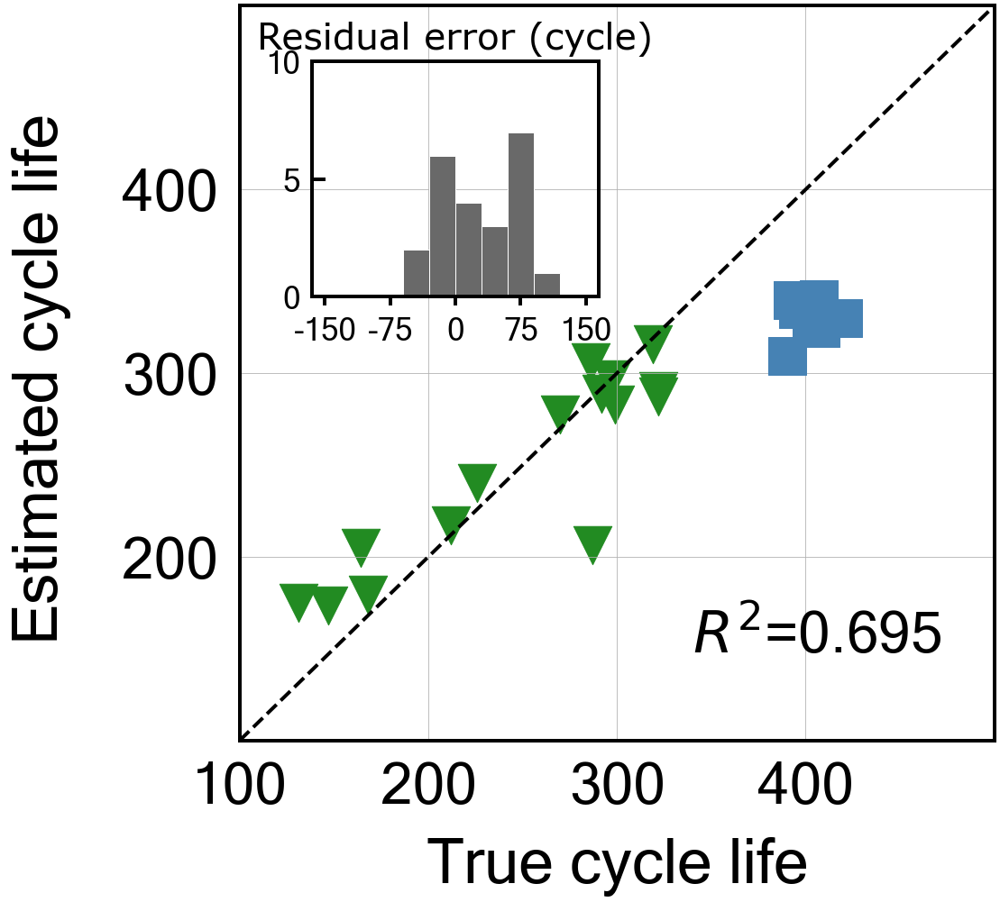

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to107')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.9
Best score obtained was: -64.59205849996128
Cycle no: Average_2to107
Coefficient:
T_V('Charge', 'Variance', 'Average_2to107') : -0.023365833944643324
T_V('Charge', 'Mean', 'Average_2to107') : 0.09272263128544073
T_V('Charge', 'Skewness', 'Average_2to107') : 0.12929074253260464
dTdV('Charge', 'Maximum', 'Average_2to107') : 0.009679589552500513
dTdV('Charge', 'Mean', 'Average_2to107') : -0.009714025963699167
dTdV('Charge', 'Kurtosis', 'Average_2to107') : -0.06136637876810224

Intercept: 0.6202443280977311
MAE_all: 39.8
MAPE_all: 13.1 %
RMSE_all: 49.6
RMSPE_all: 15.9 %
MAE_train: 22.7
MAPE_train: 10.6 %
RMSE_train: 30.7
RMSPE_train: 14.7 %
MAE_test: 71.9
MAPE_test: 17.8 %
RMSE_test: 72.8
RMSPE_test: 18.0 %
R2 normal-scale scores
All data r2-score: 0.700
Train data r2-score: 0.784
Test data

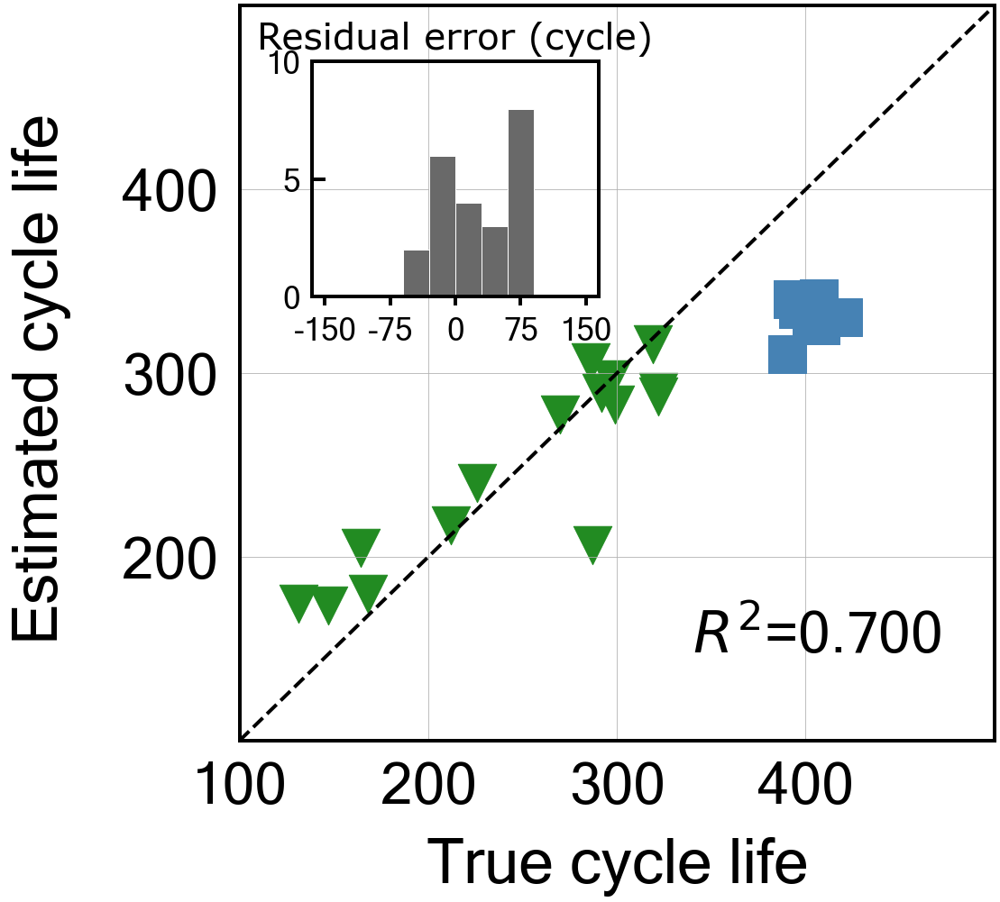

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to108')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 4.8
Best score obtained was: -66.88370984782463
Cycle no: Average_2to108
Coefficient:
T_V('Charge', 'Variance', 'Average_2to108') : -0.022972183884843015
T_V('Charge', 'Mean', 'Average_2to108') : 0.09298424303911983
T_V('Charge', 'Skewness', 'Average_2to108') : 0.12942086415460918
dTdV('Charge', 'Maximum', 'Average_2to108') : 0.009368596227173209
dTdV('Charge', 'Mean', 'Average_2to108') : -0.009511262131991112
dTdV('Charge', 'Kurtosis', 'Average_2to108') : -0.06138981014092679

Intercept: 0.6202443280977311
MAE_all: 40.1
MAPE_all: 13.2 %
RMSE_all: 50.2
RMSPE_all: 16.0 %
MAE_train: 22.6
MAPE_train: 10.5 %
RMSE_train: 30.6
RMSPE_train: 14.6 %
MAE_test: 73.1
MAPE_test: 18.1 %
RMSE_test: 74.0
RMSPE_test: 18.3 %
R2 normal-scale scores
All data r2-score: 0.692
Train data r2-score: 0.786
Test data

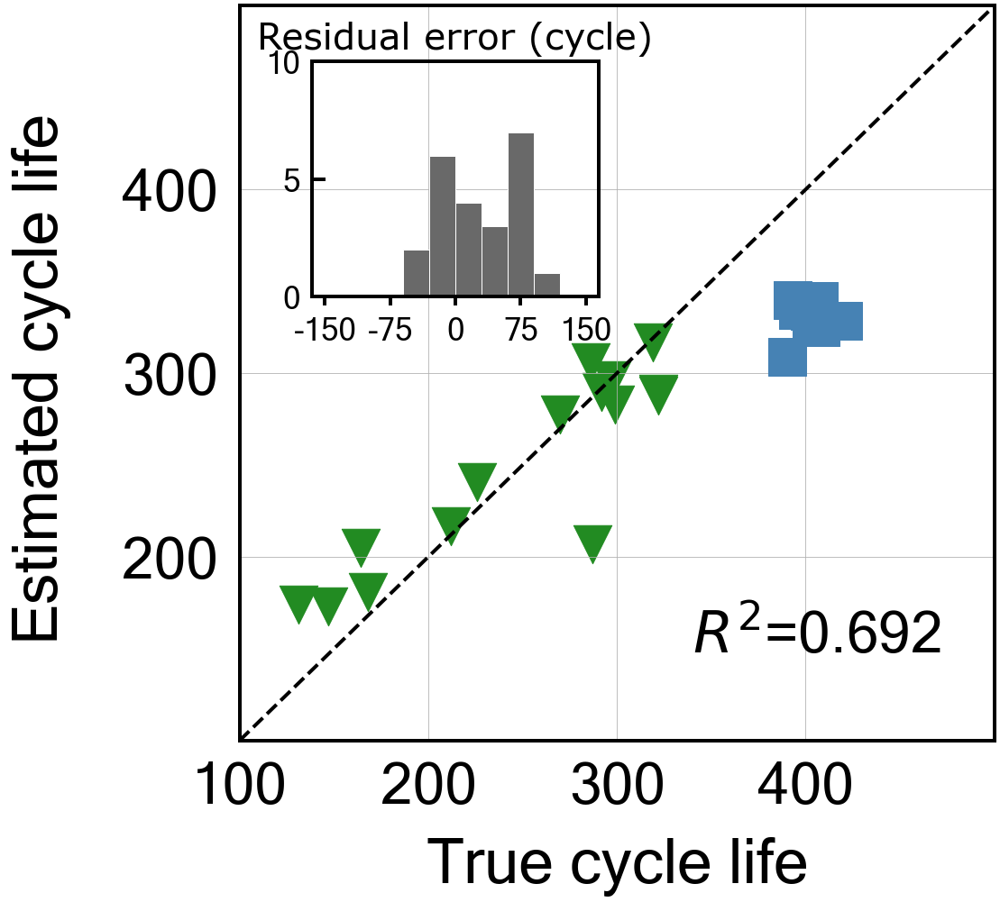

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to109')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.0
Best score obtained was: -69.89100870133562
Cycle no: Average_2to109
Coefficient:
T_V('Charge', 'Variance', 'Average_2to109') : -0.023105986474006555
T_V('Charge', 'Mean', 'Average_2to109') : 0.09123323716537074
T_V('Charge', 'Skewness', 'Average_2to109') : 0.12728280682931198
dTdV('Charge', 'Maximum', 'Average_2to109') : 0.009321334020392098
dTdV('Charge', 'Mean', 'Average_2to109') : -0.00954401768081446
dTdV('Charge', 'Kurtosis', 'Average_2to109') : -0.06723569800055058

Intercept: 0.6202443280977312
MAE_all: 40.4
MAPE_all: 13.2 %
RMSE_all: 50.8
RMSPE_all: 16.0 %
MAE_train: 22.1
MAPE_train: 10.3 %
RMSE_train: 30.1
RMSPE_train: 14.3 %
MAE_test: 74.7
MAPE_test: 18.5 %
RMSE_test: 75.7
RMSPE_test: 18.7 %
R2 normal-scale scores
All data r2-score: 0.684
Train data r2-score: 0.792
Test data 

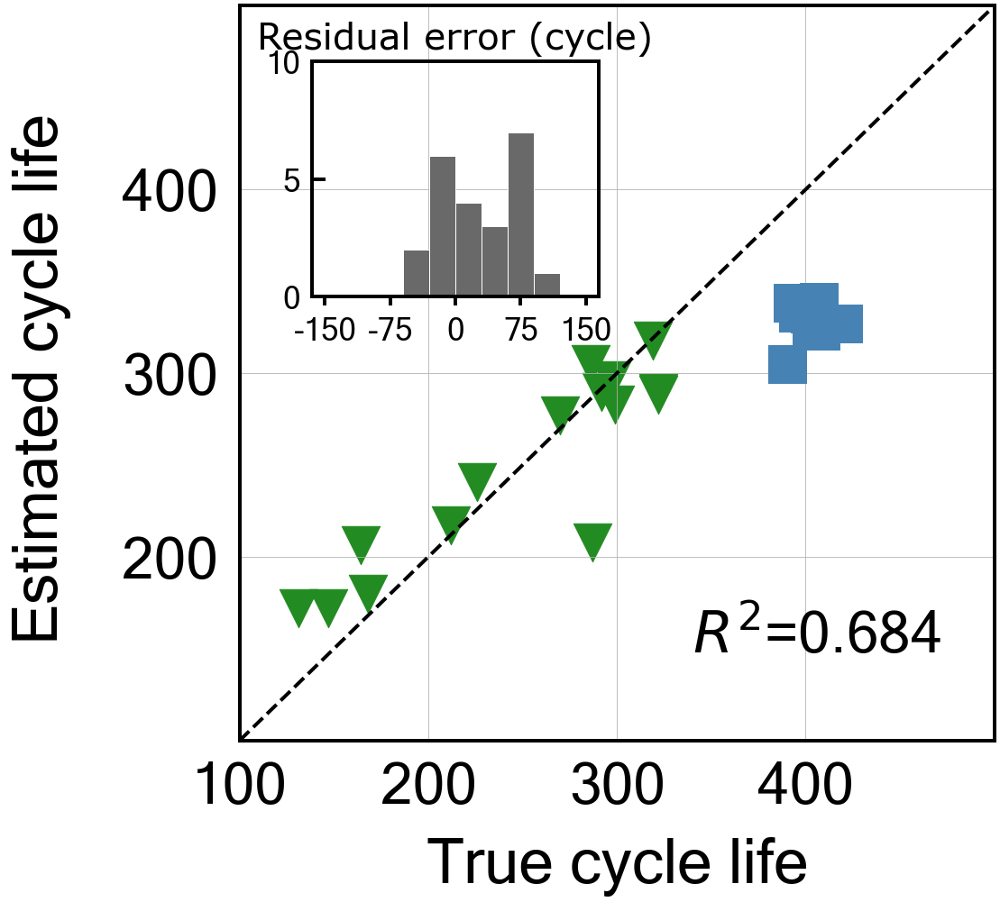

Found -inf in dT/dV ('Discharge', 'Maximum', 'Average_2to110')

Temperature model
rScore compared --> Test set

------------------------------------------------------------------------
Time elapsed: 5.0
Best score obtained was: -69.84089219225034
Cycle no: Average_2to110
Coefficient:
T_V('Charge', 'Variance', 'Average_2to110') : -0.022902635994407873
T_V('Charge', 'Mean', 'Average_2to110') : 0.09244729496432706
T_V('Charge', 'Skewness', 'Average_2to110') : 0.12776113123823526
dTdV('Charge', 'Maximum', 'Average_2to110') : 0.00709230016968913
dTdV('Charge', 'Mean', 'Average_2to110') : -0.009163480955204289
dTdV('Charge', 'Kurtosis', 'Average_2to110') : -0.06810157587931819

Intercept: 0.6202443280977322
MAE_all: 40.3
MAPE_all: 13.1 %
RMSE_all: 50.7
RMSPE_all: 15.9 %
MAE_train: 21.9
MAPE_train: 10.2 %
RMSE_train: 29.8
RMSPE_train: 14.1 %
MAE_test: 74.7
MAPE_test: 18.5 %
RMSE_test: 75.6
RMSPE_test: 18.7 %
R2 normal-scale scores
All data r2-score: 0.686
Train data r2-score: 0.797
Test data 

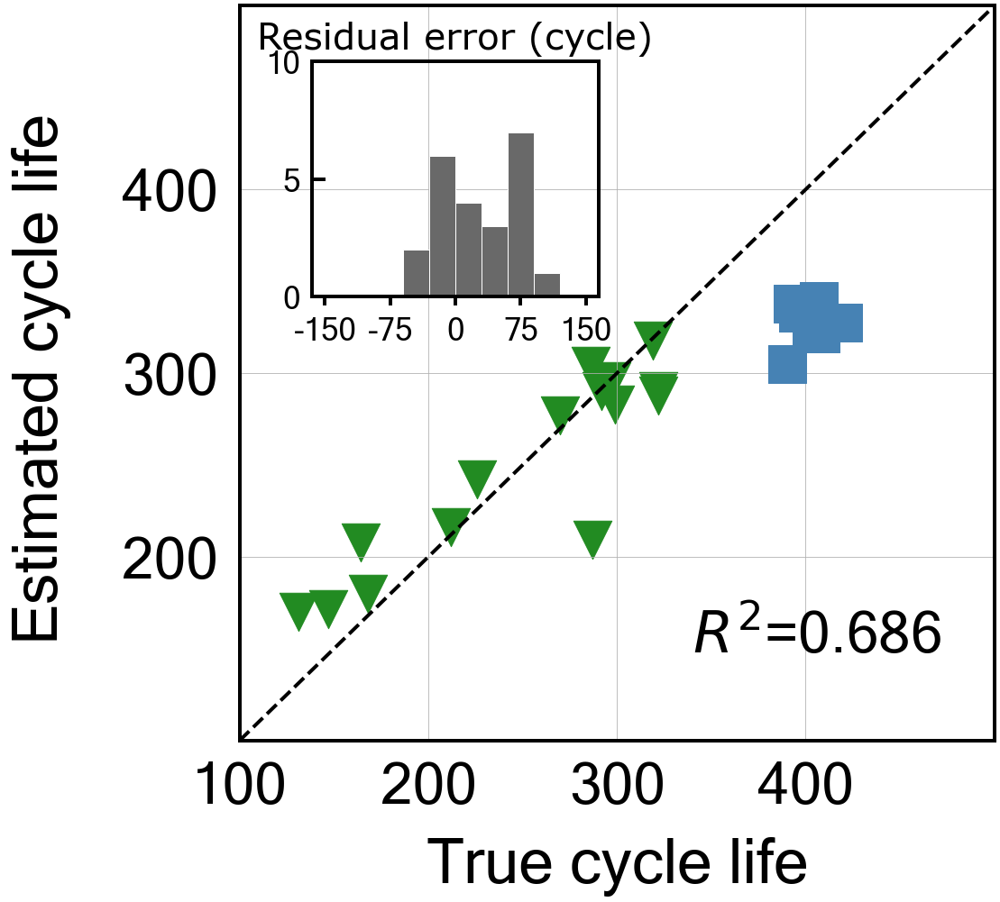

In [ ]:
# To store the output and save, if necessary
stringOutputList = []
# Define modes for feature extraction
modeList = ['Charge', 'Discharge']
# Here, we iterate until cycle xxx (e.g., 110) and average from cycle 2 to xxx
for avgCycleNo in [str(x) for x in range(3,111,1)]:
    setCycleNo = 'Average_2to' + str(int(avgCycleNo))

    # Initialize an empty DataFrame to store feature metadata and scores for every iteration
    feat_df = pd.DataFrame(columns=['dictionary', 'featName', 'valueArray', 'rScore'])

    ## 1. T(V)
    featureDict = T_V.copy() # Copy the T(V) feature dictionary
    featureKeynameUniqueList = TVKeynameUnique.copy() # Copy unique keynames for T(V)
    keyCycle = setCycleNo # Use predefined cycle range
    sample_size = featureDict[('Charge', 'Maximum', keyCycle)].size  # Determine sample size from one feature

    featureKeynameList = []

    # Prepare target variable
    X = np.empty((sample_size,0))
    y = featureDict['cycleLife'].ravel()

    # Generate feature keys for both modes and selected statistics
    for keyMode in modeList:
        for keyStat in featureKeynameUniqueList[1][:-1]:
            featureKeynameList.append((keyMode, keyStat, keyCycle))
            
    # Build feature matrix X by stacking each feature column
    for feat in featureKeynameList: 
        # Check for -inf values and replace them with the average of the previous cycle
        if -np.inf in featureDict[feat]:
            print("Found -inf in T(V)", feat)
            for infIdx in np.where(featureDict[feat] == -np.inf)[0]: 
                featureDict[feat][infIdx] = featureDict[(feat[0], feat[1], 'Average_2to'+str(int(avgCycleNo)-1))][infIdx]    
        X = np.append(X, featureDict[feat].reshape(-1,1), axis=1)
        
    # Evaluate feature relevance using rScore
    rScore = evaluation_utils.rScore(X, y, featureKeynameList, toPrint=False)

    # Append results to the feature DataFrame
    for i in range(len(featureKeynameList)):
        newRow = {'dictionary': 'T_V', 'featName': featureKeynameList[i], 'valueArray': X[:, i], 'rScore': rScore[i]}
        feat_df = feat_df.append(newRow, ignore_index=True)
        
        
    ## 2. dT/dV
    featureDict = dTdV.copy() # Copy dT/dV feature dictionary
    X = np.empty((sample_size,0)) # Reset feature matrix
    # Reuse same feature keys from T(V) for consistency
    for feat in featureKeynameList: 
        # Check for -inf values and replace them with the average of the previous cycle
        if -np.inf in featureDict[feat]:
            print("Found -inf in dT/dV", feat)
            for infIdx in np.where(featureDict[feat] == -np.inf)[0]: 
                featureDict[feat][infIdx] = featureDict[(feat[0], feat[1], 'Average_2to'+str(int(avgCycleNo)-1))][infIdx]     
        X = np.append(X, featureDict[feat].reshape(-1,1), axis=1)
    # Evaluate rScores for dT/dV features
    rScore = evaluation_utils.rScore(X, y, featureKeynameList, toPrint=False)

    # Append results to the feature DataFrame
    for i in range(len(featureKeynameList)):
        newRow = {'dictionary': 'dTdV', 'featName': featureKeynameList[i], 'valueArray': X[:, i], 'rScore': rScore[i]}
        feat_df = feat_df.append(newRow, ignore_index=True)
        
    # Use the same feature subset, combo. Obtained by optimal search from exhaustive search
    combo = [3, 4, 5, 14, 18, 20]
    i = len(combo)
    # # Initiate savepath variable
    savepath = os.path.join('.', 'folder', 'fileName_avg3to100_'+str(i)+'feat')
    # Set model name and feature column indices
    modelName = "Temperature model"
    columnIdx = combo
        
    # Stack all feature arrays into a 2D array and transpose to shape (samples, features)
    X_array = np.vstack(feat_df.loc[:, 'valueArray']).transpose()

    print("\nTemperature model\nrScore compared --> Test set")

    startTime = time.time()

    featureKeynameListBest = []
    saveFilePath = os.path.join(savepath, 'average'+str(int(avgCycleNo)-1)+'_feat'+str(i)+'.png')

    # Extract selected features from full feature array
    featureKeynameList = []
    X_all = X_array[:, combo]

    # Build list of feature names for reporting
    for j in combo:
        featureKeynameList.append(feat_df.loc[j, 'dictionary'] + str(feat_df.loc[j, 'featName']))

    # Split data into training and testing sets
    X_train  = X_all[train_index]
    X_test = X_all[test_index]

    # Standardize features using training set statistics
    scaler = StandardScaler().fit(X_train)
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    X_all_scaled = np.concatenate((X_train_scaled, X_test_scaled))

    # Initialize and train ElasticNet model with cross-validation
    regEN = ElasticNetCV(l1_ratio=np.linspace(0.01,1,100), cv=4, random_state=20, max_iter=100000, n_jobs=3, tol=1e-2, verbose=0, selection='random')
    model = regEN
    model.fit(X_train_scaled, y_train_scaled)

    # Evaluate model performance on test set
    r2ScoreBest = model.score(X_test_scaled, y_test_scaled)
    
    # Store best model and associated data
    featureKeynameListBest = featureKeynameList
    modelBest = model
    X_all_scaled_best = X_all_scaled
                
    # Print summary of training time and best score
    stringOutputManual = ("\n------------------------------------------------------------------------\n" + 
                    "Time elapsed: {:.1f}".format(time.time() - startTime) + 
                    "\nBest score obtained was: " + str(r2ScoreBest))
    print(stringOutputManual)
    
    # Print detailed model evaluation and generate comparison plots
    stringOutput = train_utils.print_result(setCycleNo, modelBest, X_all_scaled_best, y_all_scaled, featureKeynameListBest, idlst=lengthList, yScaler=yScaler)
    stringOutput += plot_utils.build_all_comparison_graph(X_all_scaled_best, y_all_scaled, modelBest, len_list = [len(train_index), len(test_index)], yScaler=yScaler, 
                                                            name=modelName, markerArr = markerArr, markerSize=1800, save = saveFilePath)
    stringOutputList.append(stringOutputManual + stringOutput)

# # Uncomment below to save the output to a text file
# with open(os.path.join(savepath, "output.txt"), "w") as f:
#     f.write('\n'.join(stringOutputList))
#     f.close()